## import models

In [ ]:
# install pydrive to load data
!pip install -U -q PyDrive

from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.dates import DateFormatter
import datetime
%matplotlib inline

In [ ]:
from pylab import rcParams

import statsmodels.api as sm
from numpy.random import normal, seed
from scipy.stats import norm
from statsmodels.tsa.arima_model import ARMA
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima_process import ArmaProcess
from statsmodels.tsa.arima_model import ARIMA
import math
from sklearn.metrics import mean_squared_error

from plotly import tools

from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.figure_factory as ff

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

## CA_MODIS_2015_2020 time series

In [ ]:
#https://drive.google.com/file/d/1rxsHwPICd3jf_XUA-ePImgmqOOY3xmFO/view?usp=sharing

id = "1rxsHwPICd3jf_XUA-ePImgmqOOY3xmFO"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_2015_2020_156_points_MODIS.csv')


In [ ]:
CA_MODIS = pd.read_csv('CA_2015_2020_156_points_MODIS.csv', parse_dates=['date'], index_col='date')

In [ ]:
CA_MODIS.head()

,system:index,temp1,temp2,temp3,temp4,temp5,temp6,temp7,temp8,temp9,...,temp147,temp148,temp149,temp150,temp151,temp152,temp153,temp154,temp155,temp156
date,,,,,,,,,,,,,,,,,,,,,
2015-01-01,0,5.89,-6.77,-6.77,-4.23,-6.77,-6.77,-6.77,-6.77,-6.77,...,10.35,10.35,10.35,9.59,10.35,10.35,10.35,10.35,10.35,10.35
2015-01-02,1,4.87,1.81,1.81,-0.09,1.81,1.81,1.81,1.81,1.81,...,10.41,10.41,10.41,11.25,10.41,10.41,10.41,10.41,10.41,10.41
2015-01-03,2,5.83,2.85,2.85,4.35,2.85,2.85,2.85,2.85,2.85,...,10.07,10.07,10.07,10.07,10.07,10.07,10.07,10.07,10.07,10.07
2015-01-04,3,no data,no data,no data,no data,no data,no data,no data,no data,no data,...,no data,no data,no data,no data,no data,no data,no data,no data,no data,no data
2015-01-05,4,5.57,5.11,5.11,no data,5.11,5.11,5.11,5.11,5.11,...,no data,no data,no data,13.01,no data,no data,no data,no data,no data,no data


In [ ]:
missing_values=['no data']
CA_MODIS=CA_MODIS.replace(missing_values,np.NaN)
CA_MODIS = CA_MODIS.drop(columns=['system:index'])
CA_MODIS


,temp1,temp2,temp3,temp4,temp5,temp6,temp7,temp8,temp9,temp10,...,temp147,temp148,temp149,temp150,temp151,temp152,temp153,temp154,temp155,temp156
date,,,,,,,,,,,,,,,,,,,,,
2015-01-01,5.89,-6.77,-6.77,-4.23,-6.77,-6.77,-6.77,-6.77,-6.77,-6.77,...,10.35,10.35,10.35,9.59,10.35,10.35,10.35,10.35,10.35,10.35
2015-01-02,4.87,1.81,1.81,-0.09,1.81,1.81,1.81,1.81,1.81,1.81,...,10.41,10.41,10.41,11.25,10.41,10.41,10.41,10.41,10.41,10.41
2015-01-03,5.83,2.85,2.85,4.35,2.85,2.85,2.85,2.85,2.85,2.85,...,10.07,10.07,10.07,10.07,10.07,10.07,10.07,10.07,10.07,10.07
2015-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-05,5.57,5.11,5.11,NaN,5.11,5.11,5.11,5.11,5.11,5.11,...,NaN,NaN,NaN,13.01,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-26,3.37,-3.81,-3.81,NaN,-3.81,-3.81,-3.81,-3.81,-3.81,-3.81,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-12-27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-12-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,14.43,14.43,14.43,12.99,14.43,14.43,14.43,14.43,14.43,14.43


In [ ]:
CA_MODIS.isnull().sum()

temp1      815
temp2      797
temp3      797
temp4      772
temp5      797
          ... 
temp152    771
temp153    771
temp154    771
temp155    771
temp156    771
Length: 156, dtype: int64

In [ ]:
#CA_MODIS.dropna()
# fill the missing with last valid observation forward 
CA_MODIS = CA_MODIS.ffill()
CA_MODIS

,temp1,temp2,temp3,temp4,temp5,temp6,temp7,temp8,temp9,temp10,...,temp147,temp148,temp149,temp150,temp151,temp152,temp153,temp154,temp155,temp156
date,,,,,,,,,,,,,,,,,,,,,
2015-01-01,5.89,-6.77,-6.77,-4.23,-6.77,-6.77,-6.77,-6.77,-6.77,-6.77,...,10.35,10.35,10.35,9.59,10.35,10.35,10.35,10.35,10.35,10.35
2015-01-02,4.87,1.81,1.81,-0.09,1.81,1.81,1.81,1.81,1.81,1.81,...,10.41,10.41,10.41,11.25,10.41,10.41,10.41,10.41,10.41,10.41
2015-01-03,5.83,2.85,2.85,4.35,2.85,2.85,2.85,2.85,2.85,2.85,...,10.07,10.07,10.07,10.07,10.07,10.07,10.07,10.07,10.07,10.07
2015-01-04,5.83,2.85,2.85,4.35,2.85,2.85,2.85,2.85,2.85,2.85,...,10.07,10.07,10.07,10.07,10.07,10.07,10.07,10.07,10.07,10.07
2015-01-05,5.57,5.11,5.11,4.35,5.11,5.11,5.11,5.11,5.11,5.11,...,10.07,10.07,10.07,13.01,10.07,10.07,10.07,10.07,10.07,10.07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-26,3.37,-3.81,-3.81,0.15,-3.81,-3.81,-3.81,-3.81,-3.81,-3.81,...,13.13,13.13,13.13,12.95,13.13,13.13,13.13,13.13,13.13,13.13
2020-12-27,3.37,-3.81,-3.81,0.15,-3.81,-3.81,-3.81,-3.81,-3.81,-3.81,...,13.13,13.13,13.13,12.95,13.13,13.13,13.13,13.13,13.13,13.13
2020-12-28,3.37,-3.81,-3.81,0.15,-3.81,-3.81,-3.81,-3.81,-3.81,-3.81,...,14.43,14.43,14.43,12.99,14.43,14.43,14.43,14.43,14.43,14.43


In [ ]:
CA_MODIS.isnull().sum()

temp1      0
temp2      0
temp3      0
temp4      0
temp5      0
          ..
temp152    0
temp153    0
temp154    0
temp155    0
temp156    0
Length: 156, dtype: int64

In [ ]:
#transfer data to float
CA_MODIS = CA_MODIS.astype(float)

In [ ]:
#average temp
CA_MODIS['average'] = CA_MODIS.mean(axis=1)

In [ ]:
CA_MODIS

,temp1,temp2,temp3,temp4,temp5,temp6,temp7,temp8,temp9,temp10,...,temp148,temp149,temp150,temp151,temp152,temp153,temp154,temp155,temp156,average
date,,,,,,,,,,,,,,,,,,,,,
2015-01-01,5.89,-6.77,-6.77,-4.23,-6.77,-6.77,-6.77,-6.77,-6.77,-6.77,...,10.35,10.35,9.59,10.35,10.35,10.35,10.35,10.35,10.35,1.514103
2015-01-02,4.87,1.81,1.81,-0.09,1.81,1.81,1.81,1.81,1.81,1.81,...,10.41,10.41,11.25,10.41,10.41,10.41,10.41,10.41,10.41,4.704615
2015-01-03,5.83,2.85,2.85,4.35,2.85,2.85,2.85,2.85,2.85,2.85,...,10.07,10.07,10.07,10.07,10.07,10.07,10.07,10.07,10.07,5.849231
2015-01-04,5.83,2.85,2.85,4.35,2.85,2.85,2.85,2.85,2.85,2.85,...,10.07,10.07,10.07,10.07,10.07,10.07,10.07,10.07,10.07,4.989872
2015-01-05,5.57,5.11,5.11,4.35,5.11,5.11,5.11,5.11,5.11,5.11,...,10.07,10.07,13.01,10.07,10.07,10.07,10.07,10.07,10.07,8.197821
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-26,3.37,-3.81,-3.81,0.15,-3.81,-3.81,-3.81,-3.81,-3.81,-3.81,...,13.13,13.13,12.95,13.13,13.13,13.13,13.13,13.13,13.13,4.615256
2020-12-27,3.37,-3.81,-3.81,0.15,-3.81,-3.81,-3.81,-3.81,-3.81,-3.81,...,13.13,13.13,12.95,13.13,13.13,13.13,13.13,13.13,13.13,4.615256
2020-12-28,3.37,-3.81,-3.81,0.15,-3.81,-3.81,-3.81,-3.81,-3.81,-3.81,...,14.43,14.43,12.99,14.43,14.43,14.43,14.43,14.43,14.43,4.100769


In [ ]:
CA_Monthly_data_month = CA_MODIS['average'].resample('M').mean()
CA_Monthly_data_month

date
2015-01-31     8.055480
2015-02-28    12.027473
2015-03-31    17.357411
2015-04-30    21.968987
2015-05-31    23.352936
                ...    
2020-08-31    35.112448
2020-09-30    30.748671
2020-10-31    26.165840
2020-11-30    15.590778
2020-12-31     7.761662
Freq: M, Name: average, Length: 72, dtype: float64

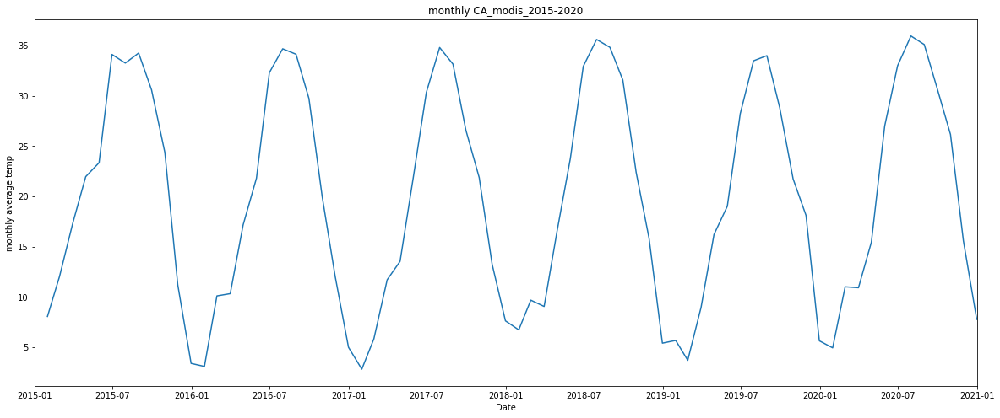

In [ ]:

fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp",
    title="monthly CA_modis_2015-2020")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(CA_Monthly_data_month)
plt.show()


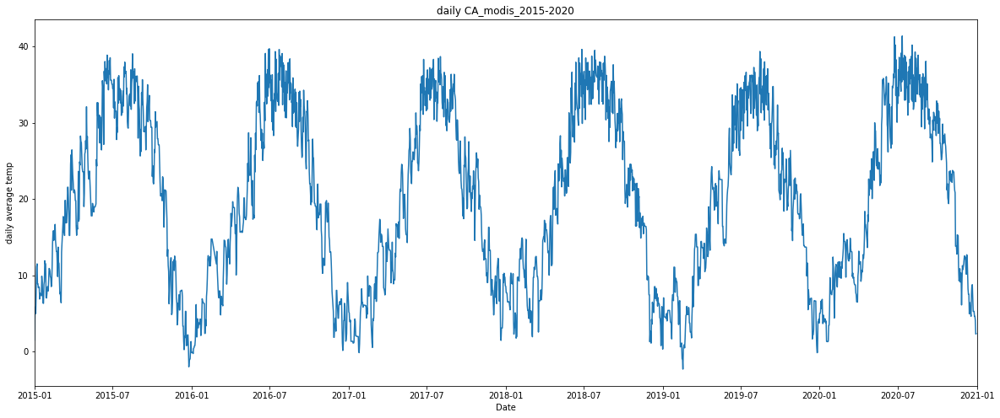

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="daily average temp",
    title="daily CA_modis_2015-2020")
ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(CA_MODIS['average'])
plt.show()


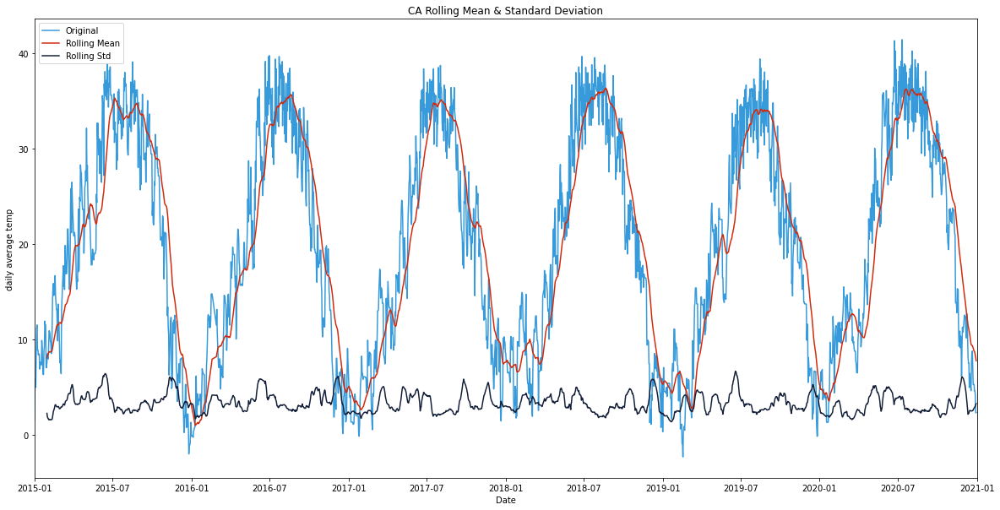

In [ ]:
fig, ax = plt.subplots(figsize=(20,10))

CA_MODIS["rolling_avg"] = CA_MODIS["average"].rolling(window=30).mean() #window size 30 denotes 1 months, giving rolling mean at monthly level
CA_MODIS["rolling_std"] = CA_MODIS["average"].rolling(window=30).std()

# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="daily average temp")
ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(CA_MODIS["average"], color='#379BDB', label='Original')
ax.plot(CA_MODIS["rolling_avg"], color='#D22A0D', label='Rolling Mean')
ax.plot(CA_MODIS["rolling_std"], color='#142039', label='Rolling Std')
ax.legend(loc='best')
plt.title('CA Rolling Mean & Standard Deviation')
plt.show(block=False)
plt.show()

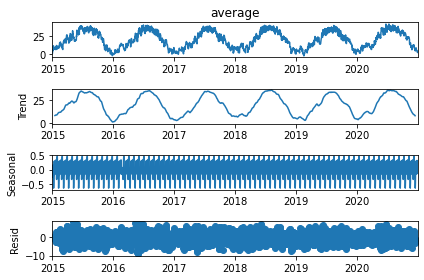

In [ ]:
CA_Daily_deco = sm.tsa.seasonal_decompose(CA_MODIS["average"], model='additive',period = 30)
fig = CA_Daily_deco.plot()
plt.rcParams["figure.figsize"] = (200,50)

plt.show()

In [ ]:
CA_Monthly_deco = sm.tsa.seasonal_decompose(CA_Monthly_data_month, model='additive')
fig = CA_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

Text(0, 0.5, 'Residual')

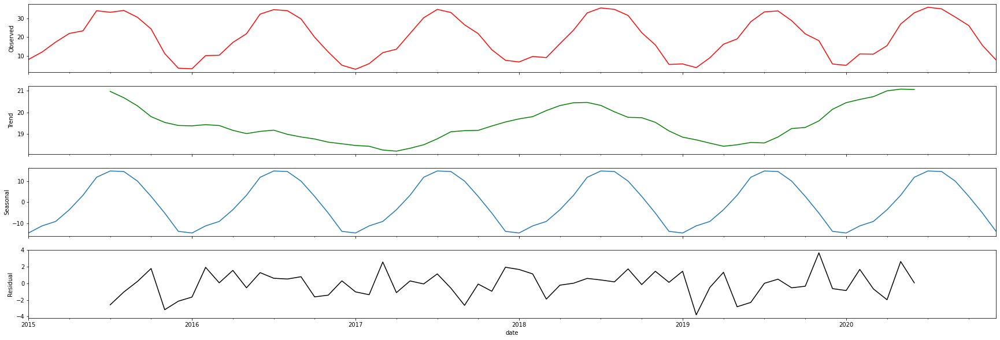

In [ ]:
fig, axes = plt.subplots(4, 1, sharex=True)
CA_Monthly_deco.observed.plot(ax=axes[0], legend=False, color='r')
axes[0].set_ylabel('Observed')
CA_Monthly_deco.trend.plot(ax=axes[1], legend=False, color='g')
axes[1].set_ylabel('Trend')
CA_Monthly_deco.seasonal.plot(ax=axes[2], legend=False)
axes[2].set_ylabel('Seasonal')
CA_Monthly_deco.resid.plot(ax=axes[3], legend=False, color='k')
axes[3].set_ylabel('Residual')

###seasonal data






In [ ]:
month = CA_Monthly_data_month.index.month
CA_winter = pd.concat([CA_Monthly_data_month[month == 1], CA_Monthly_data_month[month == 2],CA_Monthly_data_month[month == 12]])
CA_spring = pd.concat([CA_Monthly_data_month[month == 3], CA_Monthly_data_month[month == 4],CA_Monthly_data_month[month == 5]])
CA_summer = pd.concat([CA_Monthly_data_month[month == 6], CA_Monthly_data_month[month == 7],CA_Monthly_data_month[month == 8]])
CA_fall = pd.concat([CA_Monthly_data_month[month == 9], CA_Monthly_data_month[month == 10],CA_Monthly_data_month[month == 11]])
CA_winter.sort_index()
CA_spring.sort_index()
CA_summer.sort_index()
CA_fall.sort_index()

date
2015-09-30    30.603603
2015-10-31    24.368573
2015-11-30    11.204030
2016-09-30    29.746906
2016-10-31    19.938147
2016-11-30    12.051615
2017-09-30    26.592111
2017-10-31    21.874574
2017-11-30    13.260175
2018-09-30    31.584449
2018-10-31    22.391605
2018-11-30    15.830423
2019-09-30    28.799342
2019-10-31    21.743499
2019-11-30    18.111829
2020-09-30    30.748671
2020-10-31    26.165840
2020-11-30    15.590778
Name: average, dtype: float64

## CA_NEX_2015_2020

###CA_NEX_INM-CM5-0

####SSP585

In [ ]:
#https://drive.google.com/file/d/1OKeO8tD8dagjQm8YAH1PPgOuv1BJODz6/view?usp=share_link
id = "1OKeO8tD8dagjQm8YAH1PPgOuv1BJODz6"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp585_INM_CM5_0.csv')

CA_ssp585_INM_CM5_0 = pd.read_csv('CA_ssp585_INM_CM5_0.csv', parse_dates=['time'], index_col='time')
CA_ssp585_INM_CM5_0.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,-0.297852
2015-01-01,39.125,-119.875,0.291321
2015-01-01,39.125,-119.625,1.578674
2015-01-01,39.125,-119.375,1.085815
2015-01-01,39.125,-119.125,3.492706


In [ ]:
CA_ssp585_INM_CM5_0

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,-0.297852
2015-01-01,39.125,-119.875,0.291321
2015-01-01,39.125,-119.625,1.578674
2015-01-01,39.125,-119.375,1.085815
2015-01-01,39.125,-119.125,3.492706
...,...,...,...
2020-12-29,36.375,-118.125,1.385559
2020-12-29,36.375,-117.875,7.090363
2020-12-29,36.375,-117.625,5.043762


In [ ]:
CA_ssp585_INM_CM5_0['tas'].isnull().sum()

0

In [ ]:
CA_ssp585_INM_CM5_0_avg_temp = CA_ssp585_INM_CM5_0.groupby(CA_ssp585_INM_CM5_0.index)['tas'].mean()
CA_ssp585_INM_CM5_0_avg_temp

time
2015-01-01    3.128104
2015-01-02    0.549164
2015-01-03    1.055261
2015-01-04    2.437329
2015-01-05    3.061450
                ...   
2020-12-25   -0.622711
2020-12-26   -3.638694
2020-12-27   -0.918163
2020-12-28    0.161114
2020-12-29    2.422247
Name: tas, Length: 2190, dtype: float64

In [ ]:
CA_ssp585_INM_CM5_0_monthly_avg_temp = CA_ssp585_INM_CM5_0_avg_temp.resample('M').mean()
CA_ssp585_INM_CM5_0_monthly_avg_temp

time
2015-01-31     2.933342
2015-02-28     8.132490
2015-03-31     5.478392
2015-04-30     7.565115
2015-05-31    10.297161
                ...    
2020-08-31    23.385486
2020-09-30    16.581008
2020-10-31    13.533541
2020-11-30     7.072637
2020-12-31    -0.794806
Freq: M, Name: tas, Length: 72, dtype: float64

####SSP126

In [ ]:
#https://drive.google.com/file/d/1AXCrraasW3m1DQKqStdnkL_2fbo3d37D/view?usp=share_link
id = "1AXCrraasW3m1DQKqStdnkL_2fbo3d37D"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp126_INM_CM5_0.csv')

CA_ssp126_INM_CM5_0 = pd.read_csv('CA_ssp126_INM_CM5_0.csv', parse_dates=['time'], index_col='time')
CA_ssp126_INM_CM5_0.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,-0.336609
2015-01-01,39.125,-119.875,0.257690
2015-01-01,39.125,-119.625,1.533905
2015-01-01,39.125,-119.375,1.029968
2015-01-01,39.125,-119.125,3.425720


In [ ]:
CA_ssp126_INM_CM5_0

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,-0.336609
2015-01-01,39.125,-119.875,0.257690
2015-01-01,39.125,-119.625,1.533905
2015-01-01,39.125,-119.375,1.029968
2015-01-01,39.125,-119.125,3.425720
...,...,...,...
2020-12-29,36.375,-118.125,1.869659
2020-12-29,36.375,-117.875,7.387024
2020-12-29,36.375,-117.625,5.138306


In [ ]:
CA_ssp126_INM_CM5_0['tas'].isnull().sum()

0

In [ ]:
CA_ssp126_INM_CM5_0_avg_temp = CA_ssp126_INM_CM5_0.groupby(CA_ssp126_INM_CM5_0.index)['tas'].mean()
CA_ssp126_INM_CM5_0_avg_temp

time
2015-01-01    2.921513
2015-01-02    0.538634
2015-01-03    0.748348
2015-01-04    1.940294
2015-01-05    2.352704
                ...   
2020-12-25    2.052940
2020-12-26    5.640960
2020-12-27    4.806284
2020-12-28    0.624731
2020-12-29    4.093822
Name: tas, Length: 2190, dtype: float64

In [ ]:
CA_ssp126_INM_CM5_0_monthly_avg_temp = CA_ssp126_INM_CM5_0_avg_temp.resample('M').mean()
CA_ssp126_INM_CM5_0_monthly_avg_temp

time
2015-01-31     4.617886
2015-02-28     5.515663
2015-03-31     6.590498
2015-04-30     8.798164
2015-05-31    15.597162
                ...    
2020-08-31    23.006790
2020-09-30    18.282867
2020-10-31    12.111391
2020-11-30     4.757030
2020-12-31     3.075911
Freq: M, Name: tas, Length: 72, dtype: float64

####compare modis with ssp585 and ssp126

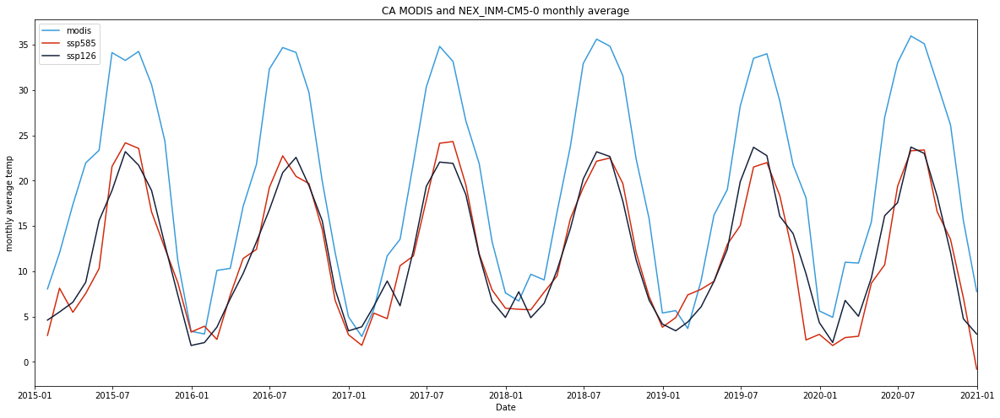

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(CA_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(CA_ssp585_INM_CM5_0_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(CA_ssp126_INM_CM5_0_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('CA MODIS and NEX_INM-CM5-0 monthly average')
plt.show()

####RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
CA_ssp585_INM_CM5_0_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp585_INM_CM5_0_monthly_avg_temp)) 
CA_ssp585_INM_CM5_0_monthly_rmse

9.315644325797402

In [ ]:
CA_ssp126_INM_CM5_0_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp126_INM_CM5_0_monthly_avg_temp)) 
CA_ssp126_INM_CM5_0_monthly_rmse

8.97944212726844

####time series analysis

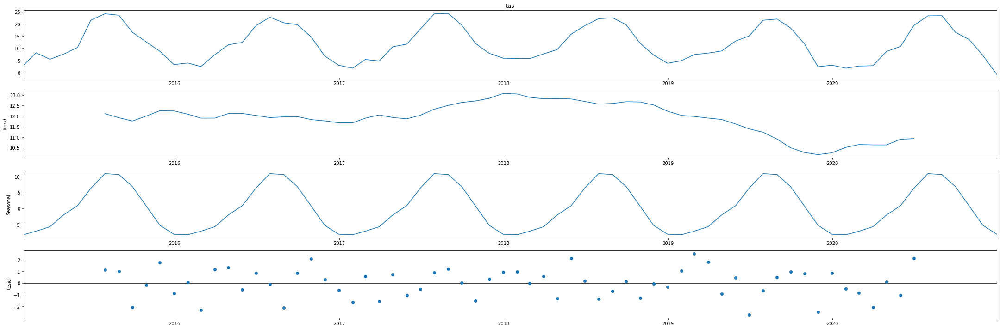

In [ ]:
CA_ssp585_INM_CM5_0_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp585_INM_CM5_0_monthly_avg_temp, model='additive')
fig = CA_ssp585_INM_CM5_0_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

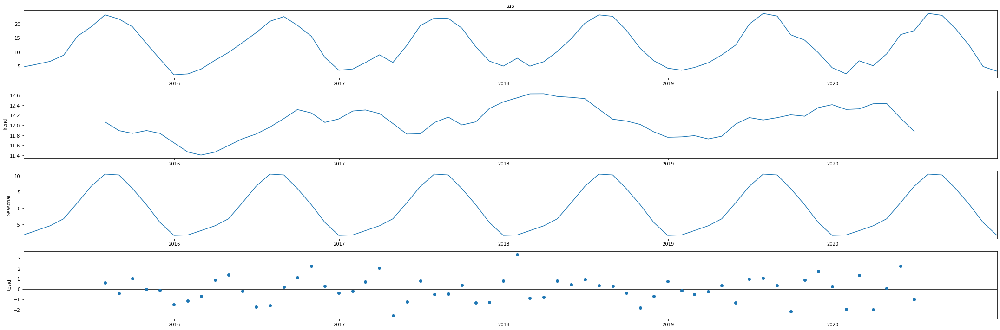

In [ ]:
CA_ssp126_INM_CM5_0_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp126_INM_CM5_0_monthly_avg_temp, model='additive')
fig = CA_ssp126_INM_CM5_0_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

####R Square

In [ ]:
CA_ssp585_INM_CM5_0_model = LinearRegression()
x = CA_ssp585_INM_CM5_0_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
CA_ssp585_INM_CM5_0_model.fit(x, y)
CA_ssp585_INM_CM5_0_r_squared =CA_ssp585_INM_CM5_0_model.score(x, y)
CA_ssp585_INM_CM5_0_r_squared

0.8758987432608083

In [ ]:
CA_ssp126_INM_CM5_0_model = LinearRegression()
x = CA_ssp126_INM_CM5_0_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
CA_ssp126_INM_CM5_0_model.fit(x, y)
CA_ssp126_INM_CM5_0_r_squared =CA_ssp126_INM_CM5_0_model.score(x, y)
CA_ssp126_INM_CM5_0_r_squared

0.9273331614205285

#### seasonal analysis

In [ ]:
month = CA_ssp585_INM_CM5_0_monthly_avg_temp.index.month
CA_ssp585_INM_CM5_0_winter = pd.concat([CA_ssp585_INM_CM5_0_monthly_avg_temp[month == 1], CA_ssp585_INM_CM5_0_monthly_avg_temp[month == 2],CA_ssp585_INM_CM5_0_monthly_avg_temp[month == 12]])
CA_ssp585_INM_CM5_0_spring = pd.concat([CA_ssp585_INM_CM5_0_monthly_avg_temp[month == 3], CA_ssp585_INM_CM5_0_monthly_avg_temp[month == 4],CA_ssp585_INM_CM5_0_monthly_avg_temp[month == 5]])
CA_ssp585_INM_CM5_0_summer = pd.concat([CA_ssp585_INM_CM5_0_monthly_avg_temp[month == 6], CA_ssp585_INM_CM5_0_monthly_avg_temp[month == 7],CA_ssp585_INM_CM5_0_monthly_avg_temp[month == 8]])
CA_ssp585_INM_CM5_0_fall = pd.concat([CA_ssp585_INM_CM5_0_monthly_avg_temp[month == 9], CA_ssp585_INM_CM5_0_monthly_avg_temp[month == 10],CA_ssp585_INM_CM5_0_monthly_avg_temp[month == 11]])
CA_ssp585_INM_CM5_0_winter.sort_index()
CA_ssp585_INM_CM5_0_spring.sort_index()
CA_ssp585_INM_CM5_0_summer.sort_index()
CA_ssp585_INM_CM5_0_fall.sort_index()

time
2015-09-30    16.562995
2015-10-31    12.552638
2015-11-30     8.763000
2016-09-30    19.686899
2016-10-31    14.627643
2016-11-30     6.792824
2017-09-30    19.530635
2017-10-31    11.920969
2017-11-30     7.936046
2018-09-30    19.690162
2018-10-31    12.084141
2018-11-30     7.224466
2019-09-30    18.351616
2019-10-31    11.785254
2019-11-30     2.424332
2020-09-30    16.581008
2020-10-31    13.533541
2020-11-30     7.072637
Name: tas, dtype: float64

In [ ]:
month = CA_ssp126_INM_CM5_0_monthly_avg_temp.index.month
CA_ssp126_INM_CM5_0_winter = pd.concat([CA_ssp126_INM_CM5_0_monthly_avg_temp[month == 1], CA_ssp126_INM_CM5_0_monthly_avg_temp[month == 2],CA_ssp126_INM_CM5_0_monthly_avg_temp[month == 12]])
CA_ssp126_INM_CM5_0_spring = pd.concat([CA_ssp126_INM_CM5_0_monthly_avg_temp[month == 3], CA_ssp126_INM_CM5_0_monthly_avg_temp[month == 4],CA_ssp126_INM_CM5_0_monthly_avg_temp[month == 5]])
CA_ssp126_INM_CM5_0_summer = pd.concat([CA_ssp126_INM_CM5_0_monthly_avg_temp[month == 6], CA_ssp126_INM_CM5_0_monthly_avg_temp[month == 7],CA_ssp126_INM_CM5_0_monthly_avg_temp[month == 8]])
CA_ssp126_INM_CM5_0_fall = pd.concat([CA_ssp126_INM_CM5_0_monthly_avg_temp[month == 9], CA_ssp126_INM_CM5_0_monthly_avg_temp[month == 10],CA_ssp126_INM_CM5_0_monthly_avg_temp[month == 11]])
CA_ssp126_INM_CM5_0_winter.sort_index()
CA_ssp126_INM_CM5_0_spring.sort_index()
CA_ssp126_INM_CM5_0_summer.sort_index()
CA_ssp126_INM_CM5_0_fall.sort_index()

time
2015-09-30    18.927158
2015-10-31    12.944415
2015-11-30     7.394050
2016-09-30    19.465835
2016-10-31    15.566985
2016-11-30     7.996229
2017-09-30    18.453160
2017-10-31    11.812377
2017-11-30     6.695284
2018-09-30    17.737458
2018-10-31    11.243128
2018-11-30     6.827604
2019-09-30    16.085849
2019-10-31    14.164002
2019-11-30     9.735215
2020-09-30    18.282867
2020-10-31    12.111391
2020-11-30     4.757030
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = CA_ssp126_INM_CM5_0_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.27627509967945585
coef:  [[0.91704468]]
intercept:  [2.63606117]


In [ ]:
x = CA_ssp126_INM_CM5_0_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.7660632358096627
coef:  [[1.38891418]]
intercept:  [3.30167042]


In [ ]:
x = CA_ssp126_INM_CM5_0_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.28969975895691646
coef:  [[0.4788743]]
intercept:  [23.35727859]


In [ ]:
x = CA_ssp126_INM_CM5_0_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8114777339866796
coef:  [[1.27264889]]
intercept:  [5.98013034]


#####ssp585

In [ ]:
x = CA_ssp585_INM_CM5_0_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.027528407447136694
coef:  [[0.20953213]]
intercept:  [5.74412076]


In [ ]:
x = CA_ssp585_INM_CM5_0_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.39382550934018257
coef:  [[1.09687628]]
intercept:  [6.84169245]


In [ ]:
x = CA_ssp585_INM_CM5_0_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.6709727424991969
coef:  [[0.61161793]]
intercept:  [20.43877675]


In [ ]:
x = CA_ssp585_INM_CM5_0_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.7357527836150255
coef:  [[1.12747454]]
intercept:  [8.02962465]


###CA_NEX_KACE-1-0-G

####SSP585

In [ ]:
#https://drive.google.com/file/d/1JeSq3PjANs2Ha4vLiWWxlu2PKi9KUjRR/view?usp=share_link
id = "1JeSq3PjANs2Ha4vLiWWxlu2PKi9KUjRR"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp585_KACE_1_0_G.csv')

CA_ssp585_KACE_1_0_G = pd.read_csv('CA_ssp585_KACE_1_0_G.csv', parse_dates=['time'], index_col='time')
CA_ssp585_KACE_1_0_G.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,1.234253
2015-01-01,39.125,-119.875,0.891174
2015-01-01,39.125,-119.625,1.165497
2015-01-01,39.125,-119.375,-0.340332
2015-01-01,39.125,-119.125,1.053558


In [ ]:
CA_ssp585_KACE_1_0_G

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,1.234253
2015-01-01,39.125,-119.875,0.891174
2015-01-01,39.125,-119.625,1.165497
2015-01-01,39.125,-119.375,-0.340332
2015-01-01,39.125,-119.125,1.053558
...,...,...,...
2020-11-29,36.375,-118.125,0.208191
2020-11-29,36.375,-117.875,5.904266
2020-11-29,36.375,-117.625,3.906982


In [ ]:
CA_ssp585_KACE_1_0_G['tas'].isnull().sum()

0

In [ ]:
CA_ssp585_KACE_1_0_G_avg_temp = CA_ssp585_KACE_1_0_G.groupby(CA_ssp585_KACE_1_0_G.index)['tas'].mean()
CA_ssp585_KACE_1_0_G_avg_temp

time
2015-01-01    1.980642
2015-01-02    1.253889
2015-01-03    4.153722
2015-01-04    6.080530
2015-01-05    6.230894
                ...   
2020-11-25   -3.725932
2020-11-26   -0.084288
2020-11-27    0.343759
2020-11-28    0.625193
2020-11-29    0.081615
Name: tas, Length: 2160, dtype: float64

In [ ]:
CA_ssp585_KACE_1_0_G_monthly_avg_temp = CA_ssp585_KACE_1_0_G_avg_temp.resample('M').mean()
CA_ssp585_KACE_1_0_G_monthly_avg_temp

time
2015-01-31     2.589740
2015-02-28     4.506082
2015-03-31     6.612282
2015-04-30     9.812957
2015-05-31    10.667430
                ...    
2020-07-31    23.279284
2020-08-31    17.696664
2020-09-30    13.184227
2020-10-31     8.924610
2020-11-30     1.026894
Freq: M, Name: tas, Length: 71, dtype: float64

####SSP126

In [ ]:
#https://drive.google.com/file/d/1nq6wCMjQD8P5I_m0g2bKuMGzI1wrD_Hn/view?usp=share_link
id = "1nq6wCMjQD8P5I_m0g2bKuMGzI1wrD_Hn"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp126_KACE_1_0_G.csv')

CA_ssp126_KACE_1_0_G = pd.read_csv('CA_ssp126_KACE_1_0_G.csv', parse_dates=['time'], index_col='time')
CA_ssp126_KACE_1_0_G.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,1.183685
2015-01-01,39.125,-119.875,0.895142
2015-01-01,39.125,-119.625,1.223999
2015-01-01,39.125,-119.375,-0.227264
2015-01-01,39.125,-119.125,1.221130


In [ ]:
CA_ssp126_KACE_1_0_G['tas'].isnull().sum()

0

In [ ]:
CA_ssp126_KACE_1_0_G_avg_temp = CA_ssp126_KACE_1_0_G.groupby(CA_ssp126_KACE_1_0_G.index)['tas'].mean()
CA_ssp126_KACE_1_0_G_avg_temp

time
2015-01-01    2.102278
2015-01-02    1.391567
2015-01-03    4.286892
2015-01-04    6.322219
2015-01-05    6.472617
                ...   
2020-11-25    1.356419
2020-11-26    4.297043
2020-11-27   -0.728735
2020-11-28   -3.977022
2020-11-29   -7.214119
Name: tas, Length: 2160, dtype: float64

In [ ]:
CA_ssp126_KACE_1_0_G_monthly_avg_temp = CA_ssp126_KACE_1_0_G_avg_temp.resample('M').mean()
CA_ssp126_KACE_1_0_G_monthly_avg_temp 

time
2015-01-31     1.042489
2015-02-28    -0.422015
2015-03-31     5.992581
2015-04-30     7.270935
2015-05-31    14.008909
                ...    
2020-07-31    23.595096
2020-08-31    20.260277
2020-09-30    13.134353
2020-10-31     6.836837
2020-11-30     2.203168
Freq: M, Name: tas, Length: 71, dtype: float64

####compare modis with ssp585 and ssp126

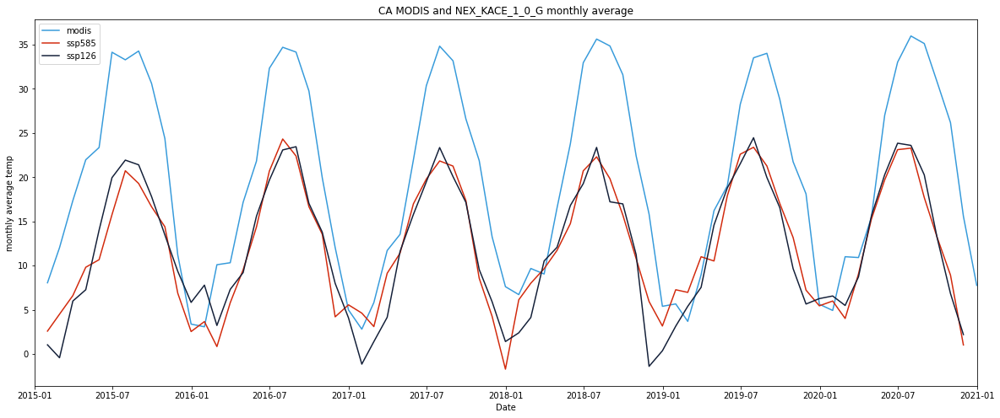

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(CA_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(CA_ssp585_KACE_1_0_G_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(CA_ssp126_KACE_1_0_G_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('CA MODIS and NEX_KACE_1_0_G monthly average')
plt.show()

####RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
CA_ssp585_KACE_1_0_G_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month[:-1], CA_ssp585_KACE_1_0_G_monthly_avg_temp)) 
CA_ssp585_KACE_1_0_G_monthly_rmse

9.663818892388875

In [ ]:
CA_ssp126_KACE_1_0_G_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month[:-1], CA_ssp126_KACE_1_0_G_monthly_avg_temp)) 
CA_ssp126_KACE_1_0_G_monthly_rmse

9.742687302631188

####time series analysis

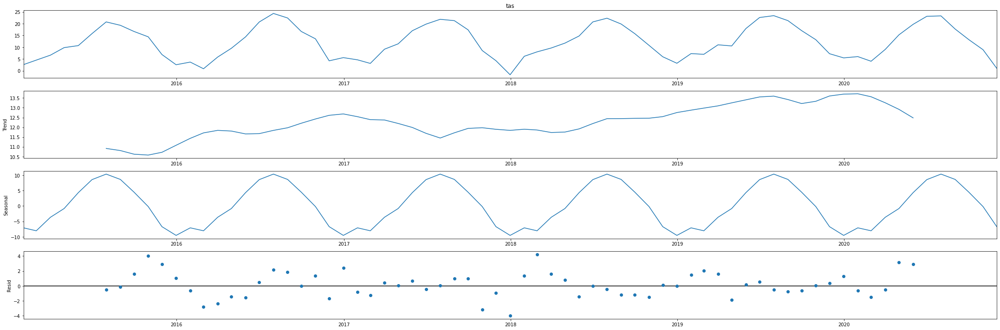

In [ ]:
CA_ssp585_KACE_1_0_G_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp585_KACE_1_0_G_monthly_avg_temp, model='additive')
fig = CA_ssp585_KACE_1_0_G_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

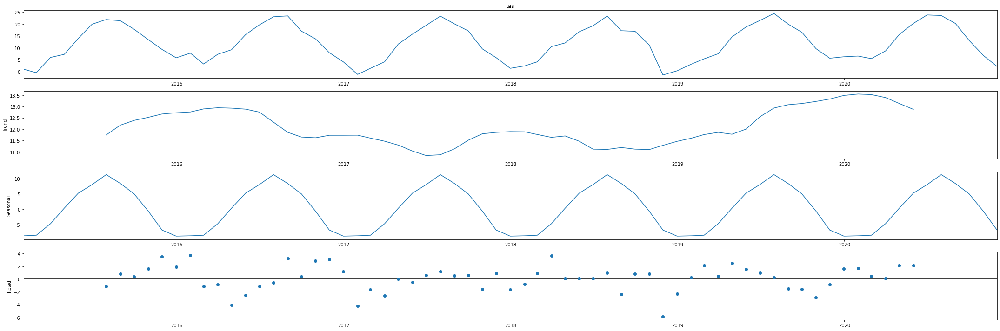

In [ ]:
CA_ssp126_KACE_1_0_G_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp126_KACE_1_0_G_monthly_avg_temp, model='additive')
fig = CA_ssp126_KACE_1_0_G_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

####R Square

In [ ]:
CA_ssp585_KACE_1_0_G_model = LinearRegression()
x = CA_ssp585_KACE_1_0_G_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month[:-1].values.reshape(-1, 1)

In [ ]:
CA_ssp585_KACE_1_0_G_model.fit(x, y)
CA_ssp585_KACE_1_0_G_r_squared =CA_ssp585_KACE_1_0_G_model.score(x, y)
CA_ssp585_KACE_1_0_G_r_squared

0.7842655606700284

In [ ]:
CA_ssp126_KACE_1_0_G_model = LinearRegression()
x = CA_ssp126_KACE_1_0_G_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month[:-1].values.reshape(-1, 1)

In [ ]:
CA_ssp126_KACE_1_0_G_model.fit(x, y)
CA_ssp126_KACE_1_0_G_r_squared =CA_ssp126_KACE_1_0_G_model.score(x, y)
CA_ssp126_KACE_1_0_G_r_squared

0.7657430437379669

#### seasonal analysis

In [ ]:
month = CA_ssp585_KACE_1_0_G_monthly_avg_temp.index.month
CA_ssp585_KACE_1_0_G_winter = pd.concat([CA_ssp585_KACE_1_0_G_monthly_avg_temp[month == 1], CA_ssp585_KACE_1_0_G_monthly_avg_temp[month == 2],CA_ssp585_KACE_1_0_G_monthly_avg_temp[month == 12]])
CA_ssp585_KACE_1_0_G_spring = pd.concat([CA_ssp585_KACE_1_0_G_monthly_avg_temp[month == 3], CA_ssp585_KACE_1_0_G_monthly_avg_temp[month == 4],CA_ssp585_KACE_1_0_G_monthly_avg_temp[month == 5]])
CA_ssp585_KACE_1_0_G_summer = pd.concat([CA_ssp585_KACE_1_0_G_monthly_avg_temp[month == 6], CA_ssp585_KACE_1_0_G_monthly_avg_temp[month == 7],CA_ssp585_KACE_1_0_G_monthly_avg_temp[month == 8]])
CA_ssp585_KACE_1_0_G_fall = pd.concat([CA_ssp585_KACE_1_0_G_monthly_avg_temp[month == 9], CA_ssp585_KACE_1_0_G_monthly_avg_temp[month == 10],CA_ssp585_KACE_1_0_G_monthly_avg_temp[month == 11]])
CA_ssp585_KACE_1_0_G_winter.sort_index()
CA_ssp585_KACE_1_0_G_spring.sort_index()
CA_ssp585_KACE_1_0_G_summer.sort_index()
CA_ssp585_KACE_1_0_G_fall.sort_index()

time
2015-09-30    16.658063
2015-10-31    14.395758
2015-11-30     6.877841
2016-09-30    16.659094
2016-10-31    13.547210
2016-11-30     4.207310
2017-09-30    17.364158
2017-10-31     8.569004
2017-11-30     4.262155
2018-09-30    15.719686
2018-10-31    10.775440
2018-11-30     5.937032
2019-09-30    17.025635
2019-10-31    13.177993
2019-11-30     7.228972
2020-09-30    13.184227
2020-10-31     8.924610
2020-11-30     1.026894
Name: tas, dtype: float64

In [ ]:
month = CA_ssp126_KACE_1_0_G_monthly_avg_temp.index.month
CA_ssp126_KACE_1_0_G_winter = pd.concat([CA_ssp126_KACE_1_0_G_monthly_avg_temp[month == 1], CA_ssp126_KACE_1_0_G_monthly_avg_temp[month == 2],CA_ssp126_KACE_1_0_G_monthly_avg_temp[month == 12]])
CA_ssp126_KACE_1_0_G_spring = pd.concat([CA_ssp126_KACE_1_0_G_monthly_avg_temp[month == 3], CA_ssp126_KACE_1_0_G_monthly_avg_temp[month == 4],CA_ssp126_KACE_1_0_G_monthly_avg_temp[month == 5]])
CA_ssp126_KACE_1_0_G_summer = pd.concat([CA_ssp126_KACE_1_0_G_monthly_avg_temp[month == 6], CA_ssp126_KACE_1_0_G_monthly_avg_temp[month == 7],CA_ssp126_KACE_1_0_G_monthly_avg_temp[month == 8]])
CA_ssp126_KACE_1_0_G_fall = pd.concat([CA_ssp126_KACE_1_0_G_monthly_avg_temp[month == 9], CA_ssp126_KACE_1_0_G_monthly_avg_temp[month == 10],CA_ssp126_KACE_1_0_G_monthly_avg_temp[month == 11]])
CA_ssp126_KACE_1_0_G_winter.sort_index()
CA_ssp126_KACE_1_0_G_spring.sort_index()
CA_ssp126_KACE_1_0_G_summer.sort_index()
CA_ssp126_KACE_1_0_G_fall.sort_index()

time
2015-09-30    17.810763
2015-10-31    13.467694
2015-11-30     9.352929
2016-09-30    17.038359
2016-10-31    13.780926
2016-11-30     7.994791
2017-09-30    17.150643
2017-10-31     9.557193
2017-11-30     5.911992
2018-09-30    16.977131
2018-10-31    11.230403
2018-11-30    -1.390339
2019-09-30    16.557453
2019-10-31     9.659881
2019-11-30     5.654908
2020-09-30    13.134353
2020-10-31     6.836837
2020-11-30     2.203168
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = CA_ssp126_KACE_1_0_G_winter.values.reshape(-1, 1)
y = CA_winter[:-1].values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.06750204320764752
coef:  [[-0.27841481]]
intercept:  [7.4388998]


In [ ]:
x = CA_ssp126_KACE_1_0_G_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.4267526981620947
coef:  [[0.7698207]]
intercept:  [7.7739692]


In [ ]:
x = CA_ssp126_KACE_1_0_G_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.04772943593242318
coef:  [[0.20007422]]
intercept:  [29.28623209]


In [ ]:
x = CA_ssp126_KACE_1_0_G_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.5584738589448675
coef:  [[0.9142615]]
intercept:  [12.45658527]


#####ssp585

In [ ]:
x = CA_ssp585_KACE_1_0_G_winter.values.reshape(-1, 1)
y = CA_winter[:-1].values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.02287169324525129
coef:  [[-0.17465395]]
intercept:  [7.25273771]


In [ ]:
x = CA_ssp585_KACE_1_0_G_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.383131226180769
coef:  [[0.89190546]]
intercept:  [6.40803403]


In [ ]:
x = CA_ssp585_KACE_1_0_G_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.0011596827350797145
coef:  [[-0.0298758]]
intercept:  [34.20605621]


In [ ]:
x = CA_ssp585_KACE_1_0_G_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.7192336768780254
coef:  [[1.12005876]]
intercept:  [10.08825923]


###CA_NEX_KIOST_ESM

####SSP585

In [ ]:
#https://drive.google.com/file/d/1WiQpGwPNdHzufSc_gce4OFY5XmHpzGNI/view?usp=share_link
id = "1WiQpGwPNdHzufSc_gce4OFY5XmHpzGNI"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp585_KIOST_ESM.csv')

CA_ssp585_KIOST_ESM = pd.read_csv('CA_ssp585_KIOST_ESM.csv', parse_dates=['time'], index_col='time')
CA_ssp585_KIOST_ESM.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,0.918701
2015-01-01,39.125,-119.875,1.227173
2015-01-01,39.125,-119.625,2.153107
2015-01-01,39.125,-119.375,1.298889
2015-01-01,39.125,-119.125,3.344299


In [ ]:
CA_ssp585_KIOST_ESM

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,0.918701
2015-01-01,39.125,-119.875,1.227173
2015-01-01,39.125,-119.625,2.153107
2015-01-01,39.125,-119.375,1.298889
2015-01-01,39.125,-119.125,3.344299
...,...,...,...
2020-12-29,36.375,-118.125,1.772339
2020-12-29,36.375,-117.875,7.595337
2020-12-29,36.375,-117.625,5.728943


In [ ]:
CA_ssp585_KIOST_ESM['tas'].isnull().sum()

0

In [ ]:
CA_ssp585_KIOST_ESM_avg_temp = CA_ssp585_KIOST_ESM.groupby(CA_ssp585_KIOST_ESM.index)['tas'].mean()
CA_ssp585_KIOST_ESM_avg_temp

time
2015-01-01    4.471188
2015-01-02    0.715280
2015-01-03    5.399956
2015-01-04    5.264453
2015-01-05    5.205034
                ...   
2020-12-25   -0.383911
2020-12-26   -1.872877
2020-12-27    1.326124
2020-12-28    2.974253
2020-12-29    2.060632
Name: tas, Length: 2190, dtype: float64

In [ ]:
CA_ssp585_KIOST_ESM_monthly_avg_temp = CA_ssp585_KIOST_ESM_avg_temp.resample('M').mean()
CA_ssp585_KIOST_ESM_monthly_avg_temp

time
2015-01-31     6.941591
2015-02-28     5.558888
2015-03-31     7.658936
2015-04-30     9.642478
2015-05-31    15.239677
                ...    
2020-08-31    21.900945
2020-09-30    18.881927
2020-10-31    12.791547
2020-11-30     5.987066
2020-12-31     4.298627
Freq: M, Name: tas, Length: 72, dtype: float64

####SSP126

In [ ]:
#https://drive.google.com/file/d/1RCPse3KftebYWZ0gKUNZZbNFN2v2Gpjn/view?usp=share_link
id = "1RCPse3KftebYWZ0gKUNZZbNFN2v2Gpjn"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp126_KIOST_ESM.csv')

CA_ssp126_KIOST_ESM = pd.read_csv('CA_ssp126_KIOST_ESM.csv', parse_dates=['time'], index_col='time')
CA_ssp126_KIOST_ESM.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,1.004150
2015-01-01,39.125,-119.875,1.316467
2015-01-01,39.125,-119.625,2.246216
2015-01-01,39.125,-119.375,1.395813
2015-01-01,39.125,-119.125,3.445099


In [ ]:
CA_ssp126_KIOST_ESM

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,1.004150
2015-01-01,39.125,-119.875,1.316467
2015-01-01,39.125,-119.625,2.246216
2015-01-01,39.125,-119.375,1.395813
2015-01-01,39.125,-119.125,3.445099
...,...,...,...
2020-12-29,36.375,-118.125,-0.533508
2020-12-29,36.375,-117.875,5.174194
2020-12-29,36.375,-117.625,3.192444


In [ ]:
CA_ssp126_KIOST_ESM['tas'].isnull().sum()

0

In [ ]:
CA_ssp126_KIOST_ESM_avg_temp = CA_ssp126_KIOST_ESM.groupby(CA_ssp126_KIOST_ESM.index)['tas'].mean()
CA_ssp126_KIOST_ESM_avg_temp

time
2015-01-01    5.061557
2015-01-02    0.856501
2015-01-03    4.532732
2015-01-04    5.229916
2015-01-05    5.763497
                ...   
2020-12-25   -4.006834
2020-12-26   -4.492816
2020-12-27    4.127881
2020-12-28    2.835303
2020-12-29    2.847923
Name: tas, Length: 2190, dtype: float64

In [ ]:
CA_ssp126_KIOST_ESM_monthly_avg_temp = CA_ssp126_KIOST_ESM_avg_temp.resample('M').mean()
CA_ssp126_KIOST_ESM_monthly_avg_temp

time
2015-01-31     5.620827
2015-02-28     4.775439
2015-03-31     5.224542
2015-04-30    11.430493
2015-05-31    14.254175
                ...    
2020-08-31    21.729714
2020-09-30    17.679501
2020-10-31    14.022251
2020-11-30     5.171679
2020-12-31     1.508407
Freq: M, Name: tas, Length: 72, dtype: float64

####compare modis with ssp585 and ssp126

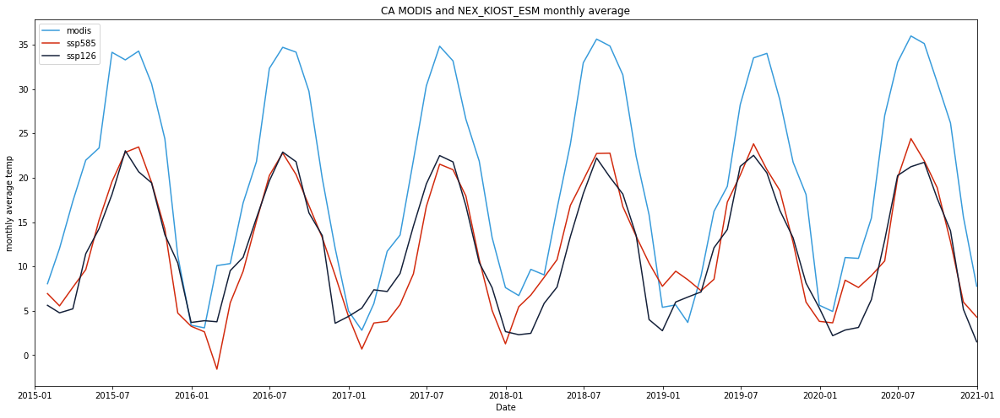

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(CA_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(CA_ssp585_KIOST_ESM_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(CA_ssp126_KIOST_ESM_monthly_avg_temp, color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('CA MODIS and NEX_KIOST_ESM monthly average')
plt.show()

####RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
CA_ssp585_KIOST_ESM_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp585_KIOST_ESM_monthly_avg_temp)) 
CA_ssp585_KIOST_ESM_monthly_rmse

9.163109605461031

In [ ]:
CA_ssp126_KIOST_ESM_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp126_KIOST_ESM_monthly_avg_temp)) 
CA_ssp126_KIOST_ESM_monthly_rmse

9.361826245886077

####time series analysis

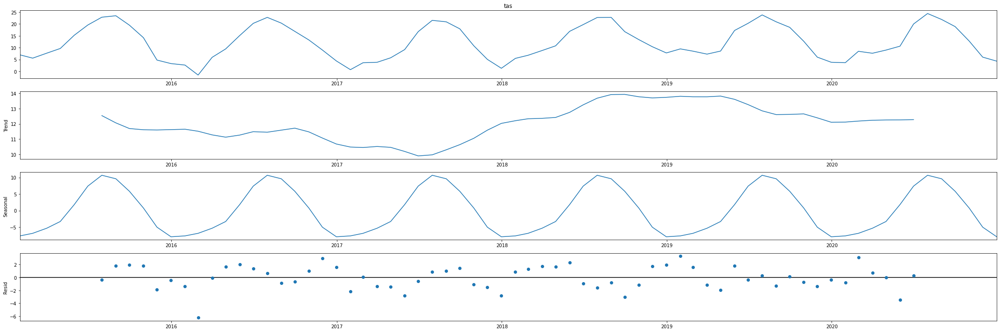

In [ ]:
CA_ssp585_KIOST_ESM_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp585_KIOST_ESM_monthly_avg_temp, model='additive')
fig = CA_ssp585_KIOST_ESM_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

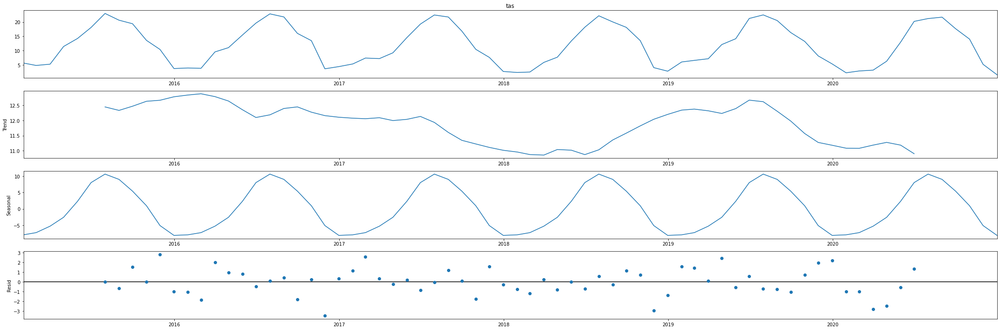

In [ ]:
CA_ssp126_KIOST_ESM_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp126_KIOST_ESM_monthly_avg_temp, model='additive')
fig = CA_ssp126_KIOST_ESM_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

####R Square

In [ ]:
CA_ssp585_KIOST_ESM_model = LinearRegression()
x = CA_ssp585_KIOST_ESM_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
CA_ssp585_KIOST_ESM_model.fit(x, y)
CA_ssp585_KIOST_ESM_r_squared =CA_ssp585_KIOST_ESM_model.score(x, y)
CA_ssp585_KIOST_ESM_r_squared

0.8642811897573851

In [ ]:
CA_ssp126_KIOST_ESM_model = LinearRegression()
x = CA_ssp126_KIOST_ESM_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
CA_ssp126_KIOST_ESM_model.fit(x, y)
CA_ssp126_KIOST_ESM_r_squared =CA_ssp126_KIOST_ESM_model.score(x, y)
CA_ssp126_KIOST_ESM_r_squared

0.8865847627777175

#### seasonal analysis

In [ ]:
month = CA_ssp585_KIOST_ESM_monthly_avg_temp.index.month
CA_ssp585_KIOST_ESM_winter = pd.concat([CA_ssp585_KIOST_ESM_monthly_avg_temp[month == 1], CA_ssp585_KIOST_ESM_monthly_avg_temp[month == 2],CA_ssp585_KIOST_ESM_monthly_avg_temp[month == 12]])
CA_ssp585_KIOST_ESM_spring = pd.concat([CA_ssp585_KIOST_ESM_monthly_avg_temp[month == 3], CA_ssp585_KIOST_ESM_monthly_avg_temp[month == 4],CA_ssp585_KIOST_ESM_monthly_avg_temp[month == 5]])
CA_ssp585_KIOST_ESM_summer = pd.concat([CA_ssp585_KIOST_ESM_monthly_avg_temp[month == 6], CA_ssp585_KIOST_ESM_monthly_avg_temp[month == 7],CA_ssp585_KIOST_ESM_monthly_avg_temp[month == 8]])
CA_ssp585_KIOST_ESM_fall = pd.concat([CA_ssp585_KIOST_ESM_monthly_avg_temp[month == 9], CA_ssp585_KIOST_ESM_monthly_avg_temp[month == 10],CA_ssp585_KIOST_ESM_monthly_avg_temp[month == 11]])
CA_ssp585_KIOST_ESM_winter.sort_index()
CA_ssp585_KIOST_ESM_spring.sort_index()
CA_ssp585_KIOST_ESM_summer.sort_index()
CA_ssp585_KIOST_ESM_fall.sort_index()

time
2015-09-30    19.484954
2015-10-31    14.207129
2015-11-30     4.749684
2016-09-30    16.863772
2016-10-31    13.245753
2016-11-30     8.990953
2017-09-30    17.943743
2017-10-31    10.782873
2017-11-30     5.043710
2018-09-30    16.746856
2018-10-31    13.399387
2018-11-30    10.388468
2019-09-30    18.568530
2019-10-31    12.694646
2019-11-30     5.987809
2020-09-30    18.881927
2020-10-31    12.791547
2020-11-30     5.987066
Name: tas, dtype: float64

In [ ]:
month = CA_ssp126_KIOST_ESM_monthly_avg_temp.index.month
CA_ssp126_KIOST_ESM_winter = pd.concat([CA_ssp126_KIOST_ESM_monthly_avg_temp[month == 1], CA_ssp126_KIOST_ESM_monthly_avg_temp[month == 2],CA_ssp126_KIOST_ESM_monthly_avg_temp[month == 12]])
CA_ssp126_KIOST_ESM_spring = pd.concat([CA_ssp126_KIOST_ESM_monthly_avg_temp[month == 3], CA_ssp126_KIOST_ESM_monthly_avg_temp[month == 4],CA_ssp126_KIOST_ESM_monthly_avg_temp[month == 5]])
CA_ssp126_KIOST_ESM_summer = pd.concat([CA_ssp126_KIOST_ESM_monthly_avg_temp[month == 6], CA_ssp126_KIOST_ESM_monthly_avg_temp[month == 7],CA_ssp126_KIOST_ESM_monthly_avg_temp[month == 8]])
CA_ssp126_KIOST_ESM_fall = pd.concat([CA_ssp126_KIOST_ESM_monthly_avg_temp[month == 9], CA_ssp126_KIOST_ESM_monthly_avg_temp[month == 10],CA_ssp126_KIOST_ESM_monthly_avg_temp[month == 11]])
CA_ssp126_KIOST_ESM_winter.sort_index()
CA_ssp126_KIOST_ESM_spring.sort_index()
CA_ssp126_KIOST_ESM_summer.sort_index()
CA_ssp126_KIOST_ESM_fall.sort_index()

time
2015-09-30    19.419056
2015-10-31    13.576226
2015-11-30    10.392826
2016-09-30    16.040147
2016-10-31    13.480864
2016-11-30     3.600583
2017-09-30    16.841249
2017-10-31    10.433534
2017-11-30     7.606780
2018-09-30    18.156623
2018-10-31    13.502685
2018-11-30     4.015219
2019-09-30    16.332706
2019-10-31    13.227217
2019-11-30     8.131916
2020-09-30    17.679501
2020-10-31    14.022251
2020-11-30     5.171679
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = CA_ssp126_KIOST_ESM_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.0730482525291557
coef:  [[-0.4445018]]
intercept:  [8.38738765]


In [ ]:
x = CA_ssp126_KIOST_ESM_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.5794806616116556
coef:  [[1.12262713]]
intercept:  [5.74888039]


In [ ]:
x = CA_ssp126_KIOST_ESM_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.06613752298091835
coef:  [[0.32092943]]
intercept:  [26.83986016]


In [ ]:
x = CA_ssp126_KIOST_ESM_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8049972252156354
coef:  [[1.23216278]]
intercept:  [7.08447915]


#####ssp585

In [ ]:
x = CA_ssp585_KIOST_ESM_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.014828182536095302
coef:  [[0.11408835]]
intercept:  [6.03624157]


In [ ]:
x = CA_ssp585_KIOST_ESM_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.45058030089397927
coef:  [[0.96031392]]
intercept:  [7.48742453]


In [ ]:
x = CA_ssp585_KIOST_ESM_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.3885505891023775
coef:  [[0.61617995]]
intercept:  [20.39723617]


In [ ]:
x = CA_ssp585_KIOST_ESM_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8418425643235289
coef:  [[1.25587073]]
intercept:  [6.434801]


### CA_NEX_UKESM1-0-LL

#### ssp585

In [ ]:
#https://drive.google.com/file/d/1FwF-XSidEKNlXADxEn4ZvZJLU_VirSTF/view?usp=sharing
id = "1FwF-XSidEKNlXADxEn4ZvZJLU_VirSTF"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp585_UKESM1-0-LL.csv')

CA_ssp585_UKESM1_0_LL = pd.read_csv('CA_ssp585_UKESM1-0-LL.csv', parse_dates=['time'], index_col='time')
CA_ssp585_UKESM1_0_LL.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,-1.100555
2015-01-01,39.125,-119.875,-0.820374
2015-01-01,39.125,-119.625,0.077209
2015-01-01,39.125,-119.375,-0.805328
2015-01-01,39.125,-119.125,1.211823


In [ ]:
CA_ssp585_UKESM1_0_LL

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,-1.100555
2015-01-01,39.125,-119.875,-0.820374
2015-01-01,39.125,-119.625,0.077209
2015-01-01,39.125,-119.375,-0.805328
2015-01-01,39.125,-119.125,1.211823
...,...,...,...
2020-11-29,36.375,-118.125,-1.659180
2020-11-29,36.375,-117.875,3.573212
2020-11-29,36.375,-117.625,1.112244


In [ ]:
CA_ssp585_UKESM1_0_LL['tas'].isnull().sum()

0

In [ ]:
CA_ssp585_UKESM1_0_LL_avg_temp = CA_ssp585_UKESM1_0_LL.groupby(CA_ssp585_UKESM1_0_LL.index)['tas'].mean()
CA_ssp585_UKESM1_0_LL_avg_temp

time
2015-01-01    2.156505
2015-01-02   -1.036462
2015-01-03    3.226497
2015-01-04    0.698724
2015-01-05   -1.841210
                ...   
2020-11-25    7.327338
2020-11-26    4.794603
2020-11-27    0.361292
2020-11-28    0.348341
2020-11-29    0.459822
Name: tas, Length: 2160, dtype: float64

In [ ]:
CA_ssp585_UKESM1_0_LL_monthly_avg_temp = CA_ssp585_UKESM1_0_LL_avg_temp.resample('M').mean()
CA_ssp585_UKESM1_0_LL_monthly_avg_temp

time
2015-01-31     1.360696
2015-02-28     6.791608
2015-03-31     6.713218
2015-04-30    10.515381
2015-05-31    16.143843
                ...    
2020-07-31    23.959671
2020-08-31    19.687744
2020-09-30    15.778590
2020-10-31     6.808927
2020-11-30     5.671061
Freq: M, Name: tas, Length: 71, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/1dTbL8mODnfYzeL5sOwsKZMhz7sf90GgE/view?usp=sharing
id = "1dTbL8mODnfYzeL5sOwsKZMhz7sf90GgE"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp126_UKESM1-0-LL.csv')

CA_ssp126_UKESM1_0_LL = pd.read_csv('CA_ssp126_UKESM1-0-LL.csv', parse_dates=['time'], index_col='time')
CA_ssp126_UKESM1_0_LL.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,-1.107239
2015-01-01,39.125,-119.875,-0.811768
2015-01-01,39.125,-119.625,0.101196
2015-01-01,39.125,-119.375,-0.765991
2015-01-01,39.125,-119.125,1.266479


In [ ]:
CA_ssp126_UKESM1_0_LL['tas'].isnull().sum()

0

In [ ]:
CA_ssp126_UKESM1_0_LL_avg_temp = CA_ssp126_UKESM1_0_LL.groupby(CA_ssp126_UKESM1_0_LL.index)['tas'].mean()
CA_ssp126_UKESM1_0_LL_avg_temp

time
2015-01-01    2.188686
2015-01-02   -1.289680
2015-01-03    3.351946
2015-01-04   -0.017439
2015-01-05   -1.797880
                ...   
2020-11-25   -2.419012
2020-11-26   -4.786823
2020-11-27   -3.217542
2020-11-28    0.323738
2020-11-29   -0.396929
Name: tas, Length: 2160, dtype: float64

In [ ]:
CA_ssp126_UKESM1_0_LL_monthly_avg_temp = CA_ssp126_UKESM1_0_LL_avg_temp.resample('M').mean()
CA_ssp126_UKESM1_0_LL_monthly_avg_temp 

time
2015-01-31     1.480818
2015-02-28     5.279926
2015-03-31     5.534724
2015-04-30     9.019397
2015-05-31    15.305734
                ...    
2020-07-31    24.815508
2020-08-31    18.819366
2020-09-30    15.978144
2020-10-31    10.256556
2020-11-30     1.425453
Freq: M, Name: tas, Length: 71, dtype: float64

#### compare modis with ssp585 and ssp126

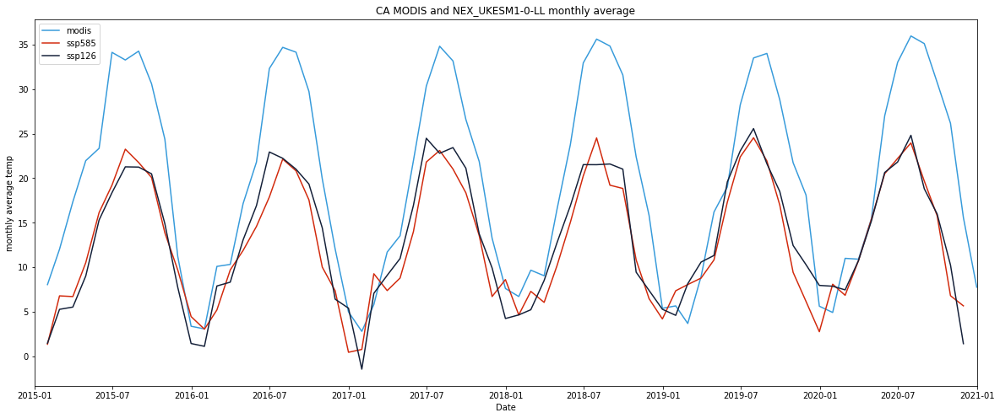

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(CA_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(CA_ssp585_UKESM1_0_LL_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(CA_ssp126_UKESM1_0_LL_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('CA MODIS and NEX_UKESM1-0-LL monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
#this model missing 2020-12 data
CA_ssp585_UKESM1_0_LL_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month[:-1], CA_ssp585_UKESM1_0_LL_monthly_avg_temp)) 
CA_ssp585_UKESM1_0_LL_monthly_rmse

8.987568020909908

In [ ]:
#calculate RMSE
#this model missing 2020-12 data
CA_ssp126_UKESM1_0_LL_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month[:-1], CA_ssp126_UKESM1_0_LL_monthly_avg_temp)) 
CA_ssp126_UKESM1_0_LL_monthly_rmse

8.440150265772408

#### time series analysis

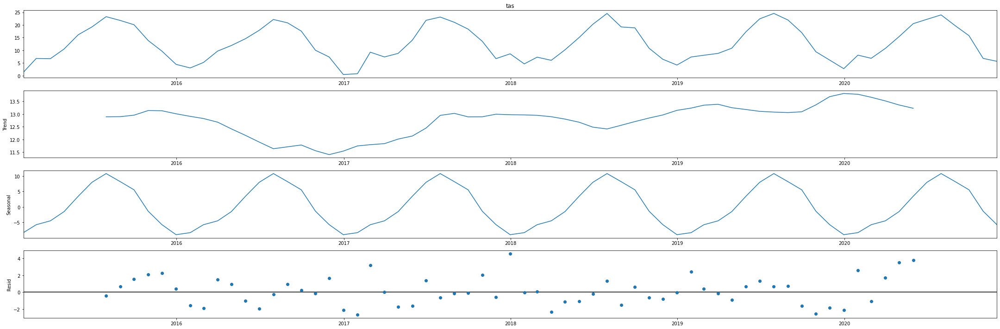

In [ ]:

CA_ssp585_UKESM1_0_LL_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp585_UKESM1_0_LL_monthly_avg_temp, model='additive')
fig = CA_ssp585_UKESM1_0_LL_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

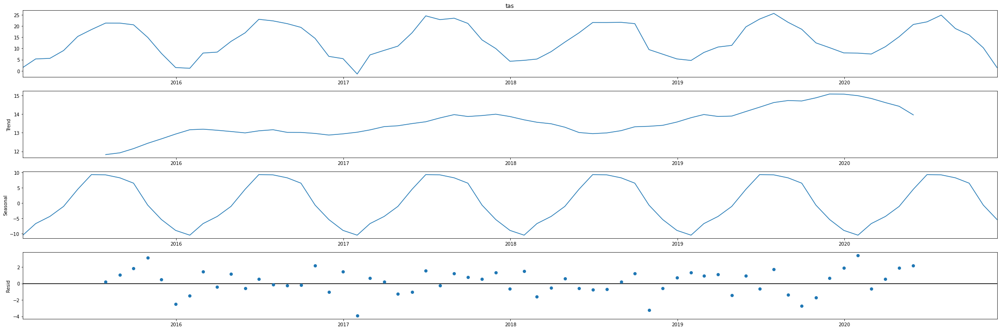

In [ ]:

CA_ssp126_UKESM1_0_LL_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp126_UKESM1_0_LL_monthly_avg_temp, model='additive')
fig = CA_ssp126_UKESM1_0_LL_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

####R Square

In [ ]:
CA_ssp585_UKESM1_0_LL_model = LinearRegression()
x = CA_ssp585_UKESM1_0_LL_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month[:-1].values.reshape(-1, 1)

In [ ]:
CA_ssp585_UKESM1_0_LL_model.fit(x, y)
CA_ssp585_UKESM1_0_LL_r_squared =CA_ssp585_UKESM1_0_LL_model.score(x, y)
CA_ssp585_UKESM1_0_LL_r_squared

0.8276118491268963

In [ ]:
CA_ssp126_UKESM1_0_LL_model = LinearRegression()
x = CA_ssp126_UKESM1_0_LL_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month[:-1].values.reshape(-1, 1)

In [ ]:
CA_ssp126_UKESM1_0_LL_model.fit(x, y)
CA_ssp126_UKESM1_0_LL_r_squared =CA_ssp126_UKESM1_0_LL_model.score(x, y)
CA_ssp126_UKESM1_0_LL_r_squared

0.8244434037145126

#### seasonal analysis

In [ ]:
month = CA_ssp585_UKESM1_0_LL_monthly_avg_temp.index.month
CA_ssp585_UKESM1_0_LL_winter = pd.concat([CA_ssp585_UKESM1_0_LL_monthly_avg_temp[month == 1], CA_ssp585_UKESM1_0_LL_monthly_avg_temp[month == 2],CA_ssp585_UKESM1_0_LL_monthly_avg_temp[month == 12]])
CA_ssp585_UKESM1_0_LL_spring = pd.concat([CA_ssp585_UKESM1_0_LL_monthly_avg_temp[month == 3], CA_ssp585_UKESM1_0_LL_monthly_avg_temp[month == 4],CA_ssp585_UKESM1_0_LL_monthly_avg_temp[month == 5]])
CA_ssp585_UKESM1_0_LL_summer = pd.concat([CA_ssp585_UKESM1_0_LL_monthly_avg_temp[month == 6], CA_ssp585_UKESM1_0_LL_monthly_avg_temp[month == 7],CA_ssp585_UKESM1_0_LL_monthly_avg_temp[month == 8]])
CA_ssp585_UKESM1_0_LL_fall = pd.concat([CA_ssp585_UKESM1_0_LL_monthly_avg_temp[month == 9], CA_ssp585_UKESM1_0_LL_monthly_avg_temp[month == 10],CA_ssp585_UKESM1_0_LL_monthly_avg_temp[month == 11]])
CA_ssp585_UKESM1_0_LL_winter.sort_index()
CA_ssp585_UKESM1_0_LL_spring.sort_index()
CA_ssp585_UKESM1_0_LL_summer.sort_index()
CA_ssp585_UKESM1_0_LL_fall.sort_index()

time
2015-09-30    20.082534
2015-10-31    13.865447
2015-11-30     9.690432
2016-09-30    17.569792
2016-10-31    10.024586
2016-11-30     7.361606
2017-09-30    18.358287
2017-10-31    13.558434
2017-11-30     6.717383
2018-09-30    18.849546
2018-10-31    10.825425
2018-11-30     6.478625
2019-09-30    16.985490
2019-10-31     9.434638
2019-11-30     6.169464
2020-09-30    15.778590
2020-10-31     6.808927
2020-11-30     5.671061
Name: tas, dtype: float64

In [ ]:
month = CA_ssp126_UKESM1_0_LL_monthly_avg_temp.index.month
CA_ssp126_UKESM1_0_LL_winter = pd.concat([CA_ssp126_UKESM1_0_LL_monthly_avg_temp[month == 1], CA_ssp126_UKESM1_0_LL_monthly_avg_temp[month == 2],CA_ssp126_UKESM1_0_LL_monthly_avg_temp[month == 12]])
CA_ssp126_UKESM1_0_LL_spring = pd.concat([CA_ssp126_UKESM1_0_LL_monthly_avg_temp[month == 3], CA_ssp126_UKESM1_0_LL_monthly_avg_temp[month == 4],CA_ssp126_UKESM1_0_LL_monthly_avg_temp[month == 5]])
CA_ssp126_UKESM1_0_LL_summer = pd.concat([CA_ssp126_UKESM1_0_LL_monthly_avg_temp[month == 6], CA_ssp126_UKESM1_0_LL_monthly_avg_temp[month == 7],CA_ssp126_UKESM1_0_LL_monthly_avg_temp[month == 8]])
CA_ssp126_UKESM1_0_LL_fall = pd.concat([CA_ssp126_UKESM1_0_LL_monthly_avg_temp[month == 9], CA_ssp126_UKESM1_0_LL_monthly_avg_temp[month == 10],CA_ssp126_UKESM1_0_LL_monthly_avg_temp[month == 11]])
CA_ssp126_UKESM1_0_LL_winter.sort_index()
CA_ssp126_UKESM1_0_LL_spring.sort_index()
CA_ssp126_UKESM1_0_LL_summer.sort_index()
CA_ssp126_UKESM1_0_LL_fall.sort_index()

time
2015-09-30    20.492948
2015-10-31    14.883139
2015-11-30     7.742515
2016-09-30    19.346930
2016-10-31    14.428950
2016-11-30     6.423144
2017-09-30    21.118743
2017-10-31    13.754651
2017-11-30     9.922429
2018-09-30    21.016591
2018-10-31     9.447927
2018-11-30     7.403374
2019-09-30    18.504946
2019-10-31    12.447949
2019-11-30    10.293909
2020-09-30    15.978144
2020-10-31    10.256556
2020-11-30     1.425453
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = CA_ssp126_UKESM1_0_LL_winter.values.reshape(-1, 1)
y = CA_winter[:-1].values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.13701840513728158
coef:  [[0.37011116]]
intercept:  [4.68120287]


In [ ]:
x = CA_ssp126_UKESM1_0_LL_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.4731803093646981
coef:  [[0.89556547]]
intercept:  [5.48654417]


In [ ]:
x = CA_ssp126_UKESM1_0_LL_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.08223932873496198
coef:  [[-0.29203086]]
intercept:  [40.03469426]


In [ ]:
x = CA_ssp126_UKESM1_0_LL_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.7042108989621019
coef:  [[1.00503387]]
intercept:  [9.14085962]


#####ssp585

In [ ]:
x = CA_ssp585_UKESM1_0_LL_winter.values.reshape(-1, 1)
y = CA_winter[:-1].values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.0964615508614991
coef:  [[0.31071252]]
intercept:  [4.87286981]


In [ ]:
x = CA_ssp585_UKESM1_0_LL_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.5835491591092965
coef:  [[1.05985875]]
intercept:  [4.36893196]


In [ ]:
x = CA_ssp585_UKESM1_0_LL_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.011299721404010143
coef:  [[0.10534632]]
intercept:  [31.29362034]


In [ ]:
x = CA_ssp585_UKESM1_0_LL_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.6799344809891861
coef:  [[1.11647438]]
intercept:  [8.96797586]


### CA_NEX_TaiESM1

#### ssp585

In [ ]:
#https://drive.google.com/file/d/1pXcBW609Ir2cJ7P5HQv6iwj9j3Y3vAN7/view?usp=sharing
id = "1pXcBW609Ir2cJ7P5HQv6iwj9j3Y3vAN7"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp585_TaiESM1.csv')

CA_ssp585_TaiESM1 = pd.read_csv('CA_ssp585_TaiESM1.csv', parse_dates=['time'], index_col='time')
CA_ssp585_TaiESM1.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,0.145386
2015-01-01,39.125,-119.875,0.654663
2015-01-01,39.125,-119.625,2.391205
2015-01-01,39.125,-119.375,2.347595
2015-01-01,39.125,-119.125,5.203674


In [ ]:
CA_ssp585_TaiESM1

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,0.145386
2015-01-01,39.125,-119.875,0.654663
2015-01-01,39.125,-119.625,2.391205
2015-01-01,39.125,-119.375,2.347595
2015-01-01,39.125,-119.125,5.203674
...,...,...,...
2020-12-29,36.375,-118.125,-5.016479
2020-12-29,36.375,-117.875,0.251343
2020-12-29,36.375,-117.625,-2.170227


In [ ]:
CA_ssp585_TaiESM1['tas'].isnull().sum()

0

In [ ]:
CA_ssp585_TaiESM1_avg_temp = CA_ssp585_TaiESM1.groupby(CA_ssp585_TaiESM1.index)['tas'].mean()
CA_ssp585_TaiESM1_avg_temp

time
2015-01-01    3.591273
2015-01-02    6.824475
2015-01-03    6.521564
2015-01-04    7.363000
2015-01-05    9.232491
                ...   
2020-12-25    2.811889
2020-12-26   -0.616587
2020-12-27   -2.223541
2020-12-28   -3.734254
2020-12-29   -3.078893
Name: tas, Length: 2190, dtype: float64

In [ ]:
CA_ssp585_TaiESM1_monthly_avg_temp = CA_ssp585_TaiESM1_avg_temp.resample('M').mean()
CA_ssp585_TaiESM1_monthly_avg_temp

time
2015-01-31     2.629139
2015-02-28     1.958169
2015-03-31     6.671723
2015-04-30     9.642876
2015-05-31    18.419620
                ...    
2020-08-31    25.547026
2020-09-30    23.488185
2020-10-31    12.826734
2020-11-30     0.359036
2020-12-31    -0.245667
Freq: M, Name: tas, Length: 72, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/1ejOvWTvuXebwdpvI8iyq_YdCmAs_G3kD/view?usp=sharing
id = "1ejOvWTvuXebwdpvI8iyq_YdCmAs_G3kD"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp126_TaiESM1.csv')

CA_ssp126_TaiESM1 = pd.read_csv('CA_ssp126_TaiESM1.csv', parse_dates=['time'], index_col='time')
CA_ssp126_TaiESM1.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,-11.264954
2015-01-01,39.125,-119.875,-10.930603
2015-01-01,39.125,-119.625,-9.583832
2015-01-01,39.125,-119.375,-10.017212
2015-01-01,39.125,-119.125,-7.550903


In [ ]:
CA_ssp126_TaiESM1['tas'].isnull().sum()

0

In [ ]:
CA_ssp126_TaiESM1_avg_temp = CA_ssp126_TaiESM1.groupby(CA_ssp126_TaiESM1.index)['tas'].mean()
CA_ssp126_TaiESM1_avg_temp

time
2015-01-01   -7.201110
2015-01-02   -4.973772
2015-01-03   -5.209444
2015-01-04   -4.926100
2015-01-05   -3.000992
                ...   
2020-12-25   -1.258383
2020-12-26    4.855120
2020-12-27    5.535680
2020-12-28    6.251533
2020-12-29    5.274356
Name: tas, Length: 2190, dtype: float64

In [ ]:
CA_ssp126_TaiESM1_monthly_avg_temp = CA_ssp126_TaiESM1_avg_temp.resample('M').mean()
CA_ssp126_TaiESM1_monthly_avg_temp 

time
2015-01-31    -3.195286
2015-02-28    -2.860006
2015-03-31     2.648114
2015-04-30     9.438999
2015-05-31    12.872064
                ...    
2020-08-31    28.784945
2020-09-30    20.816061
2020-10-31    14.585356
2020-11-30     0.583610
2020-12-31     0.352839
Freq: M, Name: tas, Length: 72, dtype: float64

#### compare modis with ssp585 and ssp126

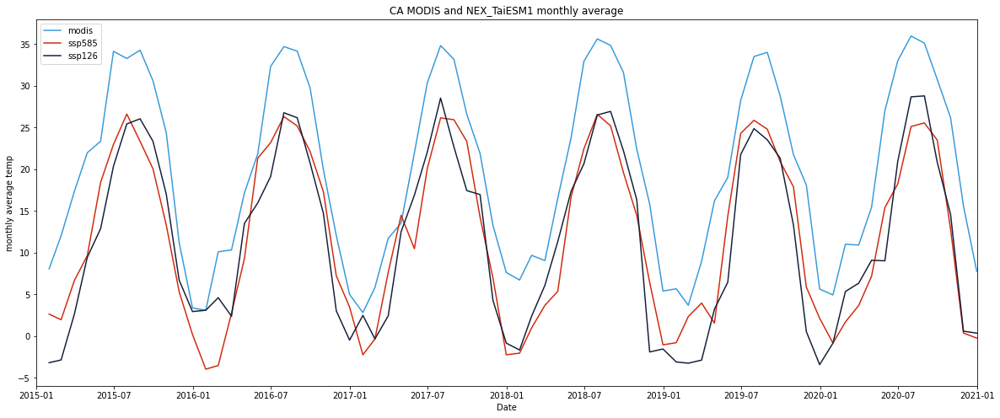

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(CA_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(CA_ssp585_TaiESM1_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(CA_ssp126_TaiESM1_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('CA MODIS and NEX_TaiESM1 monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
CA_ssp585_TaiESM1_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp585_TaiESM1_monthly_avg_temp)) 
CA_ssp585_TaiESM1_monthly_rmse

8.60455138080396

In [ ]:
CA_ssp126_TaiESM1_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp126_TaiESM1_monthly_avg_temp)) 
CA_ssp126_TaiESM1_monthly_rmse

9.19812236621642

#### time series analysis

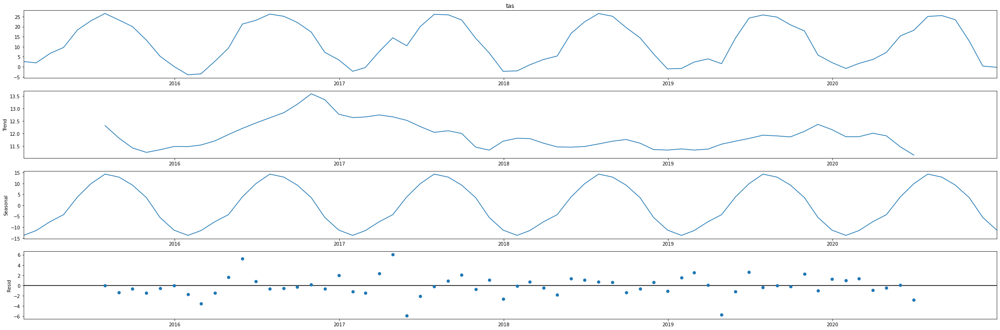

In [ ]:

CA_ssp585_TaiESM1_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp585_TaiESM1_monthly_avg_temp, model='additive')
fig = CA_ssp585_TaiESM1_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

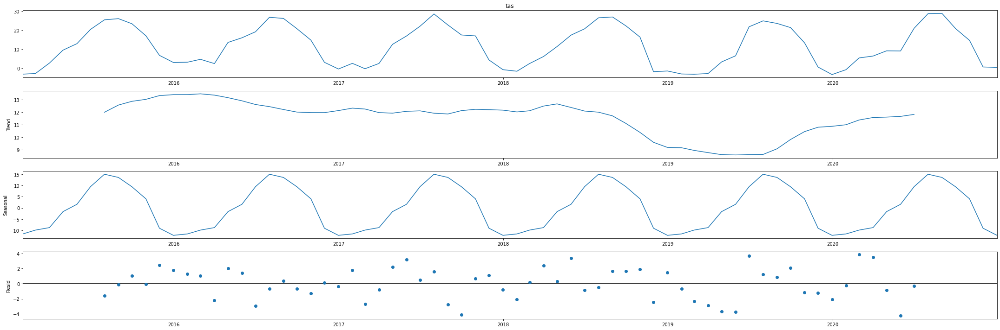

In [ ]:

CA_ssp126_TaiESM1_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp126_TaiESM1_monthly_avg_temp, model='additive')
fig = CA_ssp126_TaiESM1_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

####R Square

In [ ]:
CA_ssp585_TaiESM1_model = LinearRegression()
x = CA_ssp585_TaiESM1_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
CA_ssp585_TaiESM1_model.fit(x, y)
CA_ssp585_TaiESM1_r_squared =CA_ssp585_TaiESM1_model.score(x, y)
CA_ssp585_TaiESM1_r_squared

0.9005830191994867

In [ ]:
CA_ssp126_TaiESM1_model = LinearRegression()
x = CA_ssp126_TaiESM1_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
CA_ssp126_TaiESM1_model.fit(x, y)
CA_ssp126_TaiESM1_r_squared =CA_ssp126_TaiESM1_model.score(x, y)
CA_ssp126_TaiESM1_r_squared

0.8759820013939972

#### seasonal analysis

In [ ]:
month = CA_ssp585_TaiESM1_monthly_avg_temp.index.month
CA_ssp585_TaiESM1_winter = pd.concat([CA_ssp585_TaiESM1_monthly_avg_temp[month == 1], CA_ssp585_TaiESM1_monthly_avg_temp[month == 2],CA_ssp585_TaiESM1_monthly_avg_temp[month == 12]])
CA_ssp585_TaiESM1_spring = pd.concat([CA_ssp585_TaiESM1_monthly_avg_temp[month == 3], CA_ssp585_TaiESM1_monthly_avg_temp[month == 4],CA_ssp585_TaiESM1_monthly_avg_temp[month == 5]])
CA_ssp585_TaiESM1_summer = pd.concat([CA_ssp585_TaiESM1_monthly_avg_temp[month == 6], CA_ssp585_TaiESM1_monthly_avg_temp[month == 7],CA_ssp585_TaiESM1_monthly_avg_temp[month == 8]])
CA_ssp585_TaiESM1_fall = pd.concat([CA_ssp585_TaiESM1_monthly_avg_temp[month == 9], CA_ssp585_TaiESM1_monthly_avg_temp[month == 10],CA_ssp585_TaiESM1_monthly_avg_temp[month == 11]])
CA_ssp585_TaiESM1_winter.sort_index()
CA_ssp585_TaiESM1_spring.sort_index()
CA_ssp585_TaiESM1_summer.sort_index()
CA_ssp585_TaiESM1_fall.sort_index()

time
2015-09-30    20.040662
2015-10-31    13.295329
2015-11-30     5.312322
2016-09-30    22.123511
2016-10-31    17.301351
2016-11-30     7.220592
2017-09-30    23.330756
2017-10-31    14.236623
2017-11-30     6.945641
2018-09-30    19.597877
2018-10-31    14.453924
2018-11-30     6.436946
2019-09-30    20.919734
2019-10-31    17.886892
2019-11-30     5.870125
2020-09-30    23.488185
2020-10-31    12.826734
2020-11-30     0.359036
Name: tas, dtype: float64

In [ ]:
month = CA_ssp126_TaiESM1_monthly_avg_temp.index.month
CA_ssp126_TaiESM1_winter = pd.concat([CA_ssp126_TaiESM1_monthly_avg_temp[month == 1], CA_ssp126_TaiESM1_monthly_avg_temp[month == 2],CA_ssp126_TaiESM1_monthly_avg_temp[month == 12]])
CA_ssp126_TaiESM1_spring = pd.concat([CA_ssp126_TaiESM1_monthly_avg_temp[month == 3], CA_ssp126_TaiESM1_monthly_avg_temp[month == 4],CA_ssp126_TaiESM1_monthly_avg_temp[month == 5]])
CA_ssp126_TaiESM1_summer = pd.concat([CA_ssp126_TaiESM1_monthly_avg_temp[month == 6], CA_ssp126_TaiESM1_monthly_avg_temp[month == 7],CA_ssp126_TaiESM1_monthly_avg_temp[month == 8]])
CA_ssp126_TaiESM1_fall = pd.concat([CA_ssp126_TaiESM1_monthly_avg_temp[month == 9], CA_ssp126_TaiESM1_monthly_avg_temp[month == 10],CA_ssp126_TaiESM1_monthly_avg_temp[month == 11]])
CA_ssp126_TaiESM1_winter.sort_index()
CA_ssp126_TaiESM1_spring.sort_index()
CA_ssp126_TaiESM1_summer.sort_index()
CA_ssp126_TaiESM1_fall.sort_index()

time
2015-09-30    23.346645
2015-10-31    17.000760
2015-11-30     6.699973
2016-09-30    20.739244
2016-10-31    14.707748
2016-11-30     3.028363
2017-09-30    17.432445
2017-10-31    16.958697
2017-11-30     4.271513
2018-09-30    22.204925
2018-10-31    16.321763
2018-11-30    -1.905635
2019-09-30    21.316702
2019-10-31    13.307005
2019-11-30     0.533926
2020-09-30    20.816061
2020-10-31    14.585356
2020-11-30     0.583610
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = CA_ssp126_TaiESM1_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.01503743117040135
coef:  [[0.11935402]]
intercept:  [6.57758592]


In [ ]:
x = CA_ssp126_TaiESM1_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.4399815185215653
coef:  [[0.63966112]]
intercept:  [11.51105816]


In [ ]:
x = CA_ssp126_TaiESM1_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.42971005431777765
coef:  [[0.39506616]]
intercept:  [23.92274844]


In [ ]:
x = CA_ssp126_TaiESM1_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.7898010181994869
coef:  [[0.71851178]]
intercept:  [12.99711151]


#####ssp585

In [ ]:
x = CA_ssp585_TaiESM1_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.040521718478849666
coef:  [[0.25419732]]
intercept:  [6.60239421]


In [ ]:
x = CA_ssp585_TaiESM1_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.550582614595788
coef:  [[0.69039262]]
intercept:  [10.38934259]


In [ ]:
x = CA_ssp585_TaiESM1_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.18956189901089615
coef:  [[0.35638031]]
intercept:  [24.90660056]


In [ ]:
x = CA_ssp585_TaiESM1_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.7553686142203194
coef:  [[0.82528459]]
intercept:  [10.71813359]


### CA_NEX_INM-CM4-8

#### ssp585

In [ ]:
#https://drive.google.com/file/d/1UixE8hagrP0ARErizXa4x46SrHrEIYBM/view?usp=sharing
id = "1UixE8hagrP0ARErizXa4x46SrHrEIYBM"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp585_INM-CM4-8.csv')

CA_ssp585_INM_CM4_8 = pd.read_csv('CA_ssp585_INM-CM4-8.csv', parse_dates=['time'], index_col='time')
CA_ssp585_INM_CM4_8.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,1.224854
2015-01-01,39.125,-119.875,1.480530
2015-01-01,39.125,-119.625,2.082825
2015-01-01,39.125,-119.375,0.904968
2015-01-01,39.125,-119.125,2.626770


In [ ]:
CA_ssp585_INM_CM4_8

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,1.224854
2015-01-01,39.125,-119.875,1.480530
2015-01-01,39.125,-119.625,2.082825
2015-01-01,39.125,-119.375,0.904968
2015-01-01,39.125,-119.125,2.626770
...,...,...,...
2020-12-29,36.375,-118.125,-0.582458
2020-12-29,36.375,-117.875,4.938019
2020-12-29,36.375,-117.625,2.683929


In [ ]:
CA_ssp585_INM_CM4_8['tas'].isnull().sum()

0

In [ ]:
CA_ssp585_INM_CM4_8_avg_temp = CA_ssp585_INM_CM4_8.groupby(CA_ssp585_INM_CM4_8.index)['tas'].mean()
CA_ssp585_INM_CM4_8_avg_temp

time
2015-01-01    2.830384
2015-01-02    4.009329
2015-01-03    5.100587
2015-01-04    0.115894
2015-01-05    4.227963
                ...   
2020-12-25    0.349163
2020-12-26   -2.655001
2020-12-27   -0.807136
2020-12-28   -3.156749
2020-12-29    0.103339
Name: tas, Length: 2190, dtype: float64

In [ ]:
CA_ssp585_INM_CM4_8_monthly_avg_temp = CA_ssp585_INM_CM4_8_avg_temp.resample('M').mean()
CA_ssp585_INM_CM4_8_monthly_avg_temp

time
2015-01-31     2.559152
2015-02-28     2.890744
2015-03-31     5.217350
2015-04-30    10.295215
2015-05-31    14.741675
                ...    
2020-08-31    17.884335
2020-09-30    16.859693
2020-10-31    11.646021
2020-11-30     8.781886
2020-12-31     1.954831
Freq: M, Name: tas, Length: 72, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/1ST-CAOsR9SuFVUp5QCmSEq_1mhCRia-9/view?usp=sharing
id = "1ST-CAOsR9SuFVUp5QCmSEq_1mhCRia-9"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp126_INM_CM4_8.csv')

CA_ssp126_INM_CM4_8 = pd.read_csv('CA_ssp126_INM_CM4_8.csv', parse_dates=['time'], index_col='time')
CA_ssp126_INM_CM4_8.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,0.946716
2015-01-01,39.125,-119.875,1.172668
2015-01-01,39.125,-119.625,1.728668
2015-01-01,39.125,-119.375,0.504517
2015-01-01,39.125,-119.125,2.179993


In [ ]:
CA_ssp126_INM_CM4_8['tas'].isnull().sum()

0

In [ ]:
CA_ssp126_INM_CM4_8_avg_temp = CA_ssp126_INM_CM4_8.groupby(CA_ssp126_INM_CM4_8.index)['tas'].mean()
CA_ssp126_INM_CM4_8_avg_temp

time
2015-01-01     2.330839
2015-01-02     3.470095
2015-01-03     4.575022
2015-01-04     0.267023
2015-01-05     4.218730
                ...    
2020-12-25     5.199856
2020-12-26    -0.410910
2020-12-27    -4.617512
2020-12-28   -15.793954
2020-12-29   -17.357782
Name: tas, Length: 2190, dtype: float64

In [ ]:
CA_ssp126_INM_CM4_8_monthly_avg_temp = CA_ssp126_INM_CM4_8_avg_temp.resample('M').mean()
CA_ssp126_INM_CM4_8_monthly_avg_temp 

time
2015-01-31     4.633979
2015-02-28     7.349727
2015-03-31     6.241956
2015-04-30     9.574654
2015-05-31    15.811434
                ...    
2020-08-31    20.806864
2020-09-30    17.306425
2020-10-31    13.266710
2020-11-30     5.439056
2020-12-31     4.146572
Freq: M, Name: tas, Length: 72, dtype: float64

#### compare modis with ssp585 and ssp126

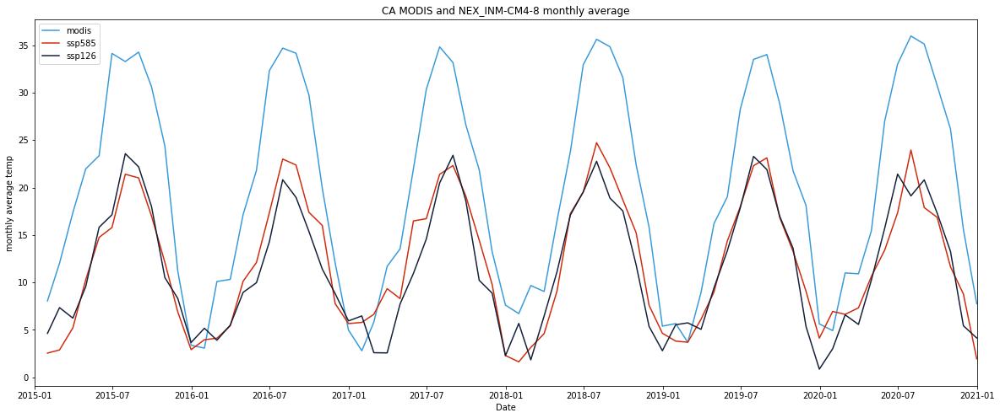

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(CA_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(CA_ssp585_INM_CM4_8_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(CA_ssp126_INM_CM4_8_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('CA MODIS and NEX_INM-CM4-8 monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
CA_ssp585_INM_CM4_8_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp585_INM_CM4_8_monthly_avg_temp)) 
CA_ssp585_INM_CM4_8_monthly_rmse

9.246718769475438

In [ ]:
CA_ssp126_INM_CM4_8_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp126_INM_CM4_8_monthly_avg_temp)) 
CA_ssp126_INM_CM4_8_monthly_rmse

9.813268528982702

#### time series analysis

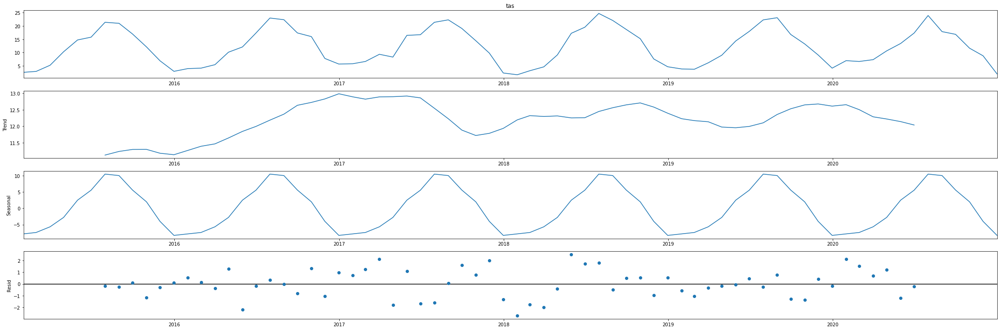

In [ ]:

CA_ssp585_INM_CM4_8_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp585_INM_CM4_8_monthly_avg_temp, model='additive')
fig = CA_ssp585_INM_CM4_8_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

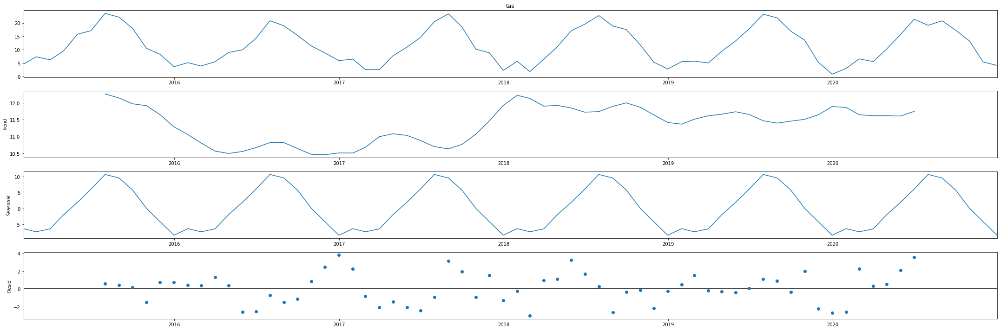

In [ ]:

CA_ssp126_INM_CM4_8_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp126_INM_CM4_8_monthly_avg_temp, model='additive')
fig = CA_ssp126_INM_CM4_8_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

####R Square

In [ ]:
CA_ssp585_INM_CM4_8_model = LinearRegression()
x = CA_ssp585_INM_CM4_8_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
CA_ssp585_INM_CM4_8_model.fit(x, y)
CA_ssp585_INM_CM4_8_r_squared =CA_ssp585_INM_CM4_8_model.score(x, y)
CA_ssp585_INM_CM4_8_r_squared

0.8899694474770107

In [ ]:
CA_ssp126_INM_CM4_8_model = LinearRegression()
x = CA_ssp126_INM_CM4_8_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
CA_ssp126_INM_CM4_8_model.fit(x, y)
CA_ssp126_INM_CM4_8_r_squared =CA_ssp126_INM_CM4_8_model.score(x, y)
CA_ssp126_INM_CM4_8_r_squared

0.873657276344262

#### seasonal analysis

In [ ]:
month = CA_ssp585_INM_CM4_8_monthly_avg_temp.index.month
CA_ssp585_INM_CM4_8_winter = pd.concat([CA_ssp585_INM_CM4_8_monthly_avg_temp[month == 1], CA_ssp585_INM_CM4_8_monthly_avg_temp[month == 2],CA_ssp585_INM_CM4_8_monthly_avg_temp[month == 12]])
CA_ssp585_INM_CM4_8_spring = pd.concat([CA_ssp585_INM_CM4_8_monthly_avg_temp[month == 3], CA_ssp585_INM_CM4_8_monthly_avg_temp[month == 4],CA_ssp585_INM_CM4_8_monthly_avg_temp[month == 5]])
CA_ssp585_INM_CM4_8_summer = pd.concat([CA_ssp585_INM_CM4_8_monthly_avg_temp[month == 6], CA_ssp585_INM_CM4_8_monthly_avg_temp[month == 7],CA_ssp585_INM_CM4_8_monthly_avg_temp[month == 8]])
CA_ssp585_INM_CM4_8_fall = pd.concat([CA_ssp585_INM_CM4_8_monthly_avg_temp[month == 9], CA_ssp585_INM_CM4_8_monthly_avg_temp[month == 10],CA_ssp585_INM_CM4_8_monthly_avg_temp[month == 11]])
CA_ssp585_INM_CM4_8_winter.sort_index()
CA_ssp585_INM_CM4_8_spring.sort_index()
CA_ssp585_INM_CM4_8_summer.sort_index()
CA_ssp585_INM_CM4_8_fall.sort_index()

time
2015-09-30    16.987030
2015-10-31    12.124897
2015-11-30     6.898145
2016-09-30    17.388530
2016-10-31    16.010859
2016-11-30     7.769787
2017-09-30    19.081449
2017-10-31    14.456063
2017-11-30     9.802375
2018-09-30    18.705422
2018-10-31    15.226858
2018-11-30     7.592540
2019-09-30    16.821879
2019-10-31    13.257709
2019-11-30     9.074570
2020-09-30    16.859693
2020-10-31    11.646021
2020-11-30     8.781886
Name: tas, dtype: float64

In [ ]:
month = CA_ssp126_INM_CM4_8_monthly_avg_temp.index.month
CA_ssp126_INM_CM4_8_winter = pd.concat([CA_ssp126_INM_CM4_8_monthly_avg_temp[month == 1], CA_ssp126_INM_CM4_8_monthly_avg_temp[month == 2],CA_ssp126_INM_CM4_8_monthly_avg_temp[month == 12]])
CA_ssp126_INM_CM4_8_spring = pd.concat([CA_ssp126_INM_CM4_8_monthly_avg_temp[month == 3], CA_ssp126_INM_CM4_8_monthly_avg_temp[month == 4],CA_ssp126_INM_CM4_8_monthly_avg_temp[month == 5]])
CA_ssp126_INM_CM4_8_summer = pd.concat([CA_ssp126_INM_CM4_8_monthly_avg_temp[month == 6], CA_ssp126_INM_CM4_8_monthly_avg_temp[month == 7],CA_ssp126_INM_CM4_8_monthly_avg_temp[month == 8]])
CA_ssp126_INM_CM4_8_fall = pd.concat([CA_ssp126_INM_CM4_8_monthly_avg_temp[month == 9], CA_ssp126_INM_CM4_8_monthly_avg_temp[month == 10],CA_ssp126_INM_CM4_8_monthly_avg_temp[month == 11]])
CA_ssp126_INM_CM4_8_winter.sort_index()
CA_ssp126_INM_CM4_8_spring.sort_index()
CA_ssp126_INM_CM4_8_summer.sort_index()
CA_ssp126_INM_CM4_8_fall.sort_index()

time
2015-09-30    17.990606
2015-10-31    10.511896
2015-11-30     8.316564
2016-09-30    15.376502
2016-10-31    11.416908
2016-11-30     8.825836
2017-09-30    18.577991
2017-10-31    10.225098
2017-11-30     8.878443
2018-09-30    17.532073
2018-10-31    11.839275
2018-11-30     5.372617
2019-09-30    16.957754
2019-10-31    13.588783
2019-11-30     5.359657
2020-09-30    17.306425
2020-10-31    13.266710
2020-11-30     5.439056
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = CA_ssp126_INM_CM4_8_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.0073549481900893054
coef:  [[0.12881263]]
intercept:  [6.01465333]


In [ ]:
x = CA_ssp126_INM_CM4_8_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.7180790727181676
coef:  [[1.15302373]]
intercept:  [6.02547818]


In [ ]:
x = CA_ssp126_INM_CM4_8_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.18339538759637886
coef:  [[0.28698573]]
intercept:  [27.81943408]


In [ ]:
x = CA_ssp126_INM_CM4_8_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.7466995549129469
coef:  [[1.29518624]]
intercept:  [6.65738078]


#####ssp585

In [ ]:
x = CA_ssp585_INM_CM4_8_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.040670898606597006
coef:  [[-0.33549249]]
intercept:  [7.94507277]


In [ ]:
x = CA_ssp585_INM_CM4_8_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.668031071953748
coef:  [[1.16955501]]
intercept:  [5.05844093]


In [ ]:
x = CA_ssp585_INM_CM4_8_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.3243971992509186
coef:  [[0.38900154]]
intercept:  [25.57255377]


In [ ]:
x = CA_ssp585_INM_CM4_8_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.7715577407567936
coef:  [[1.4447283]]
intercept:  [3.11439507]


### CA_NEX_NorESM2-MM

#### ssp585

In [ ]:
#https://drive.google.com/file/d/15AbukQ4atgFYe2XCmumUTJkdg77OBxkS/view?usp=sharing
id = "15AbukQ4atgFYe2XCmumUTJkdg77OBxkS"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp585_NorESM2-MM.csv')

CA_ssp585_NorESM2_MM = pd.read_csv('CA_ssp585_NorESM2-MM.csv', parse_dates=['time'], index_col='time')
CA_ssp585_NorESM2_MM.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,2.459167
2015-01-01,39.125,-119.875,2.847534
2015-01-01,39.125,-119.625,3.628113
2015-01-01,39.125,-119.375,2.628509
2015-01-01,39.125,-119.125,4.528595


In [ ]:
CA_ssp585_NorESM2_MM

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,2.459167
2015-01-01,39.125,-119.875,2.847534
2015-01-01,39.125,-119.625,3.628113
2015-01-01,39.125,-119.375,2.628509
2015-01-01,39.125,-119.125,4.528595
...,...,...,...
2020-12-29,36.375,-118.125,1.526062
2020-12-29,36.375,-117.875,7.054077
2020-12-29,36.375,-117.625,4.892700


In [ ]:
CA_ssp585_NorESM2_MM['tas'].isnull().sum()

0

In [ ]:
CA_ssp585_NorESM2_MM_avg_temp = CA_ssp585_NorESM2_MM.groupby(CA_ssp585_NorESM2_MM.index)['tas'].mean()
CA_ssp585_NorESM2_MM_avg_temp

time
2015-01-01    4.055997
2015-01-02    3.137341
2015-01-03    5.790811
2015-01-04    7.891404
2015-01-05    6.992610
                ...   
2020-12-25    4.517357
2020-12-26    5.682464
2020-12-27    5.837793
2020-12-28    6.572393
2020-12-29    3.909379
Name: tas, Length: 2190, dtype: float64

In [ ]:
CA_ssp585_NorESM2_MM_monthly_avg_temp = CA_ssp585_NorESM2_MM_avg_temp.resample('M').mean()
CA_ssp585_NorESM2_MM_monthly_avg_temp

time
2015-01-31     3.703823
2015-02-28     5.335466
2015-03-31     5.848135
2015-04-30     9.131573
2015-05-31    14.476518
                ...    
2020-08-31    21.392013
2020-09-30    20.282495
2020-10-31    16.058500
2020-11-30     5.943398
2020-12-31     6.482750
Freq: M, Name: tas, Length: 72, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/1e34bUqls3Xq0rAZUp2UXOqIofRN-TUrW/view?usp=sharing
id = "1e34bUqls3Xq0rAZUp2UXOqIofRN-TUrW"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp126_NorESM2-MM.csv')

CA_ssp126_NorESM2_MM = pd.read_csv('CA_ssp126_NorESM2-MM.csv', parse_dates=['time'], index_col='time')
CA_ssp126_NorESM2_MM.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,2.348389
2015-01-01,39.125,-119.875,2.739533
2015-01-01,39.125,-119.625,3.511108
2015-01-01,39.125,-119.375,2.502563
2015-01-01,39.125,-119.125,4.393707


In [ ]:
CA_ssp126_NorESM2_MM['tas'].isnull().sum()

0

In [ ]:
CA_ssp126_NorESM2_MM_avg_temp = CA_ssp126_NorESM2_MM.groupby(CA_ssp126_NorESM2_MM.index)['tas'].mean()
CA_ssp126_NorESM2_MM_avg_temp

time
2015-01-01    4.058230
2015-01-02    3.174884
2015-01-03    6.411533
2015-01-04    8.367914
2015-01-05    7.291137
                ...   
2020-12-25    4.967522
2020-12-26    1.778803
2020-12-27    3.482001
2020-12-28   -1.381661
2020-12-29   -2.028622
Name: tas, Length: 2190, dtype: float64

In [ ]:
CA_ssp126_NorESM2_MM_monthly_avg_temp = CA_ssp126_NorESM2_MM_avg_temp.resample('M').mean()
CA_ssp126_NorESM2_MM_monthly_avg_temp 

time
2015-01-31     2.707546
2015-02-28     6.133097
2015-03-31     6.500184
2015-04-30     7.282710
2015-05-31    16.469530
                ...    
2020-08-31    24.145677
2020-09-30    21.015161
2020-10-31    13.544867
2020-11-30     5.888822
2020-12-31     4.484091
Freq: M, Name: tas, Length: 72, dtype: float64

#### compare modis with ssp585 and ssp126

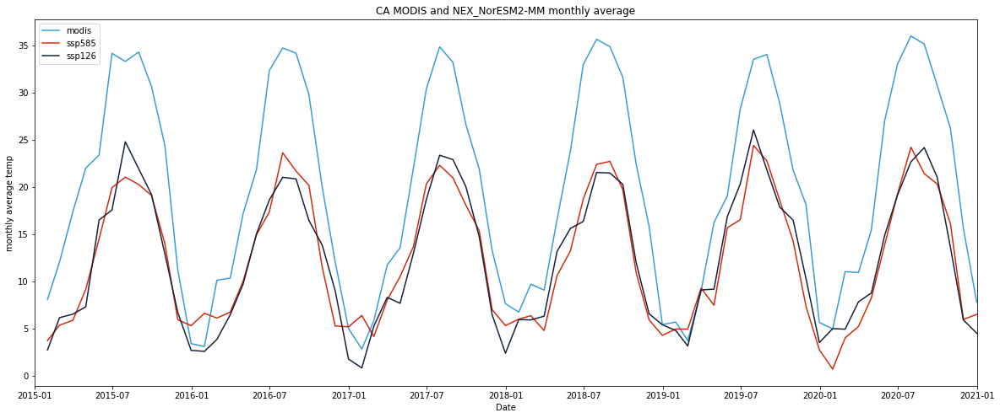

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(CA_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(CA_ssp585_NorESM2_MM_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(CA_ssp126_NorESM2_MM_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('CA MODIS and NEX_NorESM2-MM monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
CA_ssp585_NorESM2_MM_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp585_NorESM2_MM_monthly_avg_temp)) 
CA_ssp585_NorESM2_MM_monthly_rmse

8.92873782716493

In [ ]:
CA_ssp126_NorESM2_MM_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp126_NorESM2_MM_monthly_avg_temp)) 
CA_ssp126_NorESM2_MM_monthly_rmse

8.782537562100153

#### time series analysis

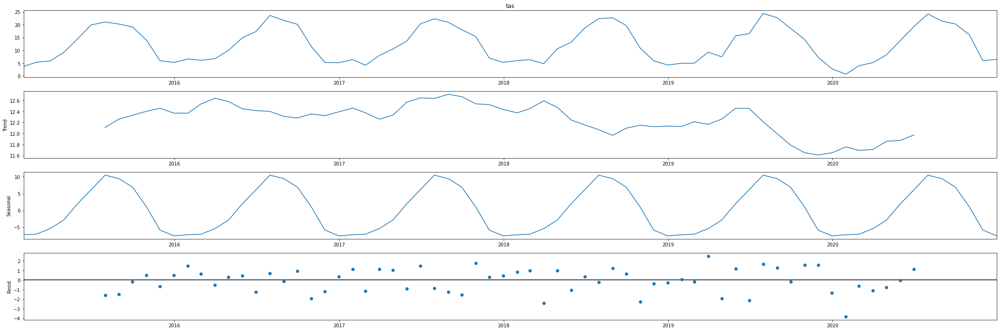

In [ ]:

CA_ssp585_NorESM2_MM_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp585_NorESM2_MM_monthly_avg_temp, model='additive')
fig = CA_ssp585_NorESM2_MM_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

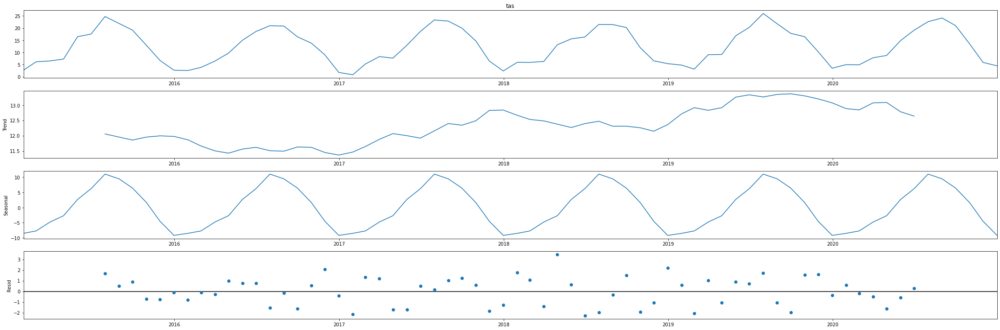

In [ ]:

CA_ssp126_NorESM2_MM_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp126_NorESM2_MM_monthly_avg_temp, model='additive')
fig = CA_ssp126_NorESM2_MM_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

####R Square

In [ ]:
CA_ssp585_NorESM2_MM_model = LinearRegression()
x = CA_ssp585_NorESM2_MM_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
CA_ssp585_NorESM2_MM_model.fit(x, y)
CA_ssp585_NorESM2_MM_r_squared =CA_ssp585_NorESM2_MM_model.score(x, y)
CA_ssp585_NorESM2_MM_r_squared

0.9063494629949196

In [ ]:
CA_ssp126_NorESM2_MM_model = LinearRegression()
x = CA_ssp126_NorESM2_MM_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
CA_ssp126_NorESM2_MM_model.fit(x, y)
CA_ssp126_NorESM2_MM_r_squared =CA_ssp126_NorESM2_MM_model.score(x, y)
CA_ssp126_NorESM2_MM_r_squared

0.9050557519434396

#### seasonal analysis

### CA_NEX_NorESM2_LM

#### ssp585

In [ ]:
#https://drive.google.com/file/d/1H-ca6Y7nlhXsdvZX3Rq0Y36L_1nxBDrK/view?usp=share_link
id = "1H-ca6Y7nlhXsdvZX3Rq0Y36L_1nxBDrK"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp585_NorESM2-LM.csv')

CA_ssp585_NorESM2_LM = pd.read_csv('CA_ssp585_NorESM2-LM.csv', parse_dates=['time'], index_col='time')
CA_ssp585_NorESM2_LM.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,-1.610657
2015-01-01,39.125,-119.875,-1.511566
2015-01-01,39.125,-119.625,-1.195984
2015-01-01,39.125,-119.375,-2.660522
2015-01-01,39.125,-119.125,-1.225403


In [ ]:
CA_ssp585_NorESM2_LM

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,-1.610657
2015-01-01,39.125,-119.875,-1.511566
2015-01-01,39.125,-119.625,-1.195984
2015-01-01,39.125,-119.375,-2.660522
2015-01-01,39.125,-119.125,-1.225403
...,...,...,...
2020-12-29,36.375,-118.125,-2.925232
2020-12-29,36.375,-117.875,2.592102
2020-12-29,36.375,-117.625,0.420044


In [ ]:
CA_ssp585_NorESM2_LM['tas'].isnull().sum()

0

In [ ]:
CA_ssp585_NorESM2_LM_avg_temp = CA_ssp585_NorESM2_LM.groupby(CA_ssp585_NorESM2_LM.index)['tas'].mean()
CA_ssp585_NorESM2_LM_avg_temp

time
2015-01-01   -1.854336
2015-01-02   -0.728954
2015-01-03   -3.590370
2015-01-04   -2.025652
2015-01-05   -0.117355
                ...   
2020-12-25    3.312877
2020-12-26    1.423811
2020-12-27    1.236679
2020-12-28    0.977691
2020-12-29   -0.039684
Name: tas, Length: 2190, dtype: float64

In [ ]:
CA_ssp585_NorESM2_LM_monthly_avg_temp = CA_ssp585_NorESM2_LM_avg_temp.resample('M').mean()
CA_ssp585_NorESM2_LM_monthly_avg_temp

time
2015-01-31     4.114818
2015-02-28     4.775496
2015-03-31     7.568469
2015-04-30    10.571609
2015-05-31    10.646283
                ...    
2020-08-31    21.982942
2020-09-30    20.055259
2020-10-31    13.740051
2020-11-30     6.933471
2020-12-31     2.220735
Freq: M, Name: tas, Length: 72, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/1wiCMGGl5DZM3tRrWV7dVAgG_Eik_j7xC/view?usp=share_link
id = "1wiCMGGl5DZM3tRrWV7dVAgG_Eik_j7xC"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp126_NorESM2-LM.csv')

CA_ssp126_NorESM2_LM = pd.read_csv('CA_ssp126_NorESM2-LM.csv', parse_dates=['time'], index_col='time')
CA_ssp126_NorESM2_LM.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,-1.753113
2015-01-01,39.125,-119.875,-1.669464
2015-01-01,39.125,-119.625,-1.356506
2015-01-01,39.125,-119.375,-2.823730
2015-01-01,39.125,-119.125,-1.391235


In [ ]:
CA_ssp126_NorESM2_LM['tas'].isnull().sum()

0

In [ ]:
CA_ssp126_NorESM2_LM_avg_temp = CA_ssp126_NorESM2_LM.groupby(CA_ssp126_NorESM2_LM.index)['tas'].mean()
CA_ssp126_NorESM2_LM_avg_temp

time
2015-01-01   -1.882624
2015-01-02   -0.999357
2015-01-03   -3.657898
2015-01-04   -2.216162
2015-01-05   -0.213767
                ...   
2020-12-25    3.663126
2020-12-26    5.528904
2020-12-27    6.791296
2020-12-28    5.994638
2020-12-29    7.519191
Name: tas, Length: 2190, dtype: float64

In [ ]:
CA_ssp126_NorESM2_LM_monthly_avg_temp = CA_ssp126_NorESM2_LM_avg_temp.resample('M').mean()
CA_ssp126_NorESM2_LM_monthly_avg_temp 

time
2015-01-31     4.409806
2015-02-28     3.973613
2015-03-31     6.635875
2015-04-30     9.865150
2015-05-31    13.078020
                ...    
2020-08-31    22.523115
2020-09-30    19.194585
2020-10-31    13.258354
2020-11-30     8.812238
2020-12-31     4.727669
Freq: M, Name: tas, Length: 72, dtype: float64

#### compare modis with ssp585 and ssp126

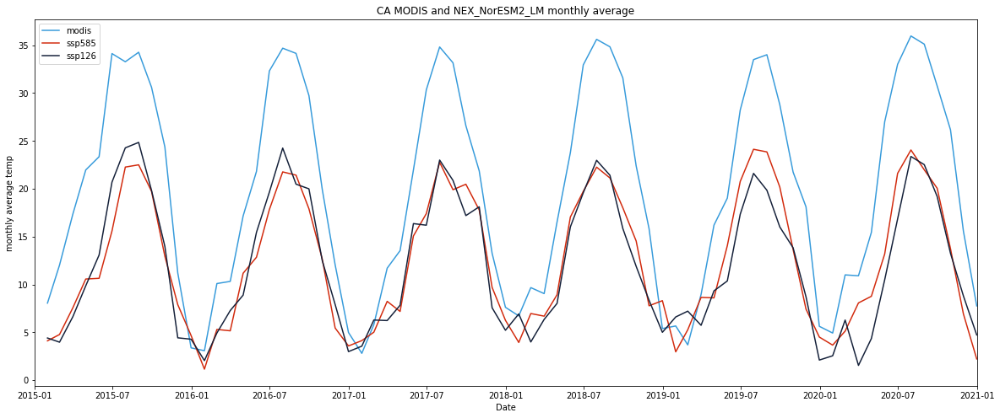

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(CA_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(CA_ssp585_NorESM2_LM_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(CA_ssp126_NorESM2_LM_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('CA MODIS and NEX_NorESM2_LM monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
CA_ssp585_NorESM2_LM_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp585_NorESM2_LM_monthly_avg_temp)) 
CA_ssp585_NorESM2_LM_monthly_rmse

8.820023410173595

In [ ]:
CA_ssp126_NorESM2_LM_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp126_NorESM2_LM_monthly_avg_temp)) 
CA_ssp126_NorESM2_LM_monthly_rmse

9.164235725697829

#### time series analysis

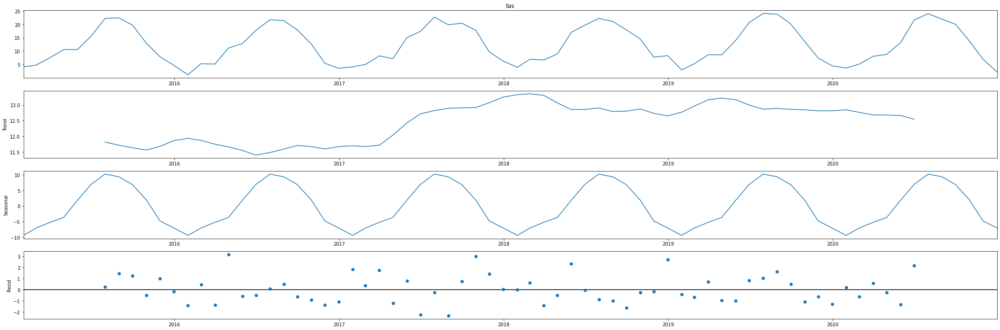

In [ ]:

CA_ssp585_NorESM2_LM_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp585_NorESM2_LM_monthly_avg_temp, model='additive')
fig = CA_ssp585_NorESM2_LM_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

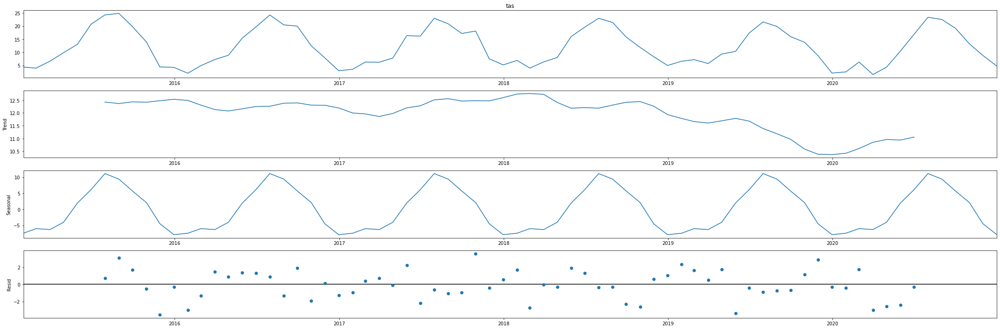

In [ ]:

CA_ssp126_NorESM2_LM_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp126_NorESM2_LM_monthly_avg_temp, model='additive')
fig = CA_ssp126_NorESM2_LM_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

#### R square

In [ ]:
CA_ssp585_NorESM2_LM_model = LinearRegression()
x = CA_ssp585_NorESM2_LM_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
CA_ssp585_NorESM2_LM_model.fit(x, y)
CA_ssp585_NorESM2_LM_r_squared =CA_ssp585_NorESM2_LM_model.score(x, y)
CA_ssp585_NorESM2_LM_r_squared

0.9058906979914503

In [ ]:
CA_ssp126_NorESM2_LM_model = LinearRegression()
x = CA_ssp126_NorESM2_LM_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)


In [ ]:
CA_ssp126_NorESM2_LM_model.fit(x, y)
CA_ssp126_NorESM2_LM_r_squared = CA_ssp126_NorESM2_LM_model.score(x, y)
CA_ssp126_NorESM2_LM_r_squared

0.8961157511601326

#### seasonal analysis

In [ ]:
month = CA_ssp585_NorESM2_LM_monthly_avg_temp.index.month
CA_ssp585_NorESM2_LM_winter = pd.concat([CA_ssp585_NorESM2_LM_monthly_avg_temp[month == 1], CA_ssp585_NorESM2_LM_monthly_avg_temp[month == 2],CA_ssp585_NorESM2_LM_monthly_avg_temp[month == 12]])
CA_ssp585_NorESM2_LM_spring = pd.concat([CA_ssp585_NorESM2_LM_monthly_avg_temp[month == 3], CA_ssp585_NorESM2_LM_monthly_avg_temp[month == 4],CA_ssp585_NorESM2_LM_monthly_avg_temp[month == 5]])
CA_ssp585_NorESM2_LM_summer = pd.concat([CA_ssp585_NorESM2_LM_monthly_avg_temp[month == 6], CA_ssp585_NorESM2_LM_monthly_avg_temp[month == 7],CA_ssp585_NorESM2_LM_monthly_avg_temp[month == 8]])
CA_ssp585_NorESM2_LM_fall = pd.concat([CA_ssp585_NorESM2_LM_monthly_avg_temp[month == 9], CA_ssp585_NorESM2_LM_monthly_avg_temp[month == 10],CA_ssp585_NorESM2_LM_monthly_avg_temp[month == 11]])
CA_ssp585_NorESM2_LM_winter.sort_index()
CA_ssp585_NorESM2_LM_spring.sort_index()
CA_ssp585_NorESM2_LM_summer.sort_index()
CA_ssp585_NorESM2_LM_fall.sort_index()

time
2015-09-30    19.729915
2015-10-31    12.947435
2015-11-30     7.895243
2016-09-30    17.915570
2016-10-31    12.657700
2016-11-30     5.451576
2017-09-30    20.475214
2017-10-31    17.793375
2017-11-30     9.697150
2018-09-30    18.013867
2018-10-31    14.545307
2018-11-30     7.776287
2019-09-30    20.192312
2019-10-31    13.653212
2019-11-30     7.426772
2020-09-30    20.055259
2020-10-31    13.740051
2020-11-30     6.933471
Name: tas, dtype: float64

In [ ]:
month = CA_ssp126_NorESM2_LM_monthly_avg_temp.index.month
CA_ssp126_NorESM2_LM_winter = pd.concat([CA_ssp126_NorESM2_LM_monthly_avg_temp[month == 1], CA_ssp126_NorESM2_LM_monthly_avg_temp[month == 2],CA_ssp126_NorESM2_LM_monthly_avg_temp[month == 12]])
CA_ssp126_NorESM2_LM_spring = pd.concat([CA_ssp126_NorESM2_LM_monthly_avg_temp[month == 3], CA_ssp126_NorESM2_LM_monthly_avg_temp[month == 4],CA_ssp126_NorESM2_LM_monthly_avg_temp[month == 5]])
CA_ssp126_NorESM2_LM_summer = pd.concat([CA_ssp126_NorESM2_LM_monthly_avg_temp[month == 6], CA_ssp126_NorESM2_LM_monthly_avg_temp[month == 7],CA_ssp126_NorESM2_LM_monthly_avg_temp[month == 8]])
CA_ssp126_NorESM2_LM_fall = pd.concat([CA_ssp126_NorESM2_LM_monthly_avg_temp[month == 9], CA_ssp126_NorESM2_LM_monthly_avg_temp[month == 10],CA_ssp126_NorESM2_LM_monthly_avg_temp[month == 11]])
CA_ssp126_NorESM2_LM_winter.sort_index()
CA_ssp126_NorESM2_LM_spring.sort_index()
CA_ssp126_NorESM2_LM_summer.sort_index()
CA_ssp126_NorESM2_LM_fall.sort_index()

time
2015-09-30    19.825859
2015-10-31    13.972932
2015-11-30     4.428122
2016-09-30    19.995216
2016-10-31    12.499471
2016-11-30     7.911582
2017-09-30    17.200069
2017-10-31    18.118983
2017-11-30     7.566101
2018-09-30    15.851434
2018-10-31    11.898823
2018-11-30     8.355573
2019-09-30    16.016962
2019-10-31    13.837122
2019-11-30     8.710081
2020-09-30    19.194585
2020-10-31    13.258354
2020-11-30     8.812238
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = CA_ssp126_NorESM2_LM_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.040480274203870015
coef:  [[0.34511769]]
intercept:  [4.98112416]


In [ ]:
x = CA_ssp126_NorESM2_LM_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.5928015068094938
coef:  [[1.04534932]]
intercept:  [7.48928785]


In [ ]:
x = CA_ssp126_NorESM2_LM_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.5320156321752048
coef:  [[0.5329802]]
intercept:  [22.32896441]


In [ ]:
x = CA_ssp126_NorESM2_LM_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8302596847451468
coef:  [[1.30063853]]
intercept:  [5.098055]


#####ssp585

In [ ]:
x = CA_ssp585_NorESM2_LM_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.08677807682531857
coef:  [[0.49226702]]
intercept:  [4.33275698]


In [ ]:
x = CA_ssp585_NorESM2_LM_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.6268308737372909
coef:  [[1.36552291]]
intercept:  [3.16137376]


In [ ]:
x = CA_ssp585_NorESM2_LM_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.1776396040861874
coef:  [[0.33813482]]
intercept:  [26.41819993]


In [ ]:
x = CA_ssp585_NorESM2_LM_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8165958962443532
coef:  [[1.18056886]]
intercept:  [6.06244746]


###CA_NEX_MPI_ESM1_2_HR

####SSP585

In [ ]:
#https://drive.google.com/file/d/1ORFwCaelZu87OxmcWQTQuX-p8LiNkem9/view?usp=share_link
id = "1ORFwCaelZu87OxmcWQTQuX-p8LiNkem9"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp585_MPI_ESM1_2_HR.csv')

CA_ssp585_MPI_ESM1_2_HR = pd.read_csv('CA_ssp585_MPI_ESM1_2_HR.csv', parse_dates=['time'], index_col='time')
CA_ssp585_MPI_ESM1_2_HR.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,-120.125,6.393036
2015-01-01,1,36.375,-119.875,6.025330
2015-01-01,2,36.375,-119.625,6.072144
2015-01-01,3,36.375,-119.375,6.503998
2015-01-01,4,36.375,-119.125,7.460815


In [ ]:
CA_ssp585_MPI_ESM1_2_HR

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,-120.125,6.393036
2015-01-01,1,36.375,-119.875,6.025330
2015-01-01,2,36.375,-119.625,6.072144
2015-01-01,3,36.375,-119.375,6.503998
2015-01-01,4,36.375,-119.125,7.460815
...,...,...,...,...
2020-12-31,341947,39.125,-118.125,1.835205
2020-12-31,341948,39.125,-117.875,1.759521
2020-12-31,341949,39.125,-117.625,0.600342


In [ ]:
CA_ssp585_MPI_ESM1_2_HR['tas'].isnull().sum()

0

In [ ]:
CA_ssp585_MPI_ESM1_2_HR_avg_temp = CA_ssp585_MPI_ESM1_2_HR.groupby(CA_ssp585_MPI_ESM1_2_HR.index)['tas'].mean()
CA_ssp585_MPI_ESM1_2_HR_avg_temp

time
2015-01-01   -2.770359
2015-01-02   -5.985911
2015-01-03   -1.332808
2015-01-04    1.811744
2015-01-05    4.077415
                ...   
2020-12-27    2.733135
2020-12-28    7.097499
2020-12-29    7.265625
2020-12-30    6.714821
2020-12-31    5.747041
Name: tas, Length: 2192, dtype: float64

In [ ]:
CA_ssp585_MPI_ESM1_2_HR_monthly_avg_temp = CA_ssp585_MPI_ESM1_2_HR_avg_temp.resample('M').mean()
CA_ssp585_MPI_ESM1_2_HR_monthly_avg_temp

time
2015-01-31     0.819729
2015-02-28     2.343502
2015-03-31     5.745978
2015-04-30     5.088696
2015-05-31    13.093537
                ...    
2020-08-31    23.128800
2020-09-30    16.906171
2020-10-31    10.209136
2020-11-30     5.932998
2020-12-31     7.463671
Freq: M, Name: tas, Length: 72, dtype: float64

####SSP126

In [ ]:
#https://drive.google.com/file/d/1hIwHxIoLmf7IH9MgatFWIsDC7yRpCekA/view?usp=share_link
id = "1hIwHxIoLmf7IH9MgatFWIsDC7yRpCekA"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp126_MPI_ESM1_2_HR.csv')

CA_ssp126_MPI_ESM1_2_HR = pd.read_csv('CA_ssp126_MPI_ESM1_2_HR.csv', parse_dates=['time'], index_col='time')
CA_ssp126_MPI_ESM1_2_HR.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,39.125,-120.125,-8.690582
2015-01-01,1,39.125,-119.875,-8.457916
2015-01-01,2,39.125,-119.625,-6.399658
2015-01-01,3,39.125,-119.375,-6.121521
2015-01-01,4,39.125,-119.125,-2.943726


In [ ]:
CA_ssp126_MPI_ESM1_2_HR['tas'].isnull().sum()

0

In [ ]:
CA_ssp126_MPI_ESM1_2_HR_avg_temp = CA_ssp126_MPI_ESM1_2_HR.groupby(CA_ssp126_MPI_ESM1_2_HR.index)['tas'].mean()
CA_ssp126_MPI_ESM1_2_HR_avg_temp

time
2015-01-01    -2.101061
2015-01-02    -5.811823
2015-01-03    -1.330324
2015-01-04     1.914219
2015-01-05     4.236588
                ...    
2020-12-27     7.824871
2020-12-28     7.148479
2020-12-29     8.198144
2020-12-30     7.163547
2020-12-31    10.053570
Name: tas, Length: 2192, dtype: float64

In [ ]:
CA_ssp126_MPI_ESM1_2_HR_monthly_avg_temp = CA_ssp126_MPI_ESM1_2_HR_avg_temp.resample('M').mean()
CA_ssp126_MPI_ESM1_2_HR_monthly_avg_temp 

time
2015-01-31     2.653590
2015-02-28     4.758409
2015-03-31     3.617710
2015-04-30    10.581428
2015-05-31    17.202231
                ...    
2020-08-31    23.568079
2020-09-30    16.896433
2020-10-31    11.900601
2020-11-30     8.695767
2020-12-31     3.973939
Freq: M, Name: tas, Length: 72, dtype: float64

####compare modis with ssp585 and ssp126

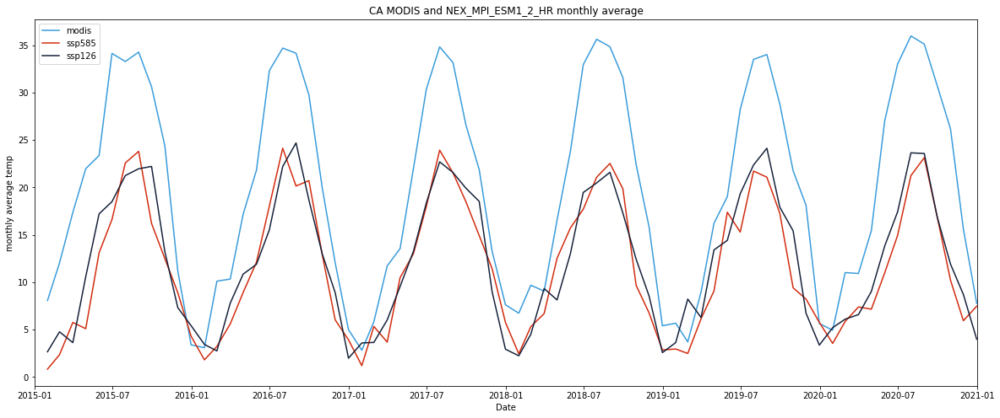

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(CA_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(CA_ssp585_MPI_ESM1_2_HR_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(CA_ssp126_MPI_ESM1_2_HR_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('CA MODIS and NEX_MPI_ESM1_2_HR monthly average')
plt.show()

####RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
CA_ssp585_MPI_ESM1_2_HR_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp585_MPI_ESM1_2_HR_monthly_avg_temp)) 
CA_ssp585_MPI_ESM1_2_HR_monthly_rmse

9.709582408793814

In [ ]:
CA_ssp126_MPI_ESM1_2_HR_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp126_MPI_ESM1_2_HR_monthly_avg_temp)) 
CA_ssp126_MPI_ESM1_2_HR_monthly_rmse

9.012289495429481

####time series analysis

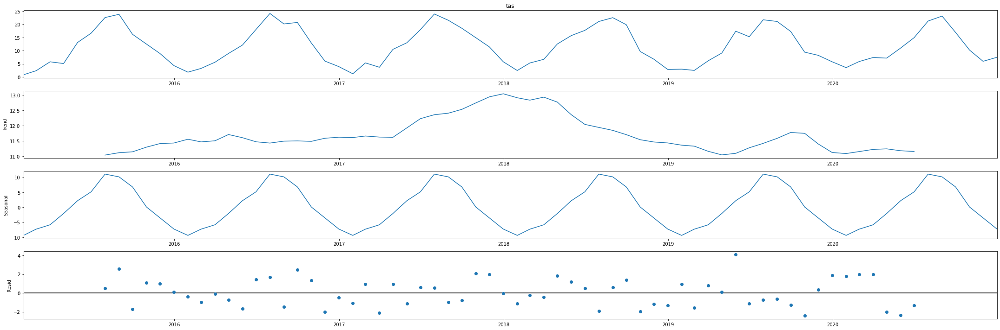

In [ ]:
CA_ssp585_MPI_ESM1_2_HR_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp585_MPI_ESM1_2_HR_monthly_avg_temp, model='additive')
fig = CA_ssp585_MPI_ESM1_2_HR_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

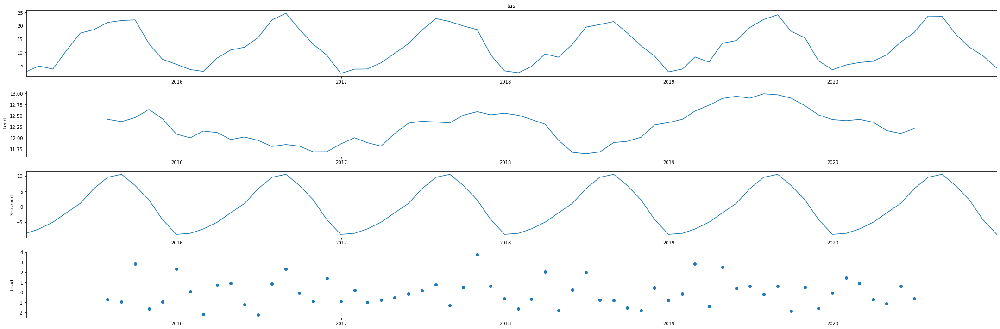

In [ ]:
CA_ssp126_MPI_ESM1_2_HR_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp126_MPI_ESM1_2_HR_monthly_avg_temp, model='additive')
fig = CA_ssp126_MPI_ESM1_2_HR_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

####R Square

In [ ]:
CA_ssp585_MPI_ESM1_2_HR_model = LinearRegression()
x = CA_ssp585_MPI_ESM1_2_HR_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
CA_ssp585_MPI_ESM1_2_HR_model.fit(x, y)
CA_ssp585_MPI_ESM1_2_HR_r_squared = CA_ssp585_MPI_ESM1_2_HR_model.score(x, y)
CA_ssp585_MPI_ESM1_2_HR_r_squared

0.8596229087063345

In [ ]:
CA_ssp126_MPI_ESM1_2_HR_model = LinearRegression()
x = CA_ssp126_MPI_ESM1_2_HR_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
CA_ssp126_MPI_ESM1_2_HR_model.fit(x, y)
CA_ssp126_MPI_ESM1_2_HR_r_squared = CA_ssp126_MPI_ESM1_2_HR_model.score(x, y)
CA_ssp126_MPI_ESM1_2_HR_r_squared

0.8843990101793728

#### seasonal analysis

In [ ]:
month = CA_ssp585_MPI_ESM1_2_HR_monthly_avg_temp.index.month
CA_ssp585_MPI_ESM1_2_HR_winter = pd.concat([CA_ssp585_MPI_ESM1_2_HR_monthly_avg_temp[month == 1], CA_ssp585_MPI_ESM1_2_HR_monthly_avg_temp[month == 2],CA_ssp585_MPI_ESM1_2_HR_monthly_avg_temp[month == 12]])
CA_ssp585_MPI_ESM1_2_HR_spring = pd.concat([CA_ssp585_MPI_ESM1_2_HR_monthly_avg_temp[month == 3], CA_ssp585_MPI_ESM1_2_HR_monthly_avg_temp[month == 4],CA_ssp585_MPI_ESM1_2_HR_monthly_avg_temp[month == 5]])
CA_ssp585_MPI_ESM1_2_HR_summer = pd.concat([CA_ssp585_MPI_ESM1_2_HR_monthly_avg_temp[month == 6], CA_ssp585_MPI_ESM1_2_HR_monthly_avg_temp[month == 7],CA_ssp585_MPI_ESM1_2_HR_monthly_avg_temp[month == 8]])
CA_ssp585_MPI_ESM1_2_HR_fall = pd.concat([CA_ssp585_MPI_ESM1_2_HR_monthly_avg_temp[month == 9], CA_ssp585_MPI_ESM1_2_HR_monthly_avg_temp[month == 10],CA_ssp585_MPI_ESM1_2_HR_monthly_avg_temp[month == 11]])
CA_ssp585_MPI_ESM1_2_HR_winter.sort_index()
CA_ssp585_MPI_ESM1_2_HR_spring.sort_index()
CA_ssp585_MPI_ESM1_2_HR_summer.sort_index()
CA_ssp585_MPI_ESM1_2_HR_fall.sort_index()

time
2015-09-30    16.193795
2015-10-31    12.477660
2015-11-30     8.887851
2016-09-30    20.709069
2016-10-31    12.885525
2016-11-30     6.024860
2017-09-30    18.491418
2017-10-31    14.912019
2017-11-30    11.421717
2018-09-30    19.859430
2018-10-31     9.653349
2018-11-30     6.754543
2019-09-30    17.273953
2019-10-31     9.406651
2019-11-30     8.215929
2020-09-30    16.906171
2020-10-31    10.209136
2020-11-30     5.932998
Name: tas, dtype: float64

In [ ]:
month = CA_ssp126_MPI_ESM1_2_HR_monthly_avg_temp.index.month
CA_ssp126_MPI_ESM1_2_HR_winter = pd.concat([CA_ssp126_MPI_ESM1_2_HR_monthly_avg_temp[month == 1], CA_ssp126_MPI_ESM1_2_HR_monthly_avg_temp[month == 2],CA_ssp126_MPI_ESM1_2_HR_monthly_avg_temp[month == 12]])
CA_ssp126_MPI_ESM1_2_HR_spring = pd.concat([CA_ssp126_MPI_ESM1_2_HR_monthly_avg_temp[month == 3], CA_ssp126_MPI_ESM1_2_HR_monthly_avg_temp[month == 4],CA_ssp126_MPI_ESM1_2_HR_monthly_avg_temp[month == 5]])
CA_ssp126_MPI_ESM1_2_HR_summer = pd.concat([CA_ssp126_MPI_ESM1_2_HR_monthly_avg_temp[month == 6], CA_ssp126_MPI_ESM1_2_HR_monthly_avg_temp[month == 7],CA_ssp126_MPI_ESM1_2_HR_monthly_avg_temp[month == 8]])
CA_ssp126_MPI_ESM1_2_HR_fall = pd.concat([CA_ssp126_MPI_ESM1_2_HR_monthly_avg_temp[month == 9], CA_ssp126_MPI_ESM1_2_HR_monthly_avg_temp[month == 10],CA_ssp126_MPI_ESM1_2_HR_monthly_avg_temp[month == 11]])
CA_ssp126_MPI_ESM1_2_HR_winter.sort_index()
CA_ssp126_MPI_ESM1_2_HR_spring.sort_index()
CA_ssp126_MPI_ESM1_2_HR_summer.sort_index()
CA_ssp126_MPI_ESM1_2_HR_fall.sort_index()

time
2015-09-30    22.205159
2015-10-31    13.201085
2015-11-30     7.312675
2016-09-30    18.658000
2016-10-31    12.977817
2016-11-30     8.899282
2017-09-30    19.913858
2017-10-31    18.517210
2017-11-30     8.986571
2018-09-30    17.299183
2018-10-31    12.406688
2018-11-30     8.542083
2019-09-30    17.914542
2019-10-31    15.411886
2019-11-30     6.730556
2020-09-30    16.896433
2020-10-31    11.900601
2020-11-30     8.695767
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = CA_ssp126_MPI_ESM1_2_HR_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.0005826511685218527
coef:  [[-0.04283122]]
intercept:  [6.74363522]


In [ ]:
x = CA_ssp126_MPI_ESM1_2_HR_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.49236665401646174
coef:  [[1.09298271]]
intercept:  [5.79610073]


In [ ]:
x = CA_ssp126_MPI_ESM1_2_HR_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.29328058629879417
coef:  [[0.40553091]]
intercept:  [25.04472448]


In [ ]:
x = CA_ssp126_MPI_ESM1_2_HR_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.7201360431495054
coef:  [[1.19483293]]
intercept:  [5.89535668]


#####ssp585

In [ ]:
x = CA_ssp585_MPI_ESM1_2_HR_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.07555288077407918
coef:  [[0.41309537]]
intercept:  [5.03168564]


In [ ]:
x = CA_ssp585_MPI_ESM1_2_HR_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.3664832419630689
coef:  [[0.85711576]]
intercept:  [8.87934773]


In [ ]:
x = CA_ssp585_MPI_ESM1_2_HR_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.42025582855980737
coef:  [[0.41064784]]
intercept:  [25.19503175]


In [ ]:
x = CA_ssp585_MPI_ESM1_2_HR_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.6892355285585974
coef:  [[1.17164336]]
intercept:  [7.53120034]


###CA_NEX_MPI_ESM1_2_LR

####SSP585

In [ ]:
#https://drive.google.com/file/d/1-3OET-VeTuZVUUliB39qEJ6UTrSagPQZ/view?usp=share_link
id = "1-3OET-VeTuZVUUliB39qEJ6UTrSagPQZ"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp585_MPI_ESM1_2_LR.csv')

CA_ssp585_MPI_ESM1_2_LR = pd.read_csv('CA_ssp585_MPI_ESM1_2_LR.csv', parse_dates=['time'], index_col='time')
CA_ssp585_MPI_ESM1_2_LR.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,-120.125,8.678284
2015-01-01,1,36.375,-119.875,8.010681
2015-01-01,2,36.375,-119.625,7.793915
2015-01-01,3,36.375,-119.375,7.962097
2015-01-01,4,36.375,-119.125,8.655273


In [ ]:
CA_ssp585_MPI_ESM1_2_LR

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,-120.125,8.678284
2015-01-01,1,36.375,-119.875,8.010681
2015-01-01,2,36.375,-119.625,7.793915
2015-01-01,3,36.375,-119.375,7.962097
2015-01-01,4,36.375,-119.125,8.655273
...,...,...,...,...
2020-12-31,341947,39.125,-118.125,0.988983
2020-12-31,341948,39.125,-117.875,0.723633
2020-12-31,341949,39.125,-117.625,-0.625305


In [ ]:
CA_ssp585_MPI_ESM1_2_LR['tas'].isnull().sum()

0

In [ ]:
CA_ssp585_MPI_ESM1_2_LR_avg_temp = CA_ssp585_MPI_ESM1_2_LR.groupby(CA_ssp585_MPI_ESM1_2_LR.index)['tas'].mean()
CA_ssp585_MPI_ESM1_2_LR

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,-120.125,8.678284
2015-01-01,1,36.375,-119.875,8.010681
2015-01-01,2,36.375,-119.625,7.793915
2015-01-01,3,36.375,-119.375,7.962097
2015-01-01,4,36.375,-119.125,8.655273
...,...,...,...,...
2020-12-31,341947,39.125,-118.125,0.988983
2020-12-31,341948,39.125,-117.875,0.723633
2020-12-31,341949,39.125,-117.625,-0.625305


In [ ]:
CA_ssp585_MPI_ESM1_2_LR_monthly_avg_temp = CA_ssp585_MPI_ESM1_2_LR_avg_temp.resample('M').mean()
CA_ssp585_MPI_ESM1_2_LR_monthly_avg_temp

time
2015-01-31     2.480924
2015-02-28     1.748700
2015-03-31     6.837098
2015-04-30    10.170606
2015-05-31    13.377638
                ...    
2020-08-31    26.018786
2020-09-30    18.600007
2020-10-31    10.998009
2020-11-30     6.708072
2020-12-31     2.814207
Freq: M, Name: tas, Length: 72, dtype: float64

####SSP126

In [ ]:
#https://drive.google.com/file/d/1YFjLIcePWkI3xsczIYbUWlZ_zUnNNHU3/view?usp=share_link
id = "1YFjLIcePWkI3xsczIYbUWlZ_zUnNNHU3"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp126_MPI_ESM1_2_LR.csv')

CA_ssp126_MPI_ESM1_2_LR = pd.read_csv('CA_ssp126_MPI_ESM1_2_LR.csv', parse_dates=['time'], index_col='time')
CA_ssp126_MPI_ESM1_2_LR.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,39.125,-120.125,-2.449951
2015-01-01,1,39.125,-119.875,-2.418335
2015-01-01,2,39.125,-119.625,-1.758240
2015-01-01,3,39.125,-119.375,-2.878296
2015-01-01,4,39.125,-119.125,-1.098694


In [ ]:
CA_ssp126_MPI_ESM1_2_LR['tas'].isnull().sum()

0

In [ ]:
CA_ssp126_MPI_ESM1_2_LR_avg_temp = CA_ssp126_MPI_ESM1_2_LR.groupby(CA_ssp126_MPI_ESM1_2_LR.index)['tas'].mean()
CA_ssp126_MPI_ESM1_2_LR_avg_temp

time
2015-01-01   -0.184773
2015-01-02    0.734264
2015-01-03    2.491076
2015-01-04    0.766681
2015-01-05    3.436252
                ...   
2020-12-27    4.977635
2020-12-28    6.663846
2020-12-29    6.222104
2020-12-30    7.290323
2020-12-31    4.051684
Name: tas, Length: 2192, dtype: float64

In [ ]:
CA_ssp126_MPI_ESM1_2_LR_monthly_avg_temp = CA_ssp126_MPI_ESM1_2_LR_avg_temp.resample('M').mean()
CA_ssp126_MPI_ESM1_2_LR_monthly_avg_temp 

time
2015-01-31     4.671584
2015-02-28     7.275181
2015-03-31     6.223707
2015-04-30     9.026225
2015-05-31    12.035738
                ...    
2020-08-31    22.633599
2020-09-30    18.613848
2020-10-31    13.338405
2020-11-30     4.238202
2020-12-31     2.113133
Freq: M, Name: tas, Length: 72, dtype: float64

####compare modis with ssp585 and ssp126

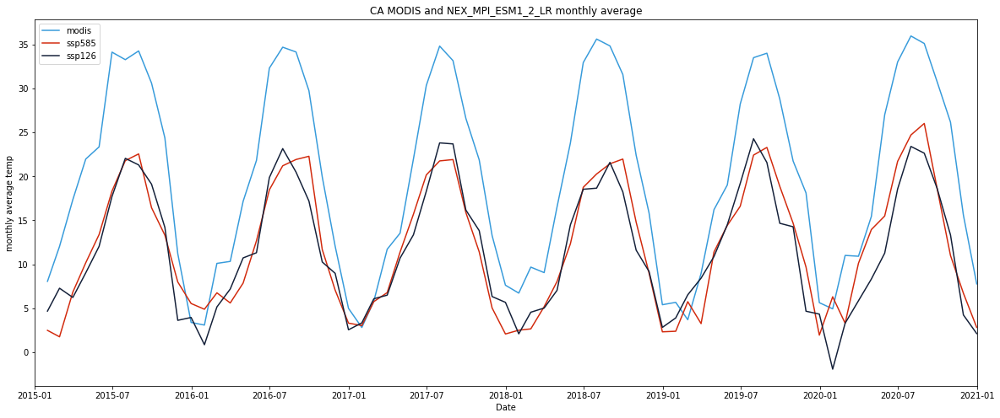

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(CA_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(CA_ssp585_MPI_ESM1_2_LR_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(CA_ssp126_MPI_ESM1_2_LR_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('CA MODIS and NEX_MPI_ESM1_2_LR monthly average')
plt.show()

####RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
CA_ssp585_MPI_ESM1_2_LR_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp585_MPI_ESM1_2_LR_monthly_avg_temp)) 
CA_ssp585_MPI_ESM1_2_LR_monthly_rmse

9.005910841706243

In [ ]:
CA_ssp126_MPI_ESM1_2_LR_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp126_MPI_ESM1_2_LR_monthly_avg_temp)) 
CA_ssp126_MPI_ESM1_2_LR_monthly_rmse

9.455491289177068

####time series analysis

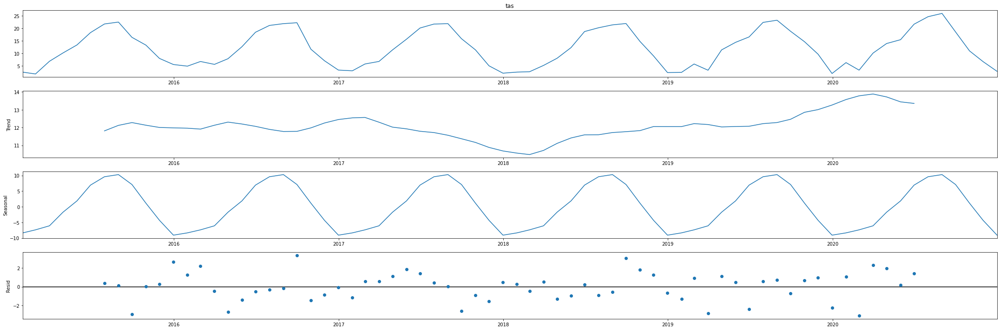

In [ ]:
CA_ssp585_MPI_ESM1_2_LR_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp585_MPI_ESM1_2_LR_monthly_avg_temp, model='additive')
fig = CA_ssp585_MPI_ESM1_2_LR_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

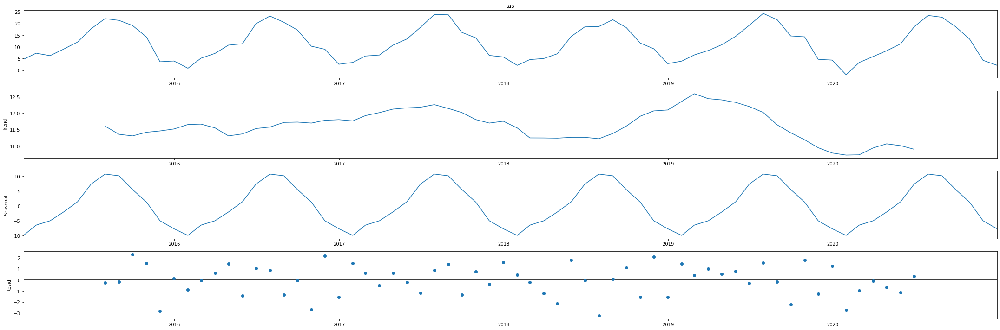

In [ ]:
CA_ssp126_MPI_ESM1_2_LR_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp126_MPI_ESM1_2_LR_monthly_avg_temp, model='additive')
fig = CA_ssp126_MPI_ESM1_2_LR_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

####R Square

In [ ]:
CA_ssp585_MPI_ESM1_2_LR_model = LinearRegression()
x = CA_ssp585_MPI_ESM1_2_LR_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
CA_ssp585_MPI_ESM1_2_LR_model.fit(x, y)
CA_ssp585_MPI_ESM1_2_LR_r_squared = CA_ssp585_MPI_ESM1_2_LR_model.score(x, y)
CA_ssp585_MPI_ESM1_2_LR_r_squared

0.8978581440737028

In [ ]:
CA_ssp126_MPI_ESM1_2_LR_model = LinearRegression()
x = CA_ssp126_MPI_ESM1_2_LR_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
CA_ssp126_MPI_ESM1_2_LR_model.fit(x, y)
CA_ssp126_MPI_ESM1_2_LR_r_squared = CA_ssp126_MPI_ESM1_2_LR_model.score(x, y)
CA_ssp126_MPI_ESM1_2_LR_r_squared

0.8976656193940845

#### seasonal analysis

In [ ]:
month = CA_ssp585_MPI_ESM1_2_LR_monthly_avg_temp.index.month
CA_ssp585_MPI_ESM1_2_LR_winter = pd.concat([CA_ssp585_MPI_ESM1_2_LR_monthly_avg_temp[month == 1], CA_ssp585_MPI_ESM1_2_LR_monthly_avg_temp[month == 2],CA_ssp585_MPI_ESM1_2_LR_monthly_avg_temp[month == 12]])
CA_ssp585_MPI_ESM1_2_LR_spring = pd.concat([CA_ssp585_MPI_ESM1_2_LR_monthly_avg_temp[month == 3], CA_ssp585_MPI_ESM1_2_LR_monthly_avg_temp[month == 4],CA_ssp585_MPI_ESM1_2_LR_monthly_avg_temp[month == 5]])
CA_ssp585_MPI_ESM1_2_LR_summer = pd.concat([CA_ssp585_MPI_ESM1_2_LR_monthly_avg_temp[month == 6], CA_ssp585_MPI_ESM1_2_LR_monthly_avg_temp[month == 7],CA_ssp585_MPI_ESM1_2_LR_monthly_avg_temp[month == 8]])
CA_ssp585_MPI_ESM1_2_LR_fall = pd.concat([CA_ssp585_MPI_ESM1_2_LR_monthly_avg_temp[month == 9], CA_ssp585_MPI_ESM1_2_LR_monthly_avg_temp[month == 10],CA_ssp585_MPI_ESM1_2_LR_monthly_avg_temp[month == 11]])
CA_ssp585_MPI_ESM1_2_LR_winter.sort_index()
CA_ssp585_MPI_ESM1_2_LR_spring.sort_index()
CA_ssp585_MPI_ESM1_2_LR_summer.sort_index()
CA_ssp585_MPI_ESM1_2_LR_fall.sort_index()

time
2015-09-30    16.432267
2015-10-31    13.308919
2015-11-30     7.984627
2016-09-30    22.283290
2016-10-31    11.670266
2016-11-30     7.059476
2017-09-30    15.885183
2017-10-31    11.411724
2017-11-30     5.026743
2018-09-30    21.964986
2018-10-31    14.784351
2018-11-30     8.988220
2019-09-30    18.862538
2019-10-31    14.671801
2019-11-30     9.682264
2020-09-30    18.600007
2020-10-31    10.998009
2020-11-30     6.708072
Name: tas, dtype: float64

In [ ]:
month = CA_ssp126_MPI_ESM1_2_LR_monthly_avg_temp.index.month
CA_ssp126_MPI_ESM1_2_LR_winter = pd.concat([CA_ssp126_MPI_ESM1_2_LR_monthly_avg_temp[month == 1], CA_ssp126_MPI_ESM1_2_LR_monthly_avg_temp[month == 2],CA_ssp126_MPI_ESM1_2_LR_monthly_avg_temp[month == 12]])
CA_ssp126_MPI_ESM1_2_LR_spring = pd.concat([CA_ssp126_MPI_ESM1_2_LR_monthly_avg_temp[month == 3], CA_ssp126_MPI_ESM1_2_LR_monthly_avg_temp[month == 4],CA_ssp126_MPI_ESM1_2_LR_monthly_avg_temp[month == 5]])
CA_ssp126_MPI_ESM1_2_LR_summer = pd.concat([CA_ssp126_MPI_ESM1_2_LR_monthly_avg_temp[month == 6], CA_ssp126_MPI_ESM1_2_LR_monthly_avg_temp[month == 7],CA_ssp126_MPI_ESM1_2_LR_monthly_avg_temp[month == 8]])
CA_ssp126_MPI_ESM1_2_LR_fall = pd.concat([CA_ssp126_MPI_ESM1_2_LR_monthly_avg_temp[month == 9], CA_ssp126_MPI_ESM1_2_LR_monthly_avg_temp[month == 10],CA_ssp126_MPI_ESM1_2_LR_monthly_avg_temp[month == 11]])
CA_ssp126_MPI_ESM1_2_LR_winter.sort_index()
CA_ssp126_MPI_ESM1_2_LR_spring.sort_index()
CA_ssp126_MPI_ESM1_2_LR_summer.sort_index()
CA_ssp126_MPI_ESM1_2_LR_fall.sort_index()

time
2015-09-30    19.109650
2015-10-31    14.194345
2015-11-30     3.621825
2016-09-30    17.191686
2016-10-31    10.259069
2016-11-30     8.967748
2017-09-30    16.166727
2017-10-31    13.825437
2017-11-30     6.327492
2018-09-30    18.229749
2018-10-31    11.602876
2018-11-30     9.177195
2019-09-30    14.661063
2019-10-31    14.265746
2019-11-30     4.659065
2020-09-30    18.613848
2020-10-31    13.338405
2020-11-30     4.238202
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = CA_ssp126_MPI_ESM1_2_LR_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.14137762011025745
coef:  [[0.47370109]]
intercept:  [4.80691966]


In [ ]:
x = CA_ssp126_MPI_ESM1_2_LR_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.5070701682068812
coef:  [[1.32275324]]
intercept:  [4.30607989]


In [ ]:
x = CA_ssp126_MPI_ESM1_2_LR_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.18013940347733237
coef:  [[0.36371418]]
intercept:  [25.92148692]


In [ ]:
x = CA_ssp126_MPI_ESM1_2_LR_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8386465493342112
coef:  [[1.2264724]]
intercept:  [7.37128427]


#####ssp585

In [ ]:
x = CA_ssp585_MPI_ESM1_2_LR_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.09054220430984328
coef:  [[-0.49484005]]
intercept:  [8.37556029]


In [ ]:
x = CA_ssp585_MPI_ESM1_2_LR_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.5798137436116173
coef:  [[1.11307201]]
intercept:  [5.59498148]


In [ ]:
x = CA_ssp585_MPI_ESM1_2_LR_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.4238320825535884
coef:  [[0.53027452]]
intercept:  [22.28456136]


In [ ]:
x = CA_ssp585_MPI_ESM1_2_LR_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8318113937457123
coef:  [[1.19298149]]
intercept:  [6.59319511]


###CA_NEX_MRI_ESM2_0

####SSP585

In [ ]:
#https://drive.google.com/file/d/1poG7ODT8o3pUkwmjG1TrjdsYtfe7SJ6a/view?usp=share_link
id = "1poG7ODT8o3pUkwmjG1TrjdsYtfe7SJ6a"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp585_MRI_ESM2_0.csv')

CA_ssp585_MRI_ESM2_0 = pd.read_csv('CA_ssp585_MRI_ESM2_0.csv', parse_dates=['time'], index_col='time')
CA_ssp585_MRI_ESM2_0.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,-120.125,16.909790
2015-01-01,1,36.375,-119.875,16.367493
2015-01-01,2,36.375,-119.625,16.178589
2015-01-01,3,36.375,-119.375,16.374756
2015-01-01,4,36.375,-119.125,17.071777


In [ ]:
CA_ssp585_MRI_ESM2_0

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,-120.125,16.909790
2015-01-01,1,36.375,-119.875,16.367493
2015-01-01,2,36.375,-119.625,16.178589
2015-01-01,3,36.375,-119.375,16.374756
2015-01-01,4,36.375,-119.125,17.071777
...,...,...,...,...
2020-12-31,341947,39.125,-118.125,4.812744
2020-12-31,341948,39.125,-117.875,4.572296
2020-12-31,341949,39.125,-117.625,3.248321


In [ ]:
CA_ssp585_MRI_ESM2_0['tas'].isnull().sum()

0

In [ ]:
CA_ssp585_MRI_ESM2_0_avg_temp = CA_ssp585_MRI_ESM2_0.groupby(CA_ssp585_MRI_ESM2_0.index)['tas'].mean()
CA_ssp585_MRI_ESM2_0_avg_temp

time
2015-01-01    10.574536
2015-01-02    10.597648
2015-01-03    11.015565
2015-01-04    10.526354
2015-01-05     8.223795
                ...    
2020-12-27     3.684952
2020-12-28     1.874777
2020-12-29    -3.338712
2020-12-30     3.556843
2020-12-31     6.286890
Name: tas, Length: 2192, dtype: float64

In [ ]:
CA_ssp585_MRI_ESM2_0_monthly_avg_temp = CA_ssp585_MRI_ESM2_0_avg_temp.resample('M').mean()
CA_ssp585_MRI_ESM2_0_monthly_avg_temp

time
2015-01-31     8.665754
2015-02-28     6.524485
2015-03-31     6.591760
2015-04-30     8.822833
2015-05-31    14.769632
                ...    
2020-08-31    24.501446
2020-09-30    19.714015
2020-10-31    12.664779
2020-11-30     6.269715
2020-12-31     1.472637
Freq: M, Name: tas, Length: 72, dtype: float64

####SSP126

In [ ]:
#https://drive.google.com/file/d/1UoQoi9JgoUcgymKkMMqU4jGetirP2c9q/view?usp=share_link
id = "1UoQoi9JgoUcgymKkMMqU4jGetirP2c9q"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp126_MRI_ESM2_0.csv')

CA_ssp126_MRI_ESM2_0 = pd.read_csv('CA_ssp126_MRI_ESM2_0.csv', parse_dates=['time'], index_col='time')
CA_ssp126_MRI_ESM2_0.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,39.125,-120.125,7.423401
2015-01-01,1,39.125,-119.875,7.876831
2015-01-01,2,39.125,-119.625,8.947723
2015-01-01,3,39.125,-119.375,8.238464
2015-01-01,4,39.125,-119.125,10.384338


In [ ]:
CA_ssp126_MRI_ESM2_0

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,39.125,-120.125,7.423401
2015-01-01,1,39.125,-119.875,7.876831
2015-01-01,2,39.125,-119.625,8.947723
2015-01-01,3,39.125,-119.375,8.238464
2015-01-01,4,39.125,-119.125,10.384338
...,...,...,...,...
2020-12-31,341947,36.375,-118.125,-5.768188
2020-12-31,341948,36.375,-117.875,-0.530151
2020-12-31,341949,36.375,-117.625,-2.981262


In [ ]:
CA_ssp126_MRI_ESM2_0['tas'].isnull().sum()

0

In [ ]:
CA_ssp126_MRI_ESM2_0_avg_temp = CA_ssp126_MRI_ESM2_0.groupby(CA_ssp126_MRI_ESM2_0.index)['tas'].mean()
CA_ssp126_MRI_ESM2_0_avg_temp

time
2015-01-01    10.972989
2015-01-02    10.706972
2015-01-03    11.112456
2015-01-04    10.682356
2015-01-05     8.332697
                ...    
2020-12-27     2.889245
2020-12-28    -1.470506
2020-12-29    -7.669999
2020-12-30    -8.071192
2020-12-31    -0.966993
Name: tas, Length: 2192, dtype: float64

In [ ]:
CA_ssp126_MRI_ESM2_0_monthly_avg_temp = CA_ssp126_MRI_ESM2_0_avg_temp.resample('M').mean()
CA_ssp126_MRI_ESM2_0_monthly_avg_temp

time
2015-01-31     8.823312
2015-02-28     8.422573
2015-03-31     6.584776
2015-04-30    11.061171
2015-05-31    11.835217
                ...    
2020-08-31    20.338027
2020-09-30    21.313539
2020-10-31    15.132961
2020-11-30     9.591700
2020-12-31    -0.289629
Freq: M, Name: tas, Length: 72, dtype: float64

####compare modis with ssp585 and ssp126

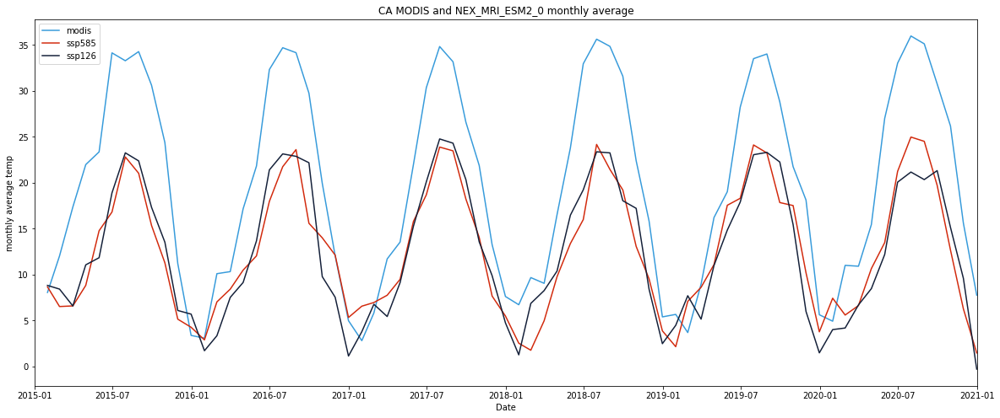

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(CA_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(CA_ssp585_MRI_ESM2_0_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(CA_ssp126_MRI_ESM2_0_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('CA MODIS and NEX_MRI_ESM2_0 monthly average')
plt.show()

####RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
CA_ssp585_MRI_ESM2_0_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp585_MRI_ESM2_0_monthly_avg_temp)) 
CA_ssp585_MRI_ESM2_0_monthly_rmse

8.856582655315998

In [ ]:
CA_ssp126_MRI_ESM2_0_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp126_MRI_ESM2_0_monthly_avg_temp)) 
CA_ssp126_MRI_ESM2_0_monthly_rmse

8.531553970739889

####time series analysis

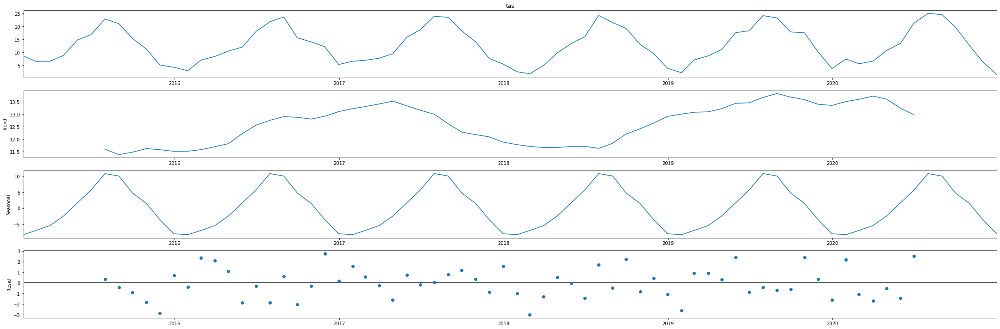

In [ ]:
CA_ssp585_MRI_ESM2_0_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp585_MRI_ESM2_0_monthly_avg_temp, model='additive')
fig = CA_ssp585_MRI_ESM2_0_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

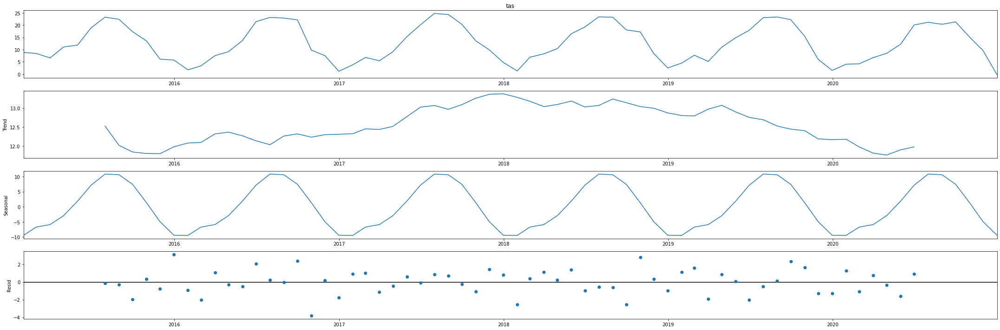

In [ ]:
CA_ssp126_MRI_ESM2_0_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp126_MRI_ESM2_0_monthly_avg_temp, model='additive')
fig = CA_ssp126_MRI_ESM2_0_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

####R Square

In [ ]:
CA_ssp585_MRI_ESM2_0_model = LinearRegression()
x = CA_ssp585_MRI_ESM2_0_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
CA_ssp585_MRI_ESM2_0_model.fit(x, y)
CA_ssp585_MRI_ESM2_0_r_squared = CA_ssp585_MRI_ESM2_0_model.score(x, y)
CA_ssp585_MRI_ESM2_0_r_squared

0.8649437088809597

In [ ]:
CA_ssp126_MRI_ESM2_0_model = LinearRegression()
x = CA_ssp126_MRI_ESM2_0_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
CA_ssp126_MRI_ESM2_0_model.fit(x, y)
CA_ssp126_MRI_ESM2_0_r_squared = CA_ssp126_MRI_ESM2_0_model.score(x, y)
CA_ssp126_MRI_ESM2_0_r_squared

0.8987966199042257

#### seasonal analysis

In [ ]:
month = CA_ssp585_MRI_ESM2_0_monthly_avg_temp.index.month
CA_ssp585_MRI_ESM2_0_winter = pd.concat([CA_ssp585_MRI_ESM2_0_monthly_avg_temp[month == 1], CA_ssp585_MRI_ESM2_0_monthly_avg_temp[month == 2],CA_ssp585_MRI_ESM2_0_monthly_avg_temp[month == 12]])
CA_ssp585_MRI_ESM2_0_spring = pd.concat([CA_ssp585_MRI_ESM2_0_monthly_avg_temp[month == 3], CA_ssp585_MRI_ESM2_0_monthly_avg_temp[month == 4],CA_ssp585_MRI_ESM2_0_monthly_avg_temp[month == 5]])
CA_ssp585_MRI_ESM2_0_summer = pd.concat([CA_ssp585_MRI_ESM2_0_monthly_avg_temp[month == 6], CA_ssp585_MRI_ESM2_0_monthly_avg_temp[month == 7],CA_ssp585_MRI_ESM2_0_monthly_avg_temp[month == 8]])
CA_ssp585_MRI_ESM2_0_fall = pd.concat([CA_ssp585_MRI_ESM2_0_monthly_avg_temp[month == 9], CA_ssp585_MRI_ESM2_0_monthly_avg_temp[month == 10],CA_ssp585_MRI_ESM2_0_monthly_avg_temp[month == 11]])
CA_ssp585_MRI_ESM2_0_winter.sort_index()
CA_ssp585_MRI_ESM2_0_spring.sort_index()
CA_ssp585_MRI_ESM2_0_summer.sort_index()
CA_ssp585_MRI_ESM2_0_fall.sort_index()

time
2015-09-30    15.342937
2015-10-31    11.280074
2015-11-30     5.148635
2016-09-30    15.583999
2016-10-31    14.004215
2016-11-30    12.123119
2017-09-30    18.227055
2017-10-31    14.045695
2017-11-30     7.665410
2018-09-30    19.208621
2018-10-31    13.070100
2018-11-30     9.532585
2019-09-30    17.839668
2019-10-31    17.512838
2019-11-30    10.190882
2020-09-30    19.714015
2020-10-31    12.664779
2020-11-30     6.269715
Name: tas, dtype: float64

In [ ]:
month = CA_ssp126_MRI_ESM2_0_monthly_avg_temp.index.month
CA_ssp126_MRI_ESM2_0_winter = pd.concat([CA_ssp126_MRI_ESM2_0_monthly_avg_temp[month == 1], CA_ssp126_MRI_ESM2_0_monthly_avg_temp[month == 2],CA_ssp126_MRI_ESM2_0_monthly_avg_temp[month == 12]])
CA_ssp126_MRI_ESM2_0_spring = pd.concat([CA_ssp126_MRI_ESM2_0_monthly_avg_temp[month == 3], CA_ssp126_MRI_ESM2_0_monthly_avg_temp[month == 4],CA_ssp126_MRI_ESM2_0_monthly_avg_temp[month == 5]])
CA_ssp126_MRI_ESM2_0_summer = pd.concat([CA_ssp126_MRI_ESM2_0_monthly_avg_temp[month == 6], CA_ssp126_MRI_ESM2_0_monthly_avg_temp[month == 7],CA_ssp126_MRI_ESM2_0_monthly_avg_temp[month == 8]])
CA_ssp126_MRI_ESM2_0_fall = pd.concat([CA_ssp126_MRI_ESM2_0_monthly_avg_temp[month == 9], CA_ssp126_MRI_ESM2_0_monthly_avg_temp[month == 10],CA_ssp126_MRI_ESM2_0_monthly_avg_temp[month == 11]])
CA_ssp126_MRI_ESM2_0_winter.sort_index()
CA_ssp126_MRI_ESM2_0_spring.sort_index()
CA_ssp126_MRI_ESM2_0_summer.sort_index()
CA_ssp126_MRI_ESM2_0_fall.sort_index()

time
2015-09-30    17.320522
2015-10-31    13.527263
2015-11-30     6.095152
2016-09-30    22.174165
2016-10-31     9.779204
2016-11-30     7.538658
2017-09-30    20.343523
2017-10-31    13.562494
2017-11-30     9.885479
2018-09-30    18.037151
2018-10-31    17.211777
2018-11-30     8.411140
2019-09-30    22.252480
2019-10-31    15.436371
2019-11-30     5.987260
2020-09-30    21.313539
2020-10-31    15.132961
2020-11-30     9.591700
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = CA_ssp126_MRI_ESM2_0_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.06720365201552125
coef:  [[0.26609851]]
intercept:  [5.4420734]


In [ ]:
x = CA_ssp126_MRI_ESM2_0_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.6317708531620151
coef:  [[1.28910879]]
intercept:  [3.89267279]


In [ ]:
x = CA_ssp126_MRI_ESM2_0_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.29429459086787235
coef:  [[0.508836]]
intercept:  [22.47410377]


In [ ]:
x = CA_ssp126_MRI_ESM2_0_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.7989615739750624
coef:  [[1.09233107]]
intercept:  [6.8661164]


#####ssp585

In [ ]:
x = CA_ssp585_MRI_ESM2_0_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.003764170135166389
coef:  [[0.07725893]]
intercept:  [6.19118264]


In [ ]:
x = CA_ssp585_MRI_ESM2_0_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.5173103941225148
coef:  [[1.1664091]]
intercept:  [4.67384276]


In [ ]:
x = CA_ssp585_MRI_ESM2_0_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.3501213908606591
coef:  [[0.39038638]]
intercept:  [25.16172684]


In [ ]:
x = CA_ssp585_MRI_ESM2_0_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.6929698686287249
coef:  [[1.28841564]]
intercept:  [5.11822776]


###CA_NEX_NESM3

####SSP585

In [ ]:
#https://drive.google.com/file/d/1mCWIWQ-6iFrEqTvf0MXZP9cr7BpSa209/view?usp=share_link
id = "1mCWIWQ-6iFrEqTvf0MXZP9cr7BpSa209"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp585_NESM3.csv')

CA_ssp585_NESM3 = pd.read_csv('CA_ssp585_NESM3.csv', parse_dates=['time'], index_col='time')
CA_ssp585_NESM3.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,-120.125,-0.475037
2015-01-01,1,36.375,-119.875,-1.552979
2015-01-01,2,36.375,-119.625,-2.402710
2015-01-01,3,36.375,-119.375,-2.867432
2015-01-01,4,36.375,-119.125,-2.807159


In [ ]:
CA_ssp585_NESM3

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,-120.125,-0.475037
2015-01-01,1,36.375,-119.875,-1.552979
2015-01-01,2,36.375,-119.625,-2.402710
2015-01-01,3,36.375,-119.375,-2.867432
2015-01-01,4,36.375,-119.125,-2.807159
...,...,...,...,...
2020-12-31,341947,39.125,-118.125,1.711212
2020-12-31,341948,39.125,-117.875,1.512207
2020-12-31,341949,39.125,-117.625,0.229675


In [ ]:
CA_ssp585_NESM3['tas'].isnull().sum()

0

In [ ]:
CA_ssp585_NESM3_avg_temp = CA_ssp585_NESM3.groupby(CA_ssp585_NESM3.index)['tas'].mean()
CA_ssp585_NESM3_avg_temp

time
2015-01-01   -11.871379
2015-01-02   -10.319940
2015-01-03    -5.379199
2015-01-04    -1.688171
2015-01-05     1.361467
                ...    
2020-12-27     5.950090
2020-12-28     8.380204
2020-12-29     5.821029
2020-12-30     7.452148
2020-12-31     2.756425
Name: tas, Length: 2192, dtype: float64

In [ ]:
CA_ssp585_NESM3_monthly_avg_temp = CA_ssp585_NESM3_avg_temp.resample('M').mean()
CA_ssp585_NESM3_monthly_avg_temp

time
2015-01-31    -1.030687
2015-02-28     3.544778
2015-03-31     6.062243
2015-04-30     7.536836
2015-05-31    16.604823
                ...    
2020-08-31    24.457944
2020-09-30    21.451848
2020-10-31    15.051648
2020-11-30     5.146582
2020-12-31     2.887343
Freq: M, Name: tas, Length: 72, dtype: float64

####SSP126

In [ ]:
#https://drive.google.com/file/d/1nPYLlyQaWZDY1_avSEaRPUwo9ZUjYqpP/view?usp=share_link
id = "1nPYLlyQaWZDY1_avSEaRPUwo9ZUjYqpP"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp126_NESM3.csv')

CA_ssp126_NESM3 = pd.read_csv('CA_ssp126_NESM3.csv', parse_dates=['time'], index_col='time')
CA_ssp126_NESM3.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,39.125,-120.125,-12.546875
2015-01-01,1,39.125,-119.875,-12.734863
2015-01-01,2,39.125,-119.625,-12.256470
2015-01-01,3,39.125,-119.375,-13.558228
2015-01-01,4,39.125,-119.125,-11.960297


In [ ]:
CA_ssp126_NESM3['tas'].isnull().sum()

0

In [ ]:
CA_ssp126_NESM3_avg_temp = CA_ssp126_NESM3.groupby(CA_ssp126_NESM3.index)['tas'].mean()
CA_ssp126_NESM3_avg_temp

time
2015-01-01   -11.167735
2015-01-02   -10.225334
2015-01-03    -5.828984
2015-01-04    -1.704457
2015-01-05     0.370498
                ...    
2020-12-27     7.903726
2020-12-28     2.400338
2020-12-29    -7.375291
2020-12-30    -8.044018
2020-12-31    -5.542368
Name: tas, Length: 2192, dtype: float64

In [ ]:
CA_ssp126_NESM3_monthly_avg_temp = CA_ssp126_NESM3_avg_temp.resample('M').mean()
CA_ssp126_NESM3_monthly_avg_temp 

time
2015-01-31    -1.269936
2015-02-28     1.053654
2015-03-31     0.122479
2015-04-30     6.798599
2015-05-31    11.672931
                ...    
2020-08-31    21.728985
2020-09-30    17.101594
2020-10-31    16.772985
2020-11-30     9.411302
2020-12-31     3.112479
Freq: M, Name: tas, Length: 72, dtype: float64

####compare modis with ssp585 and ssp126

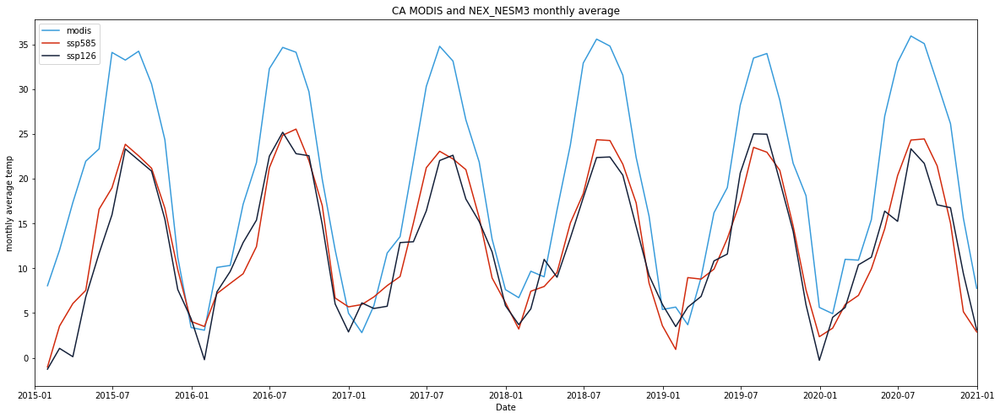

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(CA_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(CA_ssp585_NESM3_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(CA_ssp126_NESM3_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('CA MODIS and NEX_NESM3 monthly average')
plt.show()

####RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
CA_ssp585_NESM3_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp585_NESM3_monthly_avg_temp)) 
CA_ssp585_NESM3_monthly_rmse

8.050413411739463

In [ ]:
CA_ssp126_NESM3_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp126_NESM3_monthly_avg_temp)) 
CA_ssp126_NESM3_monthly_rmse

8.838956454681355

####time series analysis

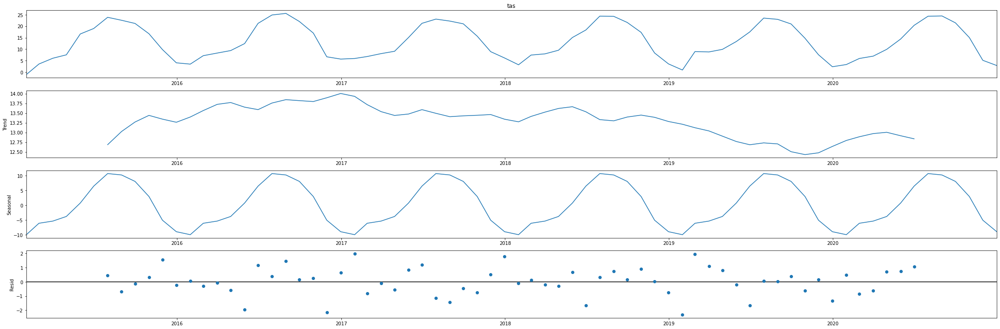

In [ ]:
CA_ssp585_NESM3_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp585_NESM3_monthly_avg_temp, model='additive')
fig = CA_ssp585_NESM3_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

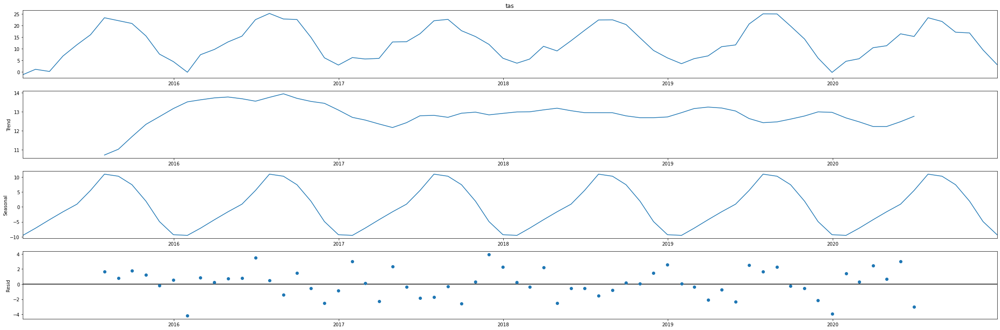

In [ ]:
CA_ssp126_NESM3_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp126_NESM3_monthly_avg_temp, model='additive')
fig = CA_ssp126_NESM3_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

####R Square

In [ ]:
CA_ssp585_NESM3_model = LinearRegression()
x = CA_ssp585_NESM3_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
CA_ssp585_NESM3_model.fit(x, y)
CA_ssp585_NESM3_r_squared =CA_ssp585_NESM3_model.score(x, y)
CA_ssp585_NESM3_r_squared

0.8919247911492654

In [ ]:
CA_ssp126_NESM3_model = LinearRegression()
x = CA_ssp126_NESM3_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
CA_ssp126_NESM3_model.fit(x, y)
CA_ssp126_NESM3_r_squared = CA_ssp126_NESM3_model.score(x, y)
CA_ssp126_NESM3_r_squared

0.8358076198809424

#### seasonal analysis

In [ ]:
month = CA_ssp585_NESM3_monthly_avg_temp.index.month
CA_ssp585_NESM3_winter = pd.concat([CA_ssp585_NESM3_monthly_avg_temp[month == 1], CA_ssp585_NESM3_monthly_avg_temp[month == 2],CA_ssp585_NESM3_monthly_avg_temp[month == 12]])
CA_ssp585_NESM3_spring = pd.concat([CA_ssp585_NESM3_monthly_avg_temp[month == 3], CA_ssp585_NESM3_monthly_avg_temp[month == 4],CA_ssp585_NESM3_monthly_avg_temp[month == 5]])
CA_ssp585_NESM3_summer = pd.concat([CA_ssp585_NESM3_monthly_avg_temp[month == 6], CA_ssp585_NESM3_monthly_avg_temp[month == 7],CA_ssp585_NESM3_monthly_avg_temp[month == 8]])
CA_ssp585_NESM3_fall = pd.concat([CA_ssp585_NESM3_monthly_avg_temp[month == 9], CA_ssp585_NESM3_monthly_avg_temp[month == 10],CA_ssp585_NESM3_monthly_avg_temp[month == 11]])
CA_ssp585_NESM3_winter.sort_index()
CA_ssp585_NESM3_spring.sort_index()
CA_ssp585_NESM3_summer.sort_index()
CA_ssp585_NESM3_fall.sort_index()

time
2015-09-30    21.189029
2015-10-31    16.712767
2015-11-30     9.839346
2016-09-30    22.032420
2016-10-31    17.007232
2016-11-30     6.679208
2017-09-30    21.028165
2017-10-31    15.656795
2017-11-30     8.917499
2018-09-30    21.633510
2018-10-31    17.310631
2018-11-30     8.347210
2019-09-30    20.962811
2019-10-31    14.749020
2019-11-30     7.582290
2020-09-30    21.451848
2020-10-31    15.051648
2020-11-30     5.146582
Name: tas, dtype: float64

In [ ]:
month = CA_ssp126_NESM3_monthly_avg_temp.index.month
CA_ssp126_NESM3_winter = pd.concat([CA_ssp126_NESM3_monthly_avg_temp[month == 1], CA_ssp126_NESM3_monthly_avg_temp[month == 2],CA_ssp126_NESM3_monthly_avg_temp[month == 12]])
CA_ssp126_NESM3_spring = pd.concat([CA_ssp126_NESM3_monthly_avg_temp[month == 3], CA_ssp126_NESM3_monthly_avg_temp[month == 4],CA_ssp126_NESM3_monthly_avg_temp[month == 5]])
CA_ssp126_NESM3_summer = pd.concat([CA_ssp126_NESM3_monthly_avg_temp[month == 6], CA_ssp126_NESM3_monthly_avg_temp[month == 7],CA_ssp126_NESM3_monthly_avg_temp[month == 8]])
CA_ssp126_NESM3_fall = pd.concat([CA_ssp126_NESM3_monthly_avg_temp[month == 9], CA_ssp126_NESM3_monthly_avg_temp[month == 10],CA_ssp126_NESM3_monthly_avg_temp[month == 11]])
CA_ssp126_NESM3_winter.sort_index()
CA_ssp126_NESM3_spring.sort_index()
CA_ssp126_NESM3_summer.sort_index()
CA_ssp126_NESM3_fall.sort_index()

time
2015-09-30    20.866679
2015-10-31    15.490919
2015-11-30     7.625995
2016-09-30    22.582073
2016-10-31    14.893434
2016-11-30     6.014396
2017-09-30    17.743303
2017-10-31    15.222127
2017-11-30    11.830352
2018-09-30    20.409011
2018-10-31    14.673974
2018-11-30     9.203962
2019-09-30    19.760662
2019-10-31    14.152263
2019-11-30     5.926022
2020-09-30    17.101594
2020-10-31    16.772985
2020-11-30     9.411302
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = CA_ssp126_NESM3_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.0007275937948234557
coef:  [[0.02962234]]
intercept:  [6.46162473]


In [ ]:
x = CA_ssp126_NESM3_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.1761299838537016
coef:  [[0.60533601]]
intercept:  [10.65532503]


In [ ]:
x = CA_ssp126_NESM3_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.13888693191385182
coef:  [[0.2269575]]
intercept:  [28.6982757]


In [ ]:
x = CA_ssp126_NESM3_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8332960043305874
coef:  [[1.20828579]]
intercept:  [4.82429128]


#####ssp585

In [ ]:
x = CA_ssp585_NESM3_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.00042870012406970304
coef:  [[0.02293357]]
intercept:  [6.47249609]


In [ ]:
x = CA_ssp585_NESM3_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.5442724345992067
coef:  [[1.27835581]]
intercept:  [3.62005777]


In [ ]:
x = CA_ssp585_NESM3_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.494033841546088
coef:  [[0.55809901]]
intercept:  [21.05487908]


In [ ]:
x = CA_ssp585_NESM3_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8405464984991243
coef:  [[1.05812373]]
intercept:  [6.30773923]


### CA_NEX_IITM-ESM


#### ssp585

In [ ]:
#https://drive.google.com/file/d/1NT7n5GpDlHDxitLP4an-XcLRuvH4E2LR/view?usp=share_link
id = "1NT7n5GpDlHDxitLP4an-XcLRuvH4E2LR"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp585_IITM-ESM.csv')

CA_ssp585_IITM_ESM = pd.read_csv('CA_ssp585_IITM-ESM.csv', parse_dates=['time'], index_col='time')
CA_ssp585_IITM_ESM.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,-120.125,10.962158
2015-01-01,1,36.375,-119.875,10.600739
2015-01-01,2,36.375,-119.625,10.456940
2015-01-01,3,36.375,-119.375,10.672638
2015-01-01,4,36.375,-119.125,11.325806


In [ ]:
CA_ssp585_IITM_ESM 

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,-120.125,10.962158
2015-01-01,1,36.375,-119.875,10.600739
2015-01-01,2,36.375,-119.625,10.456940
2015-01-01,3,36.375,-119.375,10.672638
2015-01-01,4,36.375,-119.125,11.325806
...,...,...,...,...
2020-12-30,341635,39.125,-118.125,-12.271393
2020-12-30,341636,39.125,-117.875,-12.754211
2020-12-30,341637,39.125,-117.625,-14.294189


In [ ]:
CA_ssp585_IITM_ESM['tas'].isnull().sum()

0

In [ ]:
CA_ssp585_IITM_ESM_avg_temp = CA_ssp585_IITM_ESM.groupby(CA_ssp585_IITM_ESM.index)['tas'].mean()
CA_ssp585_IITM_ESM_avg_temp

time
2015-01-01     4.271384
2015-01-02     3.011554
2015-01-03     2.384828
2015-01-04     3.387730
2015-01-05     2.668121
                ...    
2020-12-26    -4.695702
2020-12-27    -7.389540
2020-12-28   -10.650912
2020-12-29   -10.302345
2020-12-30    -8.799103
Name: tas, Length: 2190, dtype: float64

In [ ]:
CA_ssp585_IITM_ESM_monthly_avg_temp = CA_ssp585_IITM_ESM_avg_temp.resample('M').mean()
CA_ssp585_IITM_ESM_monthly_avg_temp

time
2015-01-31     3.032659
2015-02-28     2.127619
2015-03-31     4.533918
2015-04-30    10.471857
2015-05-31    13.678422
                ...    
2020-08-31    21.451429
2020-09-30    18.353719
2020-10-31    12.862331
2020-11-30     8.448124
2020-12-31    -3.122697
Freq: M, Name: tas, Length: 72, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/1cz_0xRRVKxUWF5uAamju4pVZBXERsA84/view?usp=share_link
id = "1cz_0xRRVKxUWF5uAamju4pVZBXERsA84"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_SSP126_IITM-ESM.csv')

CA_ssp126_IITM_ESM = pd.read_csv('CA_SSP126_IITM-ESM.csv', parse_dates=['time'], index_col='time')
CA_ssp126_IITM_ESM.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,39.125,-120.125,2.711121
2015-01-01,1,39.125,-119.875,3.325470
2015-01-01,2,39.125,-119.625,4.542023
2015-01-01,3,39.125,-119.375,4.002930
2015-01-01,4,39.125,-119.125,6.374817


In [ ]:
CA_ssp126_IITM_ESM['tas'].isnull().sum()

0

In [ ]:
CA_ssp126_IITM_ESM_avg_temp = CA_ssp126_IITM_ESM.groupby(CA_ssp126_IITM_ESM.index)['tas'].mean()
CA_ssp126_IITM_ESM_avg_temp

time
2015-01-01    5.814405
2015-01-02    4.649577
2015-01-03    4.240381
2015-01-04    3.127804
2015-01-05    3.184198
                ...   
2020-12-26    0.819882
2020-12-27    0.986928
2020-12-28    1.074365
2020-12-29    3.342539
2020-12-30    3.813953
Name: tas, Length: 2190, dtype: float64

In [ ]:
CA_ssp126_IITM_ESM_monthly_avg_temp = CA_ssp126_IITM_ESM_avg_temp.resample('M').mean()
CA_ssp126_IITM_ESM_monthly_avg_temp 

time
2015-01-31     2.710964
2015-02-28     1.528206
2015-03-31     6.342052
2015-04-30    10.169355
2015-05-31    12.234469
                ...    
2020-08-31    22.052801
2020-09-30    16.263483
2020-10-31    12.156029
2020-11-30     5.169738
2020-12-31     2.692223
Freq: M, Name: tas, Length: 72, dtype: float64

#### compare modis with ssp585 and ssp126

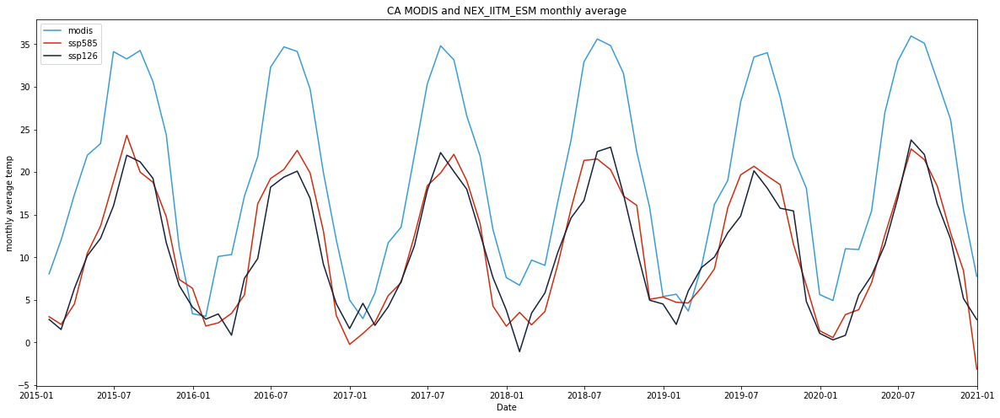

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(CA_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(CA_ssp585_IITM_ESM_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(CA_ssp126_IITM_ESM_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('CA MODIS and NEX_IITM_ESM monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE

#this model missing 2020-12 data
CA_ssp585_IITM_ESM_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp585_IITM_ESM_monthly_avg_temp)) 
CA_ssp585_IITM_ESM_monthly_rmse

9.675280489106099

In [ ]:
#calculate RMSE
#this model missing 2020-12 data
CA_ssp126_IITM_ESM_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp126_IITM_ESM_monthly_avg_temp)) 
CA_ssp126_IITM_ESM_monthly_rmse

10.317603408250134

#### time series analysis

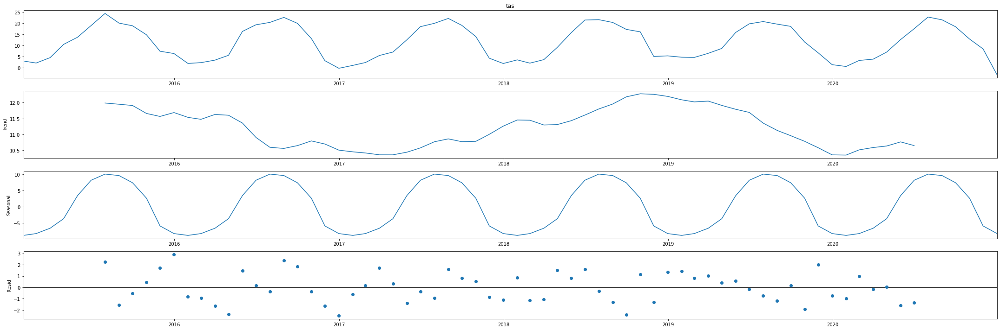

In [ ]:

CA_ssp585_IITM_ESM_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp585_IITM_ESM_monthly_avg_temp, model='additive')
fig = CA_ssp585_IITM_ESM_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

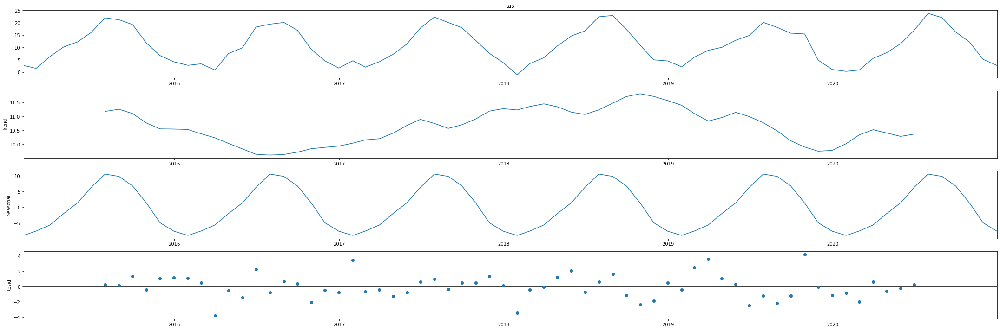

In [ ]:

CA_ssp126_IITM_ESM_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp126_IITM_ESM_monthly_avg_temp, model='additive')
fig = CA_ssp126_IITM_ESM_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

#### R square

In [ ]:
CA_ssp585_IITM_ESM_model = LinearRegression()
x = CA_ssp585_IITM_ESM_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
CA_ssp585_IITM_ESM_model.fit(x, y)
CA_ssp585_IITM_ESM_r_squared =CA_ssp585_IITM_ESM_model.score(x, y)
CA_ssp585_IITM_ESM_r_squared

0.9010052465421935

In [ ]:
CA_ssp126_IITM_ESM_model = LinearRegression()
x = CA_ssp126_IITM_ESM_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)


In [ ]:
CA_ssp126_IITM_ESM_model.fit(x, y)
CA_ssp126_IITM_ESM_r_squared = CA_ssp126_IITM_ESM_model.score(x, y)
CA_ssp126_IITM_ESM_r_squared

0.8920558100363222

#### seasonal analysis

In [ ]:
month = CA_ssp585_IITM_ESM_monthly_avg_temp.index.month
CA_ssp585_IITM_ESM_winter = pd.concat([CA_ssp585_IITM_ESM_monthly_avg_temp[month == 1], CA_ssp585_IITM_ESM_monthly_avg_temp[month == 2],CA_ssp585_IITM_ESM_monthly_avg_temp[month == 12]])
CA_ssp585_IITM_ESM_spring = pd.concat([CA_ssp585_IITM_ESM_monthly_avg_temp[month == 3], CA_ssp585_IITM_ESM_monthly_avg_temp[month == 4],CA_ssp585_IITM_ESM_monthly_avg_temp[month == 5]])
CA_ssp585_IITM_ESM_summer = pd.concat([CA_ssp585_IITM_ESM_monthly_avg_temp[month == 6], CA_ssp585_IITM_ESM_monthly_avg_temp[month == 7],CA_ssp585_IITM_ESM_monthly_avg_temp[month == 8]])
CA_ssp585_IITM_ESM_fall = pd.concat([CA_ssp585_IITM_ESM_monthly_avg_temp[month == 9], CA_ssp585_IITM_ESM_monthly_avg_temp[month == 10],CA_ssp585_IITM_ESM_monthly_avg_temp[month == 11]])
CA_ssp585_IITM_ESM_winter.sort_index()
CA_ssp585_IITM_ESM_spring.sort_index()
CA_ssp585_IITM_ESM_summer.sort_index()
CA_ssp585_IITM_ESM_fall.sort_index()

time
2015-09-30    18.799014
2015-10-31    14.762855
2015-11-30     7.404855
2016-09-30    19.895531
2016-10-31    13.086019
2016-11-30     3.175786
2017-09-30    18.981268
2017-10-31    13.981490
2017-11-30     4.273716
2018-09-30    17.192490
2018-10-31    16.091420
2018-11-30     5.078119
2019-09-30    18.525054
2019-10-31    11.523935
2019-11-30     6.697231
2020-09-30    18.353719
2020-10-31    12.862331
2020-11-30     8.448124
Name: tas, dtype: float64

In [ ]:
month = CA_ssp126_IITM_ESM_monthly_avg_temp.index.month
CA_ssp126_IITM_ESM_winter = pd.concat([CA_ssp126_IITM_ESM_monthly_avg_temp[month == 1], CA_ssp126_IITM_ESM_monthly_avg_temp[month == 2],CA_ssp126_IITM_ESM_monthly_avg_temp[month == 12]])
CA_ssp126_IITM_ESM_spring = pd.concat([CA_ssp126_IITM_ESM_monthly_avg_temp[month == 3], CA_ssp126_IITM_ESM_monthly_avg_temp[month == 4],CA_ssp126_IITM_ESM_monthly_avg_temp[month == 5]])
CA_ssp126_IITM_ESM_summer = pd.concat([CA_ssp126_IITM_ESM_monthly_avg_temp[month == 6], CA_ssp126_IITM_ESM_monthly_avg_temp[month == 7],CA_ssp126_IITM_ESM_monthly_avg_temp[month == 8]])
CA_ssp126_IITM_ESM_fall = pd.concat([CA_ssp126_IITM_ESM_monthly_avg_temp[month == 9], CA_ssp126_IITM_ESM_monthly_avg_temp[month == 10],CA_ssp126_IITM_ESM_monthly_avg_temp[month == 11]])
CA_ssp126_IITM_ESM_winter.sort_index()
CA_ssp126_IITM_ESM_spring.sort_index()
CA_ssp126_IITM_ESM_summer.sort_index()
CA_ssp126_IITM_ESM_fall.sort_index()

time
2015-09-30    19.257516
2015-10-31    11.714500
2015-11-30     6.703516
2016-09-30    16.930016
2016-10-31     9.188897
2016-11-30     4.555051
2017-09-30    17.981494
2017-10-31    12.784181
2017-11-30     7.624666
2018-09-30    17.384016
2018-10-31    10.852990
2018-11-30     4.964771
2019-09-30    15.759604
2019-10-31    15.441426
2019-11-30     4.826459
2020-09-30    16.263483
2020-10-31    12.156029
2020-11-30     5.169738
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = CA_ssp126_IITM_ESM_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.09262158132107468
coef:  [[-0.4825623]]
intercept:  [7.82382087]


In [ ]:
x = CA_ssp126_IITM_ESM_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.5902888585541856
coef:  [[1.2390561]]
intercept:  [6.17200741]


In [ ]:
x = CA_ssp126_IITM_ESM_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.5332951809791404
coef:  [[0.5226502]]
intercept:  [23.26670581]


In [ ]:
x = CA_ssp126_IITM_ESM_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8187919350484847
coef:  [[1.20135014]]
intercept:  [8.2696229]


#####ssp585

In [ ]:
x = CA_ssp585_IITM_ESM_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.020549289739467902
coef:  [[-0.18110293]]
intercept:  [7.01096018]


In [ ]:
x = CA_ssp585_IITM_ESM_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.6737909107363876
coef:  [[1.01264916]]
intercept:  [7.89143534]


In [ ]:
x = CA_ssp585_IITM_ESM_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.12821229497254638
coef:  [[0.39563146]]
intercept:  [25.43373142]


In [ ]:
x = CA_ssp585_IITM_ESM_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8552185356496116
coef:  [[1.11777695]]
intercept:  [8.02703502]




### CA_NEX_IPSL-CM6A-LR


#### ssp585

In [ ]:
#https://drive.google.com/file/d/1dVydlyRou6IPhLvurfdAohfHQyC4nm_s/view?usp=share_link
id = "1dVydlyRou6IPhLvurfdAohfHQyC4nm_s"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp585_IPSL-CM6A-LR.csv')

CA_ssp585_IPSL_CM6A_LR = pd.read_csv('CA_ssp585_IPSL-CM6A-LR.csv', parse_dates=['time'], index_col='time')
CA_ssp585_IPSL_CM6A_LR.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,-120.125,9.505188
2015-01-01,1,36.375,-119.875,8.944489
2015-01-01,2,36.375,-119.625,8.539581
2015-01-01,3,36.375,-119.375,8.519684
2015-01-01,4,36.375,-119.125,9.024780


In [ ]:
CA_ssp585_IPSL_CM6A_LR

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,-120.125,9.505188
2015-01-01,1,36.375,-119.875,8.944489
2015-01-01,2,36.375,-119.625,8.539581
2015-01-01,3,36.375,-119.375,8.519684
2015-01-01,4,36.375,-119.125,9.024780
...,...,...,...,...
2020-12-31,341947,39.125,-118.125,-2.239990
2020-12-31,341948,39.125,-117.875,-2.456787
2020-12-31,341949,39.125,-117.625,-3.757080


In [ ]:
CA_ssp585_IPSL_CM6A_LR['tas'].isnull().sum()

0

In [ ]:
CA_ssp585_IPSL_CM6A_LR_avg_temp = CA_ssp585_IPSL_CM6A_LR.groupby(CA_ssp585_IPSL_CM6A_LR.index)['tas'].mean()
CA_ssp585_IPSL_CM6A_LR_avg_temp

time
2015-01-01   -1.109944
2015-01-02    1.081341
2015-01-03    2.457046
2015-01-04    1.850163
2015-01-05   -0.658891
                ...   
2020-12-27    3.680516
2020-12-28   -0.400710
2020-12-29    2.261889
2020-12-30    4.056824
2020-12-31    0.850907
Name: tas, Length: 2192, dtype: float64

In [ ]:
CA_ssp585_IPSL_CM6A_LR_monthly_avg_temp = CA_ssp585_IPSL_CM6A_LR_avg_temp.resample('M').mean()
CA_ssp585_IPSL_CM6A_LR_monthly_avg_temp

time
2015-01-31     2.510463
2015-02-28     5.181365
2015-03-31     7.372717
2015-04-30    14.420649
2015-05-31    15.115825
                ...    
2020-08-31    21.253700
2020-09-30    18.757633
2020-10-31    13.434022
2020-11-30     6.060654
2020-12-31     1.529883
Freq: M, Name: tas, Length: 72, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/1G6zsWq5UbNG45X2cPGGfBhpQqwU09Wwp/view?usp=share_link
id = "1G6zsWq5UbNG45X2cPGGfBhpQqwU09Wwp"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp126_IPSL-CM6A-LR.csv')

CA_ssp126_IPSL_CM6A_LR= pd.read_csv('CA_ssp126_IPSL-CM6A-LR.csv', parse_dates=['time'], index_col='time')
CA_ssp126_IPSL_CM6A_LR.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,39.125,-120.125,-2.044373
2015-01-01,1,39.125,-119.875,-2.064850
2015-01-01,2,39.125,-119.625,-1.729431
2015-01-01,3,39.125,-119.375,-3.174194
2015-01-01,4,39.125,-119.125,-1.719269


In [ ]:
CA_ssp126_IPSL_CM6A_LR['tas'].isnull().sum()

0

In [ ]:
CA_ssp126_IPSL_CM6A_LR_avg_temp = CA_ssp126_IPSL_CM6A_LR.groupby(CA_ssp126_IPSL_CM6A_LR.index)['tas'].mean()
CA_ssp126_IPSL_CM6A_LR_avg_temp

time
2015-01-01   -1.524381
2015-01-02    0.834332
2015-01-03    2.099993
2015-01-04    2.139856
2015-01-05   -1.092024
                ...   
2020-12-27    4.228491
2020-12-28    1.514368
2020-12-29    3.709467
2020-12-30    1.890563
2020-12-31   -1.753571
Name: tas, Length: 2192, dtype: float64

In [ ]:
CA_ssp126_IPSL_CM6A_LR_monthly_avg_temp = CA_ssp126_IPSL_CM6A_LR_avg_temp.resample('M').mean()
CA_ssp126_IPSL_CM6A_LR_monthly_avg_temp 

time
2015-01-31    -0.031427
2015-02-28     1.198554
2015-03-31     3.509343
2015-04-30     9.355242
2015-05-31    13.981522
                ...    
2020-08-31    22.208077
2020-09-30    18.481905
2020-10-31    12.629572
2020-11-30     4.103119
2020-12-31     3.359990
Freq: M, Name: tas, Length: 72, dtype: float64

#### compare modis with ssp585 and ssp126

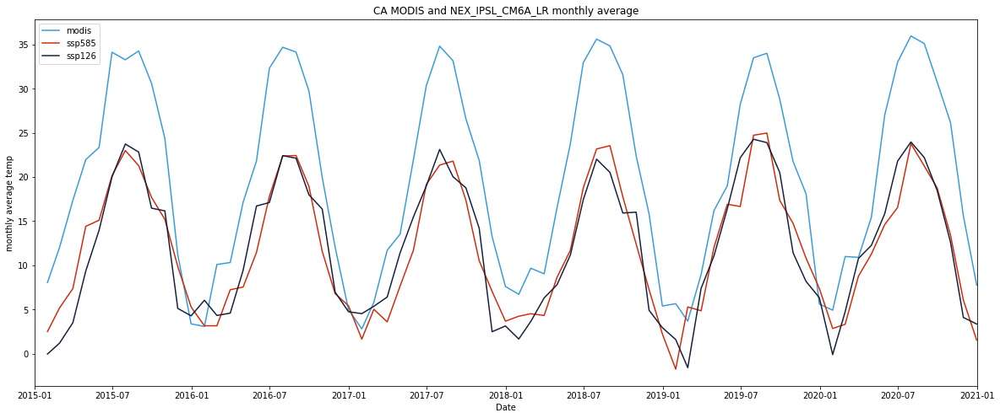

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(CA_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(CA_ssp585_IPSL_CM6A_LR_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(CA_ssp126_IPSL_CM6A_LR_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('CA MODIS and NEX_IPSL_CM6A_LR monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE

#this model missing 2020-12 data
CA_ssp585_IPSL_CM6A_LR_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp585_IPSL_CM6A_LR_monthly_avg_temp)) 
CA_ssp585_IPSL_CM6A_LR_monthly_rmse

9.08085875504133

In [ ]:
#calculate RMSE
#this model missing 2020-12 data
CA_ssp126_IPSL_CM6A_LR_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp126_IPSL_CM6A_LR_monthly_avg_temp)) 
CA_ssp126_IPSL_CM6A_LR_monthly_rmse

9.147802980641911

#### time series analysis

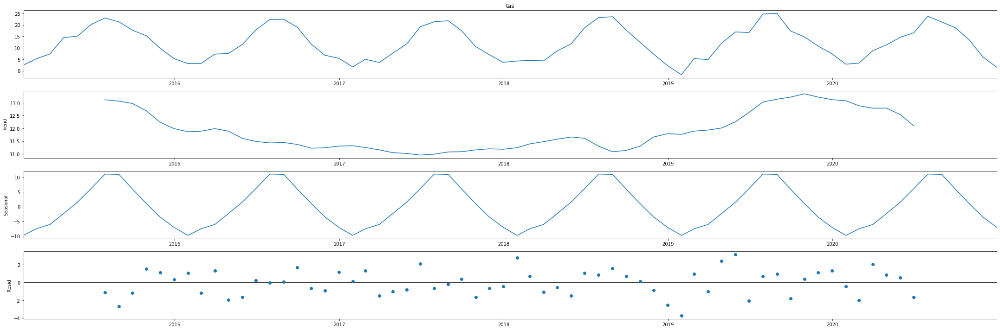

In [ ]:

CA_ssp585_IPSL_CM6A_LR_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp585_IPSL_CM6A_LR_monthly_avg_temp, model='additive')
fig = CA_ssp585_IPSL_CM6A_LR_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

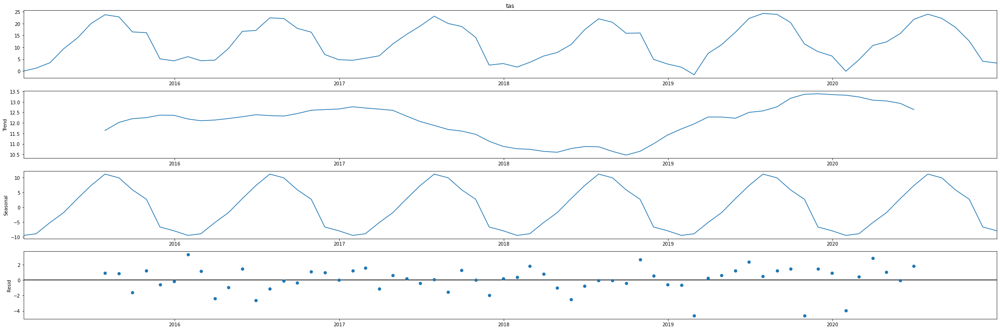

In [ ]:

CA_ssp126_IPSL_CM6A_LR_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp126_IPSL_CM6A_LR_monthly_avg_temp, model='additive')
fig = CA_ssp126_IPSL_CM6A_LR_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

#### R square

In [ ]:
CA_ssp585_IPSL_CM6A_LR_model = LinearRegression()
x = CA_ssp585_IPSL_CM6A_LR_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
CA_ssp585_IPSL_CM6A_LR_model.fit(x, y)
CA_ssp585_IPSL_CM6A_LR_r_squared =CA_ssp585_IPSL_CM6A_LR_model.score(x, y)
CA_ssp585_IPSL_CM6A_LR_r_squared

0.9079840856353691

In [ ]:
CA_ssp126_IPSL_CM6A_LR_model = LinearRegression()
x = CA_ssp126_IPSL_CM6A_LR_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)


In [ ]:
CA_ssp126_IPSL_CM6A_LR_model.fit(x, y)
CA_ssp126_IPSL_CM6A_LR_r_squared = CA_ssp126_IPSL_CM6A_LR_model.score(x, y)
CA_ssp126_IPSL_CM6A_LR_r_squared

0.8629961616667403

#### seasonal analysis

In [ ]:
month = CA_ssp585_IPSL_CM6A_LR_monthly_avg_temp.index.month
CA_ssp585_IPSL_CM6A_LR_winter = pd.concat([CA_ssp585_IPSL_CM6A_LR_monthly_avg_temp[month == 1], CA_ssp585_IPSL_CM6A_LR_monthly_avg_temp[month == 2],CA_ssp585_IPSL_CM6A_LR_monthly_avg_temp[month == 12]])
CA_ssp585_IPSL_CM6A_LR_spring = pd.concat([CA_ssp585_IPSL_CM6A_LR_monthly_avg_temp[month == 3], CA_ssp585_IPSL_CM6A_LR_monthly_avg_temp[month == 4],CA_ssp585_IPSL_CM6A_LR_monthly_avg_temp[month == 5]])
CA_ssp585_IPSL_CM6A_LR_summer = pd.concat([CA_ssp585_IPSL_CM6A_LR_monthly_avg_temp[month == 6], CA_ssp585_IPSL_CM6A_LR_monthly_avg_temp[month == 7],CA_ssp585_IPSL_CM6A_LR_monthly_avg_temp[month == 8]])
CA_ssp585_IPSL_CM6A_LR_fall = pd.concat([CA_ssp585_IPSL_CM6A_LR_monthly_avg_temp[month == 9], CA_ssp585_IPSL_CM6A_LR_monthly_avg_temp[month == 10],CA_ssp585_IPSL_CM6A_LR_monthly_avg_temp[month == 11]])
CA_ssp585_IPSL_CM6A_LR_winter.sort_index()
CA_ssp585_IPSL_CM6A_LR_spring.sort_index()
CA_ssp585_IPSL_CM6A_LR_summer.sort_index()
CA_ssp585_IPSL_CM6A_LR_fall.sort_index()

time
2015-09-30    17.697195
2015-10-31    15.213724
2015-11-30     9.869172
2016-09-30    18.951273
2016-10-31    11.576255
2016-11-30     6.794849
2017-09-30    17.388174
2017-10-31    10.520878
2017-11-30     7.053915
2018-09-30    17.766654
2018-10-31    12.410558
2018-11-30     7.267322
2019-09-30    17.343573
2019-10-31    14.753164
2019-11-30    10.825921
2020-09-30    18.757633
2020-10-31    13.434022
2020-11-30     6.060654
Name: tas, dtype: float64

In [ ]:
month = CA_ssp126_IPSL_CM6A_LR_monthly_avg_temp.index.month
CA_ssp126_IPSL_CM6A_LR_winter = pd.concat([CA_ssp126_IPSL_CM6A_LR_monthly_avg_temp[month == 1], CA_ssp126_IPSL_CM6A_LR_monthly_avg_temp[month == 2],CA_ssp126_IPSL_CM6A_LR_monthly_avg_temp[month == 12]])
CA_ssp126_IPSL_CM6A_LR_spring = pd.concat([CA_ssp126_IPSL_CM6A_LR_monthly_avg_temp[month == 3], CA_ssp126_IPSL_CM6A_LR_monthly_avg_temp[month == 4],CA_ssp126_IPSL_CM6A_LR_monthly_avg_temp[month == 5]])
CA_ssp126_IPSL_CM6A_LR_summer = pd.concat([CA_ssp126_IPSL_CM6A_LR_monthly_avg_temp[month == 6], CA_ssp126_IPSL_CM6A_LR_monthly_avg_temp[month == 7],CA_ssp126_IPSL_CM6A_LR_monthly_avg_temp[month == 8]])
CA_ssp126_IPSL_CM6A_LR_fall = pd.concat([CA_ssp126_IPSL_CM6A_LR_monthly_avg_temp[month == 9], CA_ssp126_IPSL_CM6A_LR_monthly_avg_temp[month == 10],CA_ssp126_IPSL_CM6A_LR_monthly_avg_temp[month == 11]])
CA_ssp126_IPSL_CM6A_LR_winter.sort_index()
CA_ssp126_IPSL_CM6A_LR_spring.sort_index()
CA_ssp126_IPSL_CM6A_LR_summer.sort_index()
CA_ssp126_IPSL_CM6A_LR_fall.sort_index()

time
2015-09-30    16.476566
2015-10-31    16.171035
2015-11-30     5.128784
2016-09-30    17.990764
2016-10-31    16.373970
2016-11-30     6.963931
2017-09-30    18.784023
2017-10-31    14.192349
2017-11-30     2.489549
2018-09-30    15.924324
2018-10-31    16.023092
2018-11-30     4.920012
2019-09-30    20.497729
2019-10-31    11.411475
2019-11-30     8.190509
2020-09-30    18.481905
2020-10-31    12.629572
2020-11-30     4.103119
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = CA_ssp126_IPSL_CM6A_LR_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.00597514384662412
coef:  [[-0.09550219]]
intercept:  [6.87374245]


In [ ]:
x = CA_ssp126_IPSL_CM6A_LR_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.433695030006662
coef:  [[0.89219297]]
intercept:  [7.58643766]


In [ ]:
x = CA_ssp126_IPSL_CM6A_LR_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.11782700518344058
coef:  [[0.29845772]]
intercept:  [27.12994727]


In [ ]:
x = CA_ssp126_KACE_1_0_G_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.5584738589448675
coef:  [[0.9142615]]
intercept:  [12.45658527]


#####ssp585

In [ ]:
x = CA_ssp585_IPSL_CM6A_LR_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.0013665049339096624
coef:  [[0.05036914]]
intercept:  [6.39377624]


In [ ]:
x = CA_ssp585_IPSL_CM6A_LR_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.6402878846571108
coef:  [[1.13289482]]
intercept:  [5.71844623]


In [ ]:
x = CA_ssp585_IPSL_CM6A_LR_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.441699503804972
coef:  [[0.48055955]]
intercept:  [23.35402035]


In [ ]:
x = CA_ssp585_IPSL_CM6A_LR_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8644531678959334
coef:  [[1.41531512]]
intercept:  [3.88157458]




### CA_NEX_MIROC-ES2L


#### ssp585

In [ ]:
#https://drive.google.com/file/d/11FGRpFlVlws_vZFXvDybxWBXPaKK-221/view?usp=share_link
id = "11FGRpFlVlws_vZFXvDybxWBXPaKK-221"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp585_MIROC-ES2L.csv')

CA_ssp585_MIROC_ES2L = pd.read_csv('CA_ssp585_MIROC-ES2L.csv', parse_dates=['time'], index_col='time')
CA_ssp585_MIROC_ES2L.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,-120.125,11.159882
2015-01-01,1,36.375,-119.875,10.599792
2015-01-01,2,36.375,-119.625,10.393127
2015-01-01,3,36.375,-119.375,10.571472
2015-01-01,4,36.375,-119.125,11.274780


In [ ]:
CA_ssp585_MIROC_ES2L

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,-120.125,11.159882
2015-01-01,1,36.375,-119.875,10.599792
2015-01-01,2,36.375,-119.625,10.393127
2015-01-01,3,36.375,-119.375,10.571472
2015-01-01,4,36.375,-119.125,11.274780
...,...,...,...,...
2020-12-31,341947,39.125,-118.125,-9.721069
2020-12-31,341948,39.125,-117.875,-9.950409
2020-12-31,341949,39.125,-117.625,-11.263306


In [ ]:
CA_ssp585_MIROC_ES2L['tas'].isnull().sum()

0

In [ ]:
CA_ssp585_MIROC_ES2L_avg_temp = CA_ssp585_MIROC_ES2L.groupby(CA_ssp585_MIROC_ES2L.index)['tas'].mean()
CA_ssp585_MIROC_ES2L_avg_temp

time
2015-01-01    3.211375
2015-01-02    3.615398
2015-01-03    3.925084
2015-01-04    4.683167
2015-01-05    5.979836
                ...   
2020-12-27    0.261056
2020-12-28   -1.599335
2020-12-29    3.907232
2020-12-30    3.736812
2020-12-31   -3.666061
Name: tas, Length: 2192, dtype: float64

In [ ]:
CA_ssp585_MIROC_ES2L_monthly_avg_temp = CA_ssp585_MIROC_ES2L_avg_temp.resample('M').mean()
CA_ssp585_MIROC_ES2L_monthly_avg_temp

time
2015-01-31     2.393053
2015-02-28     4.043405
2015-03-31     6.559486
2015-04-30     8.992378
2015-05-31    14.995184
                ...    
2020-08-31    21.986841
2020-09-30    19.578168
2020-10-31    13.299705
2020-11-30     6.687100
2020-12-31     2.512276
Freq: M, Name: tas, Length: 72, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/1ujqp6u5N1_qNlsruaPuFEmPpuMD0Gck1/view?usp=share_link
id = "1ujqp6u5N1_qNlsruaPuFEmPpuMD0Gck1"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_SSP126_MIROC-ES2L.csv')

CA_ssp126_MIROC_ES2L = pd.read_csv('CA_SSP126_MIROC-ES2L.csv', parse_dates=['time'], index_col='time')
CA_ssp126_MIROC_ES2L.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,39.125,-120.125,0.886993
2015-01-01,1,39.125,-119.875,0.983215
2015-01-01,2,39.125,-119.625,1.696899
2015-01-01,3,39.125,-119.375,0.630432
2015-01-01,4,39.125,-119.125,2.463654


In [ ]:
CA_ssp126_MIROC_ES2L['tas'].isnull().sum()

0

In [ ]:
CA_ssp126_MIROC_ES2L_avg_temp = CA_ssp126_MIROC_ES2L.groupby(CA_ssp126_MIROC_ES2L.index)['tas'].mean()
CA_ssp126_MIROC_ES2L_avg_temp

time
2015-01-01    3.065471
2015-01-02    3.524503
2015-01-03    3.996791
2015-01-04    4.800297
2015-01-05    6.018918
                ...   
2020-12-27   -0.200313
2020-12-28    1.436884
2020-12-29    1.957977
2020-12-30    1.715053
2020-12-31    0.592562
Name: tas, Length: 2192, dtype: float64

In [ ]:
CA_ssp126_MIROC_ES2L_monthly_avg_temp = CA_ssp126_MIROC_ES2L_avg_temp.resample('M').mean()
CA_ssp126_MIROC_ES2L_monthly_avg_temp 

time
2015-01-31     2.970394
2015-02-28     3.293587
2015-03-31     6.200392
2015-04-30     9.052507
2015-05-31    15.032337
                ...    
2020-08-31    22.847019
2020-09-30    20.593787
2020-10-31    15.951304
2020-11-30     6.054464
2020-12-31     3.923394
Freq: M, Name: tas, Length: 72, dtype: float64

#### compare modis with ssp585 and ssp126

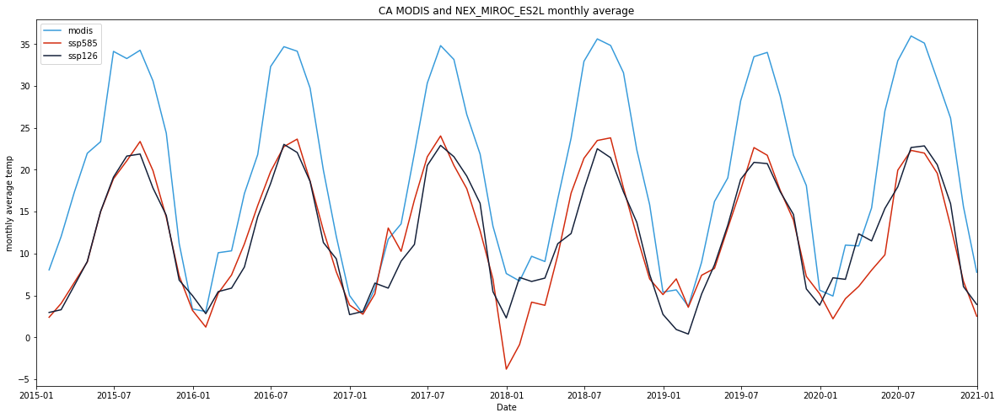

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(CA_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(CA_ssp585_MIROC_ES2L_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(CA_ssp126_MIROC_ES2L_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('CA MODIS and NEX_MIROC_ES2L monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE

#this model missing 2020-12 data
CA_ssp585_MIROC_ES2L_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp585_MIROC_ES2L_monthly_avg_temp)) 
CA_ssp585_MIROC_ES2L_monthly_rmse

8.925134082395688

In [ ]:
#calculate RMSE
#this model missing 2020-12 data
CA_ssp126_MIROC_ES2L_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp126_MIROC_ES2L_monthly_avg_temp)) 
CA_ssp126_MIROC_ES2L_monthly_rmse

9.043180201806123

#### time series analysis

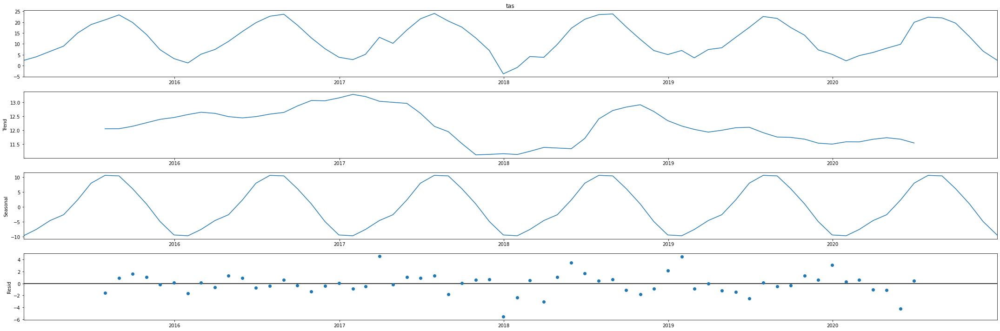

In [ ]:

CA_ssp585_MIROC_ES2L_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp585_MIROC_ES2L_monthly_avg_temp, model='additive')
fig = CA_ssp585_MIROC_ES2L_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

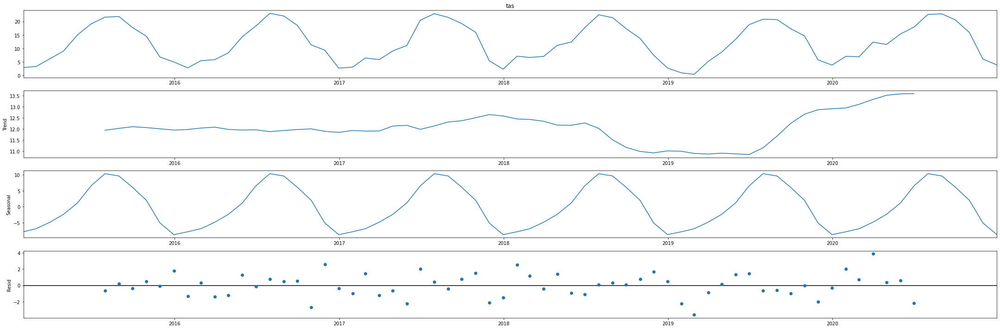

In [ ]:

CA_ssp126_MIROC_ES2L_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp126_MIROC_ES2L_monthly_avg_temp, model='additive')
fig = CA_ssp126_MIROC_ES2L_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

#### R square

In [ ]:
CA_ssp585_MIROC_ES2L_model = LinearRegression()
x = CA_ssp585_MIROC_ES2L_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
CA_ssp585_MIROC_ES2L_model.fit(x, y)
CA_ssp585_MIROC_ES2L_r_squared =CA_ssp585_MIROC_ES2L_model.score(x, y)
CA_ssp585_MIROC_ES2L_r_squared

0.8993249574158547

In [ ]:
CA_ssp126_MIROC_ES2L_model = LinearRegression()
x = CA_ssp126_MIROC_ES2L_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)


In [ ]:
CA_ssp126_MIROC_ES2L_model.fit(x, y)
CA_ssp126_MIROC_ES2L_r_squared = CA_ssp126_MIROC_ES2L_model.score(x, y)
CA_ssp126_MIROC_ES2L_r_squared

0.9103716811707298

#### seasonal analysis

In [ ]:
month = CA_ssp585_MIROC_ES2L_monthly_avg_temp.index.month
CA_ssp585_MIROC_ES2L_winter = pd.concat([CA_ssp585_MIROC_ES2L_monthly_avg_temp[month == 1], CA_ssp585_MIROC_ES2L_monthly_avg_temp[month == 2],CA_ssp585_MIROC_ES2L_monthly_avg_temp[month == 12]])
CA_ssp585_MIROC_ES2L_spring = pd.concat([CA_ssp585_MIROC_ES2L_monthly_avg_temp[month == 3], CA_ssp585_MIROC_ES2L_monthly_avg_temp[month == 4],CA_ssp585_MIROC_ES2L_monthly_avg_temp[month == 5]])
CA_ssp585_MIROC_ES2L_summer = pd.concat([CA_ssp585_MIROC_ES2L_monthly_avg_temp[month == 6], CA_ssp585_MIROC_ES2L_monthly_avg_temp[month == 7],CA_ssp585_MIROC_ES2L_monthly_avg_temp[month == 8]])
CA_ssp585_MIROC_ES2L_fall = pd.concat([CA_ssp585_MIROC_ES2L_monthly_avg_temp[month == 9], CA_ssp585_MIROC_ES2L_monthly_avg_temp[month == 10],CA_ssp585_MIROC_ES2L_monthly_avg_temp[month == 11]])
CA_ssp585_MIROC_ES2L_winter.sort_index()
CA_ssp585_MIROC_ES2L_spring.sort_index()
CA_ssp585_MIROC_ES2L_summer.sort_index()
CA_ssp585_MIROC_ES2L_fall.sort_index()

time
2015-09-30    19.897310
2015-10-31    14.325228
2015-11-30     7.339189
2016-09-30    18.647196
2016-10-31    12.757120
2016-11-30     7.816380
2017-09-30    17.739945
2017-10-31    12.731920
2017-11-30     6.961127
2018-09-30    17.825624
2018-10-31    12.122000
2018-11-30     6.968514
2019-09-30    17.563642
2019-10-31    13.993332
2019-11-30     7.271202
2020-09-30    19.578168
2020-10-31    13.299705
2020-11-30     6.687100
Name: tas, dtype: float64

In [ ]:
month = CA_ssp126_MIROC_ES2L_monthly_avg_temp.index.month
CA_ssp126_MIROC_ES2L_winter = pd.concat([CA_ssp126_MIROC_ES2L_monthly_avg_temp[month == 1], CA_ssp126_MIROC_ES2L_monthly_avg_temp[month == 2],CA_ssp126_MIROC_ES2L_monthly_avg_temp[month == 12]])
CA_ssp126_MIROC_ES2L_spring = pd.concat([CA_ssp126_MIROC_ES2L_monthly_avg_temp[month == 3], CA_ssp126_MIROC_ES2L_monthly_avg_temp[month == 4],CA_ssp126_MIROC_ES2L_monthly_avg_temp[month == 5]])
CA_ssp126_MIROC_ES2L_summer = pd.concat([CA_ssp126_MIROC_ES2L_monthly_avg_temp[month == 6], CA_ssp126_MIROC_ES2L_monthly_avg_temp[month == 7],CA_ssp126_MIROC_ES2L_monthly_avg_temp[month == 8]])
CA_ssp126_MIROC_ES2L_fall = pd.concat([CA_ssp126_MIROC_ES2L_monthly_avg_temp[month == 9], CA_ssp126_MIROC_ES2L_monthly_avg_temp[month == 10],CA_ssp126_MIROC_ES2L_monthly_avg_temp[month == 11]])
CA_ssp126_MIROC_ES2L_winter.sort_index()
CA_ssp126_MIROC_ES2L_spring.sort_index()
CA_ssp126_MIROC_ES2L_summer.sort_index()
CA_ssp126_MIROC_ES2L_fall.sort_index()

time
2015-09-30    17.818718
2015-10-31    14.553403
2015-11-30     6.826317
2016-09-30    18.599831
2016-10-31    11.312140
2016-11-30     9.376187
2017-09-30    19.241051
2017-10-31    15.997859
2017-11-30     5.448823
2018-09-30    17.362245
2018-10-31    13.731075
2018-11-30     7.513925
2019-09-30    17.393149
2019-10-31    14.665935
2019-11-30     5.782887
2020-09-30    20.593787
2020-10-31    15.951304
2020-11-30     6.054464
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = CA_ssp126_MIROC_ES2L_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.11552409569036715
coef:  [[0.44285774]]
intercept:  [4.75960428]


In [ ]:
x = CA_ssp126_MIROC_ES2L_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.5353198150492966
coef:  [[1.2135693]]
intercept:  [4.72934705]


In [ ]:
x = CA_ssp126_MIROC_ES2L_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.3755415351691387
coef:  [[0.64049543]]
intercept:  [20.17308584]


In [ ]:
x = CA_ssp126_MIROC_ES2L_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8361011680601206
coef:  [[1.2008864]]
intercept:  [6.36262717]


#####ssp585

In [ ]:
x = CA_ssp585_MIROC_ES2L_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.007636911360866527
coef:  [[0.09673887]]
intercept:  [6.26495588]


In [ ]:
x = CA_ssp585_MIROC_ES2L_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.4285944424385524
coef:  [[0.9330498]]
intercept:  [7.2578999]


In [ ]:
x = CA_ssp585_MIROC_ES2L_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.47713325606276813
coef:  [[0.71691336]]
intercept:  [18.01811475]


In [ ]:
x = CA_ssp585_MIROC_ES2L_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9019381066448777
coef:  [[1.33227159]]
intercept:  [4.97154681]




### CA_NEX_MIROC6


#### ssp585

In [ ]:
#https://drive.google.com/file/d/1neJSPUw31nxw5E-9EnxCM-Nvw2XJvpIM/view?usp=share_link
id = "1neJSPUw31nxw5E-9EnxCM-Nvw2XJvpIM"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp585_MIROC6.csv')

CA_ssp585_MIROC6 = pd.read_csv('CA_ssp585_MIROC6.csv', parse_dates=['time'], index_col='time')
CA_ssp585_MIROC6.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,-120.125,10.116486
2015-01-01,1,36.375,-119.875,9.726318
2015-01-01,2,36.375,-119.625,9.689575
2015-01-01,3,36.375,-119.375,10.080902
2015-01-01,4,36.375,-119.125,11.023071


In [ ]:
CA_ssp585_MIROC6

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,-120.125,10.116486
2015-01-01,1,36.375,-119.875,9.726318
2015-01-01,2,36.375,-119.625,9.689575
2015-01-01,3,36.375,-119.375,10.080902
2015-01-01,4,36.375,-119.125,11.023071
...,...,...,...,...
2020-12-31,341947,39.125,-118.125,3.524841
2020-12-31,341948,39.125,-117.875,3.660858
2020-12-31,341949,39.125,-117.625,2.713318


In [ ]:
CA_ssp585_MIROC6['tas'].isnull().sum()

0

In [ ]:
CA_ssp585_MIROC6_avg_temp = CA_ssp585_MIROC6.groupby(CA_ssp585_MIROC6.index)['tas'].mean()
CA_ssp585_MIROC6_avg_temp

time
2015-01-01    5.513693
2015-01-02    4.397150
2015-01-03    3.957722
2015-01-04    3.140236
2015-01-05    0.816808
                ...   
2020-12-27    3.201723
2020-12-28    2.471488
2020-12-29    1.235677
2020-12-30    1.655187
2020-12-31    3.598134
Name: tas, Length: 2192, dtype: float64

In [ ]:
CA_ssp585_MIROC6_monthly_avg_temp = CA_ssp585_MIROC6_avg_temp.resample('M').mean()
CA_ssp585_MIROC6_monthly_avg_temp

time
2015-01-31     3.103021
2015-02-28     5.278240
2015-03-31     6.919571
2015-04-30    11.259168
2015-05-31    17.302706
                ...    
2020-08-31    23.120289
2020-09-30    17.427365
2020-10-31    15.911740
2020-11-30     8.270736
2020-12-31     5.214256
Freq: M, Name: tas, Length: 72, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/1wenrBctzLOJQPW-_feB0afZdEe3Ep_6D/view?usp=share_link
id = "1wenrBctzLOJQPW-_feB0afZdEe3Ep_6D"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_SSP126_MIROC6.csv')

CA_ssp126_MIROC6= pd.read_csv('CA_SSP126_MIROC6.csv', parse_dates=['time'], index_col='time')
CA_ssp126_MIROC6.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,39.125,-120.125,2.996643
2015-01-01,1,39.125,-119.875,3.584412
2015-01-01,2,39.125,-119.625,4.789581
2015-01-01,3,39.125,-119.375,4.101257
2015-01-01,4,39.125,-119.125,6.244629


In [ ]:
CA_ssp126_MIROC6['tas'].isnull().sum()

0

In [ ]:
CA_ssp126_MIROC6_avg_temp = CA_ssp126_MIROC6.groupby(CA_ssp126_MIROC6.index)['tas'].mean()
CA_ssp126_MIROC6_avg_temp

time
2015-01-01    5.513115
2015-01-02    4.554268
2015-01-03    3.897585
2015-01-04    3.213165
2015-01-05    0.781207
                ...   
2020-12-27    6.198933
2020-12-28    3.561479
2020-12-29    1.838815
2020-12-30    0.913796
2020-12-31    3.139205
Name: tas, Length: 2192, dtype: float64

In [ ]:
CA_ssp126_MIROC6_monthly_avg_temp = CA_ssp126_MIROC6_avg_temp.resample('M').mean()
CA_ssp126_MIROC6_monthly_avg_temp 

time
2015-01-31     2.731442
2015-02-28     3.750952
2015-03-31     7.652702
2015-04-30    10.230577
2015-05-31    15.983804
                ...    
2020-08-31    24.335150
2020-09-30    20.195643
2020-10-31    14.337209
2020-11-30     7.296123
2020-12-31     4.796973
Freq: M, Name: tas, Length: 72, dtype: float64

#### compare modis with ssp585 and ssp126

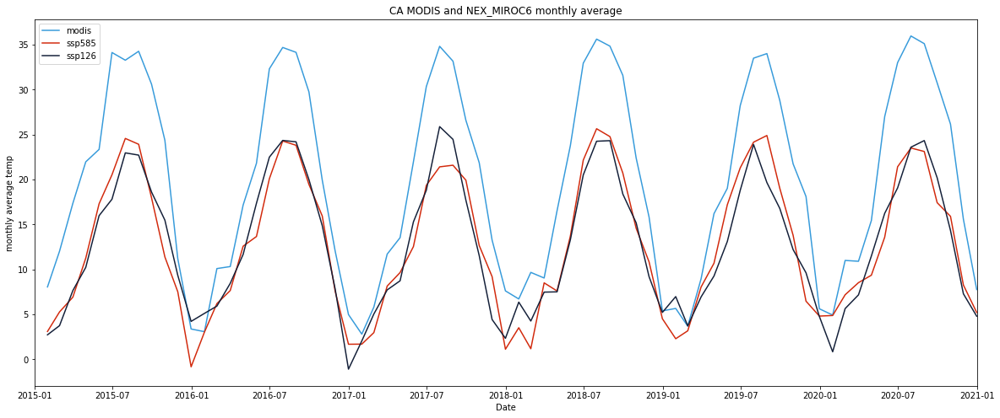

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(CA_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(CA_ssp585_MIROC6_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(CA_ssp126_MIROC6_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('CA MODIS and NEX_MIROC6 monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE

#this model missing 2020-12 data
CA_ssp585_MIROC6_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp585_MIROC6_monthly_avg_temp)) 
CA_ssp585_MIROC6_monthly_rmse

8.155260421344114

In [ ]:
#calculate RMSE
#this model missing 2020-12 data
CA_ssp126_MIROC6_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp126_MIROC6_monthly_avg_temp)) 
CA_ssp126_MIROC6_monthly_rmse

8.321338442313367

#### time series analysis

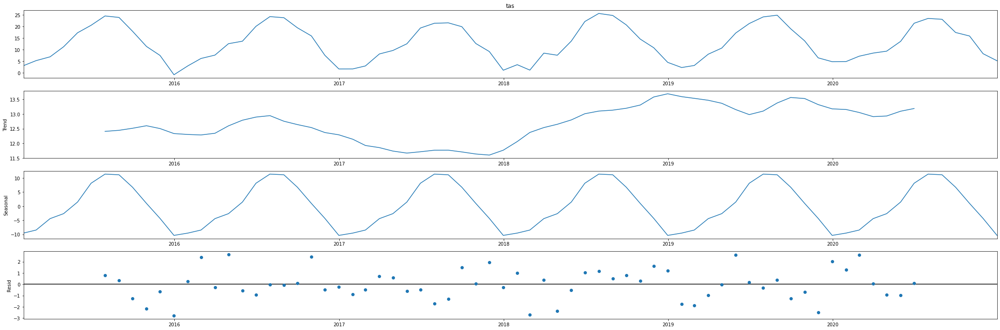

In [ ]:

CA_ssp585_MIROC6_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp585_MIROC6_monthly_avg_temp, model='additive')
fig = CA_ssp585_MIROC6_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

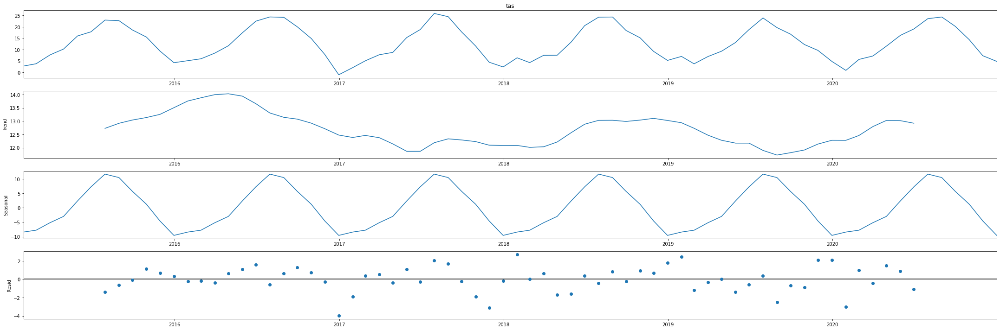

In [ ]:

CA_ssp126_MIROC6_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp126_MIROC6_monthly_avg_temp, model='additive')
fig = CA_ssp126_MIROC6_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

#### R square

In [ ]:
CA_ssp585_MIROC6_model = LinearRegression()
x = CA_ssp585_MIROC6_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
CA_ssp585_MIROC6_model.fit(x, y)
CA_ssp585_MIROC6_r_squared =CA_ssp585_MIROC6_model.score(x, y)
CA_ssp585_MIROC6_r_squared

0.926230992679149

In [ ]:
CA_ssp126_MIROC6_model = LinearRegression()
x = CA_ssp126_MIROC6_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)


In [ ]:
CA_ssp126_MIROC6_model.fit(x, y)
CA_ssp126_MIROC6_r_squared = CA_ssp126_MIROC6_model.score(x, y)
CA_ssp126_MIROC6_r_squared

0.921059367270158

#### seasonal analysis

In [ ]:
month = CA_ssp585_MIROC6_monthly_avg_temp.index.month
CA_ssp585_MIROC6_winter = pd.concat([CA_ssp585_MPI_ESM1_2_HR_monthly_avg_temp[month == 1], CA_ssp585_MIROC6_monthly_avg_temp[month == 2],CA_ssp585_MIROC6_monthly_avg_temp[month == 12]])
CA_ssp585_MIROC6_spring = pd.concat([CA_ssp585_MPI_ESM1_2_HR_monthly_avg_temp[month == 3], CA_ssp585_MIROC6_monthly_avg_temp[month == 4],CA_ssp585_MIROC6_monthly_avg_temp[month == 5]])
CA_ssp585_MIROC6_summer = pd.concat([CA_ssp585_MPI_ESM1_2_HR_monthly_avg_temp[month == 6], CA_ssp585_MIROC6_monthly_avg_temp[month == 7],CA_ssp585_MIROC6_monthly_avg_temp[month == 8]])
CA_ssp585_MIROC6_fall = pd.concat([CA_ssp585_MPI_ESM1_2_HR_monthly_avg_temp[month == 9], CA_ssp585_MIROC6_monthly_avg_temp[month == 10],CA_ssp585_MIROC6_monthly_avg_temp[month == 11]])
CA_ssp585_MIROC6_winter.sort_index()
CA_ssp585_MIROC6_spring.sort_index()
CA_ssp585_MIROC6_summer.sort_index()
CA_ssp585_MIROC6_fall.sort_index()

time
2015-09-30    16.193795
2015-10-31    11.393859
2015-11-30     7.522606
2016-09-30    20.709069
2016-10-31    15.948464
2016-11-30     7.567874
2017-09-30    18.491418
2017-10-31    12.670817
2017-11-30     9.200321
2018-09-30    19.859430
2018-10-31    14.578513
2018-11-30    10.844657
2019-09-30    17.273953
2019-10-31    13.802190
2019-11-30     6.473983
2020-09-30    16.906171
2020-10-31    15.911740
2020-11-30     8.270736
Name: tas, dtype: float64

In [ ]:
month = CA_ssp126_MIROC6_monthly_avg_temp.index.month
CA_ssp126_MIROC6_winter = pd.concat([CA_ssp126_MIROC6_monthly_avg_temp[month == 1], CA_ssp126_MIROC6_monthly_avg_temp[month == 2],CA_ssp126_MIROC6_monthly_avg_temp[month == 12]])
CA_ssp126_MIROC6_spring = pd.concat([CA_ssp126_MIROC6_monthly_avg_temp[month == 3], CA_ssp126_MIROC6_monthly_avg_temp[month == 4],CA_ssp126_MIROC6_monthly_avg_temp[month == 5]])
CA_ssp126_MIROC6_summer = pd.concat([CA_ssp126_MIROC6_monthly_avg_temp[month == 6], CA_ssp126_MIROC6_monthly_avg_temp[month == 7],CA_ssp126_MIROC6_monthly_avg_temp[month == 8]])
CA_ssp126_MIROC6_fall = pd.concat([CA_ssp126_MIROC6_monthly_avg_temp[month == 9], CA_ssp126_MIROC6_monthly_avg_temp[month == 10],CA_ssp126_MIROC6_monthly_avg_temp[month == 11]])
CA_ssp126_MIROC6_winter.sort_index()
CA_ssp126_MIROC6_spring.sort_index()
CA_ssp126_MIROC6_summer.sort_index()
CA_ssp126_MIROC6_fall.sort_index()

time
2015-09-30    18.608281
2015-10-31    15.486170
2015-11-30     9.353356
2016-09-30    19.998167
2016-10-31    14.869084
2016-11-30     7.836776
2017-09-30    17.709721
2017-10-31    11.545697
2017-11-30     4.432182
2018-09-30    18.387169
2018-10-31    15.186995
2018-11-30     9.199512
2019-09-30    16.789327
2019-10-31    12.207412
2019-11-30     9.630029
2020-09-30    20.195643
2020-10-31    14.337209
2020-11-30     7.296123
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = CA_ssp126_MIROC6_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.054745320348566495
coef:  [[0.31823159]]
intercept:  [5.28888671]


In [ ]:
x = CA_ssp126_MIROC6_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.7061255124190314
coef:  [[1.30413709]]
intercept:  [2.82930122]


In [ ]:
x = CA_ssp126_MIROC6_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.37197478475611545
coef:  [[0.45428473]]
intercept:  [23.42481099]


In [ ]:
x = CA_ssp126_MIROC6_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8651728339331088
coef:  [[1.32772566]]
intercept:  [4.32652304]


#####ssp585

In [ ]:
x = CA_ssp585_MIROC6_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.29813093794877377
coef:  [[0.71057005]]
intercept:  [4.39314749]


In [ ]:
x = CA_ssp585_MIROC6_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.6174287828762193
coef:  [[1.07417226]]
intercept:  [6.00117973]


In [ ]:
x = CA_ssp585_MIROC6_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.4591843940844911
coef:  [[0.34767656]]
intercept:  [26.11524416]


In [ ]:
x = CA_ssp585_MIROC6_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.7812469900894725
coef:  [[1.33717589]]
intercept:  [4.15799575]


###CA_NEX_HadGEM3_GC31_MM

####SSP585

In [ ]:
#https://drive.google.com/file/d/1_hLFvVIFldVHshC0dFdqg824y65zq7J8/view?usp=share_link
id = "1_hLFvVIFldVHshC0dFdqg824y65zq7J8"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp585_HadGEM3_GC31_MM.csv')

CA_ssp585_HadGEM3_GC31_MM = pd.read_csv('CA_ssp585_HadGEM3_GC31_MM.csv', parse_dates=['time'], index_col='time')
CA_ssp585_HadGEM3_GC31_MM.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,-12.383636
2015-01-01,39.125,-119.875,-12.559753
2015-01-01,39.125,-119.625,-12.118439
2015-01-01,39.125,-119.375,-10.802093
2015-01-01,39.125,-119.125,-6.054993


In [ ]:
CA_ssp585_HadGEM3_GC31_MM

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,-12.383636
2015-01-01,39.125,-119.875,-12.559753
2015-01-01,39.125,-119.625,-12.118439
2015-01-01,39.125,-119.375,-10.802093
2015-01-01,39.125,-119.125,-6.054993
...,...,...,...
2020-11-29,36.375,-118.125,-2.283691
2020-11-29,36.375,-117.875,2.827759
2020-11-29,36.375,-117.625,1.209351


In [ ]:
CA_ssp585_HadGEM3_GC31_MM['tas'].isnull().sum()

0

In [ ]:
CA_ssp585_HadGEM3_GC31_MM_avg_temp = CA_ssp585_HadGEM3_GC31_MM.groupby(CA_ssp585_HadGEM3_GC31_MM.index)['tas'].mean()
CA_ssp585_HadGEM3_GC31_MM_avg_temp

time
2015-01-01   -7.944119
2015-01-02   -4.173890
2015-01-03   -0.222225
2015-01-04    2.428429
2015-01-05    0.446194
                ...   
2020-11-25   -0.407094
2020-11-26    2.667687
2020-11-27    1.545380
2020-11-28   -0.804102
2020-11-29    0.701419
Name: tas, Length: 2160, dtype: float64

In [ ]:
CA_ssp585_HadGEM3_GC31_MM_monthly_avg_temp = CA_ssp585_HadGEM3_GC31_MM_avg_temp.resample('M').mean()
CA_ssp585_HadGEM3_GC31_MM_monthly_avg_temp

time
2015-01-31     0.934723
2015-02-28    11.092531
2015-03-31     4.597645
2015-04-30    10.231115
2015-05-31    14.368409
                ...    
2020-07-31    24.089979
2020-08-31    20.130693
2020-09-30    13.561878
2020-10-31     9.242700
2020-11-30     6.487699
Freq: M, Name: tas, Length: 71, dtype: float64

####SSP126

In [ ]:
#https://drive.google.com/file/d/1OIsoCZ2RJLij25hJBrReE2ZE87vU3NO2/view?usp=share_link
id = "1OIsoCZ2RJLij25hJBrReE2ZE87vU3NO2"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp126_HadGEM3_GC31_MM.csv')

CA_ssp126_HadGEM3_GC31_MM = pd.read_csv('CA_ssp126_HadGEM3_GC31_MM.csv', parse_dates=['time'], index_col='time')
CA_ssp126_HadGEM3_GC31_MM.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,-11.958191
2015-01-01,39.125,-119.875,-11.748352
2015-01-01,39.125,-119.625,-10.921082
2015-01-01,39.125,-119.375,-9.716919
2015-01-01,39.125,-119.125,-5.181641


In [ ]:
CA_ssp126_HadGEM3_GC31_MM['tas'].isnull().sum()

0

In [ ]:
CA_ssp126_HadGEM3_GC31_MM_avg_temp = CA_ssp126_HadGEM3_GC31_MM.groupby(CA_ssp126_HadGEM3_GC31_MM.index)['tas'].mean()
CA_ssp126_HadGEM3_GC31_MM_avg_temp

time
2015-01-01   -7.887808
2015-01-02   -4.350133
2015-01-03   -0.226400
2015-01-04    2.439613
2015-01-05    0.391914
                ...   
2020-11-25    7.300457
2020-11-26    7.243255
2020-11-27    8.208054
2020-11-28    8.080878
2020-11-29    7.234051
Name: tas, Length: 2160, dtype: float64

In [ ]:
CA_ssp126_HadGEM3_GC31_MM_monthly_avg_temp = CA_ssp126_HadGEM3_GC31_MM_avg_temp.resample('M').mean()
CA_ssp126_HadGEM3_GC31_MM_monthly_avg_temp

time
2015-01-31     2.211009
2015-02-28     7.004827
2015-03-31     8.370309
2015-04-30    12.755955
2015-05-31    14.394645
                ...    
2020-07-31    23.750814
2020-08-31    21.292682
2020-09-30    16.717058
2020-10-31     8.540766
2020-11-30     2.506283
Freq: M, Name: tas, Length: 71, dtype: float64

####compare modis with ssp585 and ssp126

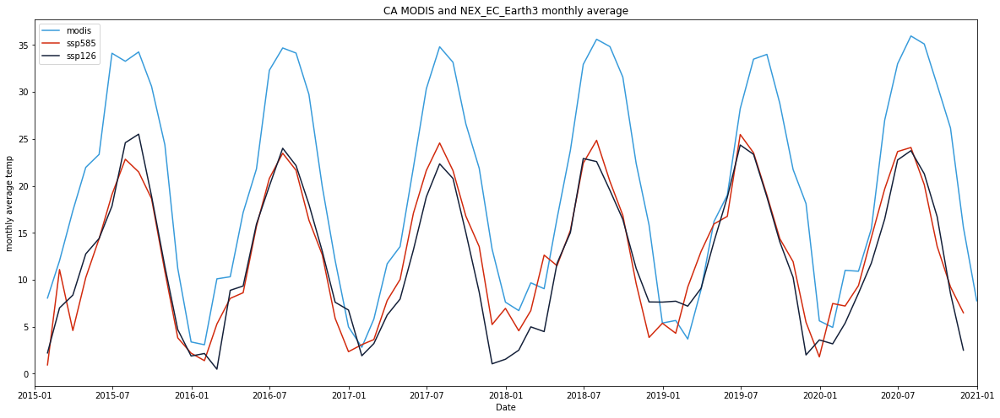

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(CA_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(CA_ssp585_HadGEM3_GC31_MM_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(CA_ssp126_HadGEM3_GC31_MM_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('CA MODIS and NEX_EC_Earth3 monthly average')
plt.show()

####RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
CA_ssp585_HadGEM3_GC31_MM_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month[:-1], CA_ssp585_HadGEM3_GC31_MM_monthly_avg_temp)) 
CA_ssp585_HadGEM3_GC31_MM_monthly_rmse

9.104615981188386

In [ ]:
CA_ssp126_HadGEM3_GC31_MM_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month[:-1], CA_ssp126_HadGEM3_GC31_MM_monthly_avg_temp)) 
CA_ssp126_HadGEM3_GC31_MM_monthly_rmse

9.437184082367402

####time series analysis

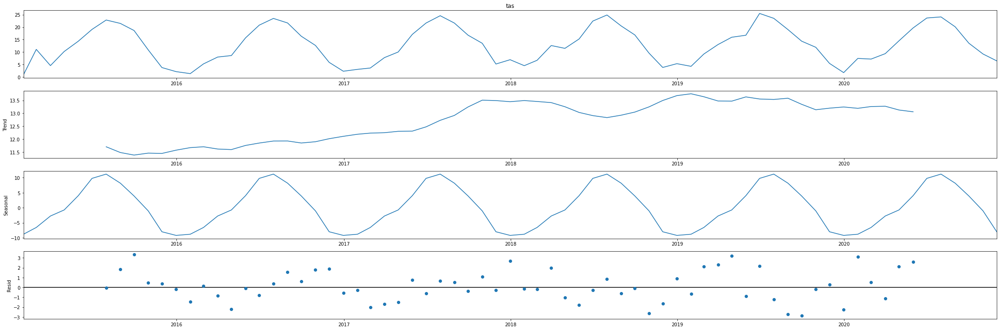

In [ ]:
CA_ssp585_HadGEM3_GC31_MM_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp585_HadGEM3_GC31_MM_monthly_avg_temp, model='additive')
fig = CA_ssp585_HadGEM3_GC31_MM_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

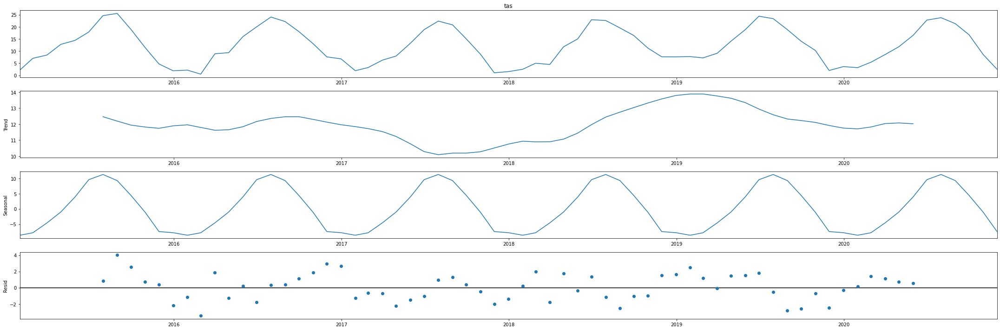

In [ ]:
CA_ssp126_HadGEM3_GC31_MM_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp126_HadGEM3_GC31_MM_monthly_avg_temp, model='additive')
fig = CA_ssp126_HadGEM3_GC31_MM_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

####R Square

In [ ]:
CA_ssp585_HadGEM3_GC31_MM_model = LinearRegression()
x = CA_ssp585_HadGEM3_GC31_MM_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month[:-1].values.reshape(-1, 1)

In [ ]:
CA_ssp585_HadGEM3_GC31_MM_model.fit(x, y)
CA_ssp585_HadGEM3_GC31_MM_r_squared =CA_ssp585_HadGEM3_GC31_MM_model.score(x, y)
CA_ssp585_HadGEM3_GC31_MM_r_squared

0.7893812512168972

In [ ]:
CA_ssp126_HadGEM3_GC31_MM_model = LinearRegression()
x = CA_ssp126_HadGEM3_GC31_MM_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month[:-1].values.reshape(-1, 1)

In [ ]:
CA_ssp126_HadGEM3_GC31_MM_model.fit(x, y)
CA_ssp126_HadGEM3_GC31_MM_r_squared =CA_ssp126_HadGEM3_GC31_MM_model.score(x, y)
CA_ssp126_HadGEM3_GC31_MM_r_squared

0.8161570607503329

#### seasonal analysis

In [ ]:
month = CA_ssp585_HadGEM3_GC31_MM_monthly_avg_temp.index.month
CA_ssp585_HadGEM3_GC31_MM_winter = pd.concat([CA_ssp585_HadGEM3_GC31_MM_monthly_avg_temp[month == 1], CA_ssp585_HadGEM3_GC31_MM_monthly_avg_temp[month == 2],CA_ssp585_HadGEM3_GC31_MM_monthly_avg_temp[month == 12]])
CA_ssp585_HadGEM3_GC31_MM_spring = pd.concat([CA_ssp585_HadGEM3_GC31_MM_monthly_avg_temp[month == 3], CA_ssp585_HadGEM3_GC31_MM_monthly_avg_temp[month == 4],CA_ssp585_HadGEM3_GC31_MM_monthly_avg_temp[month == 5]])
CA_ssp585_HadGEM3_GC31_MM_summer = pd.concat([CA_ssp585_HadGEM3_GC31_MM_monthly_avg_temp[month == 6], CA_ssp585_HadGEM3_GC31_MM_monthly_avg_temp[month == 7],CA_ssp585_HadGEM3_GC31_MM_monthly_avg_temp[month == 8]])
CA_ssp585_HadGEM3_GC31_MM_fall = pd.concat([CA_ssp585_HadGEM3_GC31_MM_monthly_avg_temp[month == 9], CA_ssp585_HadGEM3_GC31_MM_monthly_avg_temp[month == 10],CA_ssp585_HadGEM3_GC31_MM_monthly_avg_temp[month == 11]])
CA_ssp585_HadGEM3_GC31_MM_winter.sort_index()
CA_ssp585_HadGEM3_GC31_MM_spring.sort_index()
CA_ssp585_HadGEM3_GC31_MM_summer.sort_index()
CA_ssp585_HadGEM3_GC31_MM_fall.sort_index()

time
2015-09-30    18.643530
2015-10-31    10.893257
2015-11-30     3.814535
2016-09-30    16.352972
2016-10-31    12.668095
2016-11-30     5.895755
2017-09-30    16.770484
2017-10-31    13.533696
2017-11-30     5.232010
2018-09-30    16.867800
2018-10-31     9.595508
2018-11-30     3.857295
2019-09-30    14.384733
2019-10-31    11.925840
2019-11-30     5.478926
2020-09-30    13.561878
2020-10-31     9.242700
2020-11-30     6.487699
Name: tas, dtype: float64

In [ ]:
month = CA_ssp126_HadGEM3_GC31_MM_monthly_avg_temp.index.month
CA_ssp126_HadGEM3_GC31_MM_winter = pd.concat([CA_ssp126_HadGEM3_GC31_MM_monthly_avg_temp[month == 1], CA_ssp126_HadGEM3_GC31_MM_monthly_avg_temp[month == 2],CA_ssp126_HadGEM3_GC31_MM_monthly_avg_temp[month == 12]])
CA_ssp126_HadGEM3_GC31_MM_spring = pd.concat([CA_ssp126_HadGEM3_GC31_MM_monthly_avg_temp[month == 3], CA_ssp126_HadGEM3_GC31_MM_monthly_avg_temp[month == 4],CA_ssp126_HadGEM3_GC31_MM_monthly_avg_temp[month == 5]])
CA_ssp126_HadGEM3_GC31_MM_summer = pd.concat([CA_ssp126_HadGEM3_GC31_MM_monthly_avg_temp[month == 6], CA_ssp126_HadGEM3_GC31_MM_monthly_avg_temp[month == 7],CA_ssp126_HadGEM3_GC31_MM_monthly_avg_temp[month == 8]])
CA_ssp126_HadGEM3_GC31_MM_fall = pd.concat([CA_ssp126_HadGEM3_GC31_MM_monthly_avg_temp[month == 9], CA_ssp126_HadGEM3_GC31_MM_monthly_avg_temp[month == 10],CA_ssp126_HadGEM3_GC31_MM_monthly_avg_temp[month == 11]])
CA_ssp126_HadGEM3_GC31_MM_winter.sort_index()
CA_ssp126_HadGEM3_GC31_MM_spring.sort_index()
CA_ssp126_HadGEM3_GC31_MM_summer.sort_index()
CA_ssp126_HadGEM3_GC31_MM_fall.sort_index()

time
2015-09-30    18.913607
2015-10-31    11.415381
2015-11-30     4.689258
2016-09-30    18.031626
2016-10-31    13.045638
2016-11-30     7.608184
2017-09-30    15.009373
2017-10-31     8.680648
2017-11-30     1.052778
2018-09-30    16.424000
2018-10-31    11.211835
2018-11-30     7.641423
2019-09-30    14.048716
2019-10-31    10.255977
2019-11-30     1.999368
2020-09-30    16.717058
2020-10-31     8.540766
2020-11-30     2.506283
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = CA_ssp126_HadGEM3_GC31_MM_winter.values.reshape(-1, 1)
y = CA_winter[:-1].values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.008288380000394224
coef:  [[0.10622452]]
intercept:  [6.07188349]


In [ ]:
x = CA_ssp126_HadGEM3_GC31_MM_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.6367856082175102
coef:  [[1.13555462]]
intercept:  [3.94096103]


In [ ]:
x = CA_ssp126_HadGEM3_GC31_MM_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.0004385537239459669
coef:  [[0.01754634]]
intercept:  [33.18945858]


In [ ]:
x = CA_ssp126_HadGEM3_GC31_MM_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.7431989780127066
coef:  [[1.05242973]]
intercept:  [11.27602055]


#####ssp585

In [ ]:
x = CA_ssp585_HadGEM3_GC31_MM_winter.values.reshape(-1, 1)
y = CA_winter[:-1].values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.25489411933091366
coef:  [[0.49440853]]
intercept:  [4.07449396]


In [ ]:
x = CA_ssp585_HadGEM3_GC31_MM_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.30524117890870806
coef:  [[0.76384011]]
intercept:  [7.45112456]


In [ ]:
x = CA_ssp585_HadGEM3_GC31_MM_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.025871047553856497
coef:  [[-0.15615065]]
intercept:  [37.05237186]


In [ ]:
x = CA_ssp585_HadGEM3_GC31_MM_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.7894750846194234
coef:  [[1.24197298]]
intercept:  [8.78692811]


### CA_NEX_CanESM5

#### ssp585

In [ ]:
#https://drive.google.com/file/d/1hyq9TRpvmPGGpferwwakSHShbjY8B_0k/view?usp=sharing
id = "1hyq9TRpvmPGGpferwwakSHShbjY8B_0k"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp585_CanESM5.csv')

CA_ssp585_CanESM5 = pd.read_csv('CA_ssp585_CanESM5.csv', parse_dates=['time'], index_col='time')
CA_ssp585_CanESM5.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,4.466126
2015-01-01,39.125,-119.875,4.829437
2015-01-01,39.125,-119.625,5.810181
2015-01-01,39.125,-119.375,5.010803
2015-01-01,39.125,-119.125,7.111084


In [ ]:
CA_ssp585_CanESM5

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,4.466126
2015-01-01,39.125,-119.875,4.829437
2015-01-01,39.125,-119.625,5.810181
2015-01-01,39.125,-119.375,5.010803
2015-01-01,39.125,-119.125,7.111084
...,...,...,...
2020-12-29,36.375,-118.125,1.707214
2020-12-29,36.375,-117.875,7.367828
2020-12-29,36.375,-117.625,5.339081


In [ ]:
CA_ssp585_CanESM5['tas'].isnull().sum()

0

In [ ]:
CA_ssp585_CanESM5_avg_temp = CA_ssp585_CanESM5.groupby(CA_ssp585_CanESM5.index)['tas'].mean()
CA_ssp585_CanESM5_avg_temp

time
2015-01-01    7.349718
2015-01-02    6.581514
2015-01-03    8.915122
2015-01-04    6.281208
2015-01-05    7.391211
                ...   
2020-12-25    5.845567
2020-12-26    2.933849
2020-12-27    4.567402
2020-12-28    5.269077
2020-12-29    1.881943
Name: tas, Length: 2190, dtype: float64

In [ ]:
CA_ssp585_CanESM5_monthly_avg_temp = CA_ssp585_CanESM5_avg_temp.resample('M').mean()
CA_ssp585_CanESM5_monthly_avg_temp

time
2015-01-31     9.534296
2015-02-28     7.233129
2015-03-31     5.577948
2015-04-30     7.049309
2015-05-31    14.286005
                ...    
2020-08-31    22.948552
2020-09-30    18.823873
2020-10-31    15.015879
2020-11-30     4.823952
2020-12-31     1.714508
Freq: M, Name: tas, Length: 72, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/1-fmKEJskcyZ6-WyfHacVdSWqGsfJC7Wy/view?usp=sharing
id = "1-fmKEJskcyZ6-WyfHacVdSWqGsfJC7Wy"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp126_CanESM5.csv')

CA_ssp126_CanESM5 = pd.read_csv('CA_ssp126_CanESM5.csv', parse_dates=['time'], index_col='time')
CA_ssp126_CanESM5.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,4.467010
2015-01-01,39.125,-119.875,4.822693
2015-01-01,39.125,-119.625,5.795868
2015-01-01,39.125,-119.375,4.988861
2015-01-01,39.125,-119.125,7.081543


In [ ]:
CA_ssp126_CanESM5['tas'].isnull().sum()

0

In [ ]:
CA_ssp126_CanESM5_avg_temp = CA_ssp126_CanESM5.groupby(CA_ssp126_CanESM5.index)['tas'].mean()
CA_ssp126_CanESM5_avg_temp

time
2015-01-01    7.409643
2015-01-02    5.991923
2015-01-03    8.588015
2015-01-04    6.068227
2015-01-05    8.633027
                ...   
2020-12-25    5.269464
2020-12-26    6.079079
2020-12-27    5.436595
2020-12-28    9.098000
2020-12-29    4.011837
Name: tas, Length: 2190, dtype: float64

In [ ]:
CA_ssp126_CanESM5_monthly_avg_temp = CA_ssp126_CanESM5_avg_temp.resample('M').mean()
CA_ssp126_CanESM5_monthly_avg_temp

time
2015-01-31     7.404219
2015-02-28     8.007508
2015-03-31     7.037775
2015-04-30     7.444456
2015-05-31    13.386442
                ...    
2020-08-31    20.466889
2020-09-30    16.240432
2020-10-31    14.461048
2020-11-30     8.163345
2020-12-31     5.626634
Freq: M, Name: tas, Length: 72, dtype: float64

#### compare modis with ssp585 and ssp126

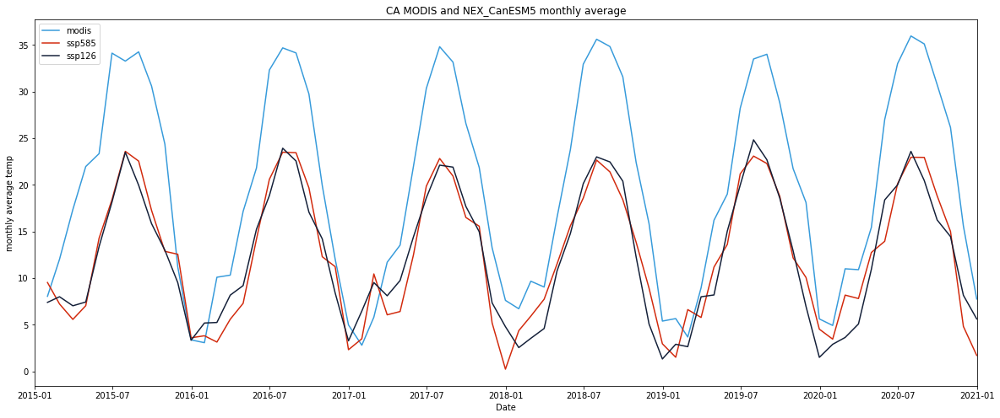

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(CA_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(CA_ssp585_CanESM5_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(CA_ssp126_CanESM5_monthly_avg_temp, color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('CA MODIS and NEX_CanESM5 monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
CA_ssp585_CanESM5_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp585_CanESM5_monthly_avg_temp)) 
CA_ssp585_CanESM5_monthly_rmse

8.816804078335748

In [ ]:
CA_ssp126_CanESM5_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp126_CanESM5_monthly_avg_temp)) 
CA_ssp126_CanESM5_monthly_rmse

8.869326607184739

#### time series analysis

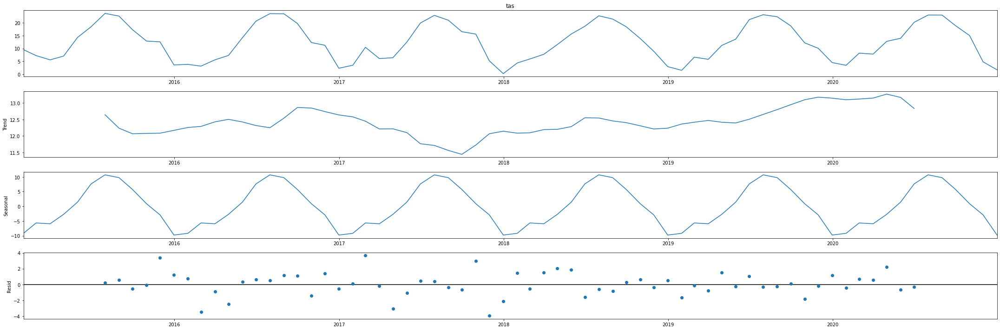

In [ ]:

CA_ssp585_CanESM5_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp585_CanESM5_monthly_avg_temp, model='additive')
fig = CA_ssp585_CanESM5_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

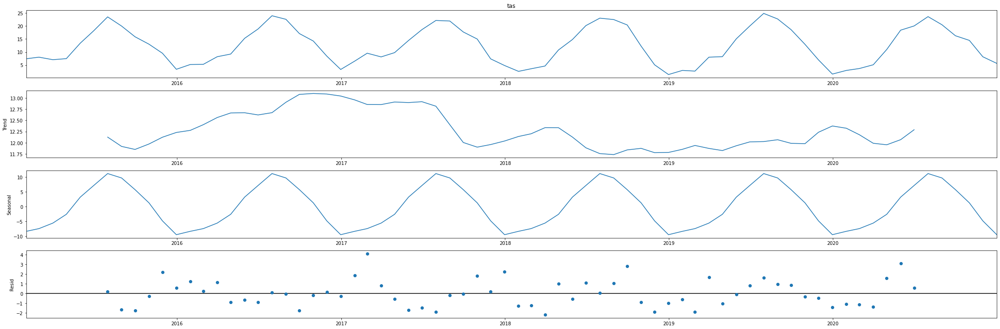

In [ ]:

CA_ssp126_CanESM5_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp126_CanESM5_monthly_avg_temp, model='additive')
fig = CA_ssp126_CanESM5_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

####R Square

In [ ]:
CA_ssp585_CanESM5_model = LinearRegression()
x = CA_ssp585_CanESM5_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
CA_ssp585_CanESM5_model.fit(x, y)
CA_ssp585_CanESM5_r_squared =CA_ssp585_CanESM5_model.score(x, y)
CA_ssp585_CanESM5_r_squared

0.8821459285249217

In [ ]:
CA_ssp126_CanESM5_model = LinearRegression()
x = CA_ssp126_CanESM5_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
CA_ssp126_CanESM5_model.fit(x, y)
CA_ssp126_CanESM5_r_squared =CA_ssp126_CanESM5_model.score(x, y)
CA_ssp126_CanESM5_r_squared

0.8992743988118114

#### seasonal analysis

In [ ]:
month = CA_ssp585_CanESM5_monthly_avg_temp.index.month
CA_ssp585_CanESM5_winter = pd.concat([CA_ssp585_CanESM5_monthly_avg_temp[month == 1], CA_ssp585_CanESM5_monthly_avg_temp[month == 2],CA_ssp585_CanESM5_monthly_avg_temp[month == 12]])
CA_ssp585_CanESM5_spring = pd.concat([CA_ssp585_CanESM5_monthly_avg_temp[month == 3], CA_ssp585_CanESM5_monthly_avg_temp[month == 4],CA_ssp585_CanESM5_monthly_avg_temp[month == 5]])
CA_ssp585_CanESM5_summer = pd.concat([CA_ssp585_CanESM5_monthly_avg_temp[month == 6], CA_ssp585_CanESM5_monthly_avg_temp[month == 7],CA_ssp585_CanESM5_monthly_avg_temp[month == 8]])
CA_ssp585_CanESM5_fall = pd.concat([CA_ssp585_CanESM5_monthly_avg_temp[month == 9], CA_ssp585_CanESM5_monthly_avg_temp[month == 10],CA_ssp585_CanESM5_monthly_avg_temp[month == 11]])
CA_ssp585_CanESM5_winter.sort_index()
CA_ssp585_CanESM5_spring.sort_index()
CA_ssp585_CanESM5_summer.sort_index()
CA_ssp585_CanESM5_fall.sort_index()

time
2015-09-30    17.270865
2015-10-31    12.874931
2015-11-30    12.565207
2016-09-30    19.682398
2016-10-31    12.299046
2016-11-30    11.235024
2017-09-30    16.506745
2017-10-31    15.569666
2017-11-30     5.205790
2018-09-30    18.409118
2018-10-31    13.845395
2018-11-30     8.916312
2019-09-30    18.775781
2019-10-31    12.177336
2019-11-30    10.071587
2020-09-30    18.823873
2020-10-31    15.015879
2020-11-30     4.823952
Name: tas, dtype: float64

In [ ]:
month = CA_ssp126_CanESM5_monthly_avg_temp.index.month
CA_ssp126_CanESM5_winter = pd.concat([CA_ssp126_CanESM5_monthly_avg_temp[month == 1], CA_ssp126_CanESM5_monthly_avg_temp[month == 2],CA_ssp126_CanESM5_monthly_avg_temp[month == 12]])
CA_ssp126_CanESM5_spring = pd.concat([CA_ssp126_CanESM5_monthly_avg_temp[month == 3], CA_ssp126_CanESM5_monthly_avg_temp[month == 4],CA_ssp126_CanESM5_monthly_avg_temp[month == 5]])
CA_ssp126_CanESM5_summer = pd.concat([CA_ssp126_CanESM5_monthly_avg_temp[month == 6], CA_ssp126_CanESM5_monthly_avg_temp[month == 7],CA_ssp126_CanESM5_monthly_avg_temp[month == 8]])
CA_ssp126_CanESM5_fall = pd.concat([CA_ssp126_CanESM5_monthly_avg_temp[month == 9], CA_ssp126_CanESM5_monthly_avg_temp[month == 10],CA_ssp126_CanESM5_monthly_avg_temp[month == 11]])
CA_ssp126_CanESM5_winter.sort_index()
CA_ssp126_CanESM5_spring.sort_index()
CA_ssp126_CanESM5_summer.sort_index()
CA_ssp126_CanESM5_fall.sort_index()

time
2015-09-30    15.845291
2015-10-31    13.000320
2015-11-30     9.519573
2016-09-30    17.076327
2016-10-31    14.212388
2016-11-30     8.417223
2017-09-30    17.691117
2017-10-31    14.979748
2017-11-30     7.350243
2018-09-30    20.396699
2018-10-31    12.256372
2018-11-30     5.075811
2019-09-30    18.577281
2019-10-31    12.930163
2019-11-30     6.967262
2020-09-30    16.240432
2020-10-31    14.461048
2020-11-30     8.163345
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = CA_ssp126_CanESM5_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.07154747121833682
coef:  [[0.32514728]]
intercept:  [5.1303268]


In [ ]:
x = CA_ssp126_CanESM5_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.6439710703702277
coef:  [[1.13467754]]
intercept:  [5.11524877]


In [ ]:
x = CA_ssp126_CanESM5_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.2356656050304904
coef:  [[0.45456763]]
intercept:  [23.80739798]


In [ ]:
x = CA_ssp126_CanESM5_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.7777915284427496
coef:  [[1.34024908]]
intercept:  [4.89515729]


#####ssp585

In [ ]:
x = CA_ssp585_CanESM5_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.08464369884950307
coef:  [[0.28527915]]
intercept:  [5.25683401]


In [ ]:
x = CA_ssp585_CanESM5_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.5386011476991079
coef:  [[1.11307127]]
intercept:  [5.93989061]


In [ ]:
x = CA_ssp585_CanESM5_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.18264107781115502
coef:  [[0.48291558]]
intercept:  [23.08425056]


In [ ]:
x = CA_ssp585_CanESM5_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.7166600738169328
coef:  [[1.2939339]]
intercept:  [4.71095221]


### CA_NEX_CMCC-ESM2

#### ssp585

In [ ]:
#https://drive.google.com/file/d/1dSMra0AM2Pz-HsYkQG0Ir4aYvlKCiB5P/view?usp=sharing
id = "1dSMra0AM2Pz-HsYkQG0Ir4aYvlKCiB5P"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp585_CMCC-ESM2.csv')

CA_ssp585_CMCC_ESM2 = pd.read_csv('CA_ssp585_CMCC-ESM2.csv', parse_dates=['time'], index_col='time')
CA_ssp585_CMCC_ESM2.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,-0.539246
2015-01-01,39.125,-119.875,-0.082397
2015-01-01,39.125,-119.625,1.127533
2015-01-01,39.125,-119.375,0.557312
2015-01-01,39.125,-119.125,2.886780


In [ ]:
CA_ssp585_CMCC_ESM2

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,-0.539246
2015-01-01,39.125,-119.875,-0.082397
2015-01-01,39.125,-119.625,1.127533
2015-01-01,39.125,-119.375,0.557312
2015-01-01,39.125,-119.125,2.886780
...,...,...,...
2020-12-29,36.375,-118.125,1.816132
2020-12-29,36.375,-117.875,7.316040
2020-12-29,36.375,-117.625,5.126587


In [ ]:
CA_ssp585_CMCC_ESM2['tas'].isnull().sum()

0

In [ ]:
CA_ssp585_CMCC_ESM2_avg_temp = CA_ssp585_CMCC_ESM2.groupby(CA_ssp585_CMCC_ESM2.index)['tas'].mean()
CA_ssp585_CMCC_ESM2_avg_temp

time
2015-01-01    1.841488
2015-01-02    1.556610
2015-01-03    3.519158
2015-01-04    5.479532
2015-01-05    5.572037
                ...   
2020-12-25    0.016225
2020-12-26    0.796759
2020-12-27    2.842124
2020-12-28    4.178424
2020-12-29    4.312715
Name: tas, Length: 2190, dtype: float64

In [ ]:
CA_ssp585_CMCC_ESM2_monthly_avg_temp = CA_ssp585_CMCC_ESM2_avg_temp.resample('M').mean()
CA_ssp585_CMCC_ESM2_monthly_avg_temp

time
2015-01-31     1.975369
2015-02-28     5.993724
2015-03-31     8.293235
2015-04-30    11.006949
2015-05-31    10.488758
                ...    
2020-08-31    19.285569
2020-09-30    15.333437
2020-10-31     9.689745
2020-11-30     4.371862
2020-12-31     2.353700
Freq: M, Name: tas, Length: 72, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/1KjEiTEx1GlxC3kOyFUaPLaEBUmMVe-UN/view?usp=sharing
id = "1KjEiTEx1GlxC3kOyFUaPLaEBUmMVe-UN"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp126_CMCC-ESM2.csv')

CA_ssp126_CMCC_ESM2 = pd.read_csv('CA_ssp126_CMCC-ESM2.csv', parse_dates=['time'], index_col='time')
CA_ssp126_CMCC_ESM2.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,-0.536865
2015-01-01,39.125,-119.875,-0.146301
2015-01-01,39.125,-119.625,0.981628
2015-01-01,39.125,-119.375,0.329376
2015-01-01,39.125,-119.125,2.576782


In [ ]:
CA_ssp126_CMCC_ESM2['tas'].isnull().sum()

0

In [ ]:
CA_ssp126_CMCC_ESM2_avg_temp = CA_ssp126_CMCC_ESM2.groupby(CA_ssp126_CMCC_ESM2.index)['tas'].mean()
CA_ssp126_CMCC_ESM2_avg_temp

time
2015-01-01    1.641300
2015-01-02    1.345262
2015-01-03    3.126768
2015-01-04    5.296495
2015-01-05    5.438998
                ...   
2020-12-25    8.412173
2020-12-26    6.388598
2020-12-27    4.475614
2020-12-28    3.395889
2020-12-29    5.111274
Name: tas, Length: 2190, dtype: float64

In [ ]:
CA_ssp126_CMCC_ESM2_monthly_avg_temp = CA_ssp126_CMCC_ESM2_avg_temp.resample('M').mean()
CA_ssp126_CMCC_ESM2_monthly_avg_temp 

time
2015-01-31     3.357562
2015-02-28     6.797597
2015-03-31     6.012105
2015-04-30     9.209142
2015-05-31    17.504497
                ...    
2020-08-31    21.343366
2020-09-30    19.616478
2020-10-31    13.021166
2020-11-30     5.779731
2020-12-31     4.329603
Freq: M, Name: tas, Length: 72, dtype: float64

#### compare modis with ssp585 and ssp126

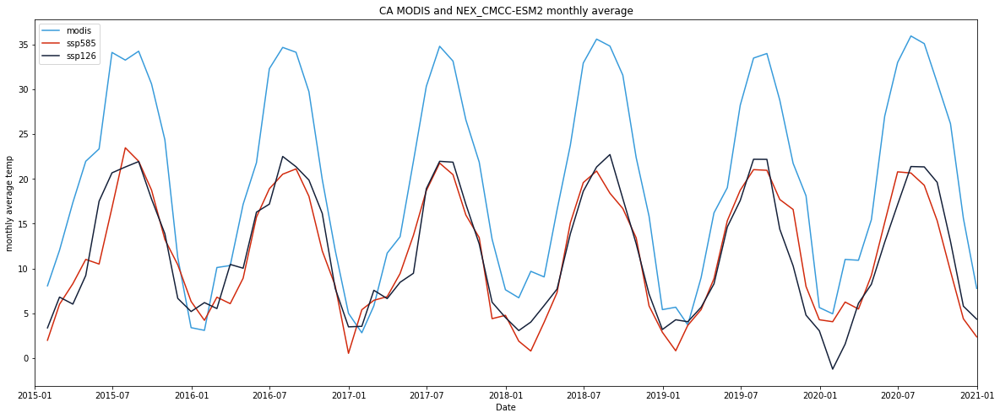

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(CA_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(CA_ssp585_CMCC_ESM2_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(CA_ssp126_CMCC_ESM2_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('CA MODIS and NEX_CMCC-ESM2 monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
CA_ssp585_CMCC_ESM2_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp585_CMCC_ESM2_monthly_avg_temp)) 
CA_ssp585_CMCC_ESM2_monthly_rmse

9.651786436903274

In [ ]:
CA_ssp126_CMCC_ESM2_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp126_CMCC_ESM2_monthly_avg_temp)) 
CA_ssp126_CMCC_ESM2_monthly_rmse

9.437797564242798

#### time series analysis

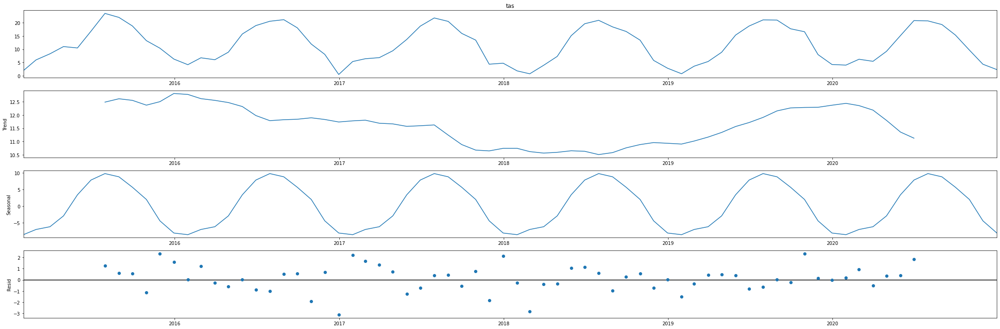

In [ ]:

CA_ssp585_CMCC_ESM2_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp585_CMCC_ESM2_monthly_avg_temp, model='additive')
fig = CA_ssp585_CMCC_ESM2_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

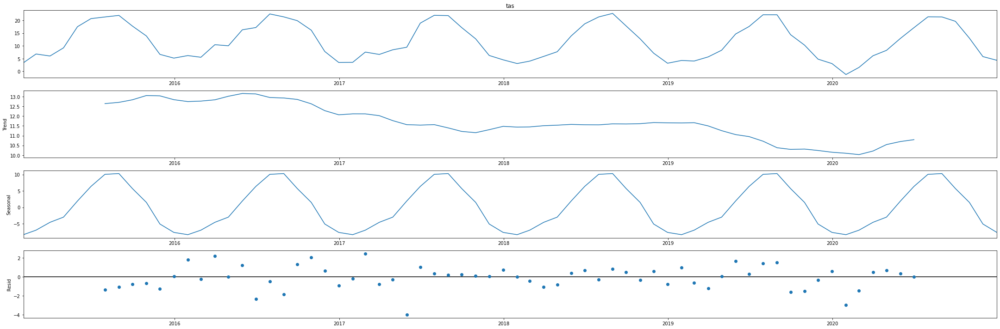

In [ ]:

CA_ssp126_CMCC_ESM2_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp126_CMCC_ESM2_monthly_avg_temp, model='additive')
fig = CA_ssp126_CMCC_ESM2_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

####R Square

In [ ]:
CA_ssp585_CMCC_ESM2_model = LinearRegression()
x = CA_ssp585_CMCC_ESM2_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
CA_ssp585_CMCC_ESM2_model.fit(x, y)
CA_ssp585_CMCC_ESM2_r_squared =CA_ssp585_CMCC_ESM2_model.score(x, y)
CA_ssp585_CMCC_ESM2_r_squared

0.8934333625835723

In [ ]:
CA_ssp126_CMCC_ESM2_model = LinearRegression()
x = CA_ssp126_CMCC_ESM2_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
CA_ssp126_CMCC_ESM2_model.fit(x, y)
CA_ssp126_CMCC_ESM2_r_squared =CA_ssp126_CMCC_ESM2_model.score(x, y)
CA_ssp126_CMCC_ESM2_r_squared

0.8912416480083957

#### seasonal analysis

In [ ]:
month = CA_ssp585_CMCC_ESM2_monthly_avg_temp.index.month
CA_ssp585_CMCC_ESM2_winter = pd.concat([CA_ssp585_CMCC_ESM2_monthly_avg_temp[month == 1], CA_ssp585_CMCC_ESM2_monthly_avg_temp[month == 2],CA_ssp585_CMCC_ESM2_monthly_avg_temp[month == 12]])
CA_ssp585_CMCC_ESM2_spring = pd.concat([CA_ssp585_CMCC_ESM2_monthly_avg_temp[month == 3], CA_ssp585_CMCC_ESM2_monthly_avg_temp[month == 4],CA_ssp585_CMCC_ESM2_monthly_avg_temp[month == 5]])
CA_ssp585_CMCC_ESM2_summer = pd.concat([CA_ssp585_CMCC_ESM2_monthly_avg_temp[month == 6], CA_ssp585_CMCC_ESM2_monthly_avg_temp[month == 7],CA_ssp585_CMCC_ESM2_monthly_avg_temp[month == 8]])
CA_ssp585_CMCC_ESM2_fall = pd.concat([CA_ssp585_CMCC_ESM2_monthly_avg_temp[month == 9], CA_ssp585_CMCC_ESM2_monthly_avg_temp[month == 10],CA_ssp585_CMCC_ESM2_monthly_avg_temp[month == 11]])
CA_ssp585_CMCC_ESM2_winter.sort_index()
CA_ssp585_CMCC_ESM2_spring.sort_index()
CA_ssp585_CMCC_ESM2_summer.sort_index()
CA_ssp585_CMCC_ESM2_fall.sort_index()

time
2015-09-30    18.749738
2015-10-31    13.232494
2015-11-30    10.401541
2016-09-30    18.060170
2016-10-31    11.953261
2016-11-30     8.083059
2017-09-30    15.962879
2017-10-31    13.443087
2017-11-30     4.387178
2018-09-30    16.687980
2018-10-31    13.418565
2018-11-30     5.810561
2019-09-30    17.700201
2019-10-31    16.586243
2019-11-30     7.989689
2020-09-30    15.333437
2020-10-31     9.689745
2020-11-30     4.371862
Name: tas, dtype: float64

In [ ]:
month = CA_ssp126_CMCC_ESM2_monthly_avg_temp.index.month
CA_ssp126_CMCC_ESM2_winter = pd.concat([CA_ssp126_CMCC_ESM2_monthly_avg_temp[month == 1], CA_ssp126_CMCC_ESM2_monthly_avg_temp[month == 2],CA_ssp126_CMCC_ESM2_monthly_avg_temp[month == 12]])
CA_ssp126_CMCC_ESM2_spring = pd.concat([CA_ssp126_CMCC_ESM2_monthly_avg_temp[month == 3], CA_ssp126_CMCC_ESM2_monthly_avg_temp[month == 4],CA_ssp126_CMCC_ESM2_monthly_avg_temp[month == 5]])
CA_ssp126_CMCC_ESM2_summer = pd.concat([CA_ssp126_CMCC_ESM2_monthly_avg_temp[month == 6], CA_ssp126_CMCC_ESM2_monthly_avg_temp[month == 7],CA_ssp126_CMCC_ESM2_monthly_avg_temp[month == 8]])
CA_ssp126_CMCC_ESM2_fall = pd.concat([CA_ssp126_CMCC_ESM2_monthly_avg_temp[month == 9], CA_ssp126_CMCC_ESM2_monthly_avg_temp[month == 10],CA_ssp126_CMCC_ESM2_monthly_avg_temp[month == 11]])
CA_ssp126_CMCC_ESM2_winter.sort_index()
CA_ssp126_CMCC_ESM2_spring.sort_index()
CA_ssp126_CMCC_ESM2_summer.sort_index()
CA_ssp126_CMCC_ESM2_fall.sort_index()

time
2015-09-30    17.749076
2015-10-31    13.872027
2015-11-30     6.653743
2016-09-30    19.870368
2016-10-31    16.144161
2016-11-30     7.787056
2017-09-30    17.160148
2017-10-31    12.740649
2017-11-30     6.221154
2018-09-30    17.794975
2018-10-31    12.757381
2018-11-30     7.132768
2019-09-30    14.386091
2019-10-31    10.288152
2019-11-30     4.779733
2020-09-30    19.616478
2020-10-31    13.021166
2020-11-30     5.779731
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = CA_ssp126_CMCC_ESM2_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.007925110826001447
coef:  [[0.12453119]]
intercept:  [6.0747787]


In [ ]:
x = CA_ssp126_CMCC_ESM2_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.5256813667277729
coef:  [[1.07661903]]
intercept:  [6.4028657]


In [ ]:
x = CA_ssp126_CMCC_ESM2_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.47288289549562357
coef:  [[0.68127434]]
intercept:  [19.486768]


In [ ]:
x = CA_ssp126_CMCC_ESM2_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.7919196021003315
coef:  [[1.1925146]]
intercept:  [7.43195754]


#####ssp585

In [ ]:
x = CA_ssp585_CMCC_ESM2_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.013480116001190479
coef:  [[0.15199385]]
intercept:  [5.99060419]


In [ ]:
x = CA_ssp585_CMCC_ESM2_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.7650042142172058
coef:  [[1.26968389]]
intercept:  [4.57247412]


In [ ]:
x = CA_ssp585_CMCC_ESM2_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.0851014855379637
coef:  [[0.34805033]]
intercept:  [26.53600084]


In [ ]:
x = CA_ssp585_CMCC_ESM2_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.6853859950034076
coef:  [[1.18453358]]
intercept:  [7.65575259]


### CA_NEX_CMCC_CM2_SR5

#### ssp585

In [ ]:
#https://drive.google.com/file/d/1oKFh5rVU8-bYG59L6rhhOPJXQuiH5DiE/view?usp=share_link
id = "1oKFh5rVU8-bYG59L6rhhOPJXQuiH5DiE"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp585_CMCC-CM2-SR5.csv')

CA_ssp585_CMCC_CM2_SR5 = pd.read_csv('CA_ssp585_CMCC-CM2-SR5.csv', parse_dates=['time'], index_col='time')
CA_ssp585_CMCC_CM2_SR5.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,8.574249
2015-01-01,39.125,-119.875,9.418091
2015-01-01,39.125,-119.625,10.793152
2015-01-01,39.125,-119.375,10.388092
2015-01-01,39.125,-119.125,12.882690


In [ ]:
CA_ssp585_CMCC_CM2_SR5

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,8.574249
2015-01-01,39.125,-119.875,9.418091
2015-01-01,39.125,-119.625,10.793152
2015-01-01,39.125,-119.375,10.388092
2015-01-01,39.125,-119.125,12.882690
...,...,...,...
2020-12-29,36.375,-118.125,7.432617
2020-12-29,36.375,-117.875,12.792114
2020-12-29,36.375,-117.625,10.462219


In [ ]:
CA_ssp585_CMCC_CM2_SR5['tas'].isnull().sum()

0

In [ ]:
CA_ssp585_CMCC_CM2_SR5_avg_temp = CA_ssp585_CMCC_CM2_SR5.groupby(CA_ssp585_CMCC_CM2_SR5.index)['tas'].mean()
CA_ssp585_CMCC_CM2_SR5_avg_temp

time
2015-01-01    13.023151
2015-01-02     7.951632
2015-01-03     6.613328
2015-01-04     8.330963
2015-01-05     4.917091
                ...    
2020-12-25    13.914252
2020-12-26    15.219484
2020-12-27    16.596958
2020-12-28    10.820365
2020-12-29     8.922567
Name: tas, Length: 2190, dtype: float64

In [ ]:
CA_ssp585_CMCC_CM2_SR5_monthly_avg_temp = CA_ssp585_CMCC_CM2_SR5_avg_temp.resample('M').mean()
CA_ssp585_CMCC_CM2_SR5_monthly_avg_temp

time
2015-01-31    10.213691
2015-02-28     8.777380
2015-03-31    13.939652
2015-04-30    15.736659
2015-05-31    23.298432
                ...    
2020-08-31    26.118684
2020-09-30    24.307751
2020-10-31    19.389971
2020-11-30    13.965764
2020-12-31    11.837505
Freq: M, Name: tas, Length: 72, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/1hzv25Nj8boZucBEVJC5iEia-QrSYRQcg/view?usp=share_link
id = "1hzv25Nj8boZucBEVJC5iEia-QrSYRQcg"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp126_CMCC-CM2-SR5.csv')

CA_ssp126_CMCC_CM2_SR5 = pd.read_csv('CA_ssp126_CMCC-CM2-SR5.csv', parse_dates=['time'], index_col='time')
CA_ssp126_CMCC_CM2_SR5.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,1.742157
2015-01-01,39.125,-119.875,2.346771
2015-01-01,39.125,-119.625,3.428253
2015-01-01,39.125,-119.375,2.754791
2015-01-01,39.125,-119.125,4.991089


In [ ]:
CA_ssp126_CMCC_CM2_SR5['tas'].isnull().sum()

0

In [ ]:
CA_ssp126_CMCC_CM2_SR5_avg_temp = CA_ssp126_CMCC_CM2_SR5.groupby(CA_ssp126_CMCC_CM2_SR5.index)['tas'].mean()
CA_ssp126_CMCC_CM2_SR5_avg_temp

time
2015-01-01    4.751409
2015-01-02    0.405281
2015-01-03   -0.919262
2015-01-04    0.762267
2015-01-05   -3.445245
                ...   
2020-12-25   -5.190032
2020-12-26   -4.743526
2020-12-27   -1.359124
2020-12-28   -3.482453
2020-12-29   -4.280334
Name: tas, Length: 2190, dtype: float64

In [ ]:
CA_ssp126_CMCC_CM2_SR5_monthly_avg_temp = CA_ssp126_CMCC_CM2_SR5_avg_temp.resample('M').mean()
CA_ssp126_CMCC_CM2_SR5_monthly_avg_temp

time
2015-01-31     2.142191
2015-02-28     5.993489
2015-03-31     6.994199
2015-04-30     6.988878
2015-05-31    10.603677
                ...    
2020-08-31    22.028036
2020-09-30    17.014982
2020-10-31    12.073271
2020-11-30     2.883083
2020-12-31    -2.648280
Freq: M, Name: tas, Length: 72, dtype: float64

#### compare modis with ssp585 and ssp126

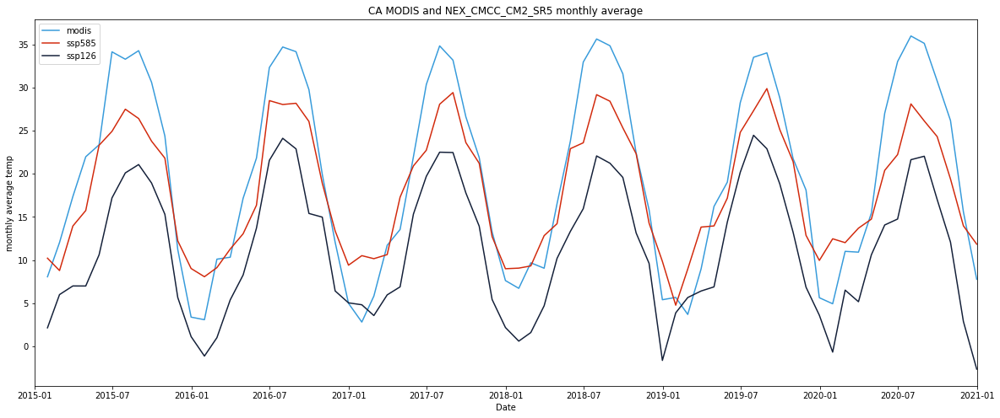

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(CA_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(CA_ssp585_CMCC_CM2_SR5_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(CA_ssp126_CMCC_CM2_SR5_monthly_avg_temp, color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('CA MODIS and NEX_CMCC_CM2_SR5 monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
CA_ssp585_CMCC_CM2_SR5_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp585_CMCC_CM2_SR5_monthly_avg_temp)) 
CA_ssp585_CMCC_CM2_SR5_monthly_rmse

4.832571222718845

In [ ]:
CA_ssp126_CMCC_CM2_SR5_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp126_CMCC_CM2_SR5_monthly_avg_temp)) 
CA_ssp126_CMCC_CM2_SR5_monthly_rmse

9.624409607766443

#### time series analysis

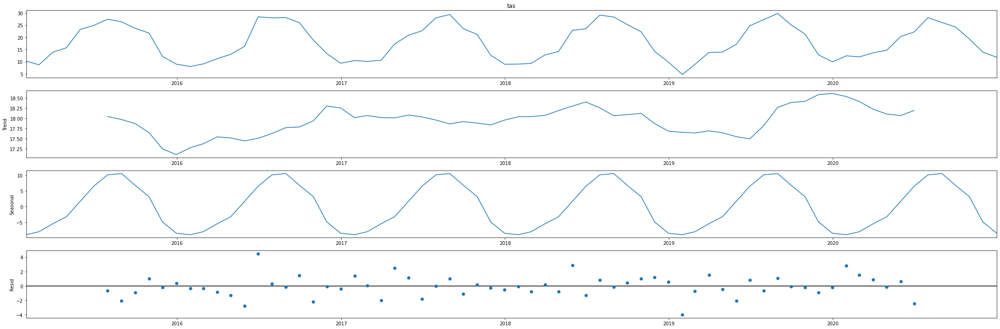

In [ ]:

CA_ssp585_CMCC_CM2_SR5_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp585_CMCC_CM2_SR5_monthly_avg_temp, model='additive')
fig = CA_ssp585_CMCC_CM2_SR5_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

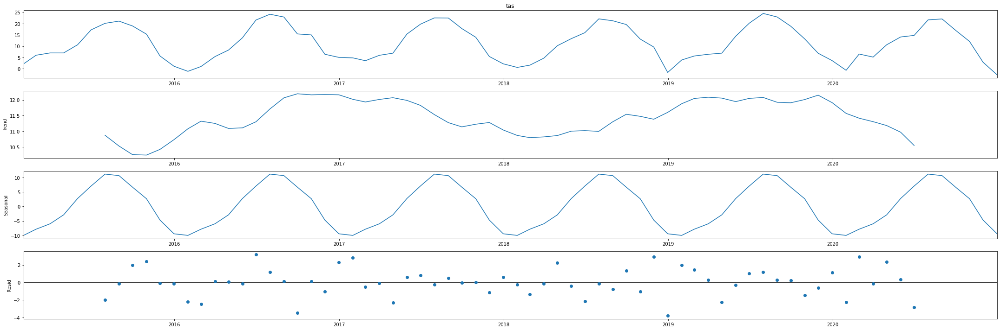

In [ ]:

CA_ssp126_CMCC_CM2_SR5_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp126_CMCC_CM2_SR5_monthly_avg_temp, model='additive')
fig = CA_ssp126_CMCC_CM2_SR5_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

#### R square

In [ ]:
CA_ssp585_CMCC_CM2_SR5_model = LinearRegression()
x = CA_ssp585_CMCC_CM2_SR5_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
CA_ssp585_CMCC_CM2_SR5_model.fit(x, y)
CA_ssp585_CMCC_CM2_SR5_r_squared =CA_ssp585_CMCC_CM2_SR5_model.score(x, y)
CA_ssp585_CMCC_CM2_SR5_r_squared

0.9162900764865516

In [ ]:
CA_ssp126_CMCC_CM2_SR5_model = LinearRegression()
x = CA_ssp126_CMCC_CM2_SR5_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)


In [ ]:
CA_ssp126_CMCC_CM2_SR5_model.fit(x, y)
CA_ssp126_CMCC_CM2_SR5_r_squared = CA_ssp126_CMCC_CM2_SR5_model.score(x, y)
CA_ssp126_CMCC_CM2_SR5_r_squared

0.8915584079384227

#### seasonal analysis

In [ ]:
month = CA_ssp585_CMCC_CM2_SR5_monthly_avg_temp.index.month
CA_ssp585_CMCC_CM2_SR5_winter = pd.concat([CA_ssp585_CMCC_CM2_SR5_monthly_avg_temp[month == 1], CA_ssp585_CMCC_CM2_SR5_monthly_avg_temp[month == 2],CA_ssp585_CMCC_CM2_SR5_monthly_avg_temp[month == 12]])
CA_ssp585_CMCC_CM2_SR5_spring = pd.concat([CA_ssp585_CMCC_CM2_SR5_monthly_avg_temp[month == 3], CA_ssp585_CMCC_CM2_SR5_monthly_avg_temp[month == 4],CA_ssp585_CMCC_CM2_SR5_monthly_avg_temp[month == 5]])
CA_ssp585_CMCC_CM2_SR5_summer = pd.concat([CA_ssp585_CMCC_CM2_SR5_monthly_avg_temp[month == 6], CA_ssp585_CMCC_CM2_SR5_monthly_avg_temp[month == 7],CA_ssp585_CMCC_CM2_SR5_monthly_avg_temp[month == 8]])
CA_ssp585_CMCC_CM2_SR5_fall = pd.concat([CA_ssp585_CMCC_CM2_SR5_monthly_avg_temp[month == 9], CA_ssp585_CMCC_CM2_SR5_monthly_avg_temp[month == 10],CA_ssp585_CMCC_CM2_SR5_monthly_avg_temp[month == 11]])
CA_ssp585_CMCC_CM2_SR5_winter.sort_index()
CA_ssp585_CMCC_CM2_SR5_spring.sort_index()
CA_ssp585_CMCC_CM2_SR5_summer.sort_index()
CA_ssp585_CMCC_CM2_SR5_fall.sort_index()

time
2015-09-30    23.777387
2015-10-31    21.807479
2015-11-30    12.221751
2016-09-30    26.061251
2016-10-31    18.907587
2016-11-30    13.372700
2017-09-30    23.607062
2017-10-31    21.209606
2017-11-30    12.709965
2018-09-30    25.319444
2018-10-31    22.313583
2018-11-30    14.276172
2019-09-30    25.114028
2019-10-31    21.405595
2019-11-30    12.861383
2020-09-30    24.307751
2020-10-31    19.389971
2020-11-30    13.965764
Name: tas, dtype: float64

In [ ]:
month = CA_ssp126_CMCC_CM2_SR5_monthly_avg_temp.index.month
CA_ssp126_CMCC_CM2_SR5_winter = pd.concat([CA_ssp126_CMCC_CM2_SR5_monthly_avg_temp[month == 1], CA_ssp126_CMCC_CM2_SR5_monthly_avg_temp[month == 2],CA_ssp126_CMCC_CM2_SR5_monthly_avg_temp[month == 12]])
CA_ssp126_CMCC_CM2_SR5_spring = pd.concat([CA_ssp126_CMCC_CM2_SR5_monthly_avg_temp[month == 3], CA_ssp126_CMCC_CM2_SR5_monthly_avg_temp[month == 4],CA_ssp126_CMCC_CM2_SR5_monthly_avg_temp[month == 5]])
CA_ssp126_CMCC_CM2_SR5_summer = pd.concat([CA_ssp126_CMCC_CM2_SR5_monthly_avg_temp[month == 6], CA_ssp126_CMCC_CM2_SR5_monthly_avg_temp[month == 7],CA_ssp126_CMCC_CM2_SR5_monthly_avg_temp[month == 8]])
CA_ssp126_CMCC_CM2_SR5_fall = pd.concat([CA_ssp126_CMCC_CM2_SR5_monthly_avg_temp[month == 9], CA_ssp126_CMCC_CM2_SR5_monthly_avg_temp[month == 10],CA_ssp126_CMCC_CM2_SR5_monthly_avg_temp[month == 11]])
CA_ssp126_CMCC_CM2_SR5_winter.sort_index()
CA_ssp126_CMCC_CM2_SR5_spring.sort_index()
CA_ssp126_CMCC_CM2_SR5_summer.sort_index()
CA_ssp126_CMCC_CM2_SR5_fall.sort_index()

time
2015-09-30    18.925745
2015-10-31    15.299918
2015-11-30     5.651638
2016-09-30    15.396956
2016-10-31    14.971198
2016-11-30     6.414627
2017-09-30    17.772370
2017-10-31    13.920208
2017-11-30     5.424018
2018-09-30    19.574628
2018-10-31    13.129384
2018-11-30     9.617801
2019-09-30    18.824075
2019-10-31    13.215420
2019-11-30     6.853429
2020-09-30    17.014982
2020-10-31    12.073271
2020-11-30     2.883083
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = CA_ssp126_CMCC_CM2_SR5_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.033467705469309994
coef:  [[0.18337296]]
intercept:  [6.15136306]


In [ ]:
x = CA_ssp126_CMCC_CM2_SR5_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.6333582311537829
coef:  [[1.21596979]]
intercept:  [5.80274291]


In [ ]:
x = CA_ssp126_CMCC_CM2_SR5_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.08784352742750734
coef:  [[0.21046153]]
intercept:  [29.17043621]


In [ ]:
x = CA_ssp126_CMCC_CM2_SR5_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8175926138384465
coef:  [[1.16471351]]
intercept:  [7.56997697]


#####ssp585

In [ ]:
x = CA_ssp585_CMCC_CM2_SR5_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.019418472293315392
coef:  [[0.22710598]]
intercept:  [4.39937579]


In [ ]:
x = CA_ssp585_CMCC_CM2_SR5_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.6306089816659157
coef:  [[1.16247831]]
intercept:  [-1.47552386]


In [ ]:
x = CA_ssp585_CMCC_CM2_SR5_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.2638329999483384
coef:  [[0.41660408]]
intercept:  [22.39146416]


In [ ]:
x = CA_ssp585_CMCC_CM2_SR5_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.880052819379234
coef:  [[1.27217981]]
intercept:  [-2.66670355]


### CA_NEX_CESM2

#### ssp585

In [ ]:
#https://drive.google.com/file/d/12H5YWloKy8KX-B8f95HOZ5B98BvxwyR9/view?usp=share_link
id = "12H5YWloKy8KX-B8f95HOZ5B98BvxwyR9"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp585_CESM2.csv')

CA_ssp585_CESM2 = pd.read_csv('CA_ssp585_CESM2.csv', parse_dates=['time'], index_col='time')
CA_ssp585_CESM2.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,5.695465
2015-01-01,39.125,-119.875,5.526611
2015-01-01,39.125,-119.625,5.625610
2015-01-01,39.125,-119.375,3.969696
2015-01-01,39.125,-119.125,5.223511


In [ ]:
CA_ssp585_CESM2

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,5.695465
2015-01-01,39.125,-119.875,5.526611
2015-01-01,39.125,-119.625,5.625610
2015-01-01,39.125,-119.375,3.969696
2015-01-01,39.125,-119.125,5.223511
...,...,...,...
2020-12-29,36.375,-118.125,0.292450
2020-12-29,36.375,-117.875,6.071045
2020-12-29,36.375,-117.625,4.160584


In [ ]:
CA_ssp585_CESM2['tas'].isnull().sum()

0

In [ ]:
CA_ssp585_CESM2_avg_temp = CA_ssp585_CESM2.groupby(CA_ssp585_CESM2.index)['tas'].mean()
CA_ssp585_CESM2_avg_temp

time
2015-01-01    7.580880
2015-01-02    2.882575
2015-01-03    3.344936
2015-01-04    3.998543
2015-01-05    2.477884
                ...   
2020-12-25   -0.754700
2020-12-26   -0.245965
2020-12-27    1.283121
2020-12-28    2.208014
2020-12-29    1.726863
Name: tas, Length: 2190, dtype: float64

In [ ]:
CA_ssp585_CESM2_monthly_avg_temp = CA_ssp585_CESM2_avg_temp.resample('M').mean()
CA_ssp585_CESM2_monthly_avg_temp

time
2015-01-31    -0.583902
2015-02-28     1.541870
2015-03-31     5.187163
2015-04-30    11.062424
2015-05-31    12.007099
                ...    
2020-08-31    18.714874
2020-09-30    14.652867
2020-10-31    14.911596
2020-11-30     7.743159
2020-12-31    -1.008075
Freq: M, Name: tas, Length: 72, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/1-UIVXjJ7vcgStFjm0QcG2CdQNTOnk7ot/view?usp=share_link
id = "1-UIVXjJ7vcgStFjm0QcG2CdQNTOnk7ot"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp126_CESM2.csv')

CA_ssp126_CESM2 = pd.read_csv('CA_ssp126_CESM2.csv', parse_dates=['time'], index_col='time')
CA_ssp126_CESM2.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,5.638397
2015-01-01,39.125,-119.875,5.432953
2015-01-01,39.125,-119.625,5.476288
2015-01-01,39.125,-119.375,3.764679
2015-01-01,39.125,-119.125,4.962830


In [ ]:
CA_ssp126_CESM2['tas'].isnull().sum()

0

In [ ]:
CA_ssp126_CESM2_avg_temp = CA_ssp126_CESM2.groupby(CA_ssp126_CESM2.index)['tas'].mean()
CA_ssp126_CESM2_avg_temp

time
2015-01-01    7.493100
2015-01-02    2.811822
2015-01-03    3.254466
2015-01-04    3.827487
2015-01-05    2.402366
                ...   
2020-12-25    5.047409
2020-12-26    2.935132
2020-12-27   -0.348126
2020-12-28    0.446654
2020-12-29    2.961765
Name: tas, Length: 2190, dtype: float64

In [ ]:
CA_ssp126_CESM2_monthly_avg_temp = CA_ssp126_CESM2_avg_temp.resample('M').mean()
CA_ssp126_CESM2_monthly_avg_temp 

time
2015-01-31     0.064963
2015-02-28     3.358322
2015-03-31     2.871764
2015-04-30    13.264184
2015-05-31    11.004008
                ...    
2020-08-31    21.668268
2020-09-30    17.806745
2020-10-31    13.831550
2020-11-30     8.085154
2020-12-31     3.689527
Freq: M, Name: tas, Length: 72, dtype: float64

#### compare modis with ssp585 and ssp126

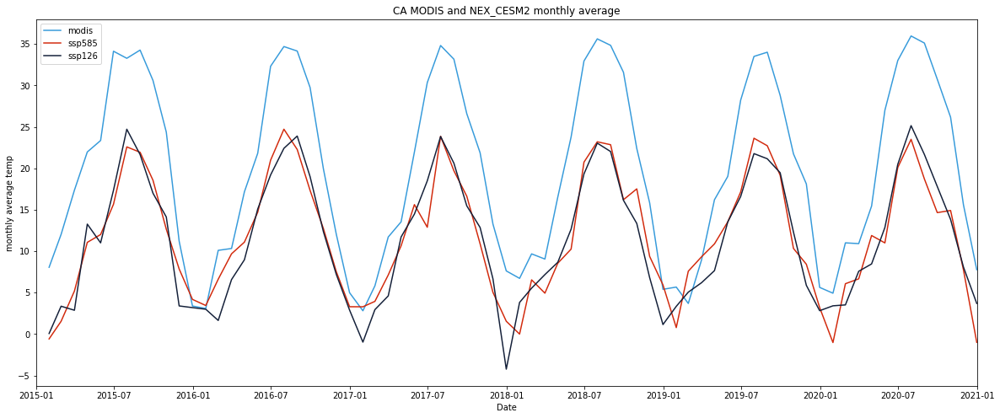

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(CA_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(CA_ssp585_CESM2_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(CA_ssp126_CESM2_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('CA MODIS and NEX_CESM2 monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
CA_ssp585_CESM2_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month,CA_ssp585_CESM2_monthly_avg_temp)) 
CA_ssp585_CESM2_monthly_rmse

9.488477691846638

In [ ]:
CA_ssp126_CESM2_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp126_CESM2_monthly_avg_temp)) 
CA_ssp126_CESM2_monthly_rmse

9.433837377375575

#### time series analysis

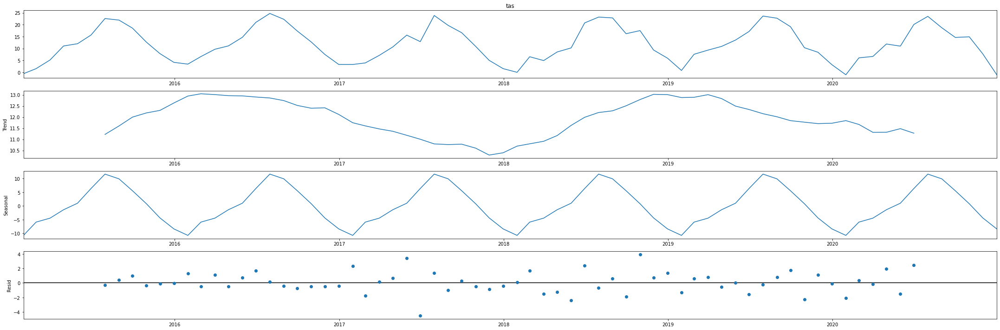

In [ ]:

CA_ssp585_CESM2_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp585_CESM2_monthly_avg_temp, model='additive')
fig = CA_ssp585_CESM2_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

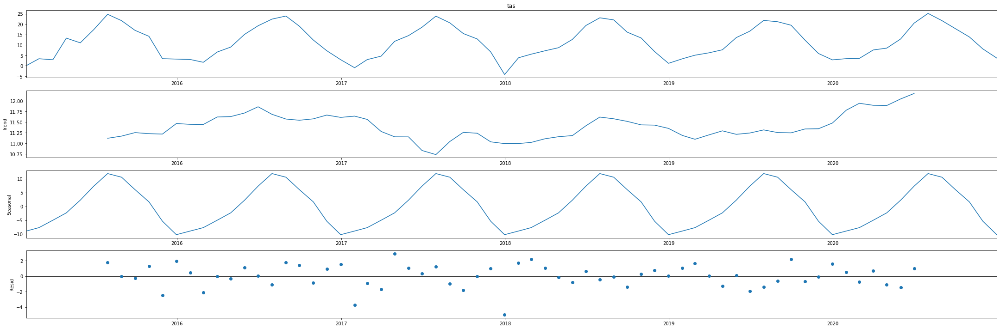

In [ ]:

CA_ssp126_CESM2_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp126_CESM2_monthly_avg_temp, model='additive')
fig = CA_ssp126_CESM2_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

#### R square

In [ ]:
CA_ssp585_CESM2_model = LinearRegression()
x = CA_ssp585_CESM2_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
CA_ssp585_CESM2_model.fit(x, y)
CA_ssp585_CESM2_r_squared =CA_ssp585_CESM2_model.score(x, y)
CA_ssp585_CESM2_r_squared

0.8586084269668715

In [ ]:
CA_ssp126_CESM2_model = LinearRegression()
x = CA_ssp126_CESM2_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)


In [ ]:
CA_ssp126_CESM2_model.fit(x, y)
CA_ssp126_CESM2_r_squared = CA_ssp126_CESM2_model.score(x, y)
CA_ssp126_CESM2_r_squared

0.9069986019568368

#### seasonal analysis

In [ ]:
month = CA_ssp585_CESM2_monthly_avg_temp.index.month
CA_ssp585_CESM2_winter = pd.concat([CA_ssp585_CESM2_monthly_avg_temp[month == 1], CA_ssp585_CESM2_monthly_avg_temp[month == 2],CA_ssp585_CESM2_monthly_avg_temp[month == 12]])
CA_ssp585_CESM2_spring = pd.concat([CA_ssp585_CESM2_monthly_avg_temp[month == 3], CA_ssp585_CESM2_monthly_avg_temp[month == 4],CA_ssp585_CESM2_monthly_avg_temp[month == 5]])
CA_ssp585_CESM2_summer = pd.concat([CA_ssp585_CESM2_monthly_avg_temp[month == 6], CA_ssp585_CESM2_monthly_avg_temp[month == 7],CA_ssp585_CESM2_monthly_avg_temp[month == 8]])
CA_ssp585_CESM2_fall = pd.concat([CA_ssp585_CESM2_monthly_avg_temp[month == 9], CA_ssp585_CESM2_monthly_avg_temp[month == 10],CA_ssp585_CESM2_monthly_avg_temp[month == 11]])
CA_ssp585_CESM2_winter.sort_index()
CA_ssp585_CESM2_spring.sort_index()
CA_ssp585_CESM2_summer.sort_index()
CA_ssp585_CESM2_fall.sort_index()

time
2015-09-30    18.557809
2015-10-31    12.656714
2015-11-30     7.850777
2016-09-30    17.329815
2016-10-31    12.727000
2016-11-30     7.530282
2017-09-30    16.630636
2017-10-31    10.894112
2017-11-30     5.024026
2018-09-30    16.208069
2018-10-31    17.516720
2018-11-30     9.365359
2019-09-30    19.158748
2019-10-31    10.332034
2019-11-30     8.425472
2020-09-30    14.652867
2020-10-31    14.911596
2020-11-30     7.743159
Name: tas, dtype: float64

In [ ]:
month = CA_ssp126_CESM2_monthly_avg_temp.index.month
CA_ssp126_CESM2_winter = pd.concat([CA_ssp126_CESM2_monthly_avg_temp[month == 1], CA_ssp126_CESM2_monthly_avg_temp[month == 2],CA_ssp126_CESM2_monthly_avg_temp[month == 12]])
CA_ssp126_CESM2_spring = pd.concat([CA_ssp126_CESM2_monthly_avg_temp[month == 3], CA_ssp126_CESM2_monthly_avg_temp[month == 4],CA_ssp126_CESM2_monthly_avg_temp[month == 5]])
CA_ssp126_CESM2_summer = pd.concat([CA_ssp126_CESM2_monthly_avg_temp[month == 6], CA_ssp126_CESM2_monthly_avg_temp[month == 7],CA_ssp126_CESM2_monthly_avg_temp[month == 8]])
CA_ssp126_CESM2_fall = pd.concat([CA_ssp126_CESM2_monthly_avg_temp[month == 9], CA_ssp126_CESM2_monthly_avg_temp[month == 10],CA_ssp126_CESM2_monthly_avg_temp[month == 11]])
CA_ssp126_CESM2_winter.sort_index()
CA_ssp126_CESM2_spring.sort_index()
CA_ssp126_CESM2_summer.sort_index()
CA_ssp126_CESM2_fall.sort_index()

time
2015-09-30    16.994946
2015-10-31    14.127503
2015-11-30     3.393137
2016-09-30    18.992060
2016-10-31    12.352301
2016-11-30     7.206008
2017-09-30    15.467690
2017-10-31    12.864125
2017-11-30     6.655612
2018-09-30    16.137240
2018-10-31    13.344273
2018-11-30     6.808297
2019-09-30    19.465392
2019-10-31    12.308779
2019-11-30     5.879679
2020-09-30    17.806745
2020-10-31    13.831550
2020-11-30     8.085154
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = CA_ssp126_CESM2_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.0035558099684706024
coef:  [[0.07192517]]
intercept:  [6.398439]


In [ ]:
x = CA_ssp126_CESM2_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.5095962893293494
coef:  [[1.10192613]]
intercept:  [6.39622272]


In [ ]:
x = CA_ssp126_CESM2_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.524993861193109
coef:  [[0.55934608]]
intercept:  [21.6624372]


In [ ]:
x = CA_ssp126_CESM2_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8943162110023317
coef:  [[1.3116101]]
intercept:  [6.09974058]


#####ssp585

In [ ]:
x = CA_ssp585_CESM2_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.00014498576242727435
coef:  [[0.01201011]]
intercept:  [6.53812233]


In [ ]:
x = CA_ssp585_CESM2_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.3515104981910514
coef:  [[1.10548921]]
intercept:  [5.69656238]


In [ ]:
x = CA_ssp585_CESM2_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.4025848514657182
coef:  [[0.37751772]]
intercept:  [25.66418137]


In [ ]:
x = CA_ssp585_CESM2_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.7896365121134941
coef:  [[1.37005049]]
intercept:  [4.93882606]


### CA_NEX_BCC_CSM2_MR

#### ssp585

In [ ]:
#https://drive.google.com/file/d/12j48TAIGaWOKsFdMsuXyoWMNvd9cKAUC/view?usp=share_link
id = "12j48TAIGaWOKsFdMsuXyoWMNvd9cKAUC"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp585_BCC-CSM2-MR.csv')

CA_ssp585_BCC_CSM2_MR = pd.read_csv('CA_ssp585_BCC-CSM2-MR.csv', parse_dates=['time'], index_col='time')
CA_ssp585_BCC_CSM2_MR.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,3.455139
2015-01-01,39.125,-119.875,3.774292
2015-01-01,39.125,-119.625,4.710938
2015-01-01,39.125,-119.375,3.867371
2015-01-01,39.125,-119.125,6.057129


In [ ]:
CA_ssp585_BCC_CSM2_MR 

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,3.455139
2015-01-01,39.125,-119.875,3.774292
2015-01-01,39.125,-119.625,4.710938
2015-01-01,39.125,-119.375,3.867371
2015-01-01,39.125,-119.125,6.057129
...,...,...,...
2020-12-29,36.375,-118.125,2.435730
2020-12-29,36.375,-117.875,8.136047
2020-12-29,36.375,-117.625,6.147034


In [ ]:
CA_ssp585_BCC_CSM2_MR['tas'].isnull().sum()

0

In [ ]:
CA_ssp585_BCC_CSM2_MR_avg_temp = CA_ssp585_BCC_CSM2_MR.groupby(CA_ssp585_BCC_CSM2_MR.index)['tas'].mean()
CA_ssp585_BCC_CSM2_MR_avg_temp

time
2015-01-01    8.817875
2015-01-02    7.017857
2015-01-03    2.592643
2015-01-04    3.832319
2015-01-05    5.874368
                ...   
2020-12-25    7.697592
2020-12-26    7.319528
2020-12-27    4.957295
2020-12-28    4.456875
2020-12-29    6.262260
Name: tas, Length: 2190, dtype: float64

In [ ]:
CA_ssp585_BCC_CSM2_MR_monthly_avg_temp = CA_ssp585_BCC_CSM2_MR_avg_temp.resample('M').mean()
CA_ssp585_BCC_CSM2_MR_monthly_avg_temp

time
2015-01-31     7.125762
2015-02-28     7.572205
2015-03-31     4.418655
2015-04-30     7.081163
2015-05-31    13.857978
                ...    
2020-08-31    21.846427
2020-09-30    19.501159
2020-10-31    12.581561
2020-11-30     8.398799
2020-12-31     7.419695
Freq: M, Name: tas, Length: 72, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/1MSMPnqlZ9yljUT6vyDodfY5CDVajra-o/view?usp=share_link
id = "1MSMPnqlZ9yljUT6vyDodfY5CDVajra-o"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp126_BCC-CSM2-MR.csv')

CA_ssp126_BCC_CSM2_MR = pd.read_csv('CA_ssp126_BCC-CSM2-MR.csv', parse_dates=['time'], index_col='time')
CA_ssp126_BCC_CSM2_MR.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,3.652161
2015-01-01,39.125,-119.875,4.012970
2015-01-01,39.125,-119.625,4.991242
2015-01-01,39.125,-119.375,4.189362
2015-01-01,39.125,-119.125,6.420075


In [ ]:
CA_ssp126_BCC_CSM2_MR['tas'].isnull().sum()

0

In [ ]:
CA_ssp126_BCC_CSM2_MR_avg_temp = CA_ssp126_BCC_CSM2_MR.groupby(CA_ssp126_BCC_CSM2_MR.index)['tas'].mean()
CA_ssp126_BCC_CSM2_MR_avg_temp

time
2015-01-01    9.018370
2015-01-02    7.185803
2015-01-03    2.594412
2015-01-04    3.922971
2015-01-05    5.992311
                ...   
2020-12-25    2.365938
2020-12-26    1.597152
2020-12-27    1.254204
2020-12-28    1.883603
2020-12-29    5.194986
Name: tas, Length: 2190, dtype: float64

In [ ]:
CA_ssp126_BCC_CSM2_MR_monthly_avg_temp = CA_ssp126_BCC_CSM2_MR_avg_temp.resample('M').mean()
CA_ssp126_BCC_CSM2_MR_monthly_avg_temp 

time
2015-01-31     5.654830
2015-02-28     0.897251
2015-03-31     6.090057
2015-04-30     8.073493
2015-05-31    16.473037
                ...    
2020-08-31    21.131025
2020-09-30    17.664313
2020-10-31    11.186290
2020-11-30     7.933539
2020-12-31     2.220758
Freq: M, Name: tas, Length: 72, dtype: float64

#### compare modis with ssp585 and ssp126

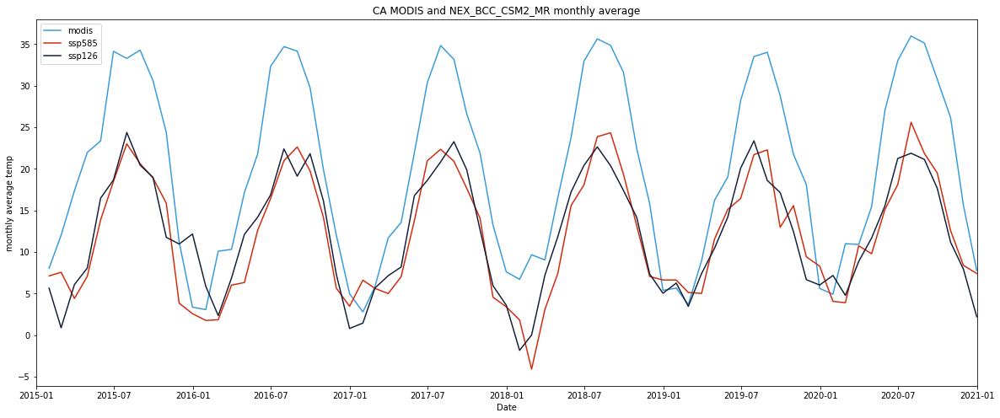

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(CA_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(CA_ssp585_BCC_CSM2_MR_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(CA_ssp126_BCC_CSM2_MR_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('CA MODIS and NEX_BCC_CSM2_MR monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
#this model missing 2020-12 data
CA_ssp585_BCC_CSM2_MR_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp585_BCC_CSM2_MR_monthly_avg_temp)) 
CA_ssp585_BCC_CSM2_MR_monthly_rmse

9.316668972570623

In [ ]:
#calculate RMSE
#this model missing 2020-12 data
CA_ssp126_BCC_CSM2_MR_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp126_BCC_CSM2_MR_monthly_avg_temp)) 
CA_ssp126_BCC_CSM2_MR_monthly_rmse

9.21887841915117

#### time series analysis

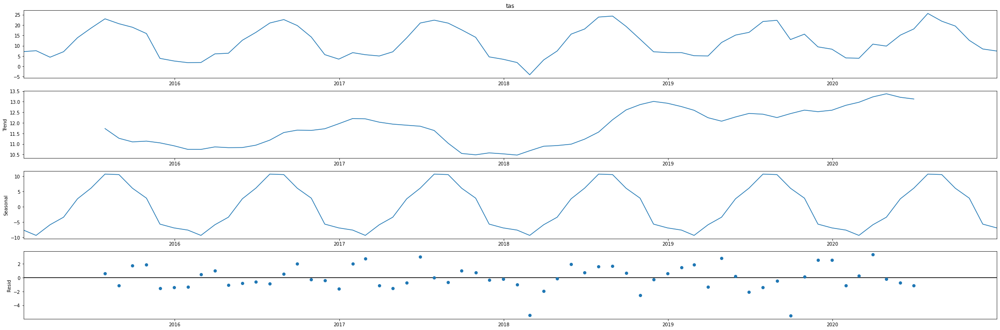

In [ ]:

CA_ssp585_BCC_CSM2_MR_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp585_BCC_CSM2_MR_monthly_avg_temp, model='additive')
fig = CA_ssp585_BCC_CSM2_MR_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

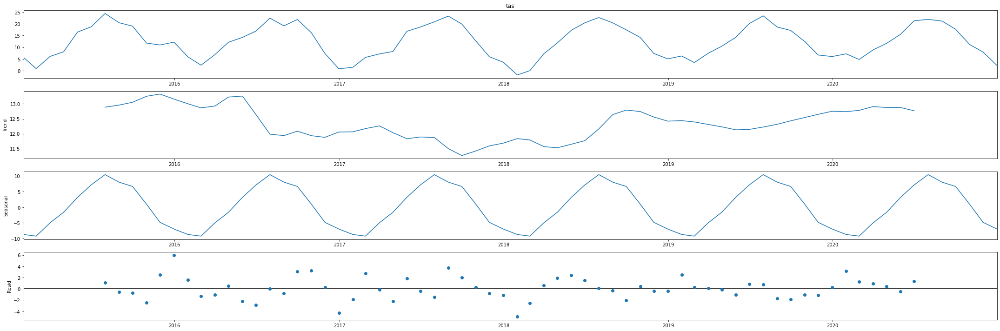

In [ ]:

CA_ssp126_BCC_CSM2_MR_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp126_BCC_CSM2_MR_monthly_avg_temp, model='additive')
fig = CA_ssp126_BCC_CSM2_MR_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

#### R square

In [ ]:
CA_ssp585_BCC_CSM2_MR_model = LinearRegression()
x = CA_ssp585_BCC_CSM2_MR_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
CA_ssp585_BCC_CSM2_MR_model.fit(x, y)
CA_ssp585_BCC_CSM2_MR_r_squared =CA_ssp585_BCC_CSM2_MR_model.score(x, y)
CA_ssp585_BCC_CSM2_MR_r_squared

0.8547733484165603

In [ ]:
CA_ssp126_BCC_CSM2_MR_model = LinearRegression()
x = CA_ssp126_BCC_CSM2_MR_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)


In [ ]:
CA_ssp126_BCC_CSM2_MR_model.fit(x, y)
CA_ssp126_BCC_CSM2_MR_r_squared = CA_ssp126_BCC_CSM2_MR_model.score(x, y)
CA_ssp126_BCC_CSM2_MR_r_squared

0.8288519253069062

#### seasonal analysis

In [ ]:
month = CA_ssp585_BCC_CSM2_MR_monthly_avg_temp.index.month
CA_ssp585_BCC_CSM2_MR_winter = pd.concat([CA_ssp585_BCC_CSM2_MR_monthly_avg_temp[month == 1], CA_ssp585_BCC_CSM2_MR_monthly_avg_temp[month == 2],CA_ssp585_BCC_CSM2_MR_monthly_avg_temp[month == 12]])
CA_ssp585_BCC_CSM2_MR_spring = pd.concat([CA_ssp585_BCC_CSM2_MR_monthly_avg_temp[month == 3], CA_ssp585_BCC_CSM2_MR_monthly_avg_temp[month == 4],CA_ssp585_BCC_CSM2_MR_monthly_avg_temp[month == 5]])
CA_ssp585_BCC_CSM2_MR_summer = pd.concat([CA_ssp585_BCC_CSM2_MR_monthly_avg_temp[month == 6], CA_ssp585_BCC_CSM2_MR_monthly_avg_temp[month == 7],CA_ssp585_BCC_CSM2_MR_monthly_avg_temp[month == 8]])
CA_ssp585_BCC_CSM2_MR_fall = pd.concat([CA_ssp585_BCC_CSM2_MR_monthly_avg_temp[month == 9], CA_ssp585_BCC_CSM2_MR_monthly_avg_temp[month == 10],CA_ssp585_BCC_CSM2_MR_monthly_avg_temp[month == 11]])
CA_ssp585_BCC_CSM2_MR_winter.sort_index()
CA_ssp585_BCC_CSM2_MR_spring.sort_index()
CA_ssp585_BCC_CSM2_MR_summer.sort_index()
CA_ssp585_BCC_CSM2_MR_fall.sort_index()

time
2015-09-30    18.911107
2015-10-31    15.871348
2015-11-30     3.852740
2016-09-30    19.737247
2016-10-31    14.188387
2016-11-30     5.663257
2017-09-30    17.651024
2017-10-31    14.052024
2017-11-30     4.573687
2018-09-30    19.342173
2018-10-31    13.141877
2018-11-30     7.062613
2019-09-30    12.967799
2019-10-31    15.577034
2019-11-30     9.425938
2020-09-30    19.501159
2020-10-31    12.581561
2020-11-30     8.398799
Name: tas, dtype: float64

In [ ]:
month = CA_ssp126_BCC_CSM2_MR_monthly_avg_temp.index.month
CA_ssp126_BCC_CSM2_MR_winter = pd.concat([CA_ssp126_BCC_CSM2_MR_monthly_avg_temp[month == 1], CA_ssp126_BCC_CSM2_MR_monthly_avg_temp[month == 2],CA_ssp126_BCC_CSM2_MR_monthly_avg_temp[month == 12]])
CA_ssp126_BCC_CSM2_MR_spring = pd.concat([CA_ssp126_BCC_CSM2_MR_monthly_avg_temp[month == 3], CA_ssp126_BCC_CSM2_MR_monthly_avg_temp[month == 4],CA_ssp126_BCC_CSM2_MR_monthly_avg_temp[month == 5]])
CA_ssp126_BCC_CSM2_MR_summer = pd.concat([CA_ssp126_BCC_CSM2_MR_monthly_avg_temp[month == 6], CA_ssp126_BCC_CSM2_MR_monthly_avg_temp[month == 7],CA_ssp126_BCC_CSM2_MR_monthly_avg_temp[month == 8]])
CA_ssp126_BCC_CSM2_MR_fall = pd.concat([CA_ssp126_BCC_CSM2_MR_monthly_avg_temp[month == 9], CA_ssp126_BCC_CSM2_MR_monthly_avg_temp[month == 10],CA_ssp126_BCC_CSM2_MR_monthly_avg_temp[month == 11]])
CA_ssp126_BCC_CSM2_MR_winter.sort_index()
CA_ssp126_BCC_CSM2_MR_spring.sort_index()
CA_ssp126_BCC_CSM2_MR_summer.sort_index()
CA_ssp126_BCC_CSM2_MR_fall.sort_index()

time
2015-09-30    18.973865
2015-10-31    11.770588
2015-11-30    10.964733
2016-09-30    21.816838
2016-10-31    16.161692
2016-11-30     7.350425
2017-09-30    19.873384
2017-10-31    12.654941
2017-11-30     5.958083
2018-09-30    17.400933
2018-10-31    14.152321
2018-11-30     7.362241
2019-09-30    17.150604
2019-10-31    12.464429
2019-11-30     6.683121
2020-09-30    17.664313
2020-10-31    11.186290
2020-11-30     7.933539
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = CA_ssp126_BCC_CSM2_MR_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.15829512075976582
coef:  [[-0.33888197]]
intercept:  [7.92607345]


In [ ]:
x = CA_ssp126_BCC_CSM2_MR_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.6314420934553668
coef:  [[1.14252294]]
intercept:  [4.28195162]


In [ ]:
x = CA_ssp126_BCC_CSM2_MR_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.08554018236170657
coef:  [[0.27761369]]
intercept:  [27.80192006]


In [ ]:
x = CA_ssp126_BCC_CSM2_MR_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.6954024766483968
coef:  [[1.14092616]]
intercept:  [7.20059547]


#####ssp585

In [ ]:
x = CA_ssp585_BCC_CSM2_MR_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.013936539068903353
coef:  [[-0.10774893]]
intercept:  [7.05396932]


In [ ]:
x = CA_ssp585_BCC_CSM2_MR_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.5545485183588846
coef:  [[0.97914836]]
intercept:  [7.77634057]


In [ ]:
x = CA_ssp585_BCC_CSM2_MR_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.46670745447185935
coef:  [[0.48859366]]
intercept:  [23.29612985]


In [ ]:
x = CA_ssp585_BCC_CSM2_MR_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8645356008032429
coef:  [[1.18739878]]
intercept:  [6.91867894]




### CA_NEX_GISS_E2_1_G

#### ssp585

In [ ]:
#https://drive.google.com/file/d/1OYwi0lJyCif6VKrobaSlf93IeefU019g/view?usp=share_link
id = "1OYwi0lJyCif6VKrobaSlf93IeefU019g"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp585_GISS-E2-1-G.csv')

CA_ssp585_GISS_E2_1_G = pd.read_csv('CA_ssp585_GISS-E2-1-G.csv', parse_dates=['time'], index_col='time')
CA_ssp585_GISS_E2_1_G.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,1.981934
2015-01-01,39.125,-119.875,2.556152
2015-01-01,39.125,-119.625,3.747772
2015-01-01,39.125,-119.375,3.159271
2015-01-01,39.125,-119.125,5.470428


In [ ]:
CA_ssp585_GISS_E2_1_G

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,1.981934
2015-01-01,39.125,-119.875,2.556152
2015-01-01,39.125,-119.625,3.747772
2015-01-01,39.125,-119.375,3.159271
2015-01-01,39.125,-119.125,5.470428
...,...,...,...
2020-12-29,36.375,-118.125,4.932068
2020-12-29,36.375,-117.875,10.467590
2020-12-29,36.375,-117.625,8.313721


In [ ]:
CA_ssp585_GISS_E2_1_G['tas'].isnull().sum()

0

In [ ]:
CA_ssp585_GISS_E2_1_G_avg_temp = CA_ssp585_GISS_E2_1_G.groupby(CA_ssp585_GISS_E2_1_G.index)['tas'].mean()
CA_ssp585_GISS_E2_1_G_avg_temp

time
2015-01-01    5.112578
2015-01-02    3.705201
2015-01-03    3.337284
2015-01-04    1.110660
2015-01-05    2.341028
                ...   
2020-12-25    1.948002
2020-12-26    1.687887
2020-12-27    1.061640
2020-12-28    3.769416
2020-12-29    7.193107
Name: tas, Length: 2190, dtype: float64

In [ ]:
CA_ssp585_GISS_E2_1_G_monthly_avg_temp = CA_ssp585_GISS_E2_1_G_avg_temp.resample('M').mean()
CA_ssp585_GISS_E2_1_G_monthly_avg_temp

time
2015-01-31     1.614244
2015-02-28     6.293015
2015-03-31     4.708137
2015-04-30     9.719959
2015-05-31    11.827551
                ...    
2020-08-31    22.710052
2020-09-30    16.899137
2020-10-31    14.733261
2020-11-30     5.706081
2020-12-31     5.458079
Freq: M, Name: tas, Length: 72, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/1BWR2TDf1vwVOfGDBqBg9eu4dpQkr1dP2/view?usp=share_link
id = "1BWR2TDf1vwVOfGDBqBg9eu4dpQkr1dP2"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp126_GISS-E2-1-G.csv')

CA_ssp126_GISS_E2_1_G = pd.read_csv('CA_ssp126_GISS-E2-1-G.csv', parse_dates=['time'], index_col='time')
CA_ssp126_GISS_E2_1_G.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,2.138062
2015-01-01,39.125,-119.875,2.786987
2015-01-01,39.125,-119.625,4.053406
2015-01-01,39.125,-119.375,3.539673
2015-01-01,39.125,-119.125,5.925598


In [ ]:
CA_ssp126_GISS_E2_1_G['tas'].isnull().sum()

0

In [ ]:
CA_ssp126_GISS_E2_1_G_avg_temp = CA_ssp126_GISS_E2_1_G.groupby(CA_ssp126_GISS_E2_1_G.index)['tas'].mean()
CA_ssp126_GISS_E2_1_G_avg_temp

time
2015-01-01    5.636714
2015-01-02    3.849491
2015-01-03    3.673618
2015-01-04    0.599179
2015-01-05    2.301965
                ...   
2020-12-25    1.993739
2020-12-26    7.409499
2020-12-27    7.847954
2020-12-28    5.526684
2020-12-29    0.807745
Name: tas, Length: 2190, dtype: float64

In [ ]:
CA_ssp126_GISS_E2_1_G_monthly_avg_temp = CA_ssp126_GISS_E2_1_G_avg_temp.resample('M').mean()
CA_ssp126_GISS_E2_1_G_monthly_avg_temp

time
2015-01-31     3.077316
2015-02-28     3.610418
2015-03-31     2.976626
2015-04-30     7.890503
2015-05-31    12.226956
                ...    
2020-08-31    22.985515
2020-09-30    19.442184
2020-10-31    17.177073
2020-11-30     6.747637
2020-12-31     4.495490
Freq: M, Name: tas, Length: 72, dtype: float64

#### compare modis with ssp585 and ssp126

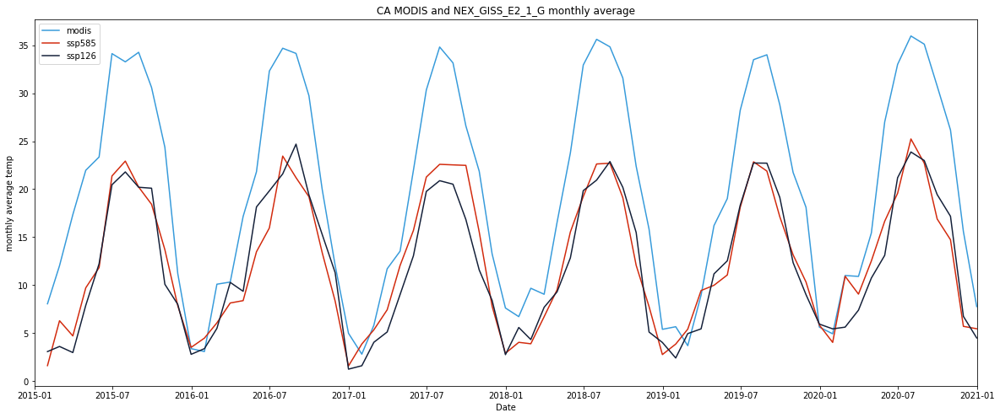

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(CA_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(CA_ssp585_GISS_E2_1_G_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(CA_ssp126_GISS_E2_1_G_monthly_avg_temp, color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('CA MODIS and NEX_GISS_E2_1_G monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
CA_ssp585_CanESM5_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp585_GISS_E2_1_G_monthly_avg_temp)) 
CA_ssp585_CanESM5_monthly_rmse

8.67623083135701

In [ ]:
CA_ssp126_GISS_E2_1_G_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp126_GISS_E2_1_G_monthly_avg_temp)) 
CA_ssp126_GISS_E2_1_G_monthly_rmse

8.893649845241828

#### time series analysis

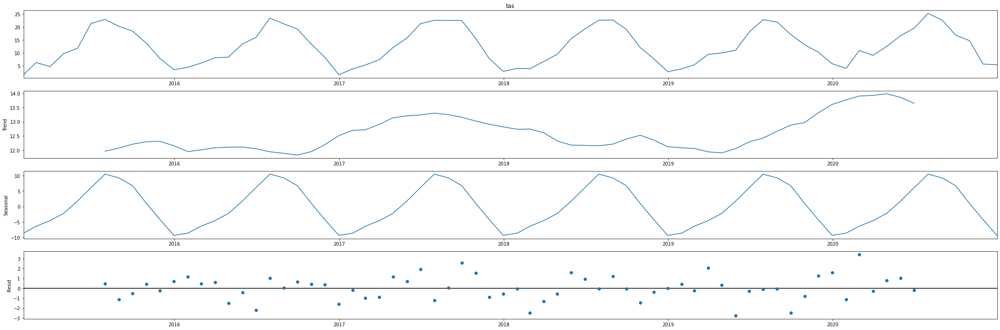

In [ ]:

CA_ssp585_GISS_E2_1_G_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp585_GISS_E2_1_G_monthly_avg_temp, model='additive')
fig = CA_ssp585_GISS_E2_1_G_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

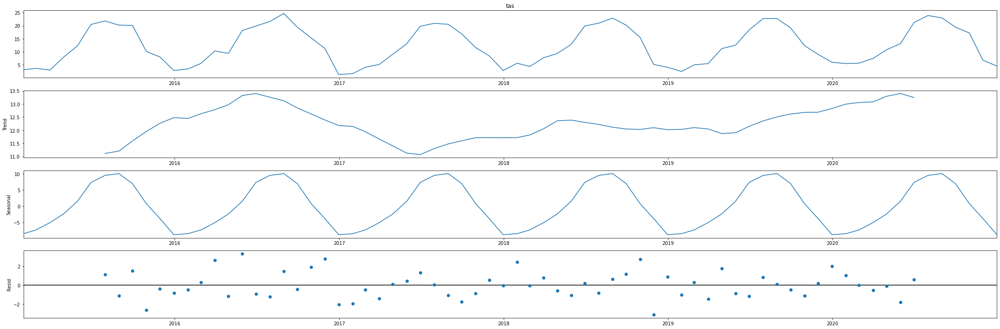

In [ ]:

CA_ssp126_GISS_E2_1_G_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp126_GISS_E2_1_G_monthly_avg_temp, model='additive')
fig = CA_ssp126_GISS_E2_1_G_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

####R Square

In [ ]:
CA_ssp585_GISS_E2_1_G_model = LinearRegression()
x = CA_ssp585_GISS_E2_1_G_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
CA_ssp585_GISS_E2_1_G_model.fit(x, y)
CA_ssp585_GISS_E2_1_G_squared =CA_ssp585_GISS_E2_1_G_model.score(x, y)
CA_ssp585_GISS_E2_1_G_squared

0.9064784617662062

In [ ]:
CA_ssp126_GISS_E2_1_G_model = LinearRegression()
x = CA_ssp126_GISS_E2_1_G_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)


In [ ]:
CA_ssp126_GISS_E2_1_G_model.fit(x, y)
CA_ssp126_GISS_E2_1_G_r_squared = CA_ssp126_GISS_E2_1_G_model.score(x, y)
CA_ssp126_GISS_E2_1_G_r_squared

0.9026436359574875

#### seasonal analysis

In [ ]:
month = CA_ssp585_GISS_E2_1_G_monthly_avg_temp.index.month
CA_ssp585_GISS_E2_1_G_winter = pd.concat([CA_ssp585_GISS_E2_1_G_monthly_avg_temp[month == 1], CA_ssp585_GISS_E2_1_G_monthly_avg_temp[month == 2],CA_ssp585_GISS_E2_1_G_monthly_avg_temp[month == 12]])
CA_ssp585_GISS_E2_1_G_spring = pd.concat([CA_ssp585_GISS_E2_1_G_monthly_avg_temp[month == 3], CA_ssp585_GISS_E2_1_G_monthly_avg_temp[month == 4],CA_ssp585_GISS_E2_1_G_monthly_avg_temp[month == 5]])
CA_ssp585_GISS_E2_1_G_summer = pd.concat([CA_ssp585_GISS_E2_1_G_monthly_avg_temp[month == 6], CA_ssp585_GISS_E2_1_G_monthly_avg_temp[month == 7],CA_ssp585_GISS_E2_1_G_monthly_avg_temp[month == 8]])
CA_ssp585_GISS_E2_1_G_fall = pd.concat([CA_ssp585_GISS_E2_1_G_monthly_avg_temp[month == 9], CA_ssp585_GISS_E2_1_G_monthly_avg_temp[month == 10],CA_ssp585_GISS_E2_1_G_monthly_avg_temp[month == 11]])
CA_ssp585_GISS_E2_1_G_winter.sort_index()
CA_ssp585_GISS_E2_1_G_spring.sort_index()
CA_ssp585_GISS_E2_1_G_summer.sort_index()
CA_ssp585_GISS_E2_1_G_fall.sort_index()

time
2015-09-30    18.427489
2015-10-31    13.693262
2015-11-30     7.849719
2016-09-30    19.215377
2016-10-31    13.363085
2016-11-30     8.333830
2017-09-30    22.481671
2017-10-31    15.550586
2017-11-30     7.803477
2018-09-30    19.109762
2018-10-31    12.070186
2018-11-30     7.761682
2019-09-30    17.133823
2019-10-31    13.157215
2019-11-30    10.326918
2020-09-30    16.899137
2020-10-31    14.733261
2020-11-30     5.706081
Name: tas, dtype: float64

In [ ]:
month = CA_ssp126_GISS_E2_1_G_monthly_avg_temp.index.month
CA_ssp126_GISS_E2_1_G_winter = pd.concat([CA_ssp126_GISS_E2_1_G_monthly_avg_temp[month == 1], CA_ssp126_GISS_E2_1_G_monthly_avg_temp[month == 2],CA_ssp126_GISS_E2_1_G_monthly_avg_temp[month == 12]])
CA_ssp126_GISS_E2_1_G_spring = pd.concat([CA_ssp126_GISS_E2_1_G_monthly_avg_temp[month == 3], CA_ssp126_GISS_E2_1_G_monthly_avg_temp[month == 4],CA_ssp126_GISS_E2_1_G_monthly_avg_temp[month == 5]])
CA_ssp126_GISS_E2_1_G_summer = pd.concat([CA_ssp126_GISS_E2_1_G_monthly_avg_temp[month == 6], CA_ssp126_GISS_E2_1_G_monthly_avg_temp[month == 7],CA_ssp126_GISS_E2_1_G_monthly_avg_temp[month == 8]])
CA_ssp126_GISS_E2_1_G_fall = pd.concat([CA_ssp126_GISS_E2_1_G_monthly_avg_temp[month == 9], CA_ssp126_GISS_E2_1_G_monthly_avg_temp[month == 10],CA_ssp126_GISS_E2_1_G_monthly_avg_temp[month == 11]])
CA_ssp126_GISS_E2_1_G_winter.sort_index()
CA_ssp126_GISS_E2_1_G_spring.sort_index()
CA_ssp126_GISS_E2_1_G_summer.sort_index()
CA_ssp126_GISS_E2_1_G_fall.sort_index()

time
2015-09-30    20.102863
2015-10-31    10.089679
2015-11-30     7.995428
2016-09-30    19.404904
2016-10-31    15.264288
2016-11-30    11.301956
2017-09-30    16.835215
2017-10-31    11.583944
2017-11-30     8.415749
2018-09-30    20.194775
2018-10-31    15.490010
2018-11-30     5.112776
2019-09-30    19.149503
2019-10-31    12.342925
2019-11-30     9.009912
2020-09-30    19.442184
2020-10-31    17.177073
2020-11-30     6.747637
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = CA_ssp126_GISS_E2_1_G_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.12106943844935625
coef:  [[0.67311331]]
intercept:  [3.92645171]


In [ ]:
x = CA_ssp126_GISS_E2_1_G_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.38023574486981315
coef:  [[0.94632717]]
intercept:  [7.63072667]


In [ ]:
x = CA_ssp126_GISS_E2_1_G_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.44470365173773074
coef:  [[0.75953552]]
intercept:  [17.31829211]


In [ ]:
x = CA_ssp126_GISS_E2_1_G_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.7781350887492912
coef:  [[1.18212048]]
intercept:  [6.12252684]


#####ssp585

In [ ]:
x = CA_ssp585_GISS_E2_1_G_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.21476373785832292
coef:  [[0.60522876]]
intercept:  [3.82141328]


In [ ]:
x = CA_ssp585_GISS_E2_1_G_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.47993605053100685
coef:  [[1.17348196]]
intercept:  [4.49159565]


In [ ]:
x = CA_ssp585_GISS_E2_1_G_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.4136022146543701
coef:  [[0.55151704]]
intercept:  [21.73371536]


In [ ]:
x = CA_ssp585_GISS_E2_1_G_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8091414310287427
coef:  [[1.26330301]]
intercept:  [5.15803523]


### CA_NEX_HadGEM3_GC31_LL


#### ssp585

In [ ]:
#https://drive.google.com/file/d/1zeIt65brLdQGHUCLMgyiD_8TeaeoA9MB/view?usp=share_link
id = "1zeIt65brLdQGHUCLMgyiD_8TeaeoA9MB"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp585_HadGEM3-GC31-LL.csv')

CA_ssp585_HadGEM3_GC31_LL = pd.read_csv('CA_ssp585_HadGEM3-GC31-LL.csv', parse_dates=['time'], index_col='time')
CA_ssp585_HadGEM3_GC31_LL.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,-4.907593
2015-01-01,39.125,-119.875,-5.296295
2015-01-01,39.125,-119.625,-5.067566
2015-01-01,39.125,-119.375,-6.618957
2015-01-01,39.125,-119.125,-5.270691


In [ ]:
CA_ssp585_HadGEM3_GC31_LL

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,-4.907593
2015-01-01,39.125,-119.875,-5.296295
2015-01-01,39.125,-119.625,-5.067566
2015-01-01,39.125,-119.375,-6.618957
2015-01-01,39.125,-119.125,-5.270691
...,...,...,...
2020-11-29,36.375,-118.125,1.464905
2020-11-29,36.375,-117.875,6.805298
2020-11-29,36.375,-117.625,4.452393


In [ ]:
CA_ssp585_HadGEM3_GC31_LL['tas'].isnull().sum()

0

In [ ]:
CA_ssp585_HadGEM3_GC31_LL_avg_temp = CA_ssp585_HadGEM3_GC31_LL.groupby(CA_ssp585_HadGEM3_GC31_LL.index)['tas'].mean()
CA_ssp585_HadGEM3_GC31_LL_avg_temp

time
2015-01-01   -5.975300
2015-01-02   -2.496039
2015-01-03   -4.409977
2015-01-04   -3.361707
2015-01-05   -0.180459
                ...   
2020-11-25    4.150350
2020-11-26    2.219940
2020-11-27    0.270761
2020-11-28    2.552764
2020-11-29    3.909541
Name: tas, Length: 2160, dtype: float64

In [ ]:
CA_ssp585_HadGEM3_GC31_LL_monthly_avg_temp = CA_ssp585_HadGEM3_GC31_LL_avg_temp.resample('M').mean()
CA_ssp585_HadGEM3_GC31_LL_monthly_avg_temp

time
2015-01-31     3.072282
2015-02-28     7.389290
2015-03-31     7.468844
2015-04-30     9.409779
2015-05-31    12.967034
                ...    
2020-07-31    22.099005
2020-08-31    18.739552
2020-09-30    16.453325
2020-10-31     6.224419
2020-11-30     5.418553
Freq: M, Name: tas, Length: 71, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/1Y3t_qNSlyTuaIjiUjyDsMy47IGO-559E/view?usp=share_link
id = "1Y3t_qNSlyTuaIjiUjyDsMy47IGO-559E"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp126_HadGEM3-GC31-LL.csv')

CA_ssp126_HadGEM3_GC31_LL = pd.read_csv('CA_ssp126_HadGEM3-GC31-LL.csv', parse_dates=['time'], index_col='time')
CA_ssp126_HadGEM3_GC31_LL.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,2.138062
2015-01-01,39.125,-119.875,2.786987
2015-01-01,39.125,-119.625,4.053406
2015-01-01,39.125,-119.375,3.539673
2015-01-01,39.125,-119.125,5.925598


In [ ]:
CA_ssp126_HadGEM3_GC31_LL['tas'].isnull().sum()

0

In [ ]:
CA_ssp126_HadGEM3_GC31_LL_avg_temp = CA_ssp126_HadGEM3_GC31_LL.groupby(CA_ssp126_HadGEM3_GC31_LL.index)['tas'].mean()
CA_ssp126_HadGEM3_GC31_LL_avg_temp

time
2015-01-01    5.636714
2015-01-02    3.849491
2015-01-03    3.673618
2015-01-04    0.599179
2015-01-05    2.301965
                ...   
2020-12-25    1.993739
2020-12-26    7.409499
2020-12-27    7.847954
2020-12-28    5.526684
2020-12-29    0.807745
Name: tas, Length: 2190, dtype: float64

In [ ]:
CA_ssp126_HadGEM3_GC31_LL_monthly_avg_temp = CA_ssp126_HadGEM3_GC31_LL_avg_temp.resample('M').mean()
CA_ssp126_HadGEM3_GC31_LL_monthly_avg_temp

time
2015-01-31     3.077316
2015-02-28     3.610418
2015-03-31     2.976626
2015-04-30     7.890503
2015-05-31    12.226956
                ...    
2020-08-31    22.985515
2020-09-30    19.442184
2020-10-31    17.177073
2020-11-30     6.747637
2020-12-31     4.495490
Freq: M, Name: tas, Length: 72, dtype: float64

#### compare modis with ssp585 and ssp126

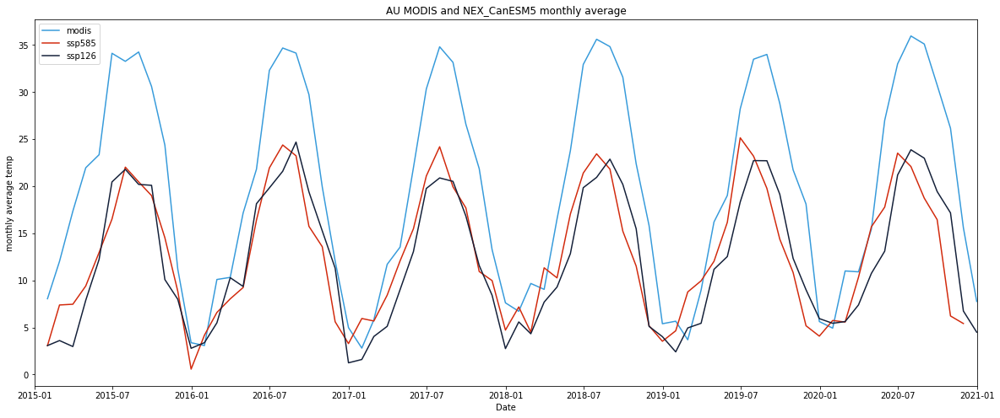

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(CA_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(CA_ssp585_HadGEM3_GC31_LL_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(CA_ssp126_HadGEM3_GC31_LL_monthly_avg_temp, color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('AU MODIS and NEX_CanESM5 monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
CA_ssp585_HadGEM3_GC31_LL_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month[:-1], CA_ssp585_HadGEM3_GC31_LL_monthly_avg_temp)) 
CA_ssp585_HadGEM3_GC31_LL_monthly_rmse

9.169214765189311

In [ ]:
CA_ssp126_HadGEM3_GC31_LL_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp126_HadGEM3_GC31_LL_monthly_avg_temp)) 
CA_ssp126_HadGEM3_GC31_LL_monthly_rmse

8.893649845241828

#### time series analysis

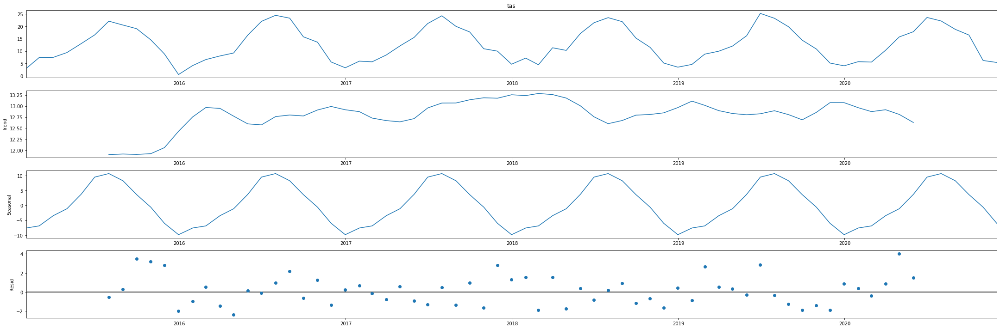

In [ ]:
CA_ssp585_HadGEM3_GC31_LL_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp585_HadGEM3_GC31_LL_monthly_avg_temp, model='additive')
fig = CA_ssp585_HadGEM3_GC31_LL_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

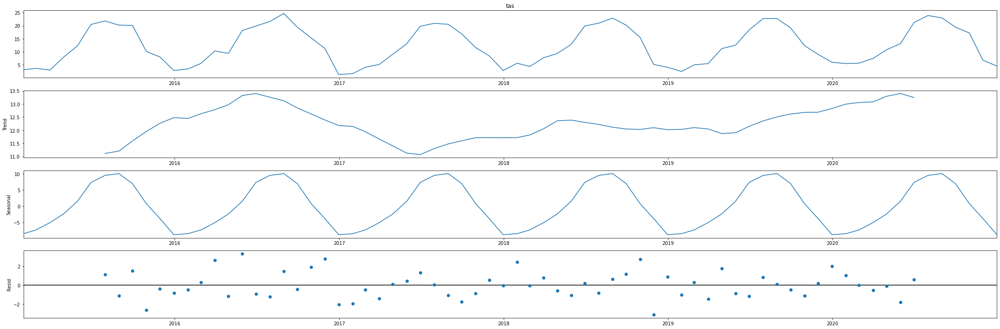

In [ ]:

CA_ssp126_HadGEM3_GC31_LL_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp126_HadGEM3_GC31_LL_monthly_avg_temp, model='additive')
fig = CA_ssp126_HadGEM3_GC31_LL_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

####R Square

In [ ]:
CA_ssp585_HadGEM3_GC31_LL_model = LinearRegression()
x = CA_ssp585_HadGEM3_GC31_LL_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month[:-1].values.reshape(-1, 1)

In [ ]:
CA_ssp585_HadGEM3_GC31_LL_model.fit(x, y)
CA_ssp585_HadGEM3_GC31_LL_r_squared=CA_ssp585_HadGEM3_GC31_LL_model.score(x, y)
CA_ssp585_HadGEM3_GC31_LL_r_squared

0.7985186414242943

In [ ]:
CA_ssp126_HadGEM3_GC31_LL_model = LinearRegression()
x = CA_ssp126_HadGEM3_GC31_LL_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)


In [ ]:
CA_ssp126_HadGEM3_GC31_LL_model.fit(x, y)
CA_ssp126_HadGEM3_GC31_LL_r_squared = CA_ssp126_HadGEM3_GC31_LL_model.score(x, y)
CA_ssp126_HadGEM3_GC31_LL_r_squared

0.9026436359574875

#### seasonal analysis

In [ ]:
month = CA_ssp585_HadGEM3_GC31_LL_monthly_avg_temp.index.month
CA_ssp585_HadGEM3_GC31_LL_winter = pd.concat([CA_ssp585_HadGEM3_GC31_LL_monthly_avg_temp[month == 1], CA_ssp585_HadGEM3_GC31_LL_monthly_avg_temp[month == 2],CA_ssp585_HadGEM3_GC31_LL_monthly_avg_temp[month == 12]])
CA_ssp585_HadGEM3_GC31_LL_spring = pd.concat([CA_ssp585_HadGEM3_GC31_LL_monthly_avg_temp[month == 3], CA_ssp585_HadGEM3_GC31_LL_monthly_avg_temp[month == 4],CA_ssp585_HadGEM3_GC31_LL_monthly_avg_temp[month == 5]])
CA_ssp585_HadGEM3_GC31_LL_summer = pd.concat([CA_ssp585_HadGEM3_GC31_LL_monthly_avg_temp[month == 6], CA_ssp585_HadGEM3_GC31_LL_monthly_avg_temp[month == 7],CA_ssp585_HadGEM3_GC31_LL_monthly_avg_temp[month == 8]])
CA_ssp585_HadGEM3_GC31_LL_fall = pd.concat([CA_ssp585_HadGEM3_GC31_LL_monthly_avg_temp[month == 9], CA_ssp585_HadGEM3_GC31_LL_monthly_avg_temp[month == 10],CA_ssp585_HadGEM3_GC31_LL_monthly_avg_temp[month == 11]])
CA_ssp585_HadGEM3_GC31_LL_winter.sort_index()
CA_ssp585_HadGEM3_GC31_LL_spring.sort_index()
CA_ssp585_HadGEM3_GC31_LL_summer.sort_index()
CA_ssp585_HadGEM3_GC31_LL_fall.sort_index()

time
2015-09-30    19.011025
2015-10-31    14.531098
2015-11-30     8.851874
2016-09-30    15.746366
2016-10-31    13.580119
2016-11-30     5.607677
2017-09-30    17.700441
2017-10-31    10.943527
2017-11-30     9.978002
2018-09-30    15.230020
2018-10-31    11.523634
2018-11-30     5.185575
2019-09-30    14.381988
2019-10-31    10.841747
2019-11-30     5.182955
2020-09-30    16.453325
2020-10-31     6.224419
2020-11-30     5.418553
Name: tas, dtype: float64

In [ ]:
month = CA_ssp126_HadGEM3_GC31_LL_monthly_avg_temp.index.month
CA_ssp126_HadGEM3_GC31_LL_winter = pd.concat([CA_ssp126_HadGEM3_GC31_LL_monthly_avg_temp[month == 1], CA_ssp126_HadGEM3_GC31_LL_monthly_avg_temp[month == 2],CA_ssp126_HadGEM3_GC31_LL_monthly_avg_temp[month == 12]])
CA_ssp126_HadGEM3_GC31_LL_spring = pd.concat([CA_ssp126_HadGEM3_GC31_LL_monthly_avg_temp[month == 3], CA_ssp126_HadGEM3_GC31_LL_monthly_avg_temp[month == 4],CA_ssp126_HadGEM3_GC31_LL_monthly_avg_temp[month == 5]])
CA_ssp126_HadGEM3_GC31_LL_summer = pd.concat([CA_ssp126_HadGEM3_GC31_LL_monthly_avg_temp[month == 6], CA_ssp126_HadGEM3_GC31_LL_monthly_avg_temp[month == 7],CA_ssp126_HadGEM3_GC31_LL_monthly_avg_temp[month == 8]])
CA_ssp126_HadGEM3_GC31_LL_fall = pd.concat([CA_ssp126_HadGEM3_GC31_LL_monthly_avg_temp[month == 9], CA_ssp126_HadGEM3_GC31_LL_monthly_avg_temp[month == 10],CA_ssp126_HadGEM3_GC31_LL_monthly_avg_temp[month == 11]])
CA_ssp126_HadGEM3_GC31_LL_winter.sort_index()
CA_ssp126_HadGEM3_GC31_LL_spring.sort_index()
CA_ssp126_HadGEM3_GC31_LL_summer.sort_index()
CA_ssp126_HadGEM3_GC31_LL_fall.sort_index()

time
2015-09-30    20.102863
2015-10-31    10.089679
2015-11-30     7.995428
2016-09-30    19.404904
2016-10-31    15.264288
2016-11-30    11.301956
2017-09-30    16.835215
2017-10-31    11.583944
2017-11-30     8.415749
2018-09-30    20.194775
2018-10-31    15.490010
2018-11-30     5.112776
2019-09-30    19.149503
2019-10-31    12.342925
2019-11-30     9.009912
2020-09-30    19.442184
2020-10-31    17.177073
2020-11-30     6.747637
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = CA_ssp126_HadGEM3_GC31_LL_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.12106943844935625
coef:  [[0.67311331]]
intercept:  [3.92645171]


In [ ]:
x = CA_ssp126_HadGEM3_GC31_LL_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.38023574486981315
coef:  [[0.94632717]]
intercept:  [7.63072667]


In [ ]:
x = CA_ssp126_HadGEM3_GC31_LL_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.44470365173773074
coef:  [[0.75953552]]
intercept:  [17.31829211]


In [ ]:
x = CA_ssp126_HadGEM3_GC31_LL_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.7781350887492912
coef:  [[1.18212048]]
intercept:  [6.12252684]


#####ssp585

In [ ]:
x = CA_ssp585_HadGEM3_GC31_LL_winter.values.reshape(-1, 1)
y = CA_winter[:-1].values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.07040345339325604
coef:  [[0.38854598]]
intercept:  [4.55093133]


In [ ]:
x = CA_ssp585_HadGEM3_GC31_LL_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.40597311972102534
coef:  [[1.03579234]]
intercept:  [4.33623638]


In [ ]:
x = CA_ssp585_HadGEM3_GC31_LL_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.04426839564740093
coef:  [[-0.18072514]]
intercept:  [37.52072937]


In [ ]:
x = CA_ssp585_HadGEM3_GC31_LL_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.589905705120888
coef:  [[1.12818289]]
intercept:  [9.31988103]


###CA_NEX_FGOALS-g3

####SSP585

In [ ]:
#https://drive.google.com/file/d/1HNVwAILulWvV0qg9mCmCVYFVyKpm3_U4/view?usp=share_link
id = "1HNVwAILulWvV0qg9mCmCVYFVyKpm3_U4"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp585_FGOALS-g3.csv')

CA_ssp585_FGOALS_g3 = pd.read_csv('CA_ssp585_FGOALS-g3.csv', parse_dates=['time'], index_col='time')
CA_ssp585_FGOALS_g3.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,0.027985
2015-01-01,39.125,-119.875,0.410217
2015-01-01,39.125,-119.625,1.427734
2015-01-01,39.125,-119.375,0.665131
2015-01-01,39.125,-119.125,2.802185


In [ ]:
CA_ssp585_FGOALS_g3

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,0.027985
2015-01-01,39.125,-119.875,0.410217
2015-01-01,39.125,-119.625,1.427734
2015-01-01,39.125,-119.375,0.665131
2015-01-01,39.125,-119.125,2.802185
...,...,...,...
2020-12-29,36.375,-118.125,1.517517
2020-12-29,36.375,-117.875,7.303833
2020-12-29,36.375,-117.625,5.607361


In [ ]:
CA_ssp585_FGOALS_g3['tas'].isnull().sum()

0

In [ ]:
CA_ssp585_FGOALS_g3_avg_temp = CA_ssp585_FGOALS_g3.groupby(CA_ssp585_FGOALS_g3.index)['tas'].mean()
CA_ssp585_FGOALS_g3_avg_temp

time
2015-01-01    2.359246
2015-01-02    5.228273
2015-01-03    1.836626
2015-01-04    3.065302
2015-01-05    5.757235
                ...   
2020-12-25    1.561357
2020-12-26   -0.581522
2020-12-27    2.221615
2020-12-28    2.285343
2020-12-29    3.481213
Name: tas, Length: 2190, dtype: float64

In [ ]:
CA_ssp585_FGOALS_g3_monthly_avg_temp = CA_ssp585_FGOALS_g3_avg_temp.resample('M').mean()
CA_ssp585_FGOALS_g3_monthly_avg_temp

time
2015-01-31     1.281259
2015-02-28     6.473949
2015-03-31     4.460458
2015-04-30    10.497038
2015-05-31    14.752761
                ...    
2020-08-31    20.846296
2020-09-30    18.678617
2020-10-31    14.177825
2020-11-30     9.328066
2020-12-31     4.049147
Freq: M, Name: tas, Length: 72, dtype: float64

####SSP126

In [ ]:
#https://drive.google.com/file/d/131HLeOYg_wtDUTVu2pIr5JJtKJqDqbWi/view?usp=share_link
id = "131HLeOYg_wtDUTVu2pIr5JJtKJqDqbWi"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp126_FGOALS-g3.csv')

CA_ssp126_FGOALS_g3 = pd.read_csv('CA_ssp126_FGOALS-g3.csv', parse_dates=['time'], index_col='time')
CA_ssp126_FGOALS_g3.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,5.408112
2015-01-01,39.125,-119.875,5.971802
2015-01-01,39.125,-119.625,7.396820
2015-01-01,39.125,-119.375,7.041687
2015-01-01,39.125,-119.125,9.586243


In [ ]:
CA_ssp126_FGOALS_g3['tas'].isnull().sum()

0

In [ ]:
CA_ssp126_FGOALS_g3_avg_temp = CA_ssp126_FGOALS_g3.groupby(CA_ssp126_FGOALS_g3.index)['tas'].mean()
CA_ssp126_FGOALS_g3_avg_temp

time
2015-01-01    9.195835
2015-01-02    3.773598
2015-01-03    4.591110
2015-01-04    3.641565
2015-01-05    1.320005
                ...   
2020-12-25   -2.016365
2020-12-26    1.946840
2020-12-27    3.131976
2020-12-28    2.527306
2020-12-29    0.263617
Name: tas, Length: 2190, dtype: float64

In [ ]:
CA_ssp126_FGOALS_g3_monthly_avg_temp = CA_ssp126_FGOALS_g3_avg_temp.resample('M').mean()
CA_ssp126_FGOALS_g3_monthly_avg_temp

time
2015-01-31     2.294450
2015-02-28     5.320850
2015-03-31     6.162831
2015-04-30     8.602896
2015-05-31    12.889362
                ...    
2020-08-31    21.031844
2020-09-30    17.406749
2020-10-31    14.396809
2020-11-30     1.627715
2020-12-31     1.379255
Freq: M, Name: tas, Length: 72, dtype: float64

####compare modis with ssp585 and ssp126

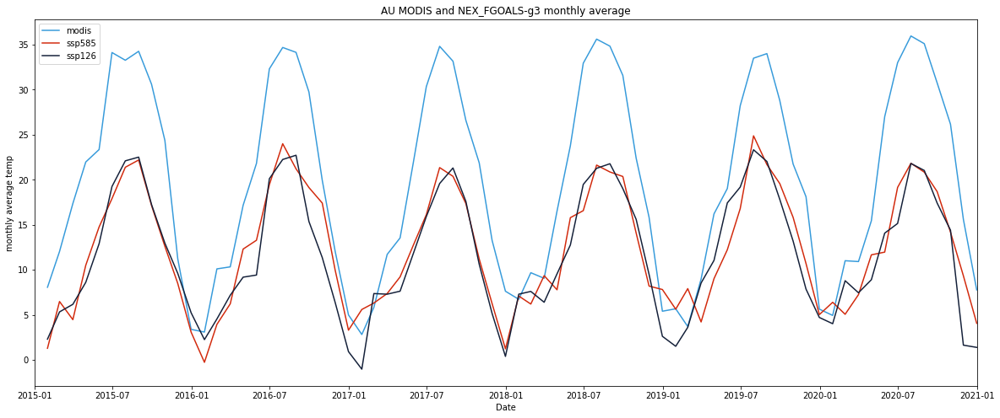

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(CA_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(CA_ssp585_FGOALS_g3_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(CA_ssp126_FGOALS_g3_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('AU MODIS and NEX_FGOALS-g3 monthly average')
plt.show()

####RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
CA_ssp585_FGOALS_g3_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp585_FGOALS_g3_monthly_avg_temp)) 
CA_ssp585_FGOALS_g3_monthly_rmse

9.129372419722891

In [ ]:
CA_ssp585_FGOALS_g3_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp126_FGOALS_g3_monthly_avg_temp)) 
CA_ssp585_FGOALS_g3_monthly_rmse

9.545372851415847

####time series analysis

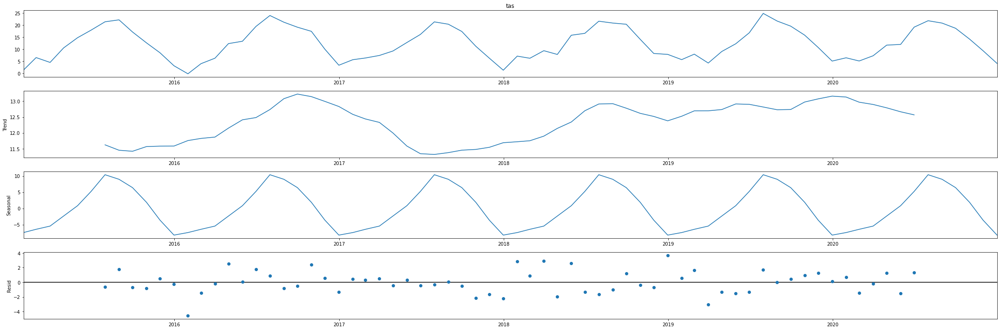

In [ ]:
CA_ssp585_FGOALS_g3_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp585_FGOALS_g3_monthly_avg_temp, model='additive')
fig = CA_ssp585_FGOALS_g3_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

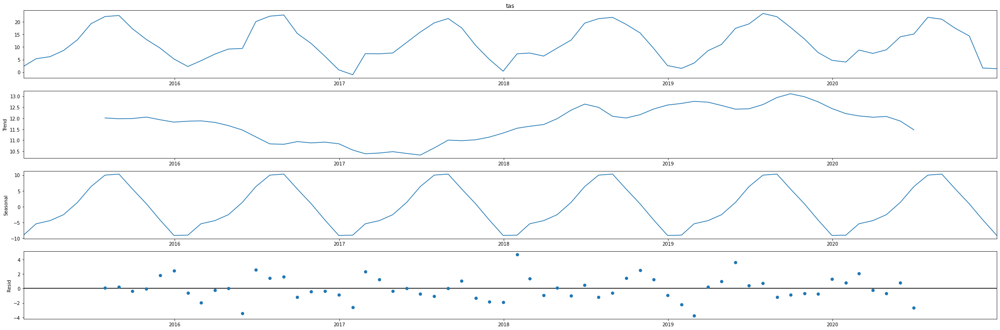

In [ ]:
CA_ssp126_FGOALS_g3_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp126_FGOALS_g3_monthly_avg_temp, model='additive')
fig = CA_ssp126_FGOALS_g3_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

####R Square

In [ ]:
CA_ssp585_FGOALS_g3_model = LinearRegression()
x = CA_ssp585_FGOALS_g3_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
CA_ssp585_FGOALS_g3_model.fit(x, y)
CA_ssp585_FGOALS_g3_r_squared =CA_ssp585_FGOALS_g3_model.score(x, y)
CA_ssp585_FGOALS_g3_r_squared

0.882641935472481

In [ ]:
CA_ssp126_FGOALS_g3_model = LinearRegression()
x = CA_ssp126_FGOALS_g3_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)


In [ ]:
CA_ssp126_FGOALS_g3_model.fit(x, y)
CA_ssp126_FGOALS_g3_r_squared = CA_ssp126_FGOALS_g3_model.score(x, y)
CA_ssp126_FGOALS_g3_r_squared

0.8839918016384576

#### seasonal analysis

In [ ]:
month = CA_ssp585_FGOALS_g3_monthly_avg_temp.index.month
CA_ssp585_FGOALS_g3_winter = pd.concat([CA_ssp585_FGOALS_g3_monthly_avg_temp[month == 1], CA_ssp585_FGOALS_g3_monthly_avg_temp[month == 2],CA_ssp585_FGOALS_g3_monthly_avg_temp[month == 12]])
CA_ssp585_FGOALS_g3_spring = pd.concat([CA_ssp585_FGOALS_g3_monthly_avg_temp[month == 3], CA_ssp585_FGOALS_g3_monthly_avg_temp[month == 4],CA_ssp585_FGOALS_g3_monthly_avg_temp[month == 5]])
CA_ssp585_FGOALS_g3_summer = pd.concat([CA_ssp585_FGOALS_g3_monthly_avg_temp[month == 6], CA_ssp585_FGOALS_g3_monthly_avg_temp[month == 7],CA_ssp585_FGOALS_g3_monthly_avg_temp[month == 8]])
CA_ssp585_FGOALS_g3_fall = pd.concat([CA_ssp585_FGOALS_g3_monthly_avg_temp[month == 9], CA_ssp585_FGOALS_g3_monthly_avg_temp[month == 10],CA_ssp585_FGOALS_g3_monthly_avg_temp[month == 11]])
CA_ssp585_FGOALS_g3_winter.sort_index()
CA_ssp585_FGOALS_g3_spring.sort_index()
CA_ssp585_FGOALS_g3_summer.sort_index()
CA_ssp585_FGOALS_g3_fall.sort_index()

time
2015-09-30    17.136956
2015-10-31    12.606785
2015-11-30     8.475711
2016-09-30    19.132970
2016-10-31    17.411149
2016-11-30     9.964349
2017-09-30    17.351903
2017-10-31    11.195514
2017-11-30     6.240738
2018-09-30    20.360876
2018-10-31    14.078064
2018-11-30     8.188663
2019-09-30    19.571028
2019-10-31    15.822209
2019-11-30    10.690436
2020-09-30    18.678617
2020-10-31    14.177825
2020-11-30     9.328066
Name: tas, dtype: float64

In [ ]:
month = CA_ssp126_FGOALS_g3_monthly_avg_temp.index.month
CA_ssp126_FGOALS_g3_winter = pd.concat([CA_ssp126_FGOALS_g3_monthly_avg_temp[month == 1], CA_ssp126_FGOALS_g3_monthly_avg_temp[month == 2],CA_ssp126_FGOALS_g3_monthly_avg_temp[month == 12]])
CA_ssp126_FGOALS_g3_spring = pd.concat([CA_ssp126_FGOALS_g3_monthly_avg_temp[month == 3], CA_ssp126_FGOALS_g3_monthly_avg_temp[month == 4],CA_ssp126_FGOALS_g3_monthly_avg_temp[month == 5]])
CA_ssp126_FGOALS_g3_summer = pd.concat([CA_ssp126_FGOALS_g3_monthly_avg_temp[month == 6], CA_ssp126_FGOALS_g3_monthly_avg_temp[month == 7],CA_ssp126_FGOALS_g3_monthly_avg_temp[month == 8]])
CA_ssp126_FGOALS_g3_fall = pd.concat([CA_ssp126_FGOALS_g3_monthly_avg_temp[month == 9], CA_ssp126_FGOALS_g3_monthly_avg_temp[month == 10],CA_ssp126_FGOALS_g3_monthly_avg_temp[month == 11]])
CA_ssp126_FGOALS_g3_winter.sort_index()
CA_ssp126_FGOALS_g3_spring.sort_index()
CA_ssp126_FGOALS_g3_summer.sort_index()
CA_ssp126_FGOALS_g3_fall.sort_index()

time
2015-09-30    17.244033
2015-10-31    12.957835
2015-11-30     9.596841
2016-09-30    15.360439
2016-10-31    11.355891
2016-11-30     6.373283
2017-09-30    17.589743
2017-10-31    10.616020
2017-11-30     5.143280
2018-09-30    19.013583
2018-10-31    15.599613
2018-11-30     9.490920
2019-09-30    17.816247
2019-10-31    13.188192
2019-11-30     7.852418
2020-09-30    17.406749
2020-10-31    14.396809
2020-11-30     1.627715
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = CA_ssp126_FGOALS_g3_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.21526148159640945
coef:  [[0.46267233]]
intercept:  [4.80900346]


In [ ]:
x = CA_ssp126_FGOALS_g3_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.4533331154636482
coef:  [[1.23586649]]
intercept:  [4.90396032]


In [ ]:
x = CA_ssp126_FGOALS_g3_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.25102208011246185
coef:  [[0.42026394]]
intercept:  [24.91782625]


In [ ]:
x = CA_ssp126_FGOALS_g3_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.775486595796252
coef:  [[1.20357138]]
intercept:  [7.36975218]


#####ssp585

In [ ]:
x = CA_ssp585_FGOALS_g3_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.004684558415797846
coef:  [[0.08115782]]
intercept:  [6.18724142]


In [ ]:
x = CA_ssp585_FGOALS_g3_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.5523684867426683
coef:  [[1.21944388]]
intercept:  [4.80885687]


In [ ]:
x = CA_ssp585_FGOALS_g3_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.4251073712260981
coef:  [[0.50585191]]
intercept:  [23.22659172]


In [ ]:
x = CA_ssp585_FGOALS_g3_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.7941763117264031
coef:  [[1.3536166]]
intercept:  [3.42469544]


### CA_NEX_GFDL_ESM4


#### ssp585

In [ ]:
#https://drive.google.com/file/d/1PVAkKL3hNoZacZY_bZiJJfWevFtjK6ob/view?usp=share_link
id = "1PVAkKL3hNoZacZY_bZiJJfWevFtjK6ob"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp585_GFDL-ESM4.csv')

CA_ssp585_GFDL_ESM4 = pd.read_csv('CA_ssp585_GFDL-ESM4.csv', parse_dates=['time'], index_col='time')
CA_ssp585_GFDL_ESM4.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,-8.939606
2015-01-01,39.125,-119.875,-9.385864
2015-01-01,39.125,-119.625,-9.214661
2015-01-01,39.125,-119.375,-10.823608
2015-01-01,39.125,-119.125,-8.893951


In [ ]:
CA_ssp585_GFDL_ESM4

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,-8.939606
2015-01-01,39.125,-119.875,-9.385864
2015-01-01,39.125,-119.625,-9.214661
2015-01-01,39.125,-119.375,-10.823608
2015-01-01,39.125,-119.125,-8.893951
...,...,...,...
2020-12-29,36.375,-118.125,2.247437
2020-12-29,36.375,-117.875,7.790894
2020-12-29,36.375,-117.625,5.645020


In [ ]:
CA_ssp585_GFDL_ESM4['tas'].isnull().sum()

0

In [ ]:
CA_ssp585_GFDL_ESM4_avg_temp = CA_ssp585_GFDL_ESM4.groupby(CA_ssp585_GFDL_ESM4.index)['tas'].mean()
CA_ssp585_GFDL_ESM4_avg_temp

time
2015-01-01   -7.690537
2015-01-02   -5.559143
2015-01-03   -1.327359
2015-01-04   -6.181977
2015-01-05   -1.294002
                ...   
2020-12-25    4.739937
2020-12-26    3.603416
2020-12-27   -0.433087
2020-12-28    3.223649
2020-12-29    6.994516
Name: tas, Length: 2190, dtype: float64

In [ ]:
CA_ssp585_GFDL_ESM4_monthly_avg_temp = CA_ssp585_GFDL_ESM4_avg_temp.resample('M').mean()
CA_ssp585_GFDL_ESM4_monthly_avg_temp

time
2015-01-31     1.608957
2015-02-28     7.164216
2015-03-31    10.368845
2015-04-30    13.540251
2015-05-31    13.099524
                ...    
2020-08-31    21.434536
2020-09-30    19.636798
2020-10-31    17.184072
2020-11-30     7.003800
2020-12-31     1.183761
Freq: M, Name: tas, Length: 72, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/1jznuDPag7dSbDkxlKdGBxEhokXsEYx_u/view?usp=share_link
id = "1jznuDPag7dSbDkxlKdGBxEhokXsEYx_u"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp126_GFDL-ESM4.csv')

CA_ssp126_GFDL_ESM4 = pd.read_csv('CA_ssp126_GFDL-ESM4.csv', parse_dates=['time'], index_col='time')
CA_ssp126_GFDL_ESM4.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,-120.125,-8.726562
2015-01-01,39.125,-119.875,-9.145325
2015-01-01,39.125,-119.625,-8.946655
2015-01-01,39.125,-119.375,-10.528137
2015-01-01,39.125,-119.125,-8.652252


In [ ]:
CA_ssp126_GFDL_ESM4['tas'].isnull().sum()

0

In [ ]:
CA_ssp126_GFDL_ESM4_avg_temp = CA_ssp126_GFDL_ESM4.groupby(CA_ssp126_GFDL_ESM4.index)['tas'].mean()
CA_ssp126_GFDL_ESM4_avg_temp

time
2015-01-01   -7.565649
2015-01-02   -5.947132
2015-01-03   -1.364608
2015-01-04   -5.943411
2015-01-05   -0.947775
                ...   
2020-12-25    1.890573
2020-12-26    3.167234
2020-12-27    2.151593
2020-12-28    1.480102
2020-12-29   -0.932598
Name: tas, Length: 2190, dtype: float64

In [ ]:
CA_ssp126_GFDL_ESM4_monthly_avg_temp = CA_ssp126_GFDL_ESM4_avg_temp.resample('M').mean()
CA_ssp126_GFDL_ESM4_monthly_avg_temp

time
2015-01-31     1.432998
2015-02-28     1.889253
2015-03-31     5.680646
2015-04-30     9.517906
2015-05-31    12.667023
                ...    
2020-08-31    23.367402
2020-09-30    20.060046
2020-10-31    15.823424
2020-11-30     5.572072
2020-12-31     2.818268
Freq: M, Name: tas, Length: 72, dtype: float64

#### compare modis with ssp585 and ssp126

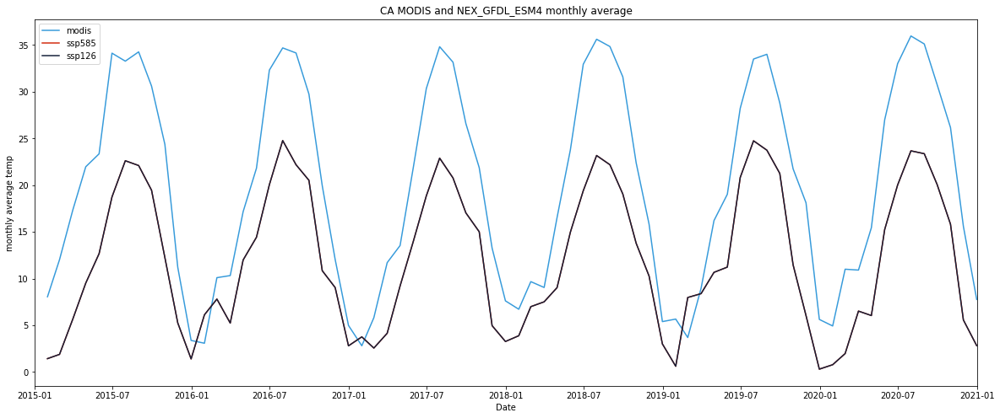

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(CA_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(CA_ssp126_GFDL_ESM4_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(CA_ssp126_GFDL_ESM4_monthly_avg_temp, color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('CA MODIS and NEX_GFDL_ESM4 monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt
CA_ssp585_GFDL_ESM4_monthly_avg_temp
#calculate RMSE
CA_ssp585_GFDL_ESM4_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp585_GFDL_ESM4_monthly_avg_temp)) 
CA_ssp585_GFDL_ESM4_monthly_rmse

8.856415263275002

In [ ]:
CA_ssp126_CanESM4_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp126_GFDL_ESM4_monthly_avg_temp)) 
CA_ssp126_CanESM4_monthly_rmse

8.846516535828025

####R Square

#### time series analysis

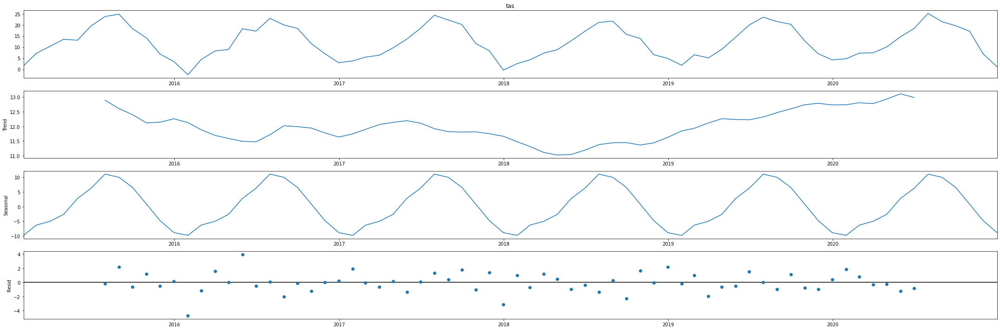

In [ ]:
CA_ssp585_GFDL_ESM4_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp585_GFDL_ESM4_monthly_avg_temp, model='additive')
fig = CA_ssp585_GFDL_ESM4_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

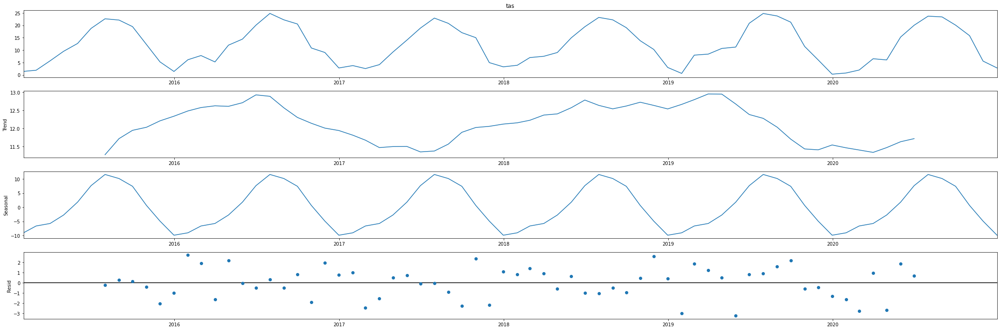

In [ ]:

CA_ssp126_GFDL_ESM4_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp126_GFDL_ESM4_monthly_avg_temp, model='additive')
fig = CA_ssp126_GFDL_ESM4_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

#### seasonal analysis

In [ ]:
month = CA_ssp585_GFDL_ESM4_monthly_avg_temp.index.month
CA_ssp585_GFDL_ESM4_winter = pd.concat([CA_ssp585_GFDL_ESM4_monthly_avg_temp[month == 1], CA_ssp585_GFDL_ESM4_monthly_avg_temp[month == 2],CA_ssp585_GFDL_ESM4_monthly_avg_temp[month == 12]])
CA_ssp585_GFDL_ESM4_spring = pd.concat([CA_ssp585_GFDL_ESM4_monthly_avg_temp[month == 3], CA_ssp585_GFDL_ESM4_monthly_avg_temp[month == 4],CA_ssp585_GFDL_ESM4_monthly_avg_temp[month == 5]])
CA_ssp585_GFDL_ESM4_summer = pd.concat([CA_ssp585_GFDL_ESM4_monthly_avg_temp[month == 6], CA_ssp585_GFDL_ESM4_monthly_avg_temp[month == 7],CA_ssp585_GFDL_ESM4_monthly_avg_temp[month == 8]])
CA_ssp585_GFDL_ESM4_fall = pd.concat([CA_ssp585_GFDL_ESM4_monthly_avg_temp[month == 9], CA_ssp585_GFDL_ESM4_monthly_avg_temp[month == 10],CA_ssp585_GFDL_ESM4_monthly_avg_temp[month == 11]])
CA_ssp585_GFDL_ESM4_winter.sort_index()
CA_ssp585_GFDL_ESM4_spring.sort_index()
CA_ssp585_GFDL_ESM4_summer.sort_index()
CA_ssp585_GFDL_ESM4_fall.sort_index()

time
2015-09-30    18.312662
2015-10-31    14.140060
2015-11-30     6.855342
2016-09-30    18.428987
2016-10-31    11.559295
2016-11-30     7.037305
2017-09-30    20.173757
2017-10-31    11.590054
2017-11-30     8.370016
2018-09-30    15.755342
2018-10-31    13.873383
2018-11-30     6.586960
2019-09-30    20.290224
2019-10-31    12.826756
2019-11-30     7.020676
2020-09-30    19.636798
2020-10-31    17.184072
2020-11-30     7.003800
Name: tas, dtype: float64

In [ ]:
month = CA_ssp126_GFDL_ESM4_monthly_avg_temp.index.month
CA_ssp126_GFDL_ESM4_winter = pd.concat([CA_ssp126_GFDL_ESM4_monthly_avg_temp[month == 1], CA_ssp126_GFDL_ESM4_monthly_avg_temp[month == 2],CA_ssp126_GFDL_ESM4_monthly_avg_temp[month == 12]])
CA_ssp126_GFDL_ESM4_spring = pd.concat([CA_ssp126_GFDL_ESM4_monthly_avg_temp[month == 3], CA_ssp126_GFDL_ESM4_monthly_avg_temp[month == 4],CA_ssp126_GFDL_ESM4_monthly_avg_temp[month == 5]])
CA_ssp126_GFDL_ESM4_summer = pd.concat([CA_ssp126_GFDL_ESM4_monthly_avg_temp[month == 6], CA_ssp126_GFDL_ESM4_monthly_avg_temp[month == 7],CA_ssp126_GFDL_ESM4_monthly_avg_temp[month == 8]])
CA_ssp126_GFDL_ESM4_fall = pd.concat([CA_ssp126_GFDL_ESM4_monthly_avg_temp[month == 9], CA_ssp126_GFDL_ESM4_monthly_avg_temp[month == 10],CA_ssp126_GFDL_ESM4_monthly_avg_temp[month == 11]])
CA_ssp126_GFDL_ESM4_winter.sort_index()
CA_ssp126_GFDL_ESM4_spring.sort_index()
CA_ssp126_GFDL_ESM4_summer.sort_index()
CA_ssp126_GFDL_ESM4_fall.sort_index()

time
2015-09-30    19.460502
2015-10-31    12.251775
2015-11-30     5.252957
2016-09-30    20.520318
2016-10-31    10.845417
2016-11-30     9.040992
2017-09-30    17.032114
2017-10-31    15.014006
2017-11-30     4.963213
2018-09-30    19.047262
2018-10-31    13.782706
2018-11-30    10.276716
2019-09-30    21.257175
2019-10-31    11.467011
2019-11-30     6.044698
2020-09-30    20.060046
2020-10-31    15.823424
2020-11-30     5.572072
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = CA_ssp126_GFDL_ESM4_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.0005132749433129913
coef:  [[0.025976]]
intercept:  [6.4892875]


In [ ]:
x = CA_ssp126_GFDL_ESM4_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.6536804507444232
coef:  [[1.25447242]]
intercept:  [4.70252067]


In [ ]:
x = CA_ssp126_GFDL_ESM4_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.30429155751198067
coef:  [[0.53527319]]
intercept:  [21.85514609]


In [ ]:
x = CA_ssp126_GFDL_ESM4_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8722279347718938
coef:  [[1.12421194]]
intercept:  [7.40928043]


#####ssp585

In [ ]:
x = CA_ssp585_GFDL_ESM4_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.10959805610142015
coef:  [[0.36022241]]
intercept:  [5.29934365]


In [ ]:
x = CA_ssp585_GFDL_ESM4_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.7468829773565162
coef:  [[1.3767125]]
intercept:  [2.32403903]


In [ ]:
x = CA_ssp585_GFDL_ESM4_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.2521902656817221
coef:  [[0.37231207]]
intercept:  [25.65158045]


In [ ]:
x = CA_ssp585_GFDL_ESM4_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8540352856679605
coef:  [[1.22549623]]
intercept:  [6.14433411]


### CA_NEX_ACCESS_CM2


#### ssp585

In [ ]:
#https://drive.google.com/file/d/1Ax6UG7QNkncxbsaEb6g_WRiZqRuCukB9/view?usp=share_link
id = "1Ax6UG7QNkncxbsaEb6g_WRiZqRuCukB9"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp585_ACCESS-CM2.csv')

CA_ssp585_ACCESS_CM2 = pd.read_csv('CA_ssp585_ACCESS-CM2.csv', parse_dates=['time'], index_col='time')
CA_ssp585_ACCESS_CM2.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,-120.125,11.651123
2015-01-01,1,36.375,-119.875,11.362518
2015-01-01,2,36.375,-119.625,11.427368
2015-01-01,3,36.375,-119.375,11.877197
2015-01-01,4,36.375,-119.125,12.852020


In [ ]:
CA_ssp585_ACCESS_CM2

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,-120.125,11.651123
2015-01-01,1,36.375,-119.875,11.362518
2015-01-01,2,36.375,-119.625,11.427368
2015-01-01,3,36.375,-119.375,11.877197
2015-01-01,4,36.375,-119.125,12.852020
...,...,...,...,...
2020-12-31,341947,39.125,-118.125,6.418030
2020-12-31,341948,39.125,-117.875,6.426453
2020-12-31,341949,39.125,-117.625,5.351349


In [ ]:
CA_ssp585_ACCESS_CM2['tas'].isnull().sum()

0

In [ ]:
CA_ssp585_ACCESS_CM2_avg_temp = CA_ssp585_ACCESS_CM2.groupby(CA_ssp585_ACCESS_CM2.index)['tas'].mean()
CA_ssp585_ACCESS_CM2_avg_temp

time
2015-01-01     6.282171
2015-01-02     6.418115
2015-01-03     7.071464
2015-01-04     9.425747
2015-01-05    10.934137
                ...    
2020-12-27     5.031616
2020-12-28     5.203007
2020-12-29     5.180366
2020-12-30     5.078428
2020-12-31     4.383416
Name: tas, Length: 2192, dtype: float64

In [ ]:
CA_ssp585_ACCESS_CM2_monthly_avg_temp = CA_ssp585_ACCESS_CM2_avg_temp.resample('M').mean()
CA_ssp585_ACCESS_CM2_monthly_avg_temp

time
2015-01-31     5.689802
2015-02-28     5.925910
2015-03-31     8.848125
2015-04-30     9.799590
2015-05-31    12.166468
                ...    
2020-08-31    22.665447
2020-09-30    21.351697
2020-10-31    12.332068
2020-11-30     5.844931
2020-12-31     3.276458
Freq: M, Name: tas, Length: 72, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/1sA-gOqx_s2HZQ82buXEGfH5bAtBdjtzh/view?usp=share_link
id = "1sA-gOqx_s2HZQ82buXEGfH5bAtBdjtzh"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_SSP126_ACCESS-CM2.csv')

CA_ssp126_ACCESS_CM2 = pd.read_csv('CA_SSP126_ACCESS-CM2.csv', parse_dates=['time'], index_col='time')
CA_ssp126_ACCESS_CM2.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,39.125,-120.125,5.731049
2015-01-01,1,39.125,-119.875,5.944702
2015-01-01,2,39.125,-119.625,6.775757
2015-01-01,3,39.125,-119.375,5.826691
2015-01-01,4,39.125,-119.125,7.777283


In [ ]:
CA_ssp126_ACCESS_CM2['tas'].isnull().sum()

0

In [ ]:
CA_ssp126_ACCESS_CM2_avg_temp = CA_ssp126_ACCESS_CM2.groupby(CA_ssp126_ACCESS_CM2.index)['tas'].mean()
CA_ssp126_ACCESS_CM2_avg_temp

time
2015-01-01     6.610660
2015-01-02     6.409623
2015-01-03     7.552258
2015-01-04     9.387346
2015-01-05    10.828269
                ...    
2020-12-27     5.108609
2020-12-28     4.319236
2020-12-29     4.917288
2020-12-30     4.103205
2020-12-31     3.906246
Name: tas, Length: 2192, dtype: float64

In [ ]:
CA_ssp126_ACCESS_CM2_monthly_avg_temp = CA_ssp126_ACCESS_CM2_avg_temp.resample('M').mean()
CA_ssp126_ACCESS_CM2_monthly_avg_temp 

time
2015-01-31     5.822865
2015-02-28     5.538828
2015-03-31     6.650752
2015-04-30     9.455384
2015-05-31    15.553693
                ...    
2020-08-31    22.774402
2020-09-30    18.895947
2020-10-31    12.255119
2020-11-30     8.222500
2020-12-31     6.778904
Freq: M, Name: tas, Length: 72, dtype: float64

#### compare modis with ssp585 and ssp126

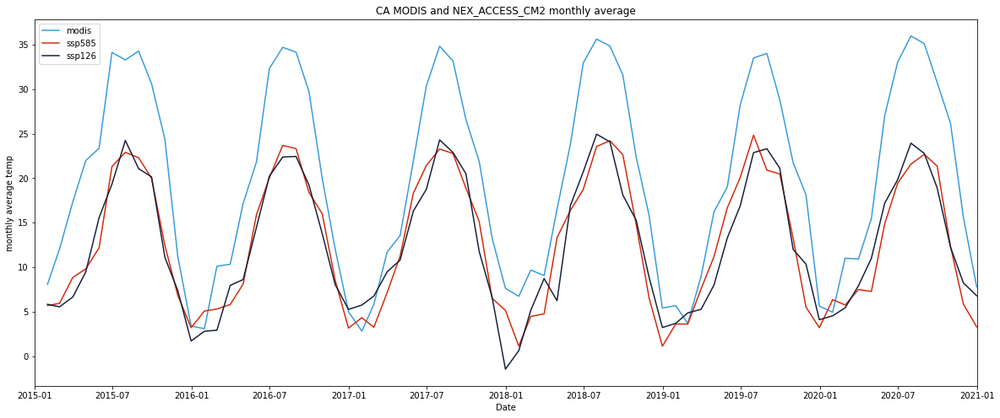

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(CA_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(CA_ssp585_ACCESS_CM2_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(CA_ssp126_ACCESS_CM2_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('CA MODIS and NEX_ACCESS_CM2 monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
#this model missing 2020-12 data
CA_ssp585_ACCESS_CM2_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp585_ACCESS_CM2_monthly_avg_temp)) 
CA_ssp585_ACCESS_CM2_monthly_rmse

8.349213533718812

In [ ]:
#calculate RMSE
#this model missing 2020-12 data
CA_ssp126_ACCESS_CM2_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp126_ACCESS_CM2_monthly_avg_temp)) 
CA_ssp126_ACCESS_CM2_monthly_rmse

8.49757747075989

#### time series analysis

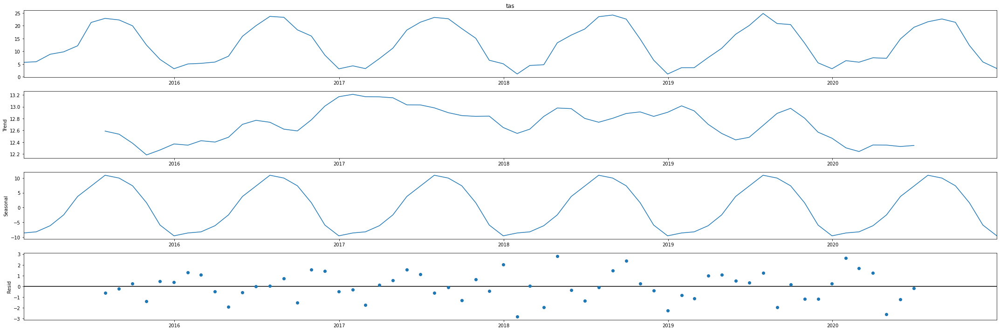

In [ ]:

CA_ssp585_ACCESS_CM2_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp585_ACCESS_CM2_monthly_avg_temp, model='additive')
fig = CA_ssp585_ACCESS_CM2_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

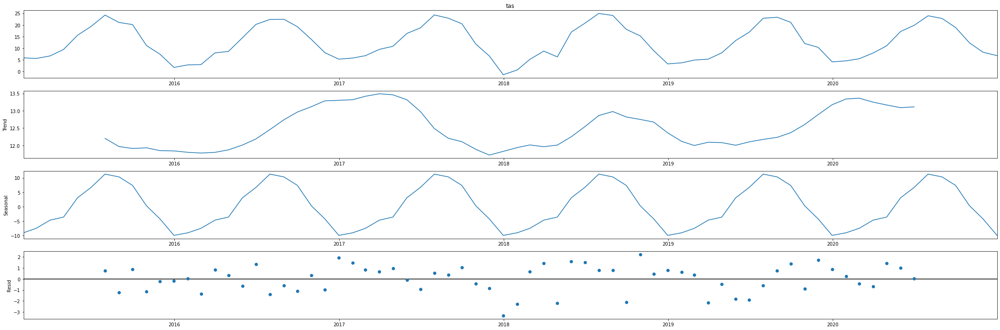

In [ ]:

CA_ssp126_ACCESS_CM2_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp126_ACCESS_CM2_monthly_avg_temp, model='additive')
fig = CA_ssp126_ACCESS_CM2_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

#### R square

In [ ]:
CA_ssp585_ACCESS_CM2_model = LinearRegression()
x = CA_ssp585_ACCESS_CM2_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
CA_ssp585_ACCESS_CM2_model.fit(x, y)
CA_ssp585_ACCESS_CM2_r_squared =CA_ssp585_ACCESS_CM2_model.score(x, y)
CA_ssp585_ACCESS_CM2_r_squared

0.9125476990784088

In [ ]:
CA_ssp126_ACCESS_CM2_model = LinearRegression()
x = CA_ssp126_ACCESS_CM2_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)


In [ ]:
CA_ssp126_ACCESS_CM2_model.fit(x, y)
CA_ssp126_ACCESS_CM2_r_squared = CA_ssp126_ACCESS_CM2_model.score(x, y)
CA_ssp126_ACCESS_CM2_r_squared

0.9097379154657825

#### seasonal analysis

In [ ]:
month = CA_ssp585_ACCESS_CM2_monthly_avg_temp.index.month
CA_ssp585_ACCESS_CM2_winter = pd.concat([CA_ssp585_ACCESS_CM2_monthly_avg_temp[month == 1], CA_ssp585_ACCESS_CM2_monthly_avg_temp[month == 2],CA_ssp585_ACCESS_CM2_monthly_avg_temp[month == 12]])
CA_ssp585_ACCESS_CM2_spring = pd.concat([CA_ssp585_ACCESS_CM2_monthly_avg_temp[month == 3], CA_ssp585_ACCESS_CM2_monthly_avg_temp[month == 4],CA_ssp585_ACCESS_CM2_monthly_avg_temp[month == 5]])
CA_ssp585_ACCESS_CM2_summer = pd.concat([CA_ssp585_ACCESS_CM2_monthly_avg_temp[month == 6], CA_ssp585_ACCESS_CM2_monthly_avg_temp[month == 7],CA_ssp585_ACCESS_CM2_monthly_avg_temp[month == 8]])
CA_ssp585_ACCESS_CM2_fall = pd.concat([CA_ssp585_ACCESS_CM2_monthly_avg_temp[month == 9], CA_ssp585_ACCESS_CM2_monthly_avg_temp[month == 10],CA_ssp585_ACCESS_CM2_monthly_avg_temp[month == 11]])
CA_ssp585_ACCESS_CM2_winter.sort_index()
CA_ssp585_ACCESS_CM2_spring.sort_index()
CA_ssp585_ACCESS_CM2_summer.sort_index()
CA_ssp585_ACCESS_CM2_fall.sort_index()

time
2015-09-30    19.982680
2015-10-31    12.439605
2015-11-30     6.826713
2016-09-30    18.405959
2016-10-31    15.980755
2016-11-30     8.519530
2017-09-30    18.891136
2017-10-31    15.119084
2017-11-30     6.505033
2018-09-30    22.619833
2018-10-31    14.818243
2018-11-30     6.549690
2019-09-30    20.472940
2019-10-31    13.255525
2019-11-30     5.499344
2020-09-30    21.351697
2020-10-31    12.332068
2020-11-30     5.844931
Name: tas, dtype: float64

In [ ]:
month = CA_ssp126_ACCESS_CM2_monthly_avg_temp.index.month
CA_ssp126_ACCESS_CM2_winter = pd.concat([CA_ssp126_ACCESS_CM2_monthly_avg_temp[month == 1], CA_ssp126_ACCESS_CM2_monthly_avg_temp[month == 2],CA_ssp126_ACCESS_CM2_monthly_avg_temp[month == 12]])
CA_ssp126_ACCESS_CM2_spring = pd.concat([CA_ssp126_ACCESS_CM2_monthly_avg_temp[month == 3], CA_ssp126_ACCESS_CM2_monthly_avg_temp[month == 4],CA_ssp126_ACCESS_CM2_monthly_avg_temp[month == 5]])
CA_ssp126_ACCESS_CM2_summer = pd.concat([CA_ssp126_ACCESS_CM2_monthly_avg_temp[month == 6], CA_ssp126_ACCESS_CM2_monthly_avg_temp[month == 7],CA_ssp126_ACCESS_CM2_monthly_avg_temp[month == 8]])
CA_ssp126_ACCESS_CM2_fall = pd.concat([CA_ssp126_ACCESS_CM2_monthly_avg_temp[month == 9], CA_ssp126_ACCESS_CM2_monthly_avg_temp[month == 10],CA_ssp126_ACCESS_CM2_monthly_avg_temp[month == 11]])
CA_ssp126_ACCESS_CM2_winter.sort_index()
CA_ssp126_ACCESS_CM2_spring.sort_index()
CA_ssp126_ACCESS_CM2_summer.sort_index()
CA_ssp126_ACCESS_CM2_fall.sort_index()

time
2015-09-30    20.140945
2015-10-31    11.103776
2015-11-30     7.364826
2016-09-30    19.232883
2016-10-31    13.748281
2016-11-30     8.045695
2017-09-30    20.501224
2017-10-31    11.755228
2017-11-30     6.619464
2018-09-30    18.101049
2018-10-31    15.275845
2018-11-30     8.878151
2019-09-30    21.117501
2019-10-31    11.999683
2019-11-30    10.335496
2020-09-30    18.895947
2020-10-31    12.255119
2020-11-30     8.222500
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = CA_ssp126_ACCESS_CM2_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.016345789030471236
coef:  [[0.16314861]]
intercept:  [5.90984804]


In [ ]:
x = CA_ssp126_ACCESS_CM2_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.6171085457382579
coef:  [[1.11409161]]
intercept:  [5.0148825]


In [ ]:
x = CA_ssp126_ACCESS_CM2_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.6494683368906085
coef:  [[0.6736645]]
intercept:  [18.79779703]


In [ ]:
x = CA_ssp126_ACCESS_CM2_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8210422116162022
coef:  [[1.23065803]]
intercept:  [5.60142964]


#####ssp585

In [ ]:
x = CA_ssp585_ACCESS_CM2_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.15320827130985615
coef:  [[0.71080221]]
intercept:  [3.67223245]


In [ ]:
x = CA_ssp585_ACCESS_CM2_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.6105517567677149
coef:  [[1.03566958]]
intercept:  [5.68518634]


In [ ]:
x = CA_ssp585_ACCESS_CM2_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.2408259829880245
coef:  [[0.53340493]]
intercept:  [21.81445703]


In [ ]:
x = CA_ssp585_ACCESS_CM2_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8190874402855308
coef:  [[1.04160823]]
intercept:  [8.05445181]


### CA_NEX_ACCESS-ESM1-5


#### ssp585

In [ ]:
#https://drive.google.com/file/d/1ZEmQ5sdIyxiRejN-Mlz0rgl-Cq3fSmna/view?usp=share_link
id = "1ZEmQ5sdIyxiRejN-Mlz0rgl-Cq3fSmna"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp585_ACCESS-ESM1-5.csv')

CA_ssp585_ACCESS_ESM1_5 = pd.read_csv('CA_ssp585_ACCESS-ESM1-5.csv', parse_dates=['time'], index_col='time')
CA_ssp585_ACCESS_ESM1_5.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,-120.125,3.468750
2015-01-01,1,36.375,-119.875,2.992371
2015-01-01,2,36.375,-119.625,2.960754
2015-01-01,3,36.375,-119.375,3.314087
2015-01-01,4,36.375,-119.125,4.192383


In [ ]:
CA_ssp585_ACCESS_ESM1_5

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,-120.125,3.468750
2015-01-01,1,36.375,-119.875,2.992371
2015-01-01,2,36.375,-119.625,2.960754
2015-01-01,3,36.375,-119.375,3.314087
2015-01-01,4,36.375,-119.125,4.192383
...,...,...,...,...
2020-12-31,341947,39.125,-118.125,0.790070
2020-12-31,341948,39.125,-117.875,1.102508
2020-12-31,341949,39.125,-117.625,0.331421


In [ ]:
CA_ssp585_ACCESS_ESM1_5['tas'].isnull().sum()

0

In [ ]:
CA_ssp585_ACCESS_ESM1_5_avg_temp = CA_ssp585_ACCESS_ESM1_5.groupby(CA_ssp585_ACCESS_ESM1_5.index)['tas'].mean()
CA_ssp585_ACCESS_ESM1_5_avg_temp

time
2015-01-01   -4.524040
2015-01-02   -1.077176
2015-01-03    3.960474
2015-01-04    1.873932
2015-01-05    2.397949
                ...   
2020-12-27    6.513630
2020-12-28    4.348793
2020-12-29    3.582774
2020-12-30    5.970868
2020-12-31    2.952231
Name: tas, Length: 2192, dtype: float64

In [ ]:
CA_ssp585_ACCESS_ESM1_5_monthly_avg_temp = CA_ssp585_ACCESS_ESM1_5_avg_temp.resample('M').mean()
CA_ssp585_ACCESS_ESM1_5_monthly_avg_temp

time
2015-01-31     3.209248
2015-02-28     5.234393
2015-03-31     6.892905
2015-04-30    11.318531
2015-05-31    13.539148
                ...    
2020-08-31    23.544381
2020-09-30    16.476894
2020-10-31    10.497541
2020-11-30     5.410363
2020-12-31     2.229408
Freq: M, Name: tas, Length: 72, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/196rXaNWPBxel5GyQNI9fhLiDNZuJexgu/view?usp=share_link
id = "196rXaNWPBxel5GyQNI9fhLiDNZuJexgu"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_SSP126_ACCESS-ESM1-5.csv')

CA_ssp126_ACCESS_ESM1_5 = pd.read_csv('CA_SSP126_ACCESS-ESM1-5.csv', parse_dates=['time'], index_col='time')
CA_ssp126_ACCESS_ESM1_5.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,39.125,-120.125,-7.822998
2015-01-01,1,39.125,-119.875,-7.651794
2015-01-01,2,39.125,-119.625,-6.662781
2015-01-01,3,39.125,-119.375,-7.453919
2015-01-01,4,39.125,-119.125,-5.345367


In [ ]:
CA_ssp126_ACCESS_ESM1_5['tas'].isnull().sum()

0

In [ ]:
CA_ssp126_ACCESS_ESM1_5_avg_temp = CA_ssp126_ACCESS_ESM1_5.groupby(CA_ssp126_ACCESS_ESM1_5.index)['tas'].mean()
CA_ssp126_ACCESS_ESM1_5_avg_temp

time
2015-01-01   -4.499378
2015-01-02   -0.959653
2015-01-03    3.972252
2015-01-04    2.059964
2015-01-05    2.744071
                ...   
2020-12-27    2.597524
2020-12-28    0.710981
2020-12-29    2.484326
2020-12-30    4.364168
2020-12-31    5.060898
Name: tas, Length: 2192, dtype: float64

In [ ]:
CA_ssp126_ACCESS_ESM1_5_monthly_avg_temp = CA_ssp126_ACCESS_ESM1_5_avg_temp.resample('M').mean()
CA_ssp126_ACCESS_ESM1_5_monthly_avg_temp 

time
2015-01-31     3.780520
2015-02-28     8.600421
2015-03-31     6.973832
2015-04-30    13.621104
2015-05-31    16.948657
                ...    
2020-08-31    20.739831
2020-09-30    15.199377
2020-10-31    14.041133
2020-11-30     6.915740
2020-12-31     3.376441
Freq: M, Name: tas, Length: 72, dtype: float64

#### compare modis with ssp585 and ssp126

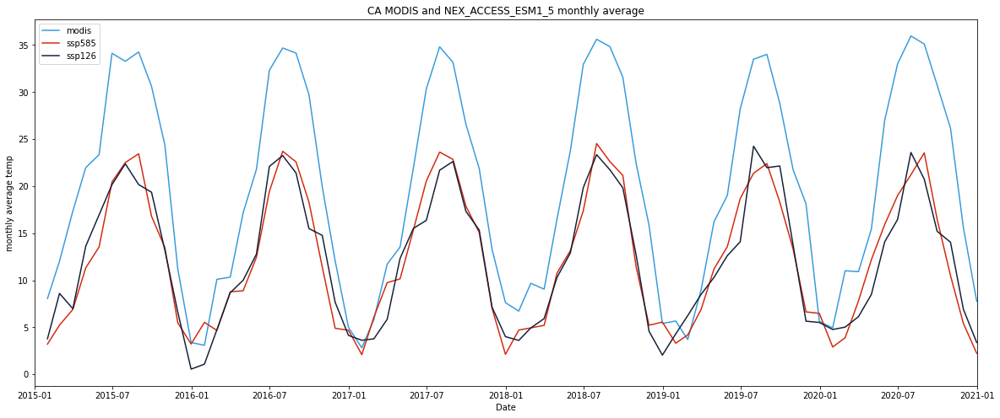

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(CA_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(CA_ssp585_ACCESS_ESM1_5_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(CA_ssp126_ACCESS_ESM1_5_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('CA MODIS and NEX_ACCESS_ESM1_5 monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
#this model missing 2020-12 data
CA_ssp585_ACCESS_ESM1_5_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp585_ACCESS_ESM1_5_monthly_avg_temp)) 
CA_ssp585_ACCESS_ESM1_5_monthly_rmse

8.915308210850178

In [ ]:
#calculate RMSE
#this model missing 2020-12 data
CA_ssp126_ACCESS_ESM1_5_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp126_ACCESS_ESM1_5_monthly_avg_temp)) 
CA_ssp126_ACCESS_ESM1_5_monthly_rmse

8.998821706292059

#### time series analysis

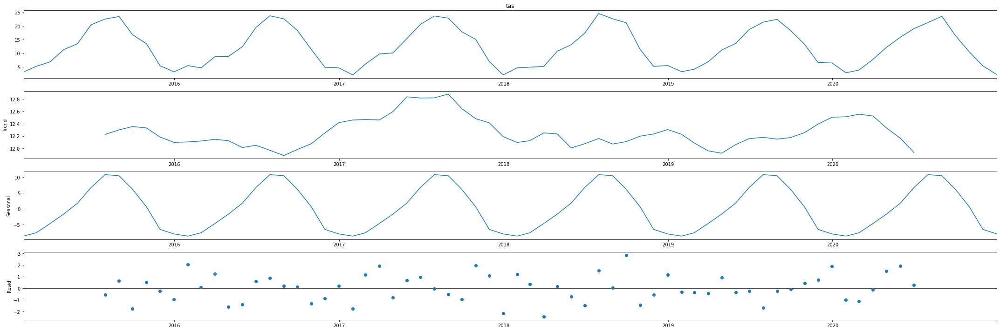

In [ ]:

CA_ssp585_ACCESS_ESM1_5_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp585_ACCESS_ESM1_5_monthly_avg_temp, model='additive')
fig = CA_ssp585_ACCESS_ESM1_5_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

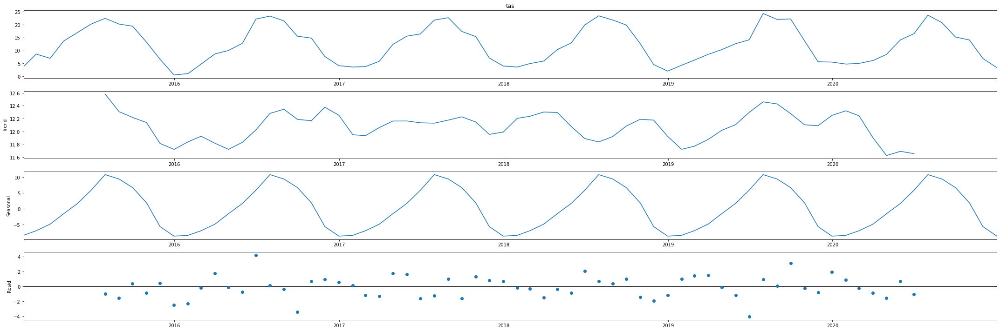

In [ ]:

CA_ssp126_ACCESS_ESM1_5_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp126_ACCESS_ESM1_5_monthly_avg_temp, model='additive')
fig = CA_ssp126_ACCESS_ESM1_5_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

#### R square

In [ ]:
CA_ssp585_ACCESS_ESM1_5_model = LinearRegression()
x = CA_ssp585_ACCESS_ESM1_5_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
CA_ssp585_ACCESS_ESM1_5_model.fit(x, y)
CA_ssp585_ACCESS_ESM1_5_r_squared =CA_ssp585_ACCESS_ESM1_5_model.score(x, y)
CA_ssp585_ACCESS_ESM1_5_r_squared

0.9098458269745436

In [ ]:
CA_ssp126_ACCESS_ESM1_5_model = LinearRegression()
x = CA_ssp126_ACCESS_ESM1_5_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)


In [ ]:
CA_ssp126_ACCESS_ESM1_5_model.fit(x, y)
CA_ssp126_ACCESS_ESM1_5_r_squared = CA_ssp126_ACCESS_ESM1_5_model.score(x, y)
CA_ssp126_ACCESS_ESM1_5_r_squared

0.9101986399814912

#### seasonal analysis

In [ ]:
month = CA_ssp585_ACCESS_ESM1_5_monthly_avg_temp.index.month
CA_ssp585_ACCESS_ESM1_5_winter = pd.concat([CA_ssp585_ACCESS_ESM1_5_monthly_avg_temp[month == 1], CA_ssp585_ACCESS_ESM1_5_monthly_avg_temp[month == 2],CA_ssp585_ACCESS_ESM1_5_monthly_avg_temp[month == 12]])
CA_ssp585_ACCESS_ESM1_5_spring = pd.concat([CA_ssp585_ACCESS_ESM1_5_monthly_avg_temp[month == 3], CA_ssp585_ACCESS_ESM1_5_monthly_avg_temp[month == 4],CA_ssp585_ACCESS_ESM1_5_monthly_avg_temp[month == 5]])
CA_ssp585_ACCESS_ESM1_5_summer = pd.concat([CA_ssp585_ACCESS_ESM1_5_monthly_avg_temp[month == 6], CA_ssp585_ACCESS_ESM1_5_monthly_avg_temp[month == 7],CA_ssp585_ACCESS_ESM1_5_monthly_avg_temp[month == 8]])
CA_ssp585_ACCESS_ESM1_5_fall = pd.concat([CA_ssp585_ACCESS_ESM1_5_monthly_avg_temp[month == 9], CA_ssp585_ACCESS_ESM1_5_monthly_avg_temp[month == 10],CA_ssp585_ACCESS_ESM1_5_monthly_avg_temp[month == 11]])
CA_ssp585_ACCESS_ESM1_5_winter.sort_index()
CA_ssp585_ACCESS_ESM1_5_spring.sort_index()
CA_ssp585_ACCESS_ESM1_5_summer.sort_index()
CA_ssp585_ACCESS_ESM1_5_fall.sort_index()

time
2015-09-30    16.793122
2015-10-31    13.475848
2015-11-30     5.475333
2016-09-30    18.314150
2016-10-31    11.410347
2016-11-30     4.893839
2017-09-30    17.883101
2017-10-31    15.072247
2017-11-30     7.001138
2018-09-30    21.147674
2018-10-31    11.405866
2018-11-30     5.214315
2019-09-30    18.307774
2019-10-31    13.318603
2019-11-30     6.636142
2020-09-30    16.476894
2020-10-31    10.497541
2020-11-30     5.410363
Name: tas, dtype: float64

In [ ]:
month = CA_ssp126_ACCESS_ESM1_5_monthly_avg_temp.index.month
CA_ssp126_ACCESS_ESM1_5_winter = pd.concat([CA_ssp126_ACCESS_ESM1_5_monthly_avg_temp[month == 1], CA_ssp126_ACCESS_ESM1_5_monthly_avg_temp[month == 2],CA_ssp126_ACCESS_ESM1_5_monthly_avg_temp[month == 12]])
CA_ssp126_ACCESS_ESM1_5_spring = pd.concat([CA_ssp126_ACCESS_ESM1_5_monthly_avg_temp[month == 3], CA_ssp126_ACCESS_ESM1_5_monthly_avg_temp[month == 4],CA_ssp126_ACCESS_ESM1_5_monthly_avg_temp[month == 5]])
CA_ssp126_ACCESS_ESM1_5_summer = pd.concat([CA_ssp126_ACCESS_ESM1_5_monthly_avg_temp[month == 6], CA_ssp126_ACCESS_ESM1_5_monthly_avg_temp[month == 7],CA_ssp126_ACCESS_ESM1_5_monthly_avg_temp[month == 8]])
CA_ssp126_ACCESS_ESM1_5_fall = pd.concat([CA_ssp126_ACCESS_ESM1_5_monthly_avg_temp[month == 9], CA_ssp126_ACCESS_ESM1_5_monthly_avg_temp[month == 10],CA_ssp126_ACCESS_ESM1_5_monthly_avg_temp[month == 11]])
CA_ssp126_ACCESS_ESM1_5_winter.sort_index()
CA_ssp126_ACCESS_ESM1_5_spring.sort_index()
CA_ssp126_ACCESS_ESM1_5_summer.sort_index()
CA_ssp126_ACCESS_ESM1_5_fall.sort_index()

time
2015-09-30    19.351189
2015-10-31    13.184837
2015-11-30     6.611259
2016-09-30    15.493080
2016-10-31    14.771576
2016-11-30     7.660980
2017-09-30    17.330907
2017-10-31    15.335668
2017-11-30     7.120578
2018-09-30    19.820926
2018-10-31    12.673343
2018-11-30     4.572812
2019-09-30    22.144269
2019-10-31    13.733223
2019-11-30     5.648593
2020-09-30    15.199377
2020-10-31    14.041133
2020-11-30     6.915740
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = CA_ssp126_ACCESS_ESM1_5_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.333689076112491
coef:  [[0.87613776]]
intercept:  [2.97021919]


In [ ]:
x = CA_ssp126_ACCESS_ESM1_5_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.6794606716584364
coef:  [[1.34593664]]
intercept:  [2.65453742]


In [ ]:
x = CA_ssp126_ACCESS_ESM1_5_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.5890865745844828
coef:  [[0.52347383]]
intercept:  [22.63482782]


In [ ]:
x = CA_ssp126_ACCESS_ESM1_5_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.7677117927472441
coef:  [[1.12284067]]
intercept:  [7.80808971]


#####ssp585

In [ ]:
x = CA_ssp585_ACCESS_ESM1_5_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.008245686370786709
coef:  [[0.18368024]]
intercept:  [5.8098285]


In [ ]:
x = CA_ssp585_ACCESS_ESM1_5_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.6982630718082511
coef:  [[1.53401248]]
intercept:  [0.48908836]


In [ ]:
x = CA_ssp585_ACCESS_ESM1_5_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.40224454835496815
coef:  [[0.58664761]]
intercept:  [20.86740905]


In [ ]:
x = CA_ssp585_ACCESS_ESM1_5_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8525646081585265
coef:  [[1.16286039]]
intercept:  [8.12492876]


### CA_NEX_CNRM-CM6-1


#### ssp585

In [ ]:
#https://drive.google.com/file/d/1yEpwS2DhVooY-BxVPiMk3k1nTxT5G2ko/view?usp=share_link
id = "1yEpwS2DhVooY-BxVPiMk3k1nTxT5G2ko"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp585_CNRM-CM6-1.csv')

CA_ssp585_CNRM_CM6_1 = pd.read_csv('CA_ssp585_CNRM-CM6-1.csv', parse_dates=['time'], index_col='time')
CA_ssp585_CNRM_CM6_1.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,-120.125,12.680359
2015-01-01,1,36.375,-119.875,12.316071
2015-01-01,2,36.375,-119.625,12.305176
2015-01-01,3,36.375,-119.375,12.767548
2015-01-01,4,36.375,-119.125,13.807861


In [ ]:
CA_ssp585_CNRM_CM6_1

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,-120.125,12.680359
2015-01-01,1,36.375,-119.875,12.316071
2015-01-01,2,36.375,-119.625,12.305176
2015-01-01,3,36.375,-119.375,12.767548
2015-01-01,4,36.375,-119.125,13.807861
...,...,...,...,...
2020-12-31,341947,39.125,-118.125,10.209442
2020-12-31,341948,39.125,-117.875,9.877747
2020-12-31,341949,39.125,-117.625,8.462524


In [ ]:
CA_ssp585_CNRM_CM6_1['tas'].isnull().sum()

0

In [ ]:
CA_ssp585_CNRM_CM6_1_avg_temp = CA_ssp585_ACCESS_ESM1_5.groupby(CA_ssp585_CNRM_CM6_1.index)['tas'].mean()
CA_ssp585_CNRM_CM6_1_avg_temp

time
2015-01-01   -4.524040
2015-01-02   -1.077176
2015-01-03    3.960474
2015-01-04    1.873932
2015-01-05    2.397949
                ...   
2020-12-27    6.513630
2020-12-28    4.348793
2020-12-29    3.582774
2020-12-30    5.970868
2020-12-31    2.952231
Name: tas, Length: 2192, dtype: float64

In [ ]:
CA_ssp585_CNRM_CM6_1_monthly_avg_temp = CA_ssp585_CNRM_CM6_1_avg_temp.resample('M').mean()
CA_ssp585_CNRM_CM6_1_monthly_avg_temp

time
2015-01-31     3.209248
2015-02-28     5.234393
2015-03-31     6.892905
2015-04-30    11.318531
2015-05-31    13.539148
                ...    
2020-08-31    23.544381
2020-09-30    16.476894
2020-10-31    10.497541
2020-11-30     5.410363
2020-12-31     2.229408
Freq: M, Name: tas, Length: 72, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/1fGdOf7Lk3CXibUE2e4dVvymRcCwGLfOd/view?usp=share_link
id = "1fGdOf7Lk3CXibUE2e4dVvymRcCwGLfOd"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_SSP126_CNRM-CM6-1.csv')

CA_ssp126_CNRM_CM6_1 = pd.read_csv('CA_SSP126_CNRM-CM6-1.csv', parse_dates=['time'], index_col='time')
CA_ssp126_CNRM_CM6_1.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,39.125,-120.125,6.293182
2015-01-01,1,39.125,-119.875,6.943543
2015-01-01,2,39.125,-119.625,8.211365
2015-01-01,3,39.125,-119.375,7.721558
2015-01-01,4,39.125,-119.125,10.145020


In [ ]:
CA_ssp126_CNRM_CM6_1['tas'].isnull().sum()

0

In [ ]:
CA_ssp126_CNRM_CM6_1_avg_temp = CA_ssp126_CNRM_CM6_1.groupby(CA_ssp126_CNRM_CM6_1.index)['tas'].mean()
CA_ssp126_CNRM_CM6_1_avg_temp

time
2015-01-01     8.744683
2015-01-02     8.069624
2015-01-03    10.869292
2015-01-04     9.023774
2015-01-05     7.460680
                ...    
2020-12-27     9.040458
2020-12-28    11.050204
2020-12-29     9.737259
2020-12-30    10.090557
2020-12-31     8.470637
Name: tas, Length: 2192, dtype: float64

In [ ]:
CA_ssp126_CNRM_CM6_1_monthly_avg_temp = CA_ssp126_CNRM_CM6_1_avg_temp.resample('M').mean()
CA_ssp126_CNRM_CM6_1_monthly_avg_temp 

time
2015-01-31     4.967873
2015-02-28     5.468211
2015-03-31     5.119233
2015-04-30     6.035066
2015-05-31    15.295967
                ...    
2020-08-31    22.095520
2020-09-30    22.765497
2020-10-31    17.804954
2020-11-30     6.172158
2020-12-31     7.897327
Freq: M, Name: tas, Length: 72, dtype: float64

#### compare modis with ssp585 and ssp126

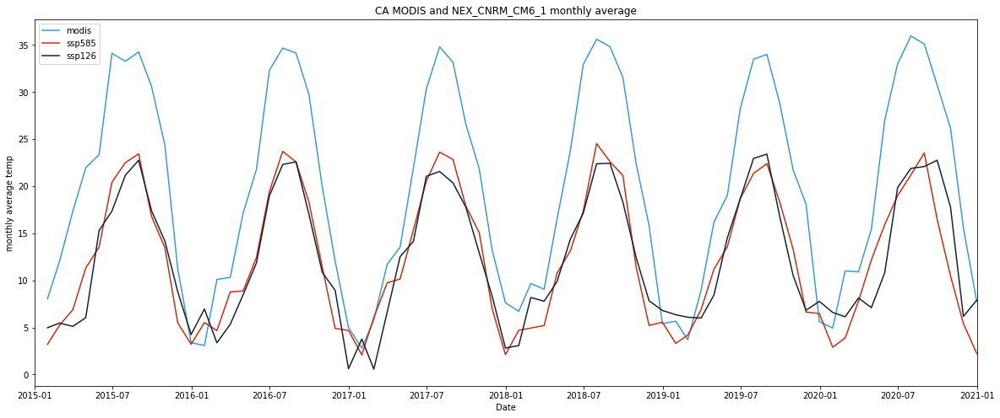

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(CA_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(CA_ssp585_CNRM_CM6_1_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(CA_ssp126_CNRM_CM6_1_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('CA MODIS and NEX_CNRM_CM6_1 monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
#this model missing 2020-12 data
CA_ssp585_CNRM_CM6_1_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp585_CNRM_CM6_1_monthly_avg_temp)) 
CA_ssp585_CNRM_CM6_1_monthly_rmse

8.915308210850178

In [ ]:
#calculate RMSE
#this model missing 2020-12 data
CA_ssp126_CNRM_CM6_1_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp126_CNRM_CM6_1_monthly_avg_temp)) 
CA_ssp126_CNRM_CM6_1_monthly_rmse

9.218251101507088

#### time series analysis

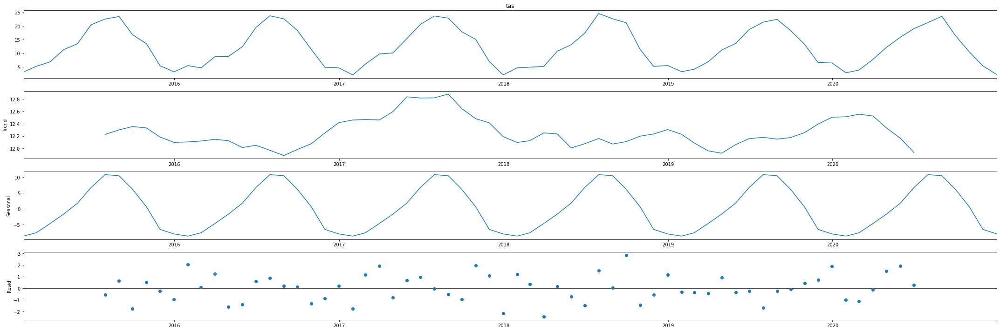

In [ ]:

CA_ssp585_CNRM_CM6_1_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp585_CNRM_CM6_1_monthly_avg_temp, model='additive')
fig = CA_ssp585_CNRM_CM6_1_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

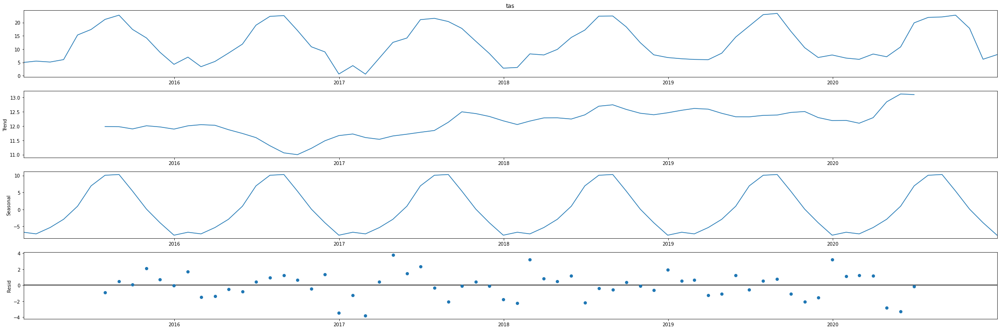

In [ ]:

CA_ssp126_CNRM_CM6_1_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp126_CNRM_CM6_1_monthly_avg_temp, model='additive')
fig = CA_ssp126_CNRM_CM6_1_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

#### R square

In [ ]:
CA_ssp585_CNRM_CM6_1_model = LinearRegression()
x = CA_ssp585_CNRM_CM6_1_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
CA_ssp585_CNRM_CM6_1_model.fit(x, y)
CA_ssp585_CNRM_CM6_1_r_squared =CA_ssp585_CNRM_CM6_1_model.score(x, y)
CA_ssp585_CNRM_CM6_1_r_squared

0.9098458269745436

In [ ]:
CA_ssp126_CNRM_CM6_1_model = LinearRegression()
x = CA_ssp126_CNRM_CM6_1_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)


In [ ]:
CA_ssp126_CNRM_CM6_1_model.fit(x, y)
CA_ssp126_CNRM_CM6_1_r_squared = CA_ssp126_CNRM_CM6_1_model.score(x, y)
CA_ssp126_CNRM_CM6_1_r_squared

0.8641585891709811

#### seasonal analysis

In [ ]:
month = CA_ssp585_CNRM_CM6_1_monthly_avg_temp.index.month
CA_ssp585_CNRM_CM6_1_winter = pd.concat([CA_ssp585_CNRM_CM6_1_monthly_avg_temp[month == 1], CA_ssp585_CNRM_CM6_1_monthly_avg_temp[month == 2],CA_ssp585_CNRM_CM6_1_monthly_avg_temp[month == 12]])
CA_ssp585_CNRM_CM6_1_spring = pd.concat([CA_ssp585_CNRM_CM6_1_monthly_avg_temp[month == 3], CA_ssp585_CNRM_CM6_1_monthly_avg_temp[month == 4],CA_ssp585_CNRM_CM6_1_monthly_avg_temp[month == 5]])
CA_ssp585_CNRM_CM6_1_summer = pd.concat([CA_ssp585_CNRM_CM6_1_monthly_avg_temp[month == 6], CA_ssp585_CNRM_CM6_1_monthly_avg_temp[month == 7],CA_ssp585_CNRM_CM6_1_monthly_avg_temp[month == 8]])
CA_ssp585_CNRM_CM6_1_fall = pd.concat([CA_ssp585_CNRM_CM6_1_monthly_avg_temp[month == 9], CA_ssp585_CNRM_CM6_1_monthly_avg_temp[month == 10],CA_ssp585_CNRM_CM6_1_monthly_avg_temp[month == 11]])
CA_ssp585_CNRM_CM6_1_winter.sort_index()
CA_ssp585_CNRM_CM6_1_spring.sort_index()
CA_ssp585_CNRM_CM6_1_summer.sort_index()
CA_ssp585_CNRM_CM6_1_fall.sort_index()

time
2015-09-30    16.793122
2015-10-31    13.475848
2015-11-30     5.475333
2016-09-30    18.314150
2016-10-31    11.410347
2016-11-30     4.893839
2017-09-30    17.883101
2017-10-31    15.072247
2017-11-30     7.001138
2018-09-30    21.147674
2018-10-31    11.405866
2018-11-30     5.214315
2019-09-30    18.307774
2019-10-31    13.318603
2019-11-30     6.636142
2020-09-30    16.476894
2020-10-31    10.497541
2020-11-30     5.410363
Name: tas, dtype: float64

In [ ]:
month = CA_ssp126_CNRM_CM6_1_monthly_avg_temp.index.month
CA_ssp126_CNRM_CM6_1_winter = pd.concat([CA_ssp126_CNRM_CM6_1_monthly_avg_temp[month == 1], CA_ssp126_CNRM_CM6_1_monthly_avg_temp[month == 2],CA_ssp126_CNRM_CM6_1_monthly_avg_temp[month == 12]])
CA_ssp126_CNRM_CM6_1_spring = pd.concat([CA_ssp126_CNRM_CM6_1_monthly_avg_temp[month == 3], CA_ssp126_CNRM_CM6_1_monthly_avg_temp[month == 4],CA_ssp126_CNRM_CM6_1_monthly_avg_temp[month == 5]])
CA_ssp126_CNRM_CM6_1_summer = pd.concat([CA_ssp126_CNRM_CM6_1_monthly_avg_temp[month == 6], CA_ssp126_CNRM_CM6_1_monthly_avg_temp[month == 7],CA_ssp126_CNRM_CM6_1_monthly_avg_temp[month == 8]])
CA_ssp126_CNRM_CM6_1_fall = pd.concat([CA_ssp126_CNRM_CM6_1_monthly_avg_temp[month == 9], CA_ssp126_CNRM_CM6_1_monthly_avg_temp[month == 10],CA_ssp126_CNRM_CM6_1_monthly_avg_temp[month == 11]])
CA_ssp126_CNRM_CM6_1_winter.sort_index()
CA_ssp126_CNRM_CM6_1_spring.sort_index()
CA_ssp126_CNRM_CM6_1_summer.sort_index()
CA_ssp126_CNRM_CM6_1_fall.sort_index()

time
2015-09-30    17.395311
2015-10-31    14.178965
2015-11-30     8.787690
2016-09-30    17.025497
2016-10-31    10.854970
2016-11-30     8.938576
2017-09-30    17.772503
2017-10-31    12.932952
2017-11-30     8.341269
2018-09-30    18.345648
2018-10-31    12.425361
2018-11-30     7.836768
2019-09-30    16.766313
2019-10-31    10.522358
2019-11-30     6.828564
2020-09-30    22.765497
2020-10-31    17.804954
2020-11-30     6.172158
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = CA_ssp126_CNRM_CM6_1_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.010639607896487324
coef:  [[0.12232347]]
intercept:  [5.95185021]


In [ ]:
x = CA_ssp126_CNRM_CM6_1_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.36668532193198067
coef:  [[0.96668502]]
intercept:  [7.74137374]


In [ ]:
x = CA_ssp126_CNRM_CM6_1_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.23797145657608276
coef:  [[0.47599541]]
intercept:  [23.55034598]


In [ ]:
x = CA_ssp126_CNRM_CM6_1_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8221306881146463
coef:  [[1.26932533]]
intercept:  [5.63511604]


#####ssp585

In [ ]:
x = CA_ssp585_CNRM_CM6_1_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.008245686370786709
coef:  [[0.18368024]]
intercept:  [5.8098285]


In [ ]:
x = CA_ssp585_CNRM_CM6_1_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.6982630718082511
coef:  [[1.53401248]]
intercept:  [0.48908836]


In [ ]:
x = CA_ssp585_CNRM_CM6_1_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.40224454835496815
coef:  [[0.58664761]]
intercept:  [20.86740905]


In [ ]:
x = CA_ssp585_CNRM_CM6_1_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8525646081585265
coef:  [[1.16286039]]
intercept:  [8.12492876]


### CA_NEX_CNRM-ESM2-1


#### ssp585

In [ ]:
#https://drive.google.com/file/d/1hRuI4h0rci-Tgb51n1EgOelXTs4cgxt5/view?usp=share_link
id = "1hRuI4h0rci-Tgb51n1EgOelXTs4cgxt5"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp585_CNRM-ESM2-1.csv')

CA_ssp585_CNRM_ESM2_1 = pd.read_csv('CA_ssp585_CNRM-ESM2-1.csv', parse_dates=['time'], index_col='time')
CA_ssp585_CNRM_ESM2_1.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,-120.125,9.019470
2015-01-01,1,36.375,-119.875,8.623901
2015-01-01,2,36.375,-119.625,8.581757
2015-01-01,3,36.375,-119.375,9.043976
2015-01-01,4,36.375,-119.125,10.102783


In [ ]:
CA_ssp585_CNRM_ESM2_1

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,-120.125,9.019470
2015-01-01,1,36.375,-119.875,8.623901
2015-01-01,2,36.375,-119.625,8.581757
2015-01-01,3,36.375,-119.375,9.043976
2015-01-01,4,36.375,-119.125,10.102783
...,...,...,...,...
2020-12-31,341947,39.125,-118.125,7.769562
2020-12-31,341948,39.125,-117.875,7.479004
2020-12-31,341949,39.125,-117.625,6.104919


In [ ]:
CA_ssp585_CNRM_ESM2_1['tas'].isnull().sum()

0

In [ ]:
CA_ssp585_CNRM_ESM2_1_avg_temp = CA_ssp585_CNRM_ESM2_1.groupby(CA_ssp585_CNRM_ESM2_1.index)['tas'].mean()
CA_ssp585_CNRM_ESM2_1_avg_temp

time
2015-01-01    3.784755
2015-01-02    3.722296
2015-01-03    7.672398
2015-01-04    5.107945
2015-01-05    5.745891
                ...   
2020-12-27    7.025072
2020-12-28    6.151770
2020-12-29    8.823271
2020-12-30    8.559993
2020-12-31    9.431105
Name: tas, Length: 2192, dtype: float64

In [ ]:
CA_ssp585_CNRM_ESM2_1_monthly_avg_temp = CA_ssp585_CNRM_ESM2_1_avg_temp.resample('M').mean()
CA_ssp585_CNRM_ESM2_1_monthly_avg_temp

time
2015-01-31     4.278739
2015-02-28     6.850343
2015-03-31     3.591264
2015-04-30     7.028173
2015-05-31    15.380162
                ...    
2020-08-31    23.190922
2020-09-30    18.951075
2020-10-31    15.504720
2020-11-30     5.586157
2020-12-31     2.363369
Freq: M, Name: tas, Length: 72, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/1vRvjsrbVcL33AlNnek8PrtPFBXlvbHyt/view?usp=share_link
id = "1vRvjsrbVcL33AlNnek8PrtPFBXlvbHyt"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp126_CNRM-ESM2-1.csv')

CA_ssp126_CNRM_ESM2_1 = pd.read_csv('CA_ssp126_CNRM-ESM2-1.csv', parse_dates=['time'], index_col='time')
CA_ssp126_CNRM_ESM2_1.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,39.125,-120.125,1.331787
2015-01-01,1,39.125,-119.875,1.759766
2015-01-01,2,39.125,-119.625,2.805145
2015-01-01,3,39.125,-119.375,2.022430
2015-01-01,4,39.125,-119.125,4.110657


In [ ]:
CA_ssp126_CNRM_ESM2_1['tas'].isnull().sum()

0

In [ ]:
CA_ssp126_CNRM_ESM2_1_avg_temp = CA_ssp126_CNRM_ESM2_1.groupby(CA_ssp126_CNRM_ESM2_1.index)['tas'].mean()
CA_ssp126_CNRM_ESM2_1_avg_temp

time
2015-01-01    3.941992
2015-01-02    3.944375
2015-01-03    6.729842
2015-01-04    4.495939
2015-01-05    5.333415
                ...   
2020-12-27    4.719566
2020-12-28    5.239462
2020-12-29    7.411915
2020-12-30    7.865824
2020-12-31    5.632810
Name: tas, Length: 2192, dtype: float64

In [ ]:
CA_ssp126_CNRM_ESM2_1_monthly_avg_temp = CA_ssp126_CNRM_ESM2_1_avg_temp.resample('M').mean()
CA_ssp126_CNRM_ESM2_1_monthly_avg_temp 

time
2015-01-31     5.160812
2015-02-28     8.128055
2015-03-31     6.233268
2015-04-30     5.688306
2015-05-31    13.497119
                ...    
2020-08-31    20.293443
2020-09-30    19.070499
2020-10-31    16.188311
2020-11-30     8.281764
2020-12-31     4.656507
Freq: M, Name: tas, Length: 72, dtype: float64

#### compare modis with ssp585 and ssp126

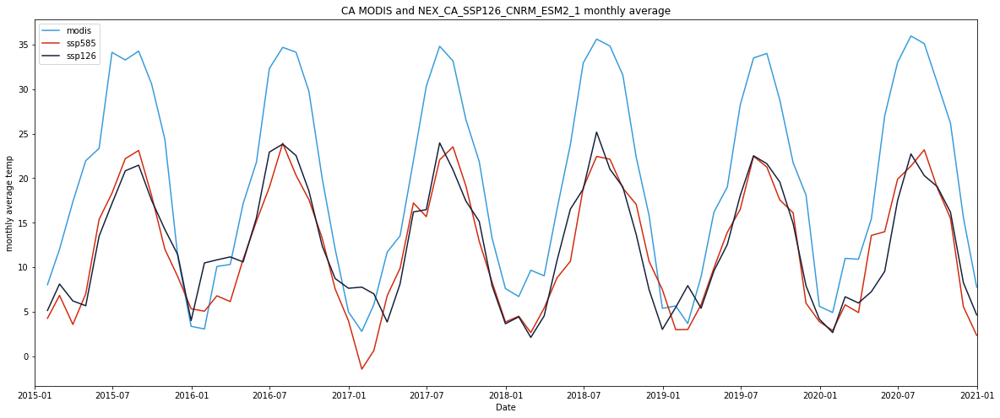

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(CA_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(CA_ssp585_CNRM_ESM2_1_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(CA_ssp126_CNRM_ESM2_1_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('CA MODIS and NEX_CA_SSP126_CNRM_ESM2_1 monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
#this model missing 2020-12 data
CA_ssp585_CNRM_ESM2_1_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp585_CNRM_ESM2_1_monthly_avg_temp)) 
CA_ssp585_CNRM_ESM2_1_monthly_rmse

9.05500809407523

In [ ]:
#calculate RMSE
#this model missing 2020-12 data
CA_ssp126_CNRM_ESM2_1_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp126_CNRM_ESM2_1_monthly_avg_temp)) 
CA_ssp126_CNRM_ESM2_1_monthly_rmse

9.059530703786697

#### time series analysis

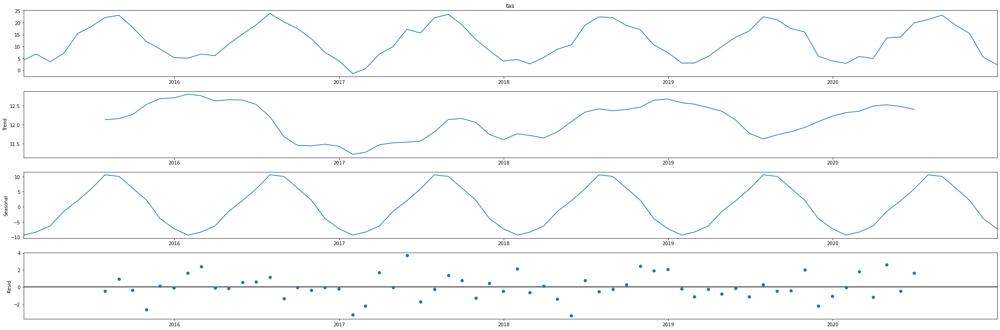

In [ ]:

CA_ssp585_CNRM_ESM2_1_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp585_CNRM_ESM2_1_monthly_avg_temp, model='additive')
fig = CA_ssp585_CNRM_ESM2_1_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

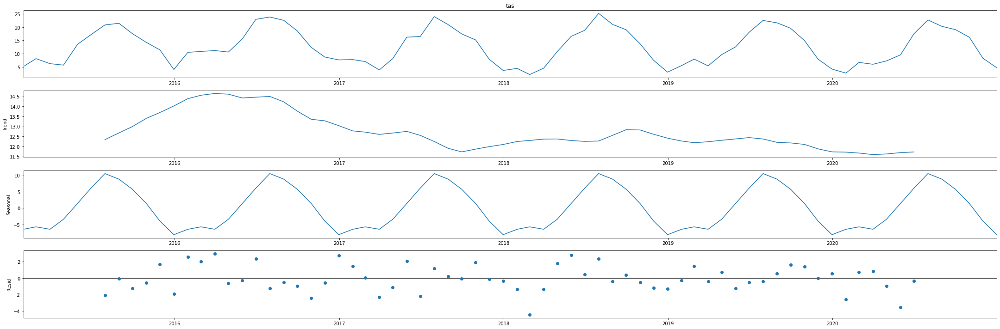

In [ ]:

CA_ssp126_CNRM_ESM2_1_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp126_CNRM_ESM2_1_monthly_avg_temp, model='additive')
fig = CA_ssp126_CNRM_ESM2_1_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

#### R square

In [ ]:
CA_ssp585_CNRM_ESM2_1_model = LinearRegression()
x = CA_ssp585_CNRM_ESM2_1_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
CA_ssp585_CNRM_ESM2_1_model.fit(x, y)
CA_ssp585_CNRM_ESM2_1_r_squared =CA_ssp585_CNRM_ESM2_1_model.score(x, y)
CA_ssp585_CNRM_ESM2_1_r_squared

0.8946376038235981

In [ ]:
CA_ssp126_CNRM_ESM2_1_model = LinearRegression()
x = CA_ssp126_CNRM_ESM2_1_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)


In [ ]:
CA_ssp126_CNRM_ESM2_1_model.fit(x, y)
CA_ssp126_CNRM_ESM2_1_r_squared = CA_ssp126_CNRM_ESM2_1_model.score(x, y)
CA_ssp126_CNRM_ESM2_1_r_squared

0.8386770363324076

#### seasonal analysis

In [ ]:
month = CA_ssp585_CNRM_ESM2_1_monthly_avg_temp.index.month
CA_ssp585_CNRM_ESM2_1_winter = pd.concat([CA_ssp585_CNRM_ESM2_1_monthly_avg_temp[month == 1], CA_ssp585_CNRM_ESM2_1_monthly_avg_temp[month == 2],CA_ssp585_CNRM_ESM2_1_monthly_avg_temp[month == 12]])
CA_ssp585_CNRM_ESM2_1_spring = pd.concat([CA_ssp585_CNRM_ESM2_1_monthly_avg_temp[month == 3], CA_ssp585_CNRM_ESM2_1_monthly_avg_temp[month == 4],CA_ssp585_CNRM_ESM2_1_monthly_avg_temp[month == 5]])
CA_ssp585_CNRM_ESM2_1_summer = pd.concat([CA_ssp585_CNRM_ESM2_1_monthly_avg_temp[month == 6], CA_ssp585_CNRM_ESM2_1_monthly_avg_temp[month == 7],CA_ssp585_CNRM_ESM2_1_monthly_avg_temp[month == 8]])
CA_ssp585_CNRM_ESM2_1_fall = pd.concat([CA_ssp585_CNRM_ESM2_1_monthly_avg_temp[month == 9], CA_ssp585_CNRM_ESM2_1_monthly_avg_temp[month == 10],CA_ssp585_CNRM_ESM2_1_monthly_avg_temp[month == 11]])
CA_ssp585_CNRM_ESM2_1_winter.sort_index()
CA_ssp585_CNRM_ESM2_1_spring.sort_index()
CA_ssp585_CNRM_ESM2_1_summer.sort_index()
CA_ssp585_CNRM_ESM2_1_fall.sort_index()

time
2015-09-30    18.079483
2015-10-31    12.035278
2015-11-30     8.945244
2016-09-30    17.591853
2016-10-31    13.248472
2016-11-30     7.574195
2017-09-30    19.137427
2017-10-31    12.930265
2017-11-30     8.324676
2018-09-30    18.893225
2018-10-31    17.076548
2018-11-30    10.678136
2019-09-30    17.562853
2019-10-31    16.127672
2019-11-30     5.979208
2020-09-30    18.951075
2020-10-31    15.504720
2020-11-30     5.586157
Name: tas, dtype: float64

In [ ]:
month = CA_ssp126_CNRM_ESM2_1_monthly_avg_temp.index.month
CA_ssp126_CNRM_ESM2_1_winter = pd.concat([CA_ssp126_CNRM_ESM2_1_monthly_avg_temp[month == 1], CA_ssp126_CNRM_ESM2_1_monthly_avg_temp[month == 2],CA_ssp126_CNRM_ESM2_1_monthly_avg_temp[month == 12]])
CA_ssp126_CNRM_ESM2_1_spring = pd.concat([CA_ssp126_CNRM_ESM2_1_monthly_avg_temp[month == 3], CA_ssp126_CNRM_ESM2_1_monthly_avg_temp[month == 4],CA_ssp126_CNRM_ESM2_1_monthly_avg_temp[month == 5]])
CA_ssp126_CNRM_ESM2_1_summer = pd.concat([CA_ssp126_CNRM_ESM2_1_monthly_avg_temp[month == 6], CA_ssp126_CNRM_ESM2_1_monthly_avg_temp[month == 7],CA_ssp126_CNRM_ESM2_1_monthly_avg_temp[month == 8]])
CA_ssp126_CNRM_ESM2_1_fall = pd.concat([CA_ssp126_CNRM_ESM2_1_monthly_avg_temp[month == 9], CA_ssp126_CNRM_ESM2_1_monthly_avg_temp[month == 10],CA_ssp126_CNRM_ESM2_1_monthly_avg_temp[month == 11]])
CA_ssp126_CNRM_ESM2_1_winter.sort_index()
CA_ssp126_CNRM_ESM2_1_spring.sort_index()
CA_ssp126_CNRM_ESM2_1_summer.sort_index()
CA_ssp126_CNRM_ESM2_1_fall.sort_index()

time
2015-09-30    17.534834
2015-10-31    14.252145
2015-11-30    11.412686
2016-09-30    18.567267
2016-10-31    12.380026
2016-11-30     8.739391
2017-09-30    17.445897
2017-10-31    15.157623
2017-11-30     7.919915
2018-09-30    19.021828
2018-10-31    13.706795
2018-11-30     7.502266
2019-09-30    19.581287
2019-10-31    14.922007
2019-11-30     7.934170
2020-09-30    19.070499
2020-10-31    16.188311
2020-11-30     8.281764
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = CA_ssp126_CNRM_ESM2_1_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  6.2087313927872145e-06
coef:  [[0.00268697]]
intercept:  [6.55922058]


In [ ]:
x = CA_ssp126_CNRM_ESM2_1_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.4064096047114826
coef:  [[0.86607536]]
intercept:  [8.66926849]


In [ ]:
x = CA_ssp126_CNRM_ESM2_1_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.37522130842872603
coef:  [[0.45564958]]
intercept:  [24.00858729]


In [ ]:
x = CA_ssp126_CNRM_ESM2_1_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8420767590153277
coef:  [[1.43515082]]
intercept:  [2.35364853]


#####ssp585

In [ ]:
x = CA_ssp585_CNRM_ESM2_1_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.18040064912228393
coef:  [[0.53182729]]
intercept:  [4.47313819]


In [ ]:
x = CA_ssp585_CNRM_ESM2_1_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.47917359046715813
coef:  [[0.91659375]]
intercept:  [7.87538723]


In [ ]:
x = CA_ssp585_CNRM_ESM2_1_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.5588020722611126
coef:  [[0.58350845]]
intercept:  [21.37409778]


In [ ]:
x = CA_ssp585_CNRM_ESM2_1_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.7755427695806315
coef:  [[1.26220698]]
intercept:  [5.13009963]


### CA_NEX_EC-Earth3-Veg-LR


#### ssp585

In [ ]:
#https://drive.google.com/file/d/1TPWkv9G_BpV5dOwHHhYRs9X79vayO7H9/view?usp=share_link
id = "1TPWkv9G_BpV5dOwHHhYRs9X79vayO7H9"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp585_EC-Earth3-Veg-LR.csv')

CA_ssp585_EC_Earth3_Veg_LR = pd.read_csv('CA_ssp585_EC-Earth3-Veg-LR.csv', parse_dates=['time'], index_col='time')
CA_ssp585_EC_Earth3_Veg_LR.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,-120.125,1.995911
2015-01-01,1,36.375,-119.875,1.085632
2015-01-01,2,36.375,-119.625,0.528748
2015-01-01,3,36.375,-119.375,0.356903
2015-01-01,4,36.375,-119.125,0.607239


In [ ]:
CA_ssp585_EC_Earth3_Veg_LR

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,-120.125,1.995911
2015-01-01,1,36.375,-119.875,1.085632
2015-01-01,2,36.375,-119.625,0.528748
2015-01-01,3,36.375,-119.375,0.356903
2015-01-01,4,36.375,-119.125,0.607239
...,...,...,...,...
2020-12-31,341947,39.125,-118.125,3.193787
2020-12-31,341948,39.125,-117.875,2.906494
2020-12-31,341949,39.125,-117.625,1.535706


In [ ]:
CA_ssp585_EC_Earth3_Veg_LR['tas'].isnull().sum()

0

In [ ]:
CA_ssp585_EC_Earth3_Veg_LR_avg_temp = CA_ssp585_EC_Earth3_Veg_LR.groupby(CA_ssp585_EC_Earth3_Veg_LR.index)['tas'].mean()
CA_ssp585_EC_Earth3_Veg_LR_avg_temp

time
2015-01-01    -9.051973
2015-01-02   -11.568739
2015-01-03    -6.912998
2015-01-04   -11.162408
2015-01-05    -8.963299
                ...    
2020-12-27     1.727176
2020-12-28     1.891169
2020-12-29     0.889438
2020-12-30     1.181321
2020-12-31     5.216205
Name: tas, Length: 2192, dtype: float64

In [ ]:
CA_ssp585_EC_Earth3_Veg_LR_monthly_avg_temp = CA_ssp585_EC_Earth3_Veg_LR_avg_temp.resample('M').mean()
CA_ssp585_EC_Earth3_Veg_LR_monthly_avg_temp

time
2015-01-31    -0.210276
2015-02-28     4.988754
2015-03-31     6.987264
2015-04-30     8.377341
2015-05-31    15.059141
                ...    
2020-08-31    22.138813
2020-09-30    17.814871
2020-10-31    12.822650
2020-11-30     8.416409
2020-12-31     2.783552
Freq: M, Name: tas, Length: 72, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/1JqzxJIlB006zKXWxhPjOZWLtcCa7tI2t/view?usp=share_link
id = "1JqzxJIlB006zKXWxhPjOZWLtcCa7tI2t"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp126_EC-Earth3-Veg-LR.csv')

CA_ssp126_EC_Earth3_Veg_LR = pd.read_csv('CA_ssp126_EC-Earth3-Veg-LR.csv', parse_dates=['time'], index_col='time')
CA_ssp126_EC_Earth3_Veg_LR.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,39.125,-120.125,-12.714935
2015-01-01,1,39.125,-119.875,-12.119995
2015-01-01,2,39.125,-119.625,-10.907593
2015-01-01,3,39.125,-119.375,-11.475372
2015-01-01,4,39.125,-119.125,-9.340027


In [ ]:
CA_ssp126_EC_Earth3_Veg_LR['tas'].isnull().sum()

0

In [ ]:
CA_ssp126_EC_Earth3_Veg_LR_avg_temp = CA_ssp126_EC_Earth3_Veg_LR.groupby(CA_ssp126_EC_Earth3_Veg_LR.index)['tas'].mean()
CA_ssp126_EC_Earth3_Veg_LR_avg_temp

time
2015-01-01    -9.097533
2015-01-02   -11.657791
2015-01-03    -6.325490
2015-01-04   -10.930766
2015-01-05    -8.584260
                ...    
2020-12-27     0.994905
2020-12-28    -1.709595
2020-12-29    -2.176505
2020-12-30     0.741182
2020-12-31    -1.433792
Name: tas, Length: 2192, dtype: float64

In [ ]:
CA_ssp126_EC_Earth3_Veg_LR_monthly_avg_temp = CA_ssp126_EC_Earth3_Veg_LR_avg_temp.resample('M').mean()
CA_ssp126_EC_Earth3_Veg_LR_monthly_avg_temp 

time
2015-01-31     0.556191
2015-02-28     4.373040
2015-03-31     3.193505
2015-04-30     9.053169
2015-05-31    11.672298
                ...    
2020-08-31    21.855256
2020-09-30    17.927162
2020-10-31    15.880834
2020-11-30     6.309400
2020-12-31     2.866431
Freq: M, Name: tas, Length: 72, dtype: float64

#### compare modis with ssp585 and ssp126

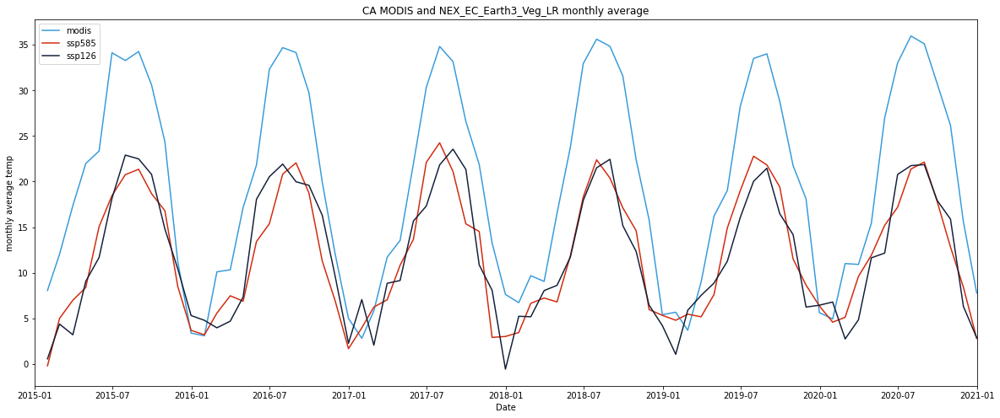

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(CA_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(CA_ssp585_EC_Earth3_Veg_LR_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(CA_ssp126_EC_Earth3_Veg_LR_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('CA MODIS and NEX_EC_Earth3_Veg_LR monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE

#this model missing 2020-12 data
CA_ssp585_EC_Earth3_Veg_LR_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp585_EC_Earth3_Veg_LR_monthly_avg_temp)) 
CA_ssp585_EC_Earth3_Veg_LR_monthly_rmse

9.322854604652631

In [ ]:
#calculate RMSE
#this model missing 2020-12 data
CA_ssp126_EC_Earth3_Veg_LR_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp126_EC_Earth3_Veg_LR_monthly_avg_temp)) 
CA_ssp126_EC_Earth3_Veg_LR_monthly_rmse

9.430074510158999

#### time series analysis

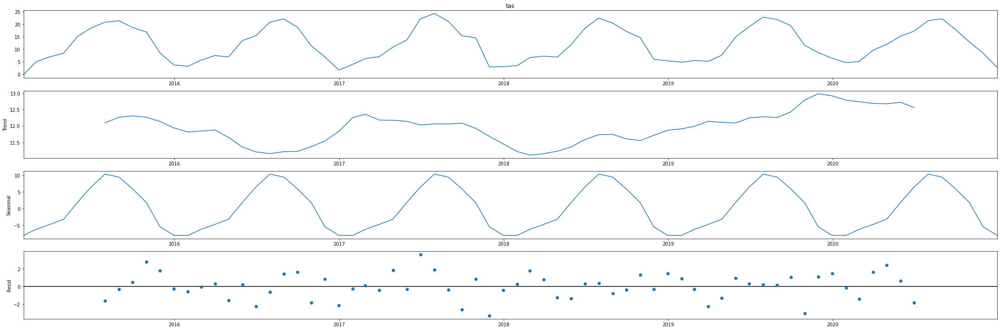

In [ ]:

CA_ssp585_EC_Earth3_Veg_LR_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp585_EC_Earth3_Veg_LR_monthly_avg_temp, model='additive')
fig = CA_ssp585_EC_Earth3_Veg_LR_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

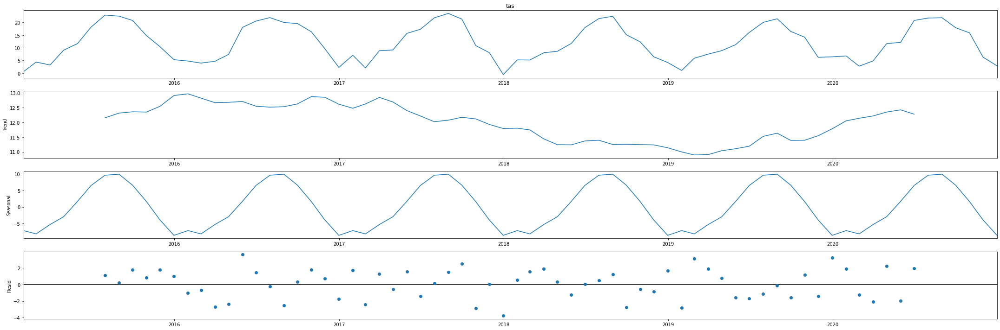

In [ ]:

CA_ssp126_EC_Earth3_Veg_LR_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp126_EC_Earth3_Veg_LR_monthly_avg_temp, model='additive')
fig = CA_ssp126_EC_Earth3_Veg_LR_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

#### R square

In [ ]:
CA_ssp585_EC_Earth3_Veg_LR_model = LinearRegression()
x = CA_ssp585_EC_Earth3_Veg_LR_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
CA_ssp585_EC_Earth3_Veg_LR_model.fit(x, y)
CA_ssp585_EC_Earth3_Veg_LR_r_squared =CA_ssp585_EC_Earth3_Veg_LR_model.score(x, y)
CA_ssp585_EC_Earth3_Veg_LR_r_squared

0.893007438299747

In [ ]:
CA_ssp126_EC_Earth3_Veg_LR_model = LinearRegression()
x = CA_ssp126_EC_Earth3_Veg_LR_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)


In [ ]:
CA_ssp126_EC_Earth3_Veg_LR_model.fit(x, y)
CA_ssp126_EC_Earth3_Veg_LR_r_squared = CA_ssp126_EC_Earth3_Veg_LR_model.score(x, y)
CA_ssp126_EC_Earth3_Veg_LR_r_squared

0.8505364807860221

#### seasonal analysis

In [ ]:
month = CA_ssp585_EC_Earth3_Veg_LR_monthly_avg_temp.index.month
CA_ssp585_EC_Earth3_Veg_LR_winter = pd.concat([CA_ssp585_EC_Earth3_Veg_LR_monthly_avg_temp[month == 1], CA_ssp585_EC_Earth3_Veg_LR_monthly_avg_temp[month == 2],CA_ssp585_EC_Earth3_Veg_LR_monthly_avg_temp[month == 12]])
CA_ssp585_EC_Earth3_Veg_LR_spring = pd.concat([CA_ssp585_EC_Earth3_Veg_LR_monthly_avg_temp[month == 3], CA_ssp585_EC_Earth3_Veg_LR_monthly_avg_temp[month == 4],CA_ssp585_EC_Earth3_Veg_LR_monthly_avg_temp[month == 5]])
CA_ssp585_EC_Earth3_Veg_LR_summer = pd.concat([CA_ssp585_EC_Earth3_Veg_LR_monthly_avg_temp[month == 6], CA_ssp585_EC_Earth3_Veg_LR_monthly_avg_temp[month == 7],CA_ssp585_EC_Earth3_Veg_LR_monthly_avg_temp[month == 8]])
CA_ssp585_EC_Earth3_Veg_LR_fall = pd.concat([CA_ssp585_EC_Earth3_Veg_LR_monthly_avg_temp[month == 9], CA_ssp585_EC_Earth3_Veg_LR_monthly_avg_temp[month == 10],CA_ssp585_EC_Earth3_Veg_LR_monthly_avg_temp[month == 11]])
CA_ssp585_EC_Earth3_Veg_LR_winter.sort_index()
CA_ssp585_EC_Earth3_Veg_LR_spring.sort_index()
CA_ssp585_EC_Earth3_Veg_LR_summer.sort_index()
CA_ssp585_EC_Earth3_Veg_LR_fall.sort_index()

time
2015-09-30    18.670812
2015-10-31    16.808587
2015-11-30     8.493774
2016-09-30    18.754125
2016-10-31    11.283577
2016-11-30     6.914210
2017-09-30    15.359022
2017-10-31    14.525688
2017-11-30     2.908237
2018-09-30    17.118061
2018-10-31    14.605173
2018-11-30     5.962098
2019-09-30    19.404468
2019-10-31    11.504549
2019-11-30     8.652297
2020-09-30    17.814871
2020-10-31    12.822650
2020-11-30     8.416409
Name: tas, dtype: float64

In [ ]:
month = CA_ssp126_EC_Earth3_Veg_LR_monthly_avg_temp.index.month
CA_ssp126_EC_Earth3_Veg_LR_winter = pd.concat([CA_ssp126_EC_Earth3_Veg_LR_monthly_avg_temp[month == 1], CA_ssp126_EC_Earth3_Veg_LR_monthly_avg_temp[month == 2],CA_ssp126_EC_Earth3_Veg_LR_monthly_avg_temp[month == 12]])
CA_ssp126_EC_Earth3_Veg_LR_spring = pd.concat([CA_ssp126_EC_Earth3_Veg_LR_monthly_avg_temp[month == 3], CA_ssp126_EC_Earth3_Veg_LR_monthly_avg_temp[month == 4],CA_ssp126_EC_Earth3_Veg_LR_monthly_avg_temp[month == 5]])
CA_ssp126_EC_Earth3_Veg_LR_summer = pd.concat([CA_ssp126_EC_Earth3_Veg_LR_monthly_avg_temp[month == 6], CA_ssp126_EC_Earth3_Veg_LR_monthly_avg_temp[month == 7],CA_ssp126_EC_Earth3_Veg_LR_monthly_avg_temp[month == 8]])
CA_ssp126_EC_Earth3_Veg_LR_fall = pd.concat([CA_ssp126_EC_Earth3_Veg_LR_monthly_avg_temp[month == 9], CA_ssp126_EC_Earth3_Veg_LR_monthly_avg_temp[month == 10],CA_ssp126_EC_Earth3_Veg_LR_monthly_avg_temp[month == 11]])
CA_ssp126_EC_Earth3_Veg_LR_winter.sort_index()
CA_ssp126_EC_Earth3_Veg_LR_spring.sort_index()
CA_ssp126_EC_Earth3_Veg_LR_summer.sort_index()
CA_ssp126_EC_Earth3_Veg_LR_fall.sort_index()

time
2015-09-30    20.789271
2015-10-31    14.804697
2015-11-30    10.426351
2016-09-30    19.587685
2016-10-31    16.301206
2016-11-30     9.617988
2017-09-30    21.326488
2017-10-31    10.857336
2017-11-30     8.075323
2018-09-30    15.161175
2018-10-31    12.334216
2018-11-30     6.452852
2019-09-30    16.464477
2019-10-31    14.175762
2019-11-30     6.235365
2020-09-30    17.927162
2020-10-31    15.880834
2020-11-30     6.309400
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = CA_ssp126_EC_Earth3_Veg_LR_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.11469727090878856
coef:  [[-0.42361316]]
intercept:  [8.2256292]


In [ ]:
x = CA_ssp126_EC_Earth3_Veg_LR_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.38971833103986075
coef:  [[0.92919366]]
intercept:  [8.11098794]


In [ ]:
x = CA_ssp126_EC_Earth3_Veg_LR_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.4932856151334627
coef:  [[0.63117827]]
intercept:  [20.51417017]


In [ ]:
x = CA_ssp126_EC_Earth3_Veg_LR_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.665600450783892
coef:  [[1.12047117]]
intercept:  [7.14649462]


#####ssp585

In [ ]:
x = CA_ssp585_EC_Earth3_Veg_LR_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.01973577400138027
coef:  [[0.2207414]]
intercept:  [5.63552575]


In [ ]:
x = CA_ssp585_EC_Earth3_Veg_LR_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.5082134537905085
coef:  [[1.16361711]]
intercept:  [5.368568]


In [ ]:
x = CA_ssp585_EC_Earth3_Veg_LR_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.14142041423739826
coef:  [[0.32004137]]
intercept:  [26.96643493]


In [ ]:
x = CA_ssp585_EC_Earth3_Veg_LR_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8465493447656247
coef:  [[1.24914802]]
intercept:  [6.29327116]


### CA_NEX_EC_Earth3


#### ssp585

In [ ]:
#https://drive.google.com/file/d/1OA58E0TzLljxdvXnas4J3MAsXKo8jv2e/view?usp=share_link
id = "1OA58E0TzLljxdvXnas4J3MAsXKo8jv2e"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_ssp585_EC-Earth3.csv')

CA_ssp585_EC_Earth3 = pd.read_csv('CA_ssp585_EC-Earth3.csv', parse_dates=['time'], index_col='time')
CA_ssp585_EC_Earth3.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,-120.125,15.399597
2015-01-01,1,36.375,-119.875,14.616272
2015-01-01,2,36.375,-119.625,14.186340
2015-01-01,3,36.375,-119.375,14.448425
2015-01-01,4,36.375,-119.125,15.419678


In [ ]:
CA_ssp585_EC_Earth3

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,-120.125,15.399597
2015-01-01,1,36.375,-119.875,14.616272
2015-01-01,2,36.375,-119.625,14.186340
2015-01-01,3,36.375,-119.375,14.448425
2015-01-01,4,36.375,-119.125,15.419678
...,...,...,...,...
2020-12-31,341947,39.125,-118.125,6.389618
2020-12-31,341948,39.125,-117.875,6.614136
2020-12-31,341949,39.125,-117.625,5.755127


In [ ]:
CA_ssp585_EC_Earth3['tas'].isnull().sum()

0

In [ ]:
CA_ssp585_EC_Earth3_avg_temp = CA_ssp585_EC_Earth3.groupby(CA_ssp585_EC_Earth3.index)['tas'].mean()
CA_ssp585_EC_Earth3_avg_temp

time
2015-01-01    10.034270
2015-01-02    11.251173
2015-01-03     7.073496
2015-01-04     7.097790
2015-01-05     4.425795
                ...    
2020-12-27    -3.107415
2020-12-28    -1.717836
2020-12-29     2.431584
2020-12-30     7.384692
2020-12-31     7.731285
Name: tas, Length: 2192, dtype: float64

In [ ]:
CA_ssp585_EC_Earth3_monthly_avg_temp = CA_ssp585_EC_Earth3_avg_temp.resample('M').mean()
CA_ssp585_EC_Earth3_monthly_avg_temp

time
2015-01-31     5.772881
2015-02-28     7.441756
2015-03-31     9.227679
2015-04-30    13.113223
2015-05-31    15.369189
                ...    
2020-08-31    21.250797
2020-09-30    16.744968
2020-10-31    12.807708
2020-11-30     7.498462
2020-12-31     0.915722
Freq: M, Name: tas, Length: 72, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/1BgW1temZ1O0zCQjIKE7xLXY5laEhywSn/view?usp=share_link
id = "1BgW1temZ1O0zCQjIKE7xLXY5laEhywSn"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('CA_SSP126_EC-Earth3.csv')

CA_ssp126_EC_Earth3 = pd.read_csv('CA_SSP126_EC-Earth3.csv', parse_dates=['time'], index_col='time')
CA_ssp126_EC_Earth3.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,39.125,-120.125,7.739319
2015-01-01,1,39.125,-119.875,8.260132
2015-01-01,2,39.125,-119.625,9.398376
2015-01-01,3,39.125,-119.375,8.738892
2015-01-01,4,39.125,-119.125,10.968536


In [ ]:
CA_ssp126_EC_Earth3['tas'].isnull().sum()

0

In [ ]:
CA_ssp126_EC_Earth3_avg_temp = CA_ssp126_EC_Earth3.groupby(CA_ssp126_EC_Earth3.index)['tas'].mean()
CA_ssp126_EC_Earth3_avg_temp

time
2015-01-01    10.262131
2015-01-02    11.411813
2015-01-03     6.792873
2015-01-04     7.215914
2015-01-05     2.673277
                ...    
2020-12-27     1.652978
2020-12-28     0.015241
2020-12-29     3.242884
2020-12-30     2.831566
2020-12-31     5.311242
Name: tas, Length: 2192, dtype: float64

In [ ]:
CA_ssp126_EC_Earth3_monthly_avg_temp = CA_ssp126_EC_Earth3_avg_temp.resample('M').mean()
CA_ssp126_EC_Earth3_monthly_avg_temp 

time
2015-01-31     5.592075
2015-02-28     8.047332
2015-03-31     7.154770
2015-04-30    10.229687
2015-05-31    18.024993
                ...    
2020-08-31    21.764661
2020-09-30    19.475171
2020-10-31    16.845521
2020-11-30    10.367828
2020-12-31     0.583432
Freq: M, Name: tas, Length: 72, dtype: float64

#### compare modis with ssp585 and ssp126

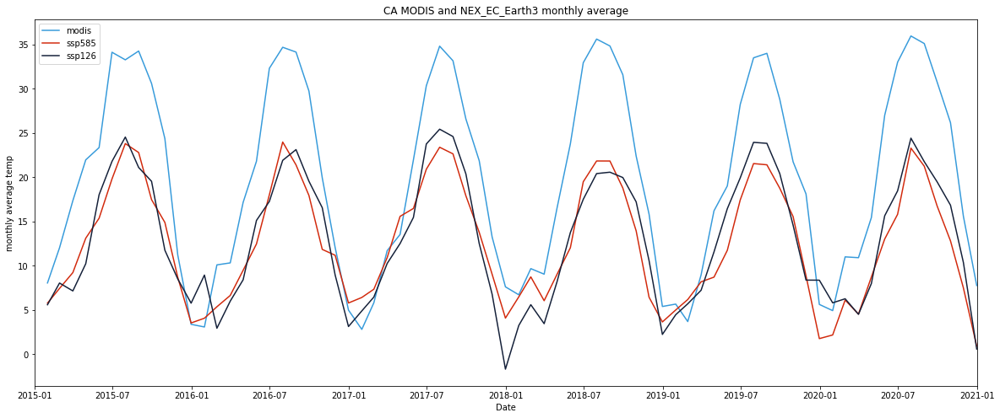

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(CA_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(CA_ssp585_EC_Earth3_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(CA_ssp126_EC_Earth3_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('CA MODIS and NEX_EC_Earth3 monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE

#this model missing 2020-12 data
CA_ssp585_EC_Earth3_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp585_EC_Earth3_monthly_avg_temp)) 
CA_ssp585_EC_Earth3_monthly_rmse

8.853724170531814

In [ ]:
#calculate RMSE
#this model missing 2020-12 data
CA_ssp126_EC_Earth3_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp126_EC_Earth3_monthly_avg_temp)) 
CA_ssp126_EC_Earth3_monthly_rmse

8.377653539880214

#### time series analysis

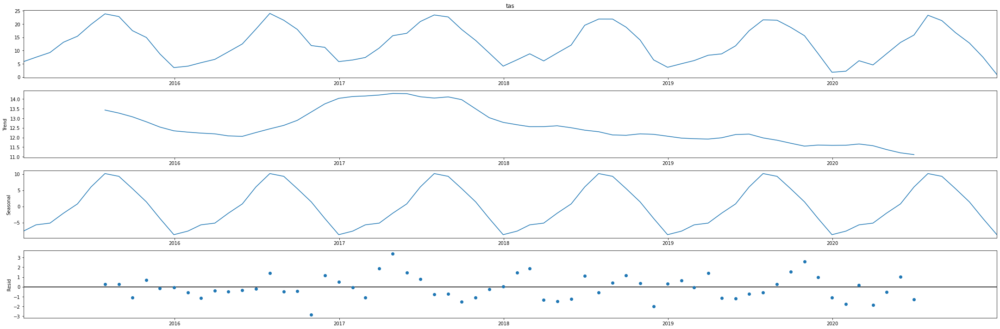

In [ ]:

CA_ssp585_EC_Earth3_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp585_EC_Earth3_monthly_avg_temp, model='additive')
fig = CA_ssp585_EC_Earth3_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

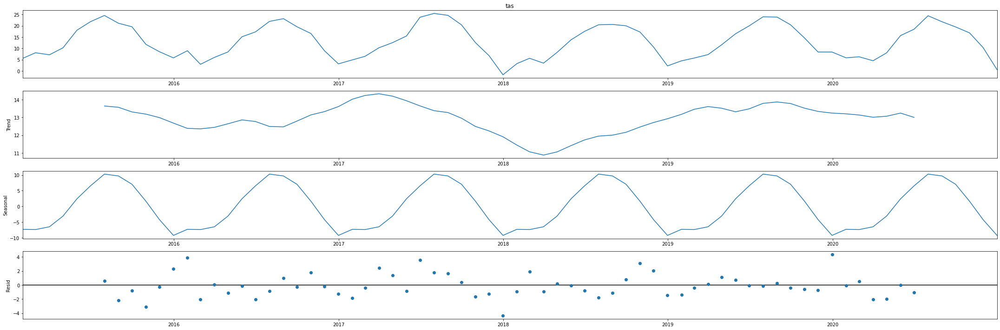

In [ ]:

CA_ssp126_EC_Earth3_Monthly_deco = sm.tsa.seasonal_decompose(CA_ssp126_EC_Earth3_monthly_avg_temp, model='additive')
fig = CA_ssp126_EC_Earth3_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

#### R square

In [ ]:
CA_ssp585_EC_Earth3_model = LinearRegression()
x = CA_ssp585_EC_Earth3_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
CA_ssp585_EC_Earth3_model.fit(x, y)
CA_ssp585_EC_Earth3_r_squared =CA_ssp585_EC_Earth3_model.score(x, y)
CA_ssp585_EC_Earth3_r_squared

0.8943077682137491

In [ ]:
CA_ssp126_EC_Earth3_model = LinearRegression()
x = CA_ssp126_EC_Earth3_monthly_avg_temp.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)


In [ ]:
CA_ssp126_EC_Earth3_model.fit(x, y)
CA_ssp126_EC_Earth3_r_squared = CA_ssp126_EC_Earth3_model.score(x, y)
CA_ssp126_EC_Earth3_r_squared

0.8678744235259805

#### seasonal analysis

In [ ]:
month = CA_ssp585_EC_Earth3_monthly_avg_temp.index.month
CA_ssp585_EC_Earth3_winter = pd.concat([CA_ssp585_EC_Earth3_monthly_avg_temp[month == 1], CA_ssp585_EC_Earth3_monthly_avg_temp[month == 2],CA_ssp585_EC_Earth3_monthly_avg_temp[month == 12]])
CA_ssp585_EC_Earth3_spring = pd.concat([CA_ssp585_EC_Earth3_monthly_avg_temp[month == 3], CA_ssp585_EC_Earth3_monthly_avg_temp[month == 4],CA_ssp585_EC_Earth3_monthly_avg_temp[month == 5]])
CA_ssp585_EC_Earth3_summer = pd.concat([CA_ssp585_EC_Earth3_monthly_avg_temp[month == 6], CA_ssp585_EC_Earth3_monthly_avg_temp[month == 7],CA_ssp585_EC_Earth3_monthly_avg_temp[month == 8]])
CA_ssp585_EC_Earth3_fall = pd.concat([CA_ssp585_EC_Earth3_monthly_avg_temp[month == 9], CA_ssp585_EC_Earth3_monthly_avg_temp[month == 10],CA_ssp585_EC_Earth3_monthly_avg_temp[month == 11]])
CA_ssp585_EC_Earth3_winter.sort_index()
CA_ssp585_EC_Earth3_spring.sort_index()
CA_ssp585_EC_Earth3_summer.sort_index()
CA_ssp585_EC_Earth3_fall.sort_index()

time
2015-09-30    17.472251
2015-10-31    14.894785
2015-11-30     8.689374
2016-09-30    17.945615
2016-10-31    11.848372
2016-11-30    11.184102
2017-09-30    17.907308
2017-10-31    13.779248
2017-11-30     9.044819
2018-09-30    18.779941
2018-10-31    13.942481
2018-11-30     6.442227
2019-09-30    18.758535
2019-10-31    15.556021
2019-11-30     8.855461
2020-09-30    16.744968
2020-10-31    12.807708
2020-11-30     7.498462
Name: tas, dtype: float64

In [ ]:
month = CA_ssp126_EC_Earth3_monthly_avg_temp.index.month
CA_ssp126_EC_Earth3_winter = pd.concat([CA_ssp126_EC_Earth3_monthly_avg_temp[month == 1], CA_ssp126_EC_Earth3_monthly_avg_temp[month == 2],CA_ssp126_EC_Earth3_monthly_avg_temp[month == 12]])
CA_ssp126_EC_Earth3_spring = pd.concat([CA_ssp126_EC_Earth3_monthly_avg_temp[month == 3], CA_ssp126_EC_Earth3_monthly_avg_temp[month == 4],CA_ssp126_EC_Earth3_monthly_avg_temp[month == 5]])
CA_ssp126_EC_Earth3_summer = pd.concat([CA_ssp126_EC_Earth3_monthly_avg_temp[month == 6], CA_ssp126_EC_Earth3_monthly_avg_temp[month == 7],CA_ssp126_EC_Earth3_monthly_avg_temp[month == 8]])
CA_ssp126_EC_Earth3_fall = pd.concat([CA_ssp126_EC_Earth3_monthly_avg_temp[month == 9], CA_ssp126_EC_Earth3_monthly_avg_temp[month == 10],CA_ssp126_EC_Earth3_monthly_avg_temp[month == 11]])
CA_ssp126_EC_Earth3_winter.sort_index()
CA_ssp126_EC_Earth3_spring.sort_index()
CA_ssp126_EC_Earth3_summer.sort_index()
CA_ssp126_EC_Earth3_fall.sort_index()

time
2015-09-30    19.543057
2015-10-31    11.754142
2015-11-30     8.502347
2016-09-30    19.551935
2016-10-31    16.562336
2016-11-30     8.948243
2017-09-30    20.383206
2017-10-31    12.513378
2017-11-30     6.791078
2018-09-30    19.969483
2018-10-31    17.219232
2018-11-30    10.578381
2019-09-30    20.410658
2019-10-31    14.574137
2019-11-30     8.377847
2020-09-30    19.475171
2020-10-31    16.845521
2020-11-30    10.367828
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = CA_ssp126_EC_Earth3_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.008264987779856292
coef:  [[-0.09282172]]
intercept:  [7.02056127]


In [ ]:
x = CA_ssp126_EC_Earth3_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.6315627940197239
coef:  [[1.00363291]]
intercept:  [6.30140213]


In [ ]:
x = CA_ssp126_EC_Earth3_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.05953107375757827
coef:  [[0.18212396]]
intercept:  [29.58446285]


In [ ]:
x = CA_ssp126_EC_Earth3_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8233922694235906
coef:  [[1.26912801]]
intercept:  [3.75708976]


#####ssp585

In [ ]:
x = CA_ssp585_EC_Earth3_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.10689177565730223
coef:  [[0.43190742]]
intercept:  [4.39449401]


In [ ]:
x = CA_ssp585_EC_Earth3_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.4938961971096081
coef:  [[1.14950241]]
intercept:  [4.78646137]


In [ ]:
x = CA_ssp585_EC_Earth3_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.32833602066766887
coef:  [[0.47279874]]
intercept:  [23.5760127]


In [ ]:
x = CA_ssp585_EC_Earth3_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.7920786927983247
coef:  [[1.47081447]]
intercept:  [2.46922088]


## overall 

### ssp585

#### CA

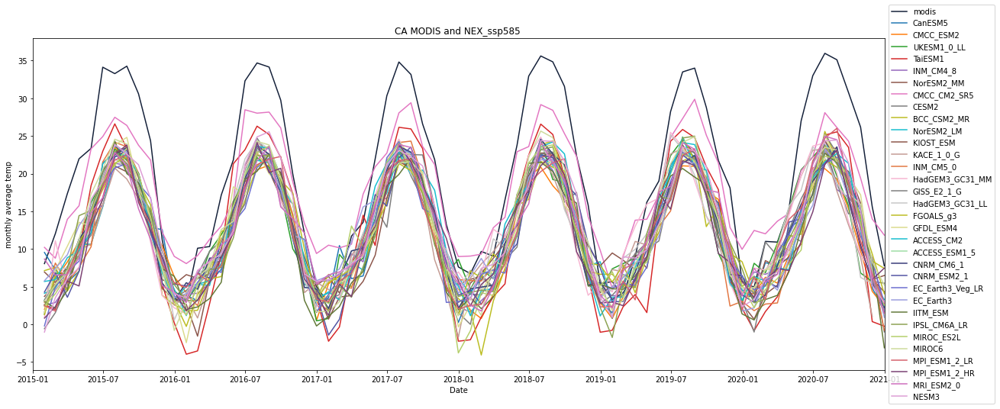

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(CA_Monthly_data_month, color='#142039', label='modis')
ax.plot(CA_ssp585_CanESM5_monthly_avg_temp, color='#1f77b4', label='CanESM5')
ax.plot(CA_ssp585_CMCC_ESM2_monthly_avg_temp, color='#ff7f0e', label='CMCC_ESM2')
ax.plot(CA_ssp585_UKESM1_0_LL_monthly_avg_temp, color='#2ca02c', label='UKESM1_0_LL')
ax.plot(CA_ssp585_TaiESM1_monthly_avg_temp, color='#d62728', label='TaiESM1')
ax.plot(CA_ssp585_INM_CM4_8_monthly_avg_temp, color='#9467bd', label='INM_CM4_8')
ax.plot(CA_ssp585_NorESM2_MM_monthly_avg_temp, color='#8c564b', label='NorESM2_MM')
ax.plot(CA_ssp585_CMCC_CM2_SR5_monthly_avg_temp, color='#e377c2', label='CMCC_CM2_SR5')
ax.plot(CA_ssp585_CESM2_monthly_avg_temp, color='#7f7f7f', label='CESM2')
ax.plot(CA_ssp585_BCC_CSM2_MR_monthly_avg_temp, color='#bcbd22', label='BCC_CSM2_MR')
ax.plot(CA_ssp585_NorESM2_LM_monthly_avg_temp, color='#17becf', label='NorESM2_LM')
ax.plot(CA_ssp585_KIOST_ESM_monthly_avg_temp, color='#8c564b', label='KIOST_ESM')
ax.plot(CA_ssp585_KACE_1_0_G_monthly_avg_temp, color='#c49c94', label='KACE_1_0_G')
ax.plot(CA_ssp585_INM_CM5_0_monthly_avg_temp, color='#e37742', label='INM_CM5_0')
ax.plot(CA_ssp585_HadGEM3_GC31_MM_monthly_avg_temp, color='#f7b6d2', label='HadGEM3_GC31_MM')
ax.plot(CA_ssp585_GISS_E2_1_G_monthly_avg_temp, color='#7f7f7f', label='GISS_E2_1_G')
ax.plot(CA_ssp585_HadGEM3_GC31_LL_monthly_avg_temp, color='#c7c7c7', label='HadGEM3_GC31_LL')
ax.plot(CA_ssp585_FGOALS_g3_monthly_avg_temp, color='#bcbd22', label='FGOALS_g3')
ax.plot(CA_ssp585_GFDL_ESM4_monthly_avg_temp, color='#dbdb8d', label='GFDL_ESM4')

ax.plot(CA_ssp585_ACCESS_CM2_monthly_avg_temp, color='#17becf', label='ACCESS_CM2')
ax.plot(CA_ssp585_ACCESS_ESM1_5_monthly_avg_temp, color='#9edea5', label='ACCESS_ESM1_5')
ax.plot(CA_ssp585_CNRM_CM6_1_monthly_avg_temp, color='#393b79', label='CNRM_CM6_1')
ax.plot(CA_ssp585_CNRM_ESM2_1_monthly_avg_temp, color='#5254a3', label='CNRM_ESM2_1')
ax.plot(CA_ssp585_EC_Earth3_Veg_LR_monthly_avg_temp, color='#6b6ecf', label='EC_Earth3_Veg_LR')
ax.plot(CA_ssp585_EC_Earth3_monthly_avg_temp, color='#9c9ede', label='EC_Earth3')
ax.plot(CA_ssp585_IITM_ESM_monthly_avg_temp, color='#637939', label='IITM_ESM')
ax.plot(CA_ssp585_IPSL_CM6A_LR_monthly_avg_temp, color='#8ca252', label='IPSL_CM6A_LR')
ax.plot(CA_ssp585_MIROC_ES2L_monthly_avg_temp, color='#b5cf6b', label='MIROC_ES2L')
ax.plot(CA_ssp585_MIROC6_monthly_avg_temp, color='#cedb9c', label='MIROC6')

ax.plot(CA_ssp585_MPI_ESM1_2_LR_monthly_avg_temp, color='#d6616b', label='MPI_ESM1_2_LR')
ax.plot(CA_ssp585_MPI_ESM1_2_HR_monthly_avg_temp, color='#7b4173', label='MPI_ESM1_2_HR')
ax.plot(CA_ssp585_MRI_ESM2_0_monthly_avg_temp, color='#ce6dbd', label='MRI_ESM2_0')
ax.plot(CA_ssp585_NESM3_monthly_avg_temp, color='#de9ed6', label='NESM3')




ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.title('CA MODIS and NEX_ssp585 ')
plt.show()

### ssp126

#### CA

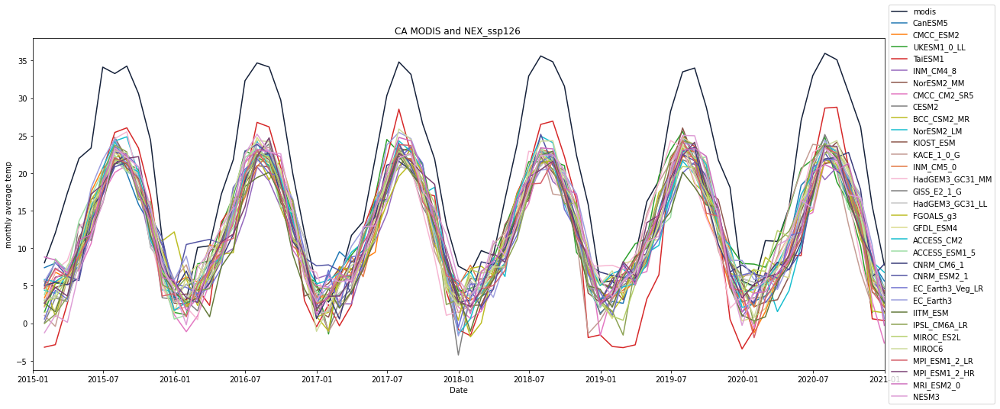

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(CA_Monthly_data_month, color='#142039', label='modis')
ax.plot(CA_ssp126_CanESM5_monthly_avg_temp, color='#1f77b4', label='CanESM5')
ax.plot(CA_ssp126_CMCC_ESM2_monthly_avg_temp, color='#ff7f0e', label='CMCC_ESM2')
ax.plot(CA_ssp126_UKESM1_0_LL_monthly_avg_temp, color='#2ca02c', label='UKESM1_0_LL')
ax.plot(CA_ssp126_TaiESM1_monthly_avg_temp, color='#d62728', label='TaiESM1')
ax.plot(CA_ssp126_INM_CM4_8_monthly_avg_temp, color='#9467bd', label='INM_CM4_8')
ax.plot(CA_ssp126_NorESM2_MM_monthly_avg_temp, color='#8c564b', label='NorESM2_MM')
ax.plot(CA_ssp126_CMCC_CM2_SR5_monthly_avg_temp, color='#e377c2', label='CMCC_CM2_SR5')
ax.plot(CA_ssp126_CESM2_monthly_avg_temp, color='#7f7f7f', label='CESM2')
ax.plot(CA_ssp126_BCC_CSM2_MR_monthly_avg_temp, color='#bcbd22', label='BCC_CSM2_MR')
ax.plot(CA_ssp126_NorESM2_LM_monthly_avg_temp, color='#17becf', label='NorESM2_LM')
ax.plot(CA_ssp126_KIOST_ESM_monthly_avg_temp, color='#8c564b', label='KIOST_ESM')
ax.plot(CA_ssp126_KACE_1_0_G_monthly_avg_temp, color='#c49c94', label='KACE_1_0_G')
ax.plot(CA_ssp126_INM_CM5_0_monthly_avg_temp, color='#e37742', label='INM_CM5_0')
ax.plot(CA_ssp126_HadGEM3_GC31_MM_monthly_avg_temp, color='#f7b6d2', label='HadGEM3_GC31_MM')
ax.plot(CA_ssp126_GISS_E2_1_G_monthly_avg_temp, color='#7f7f7f', label='GISS_E2_1_G')
ax.plot(CA_ssp126_HadGEM3_GC31_LL_monthly_avg_temp, color='#c7c7c7', label='HadGEM3_GC31_LL')
ax.plot(CA_ssp126_FGOALS_g3_monthly_avg_temp, color='#bcbd22', label='FGOALS_g3')
ax.plot(CA_ssp126_GFDL_ESM4_monthly_avg_temp, color='#dbdb8d', label='GFDL_ESM4')

ax.plot(CA_ssp126_ACCESS_CM2_monthly_avg_temp, color='#17becf', label='ACCESS_CM2')
ax.plot(CA_ssp126_ACCESS_ESM1_5_monthly_avg_temp, color='#9edea5', label='ACCESS_ESM1_5')
ax.plot(CA_ssp126_CNRM_CM6_1_monthly_avg_temp, color='#393b79', label='CNRM_CM6_1')
ax.plot(CA_ssp126_CNRM_ESM2_1_monthly_avg_temp, color='#5254a3', label='CNRM_ESM2_1')
ax.plot(CA_ssp126_EC_Earth3_Veg_LR_monthly_avg_temp, color='#6b6ecf', label='EC_Earth3_Veg_LR')
ax.plot(CA_ssp126_EC_Earth3_monthly_avg_temp, color='#9c9ede', label='EC_Earth3')
ax.plot(CA_ssp126_IITM_ESM_monthly_avg_temp, color='#637939', label='IITM_ESM')
ax.plot(CA_ssp126_IPSL_CM6A_LR_monthly_avg_temp, color='#8ca252', label='IPSL_CM6A_LR')
ax.plot(CA_ssp126_MIROC_ES2L_monthly_avg_temp, color='#b5cf6b', label='MIROC_ES2L')
ax.plot(CA_ssp126_MIROC6_monthly_avg_temp, color='#cedb9c', label='MIROC6')

ax.plot(CA_ssp126_MPI_ESM1_2_LR_monthly_avg_temp, color='#d6616b', label='MPI_ESM1_2_LR')
ax.plot(CA_ssp126_MPI_ESM1_2_HR_monthly_avg_temp, color='#7b4173', label='MPI_ESM1_2_HR')
ax.plot(CA_ssp126_MRI_ESM2_0_monthly_avg_temp, color='#ce6dbd', label='MRI_ESM2_0')
ax.plot(CA_ssp126_NESM3_monthly_avg_temp, color='#de9ed6', label='NESM3')





ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.title('CA MODIS and NEX_ssp126 ')
plt.show()

### all model average

In [ ]:
CA_ssp126_all_model = pd.concat([CA_ssp126_CanESM5_monthly_avg_temp, 
 CA_ssp126_CMCC_ESM2_monthly_avg_temp,
 CA_ssp126_UKESM1_0_LL_monthly_avg_temp,
 CA_ssp126_TaiESM1_monthly_avg_temp,
 CA_ssp126_INM_CM4_8_monthly_avg_temp,
 CA_ssp126_NorESM2_MM_monthly_avg_temp,
 CA_ssp126_CMCC_CM2_SR5_monthly_avg_temp,
 CA_ssp126_CESM2_monthly_avg_temp,
 CA_ssp126_BCC_CSM2_MR_monthly_avg_temp,
 CA_ssp126_NorESM2_LM_monthly_avg_temp, 
 CA_ssp126_KIOST_ESM_monthly_avg_temp,
 CA_ssp126_KACE_1_0_G_monthly_avg_temp,
 CA_ssp126_INM_CM5_0_monthly_avg_temp,
 CA_ssp126_HadGEM3_GC31_MM_monthly_avg_temp,
 CA_ssp126_GISS_E2_1_G_monthly_avg_temp,
 CA_ssp126_HadGEM3_GC31_LL_monthly_avg_temp,
 CA_ssp126_FGOALS_g3_monthly_avg_temp,
 CA_ssp126_GFDL_ESM4_monthly_avg_temp,
 CA_ssp126_ACCESS_CM2_monthly_avg_temp,
 CA_ssp126_ACCESS_ESM1_5_monthly_avg_temp,
 CA_ssp126_CNRM_CM6_1_monthly_avg_temp,
 CA_ssp126_CNRM_ESM2_1_monthly_avg_temp,
 CA_ssp126_EC_Earth3_Veg_LR_monthly_avg_temp,
 CA_ssp126_EC_Earth3_monthly_avg_temp,
 CA_ssp126_IITM_ESM_monthly_avg_temp,
 CA_ssp126_IPSL_CM6A_LR_monthly_avg_temp,
 CA_ssp126_MIROC_ES2L_monthly_avg_temp,
 CA_ssp126_MIROC6_monthly_avg_temp,
 CA_ssp126_MPI_ESM1_2_LR_monthly_avg_temp,
 CA_ssp126_MPI_ESM1_2_HR_monthly_avg_temp,
 CA_ssp126_MRI_ESM2_0_monthly_avg_temp,
 CA_ssp126_NESM3_monthly_avg_temp],axis = 1)


CA_ssp585_all_model = pd.concat([CA_ssp585_CanESM5_monthly_avg_temp, 
 CA_ssp585_CMCC_ESM2_monthly_avg_temp,
 CA_ssp585_UKESM1_0_LL_monthly_avg_temp,
 CA_ssp585_TaiESM1_monthly_avg_temp,
 CA_ssp585_INM_CM4_8_monthly_avg_temp,
 CA_ssp585_NorESM2_MM_monthly_avg_temp,
 CA_ssp585_CMCC_CM2_SR5_monthly_avg_temp,
 CA_ssp585_CESM2_monthly_avg_temp,
 CA_ssp585_BCC_CSM2_MR_monthly_avg_temp,
 CA_ssp585_NorESM2_LM_monthly_avg_temp, 
 CA_ssp585_KIOST_ESM_monthly_avg_temp,
 CA_ssp585_KACE_1_0_G_monthly_avg_temp,
 CA_ssp585_INM_CM5_0_monthly_avg_temp,
 CA_ssp585_HadGEM3_GC31_MM_monthly_avg_temp,
 CA_ssp585_GISS_E2_1_G_monthly_avg_temp,
 CA_ssp585_HadGEM3_GC31_LL_monthly_avg_temp,
 CA_ssp585_FGOALS_g3_monthly_avg_temp,
 CA_ssp585_GFDL_ESM4_monthly_avg_temp,
 CA_ssp585_ACCESS_CM2_monthly_avg_temp,
 CA_ssp585_ACCESS_ESM1_5_monthly_avg_temp,
 CA_ssp585_CNRM_CM6_1_monthly_avg_temp,
 CA_ssp585_CNRM_ESM2_1_monthly_avg_temp,
 CA_ssp585_EC_Earth3_Veg_LR_monthly_avg_temp,
 CA_ssp585_EC_Earth3_monthly_avg_temp,
 CA_ssp585_IITM_ESM_monthly_avg_temp,
 CA_ssp585_IPSL_CM6A_LR_monthly_avg_temp,
 CA_ssp585_MIROC_ES2L_monthly_avg_temp,
 CA_ssp585_MIROC6_monthly_avg_temp,
 CA_ssp585_MPI_ESM1_2_LR_monthly_avg_temp,
 CA_ssp585_MPI_ESM1_2_HR_monthly_avg_temp,
 CA_ssp585_MRI_ESM2_0_monthly_avg_temp,
 CA_ssp585_NESM3_monthly_avg_temp],axis = 1)


In [ ]:
#average temp
CA_ssp126_all_model['average'] = CA_ssp126_all_model.mean(axis=1)
CA_ssp585_all_model['average'] = CA_ssp585_all_model.mean(axis=1)

In [ ]:
CA_ssp126_all_model_mothly_average = CA_ssp126_all_model['average'] 
CA_ssp585_all_model_mothly_average = CA_ssp585_all_model['average']

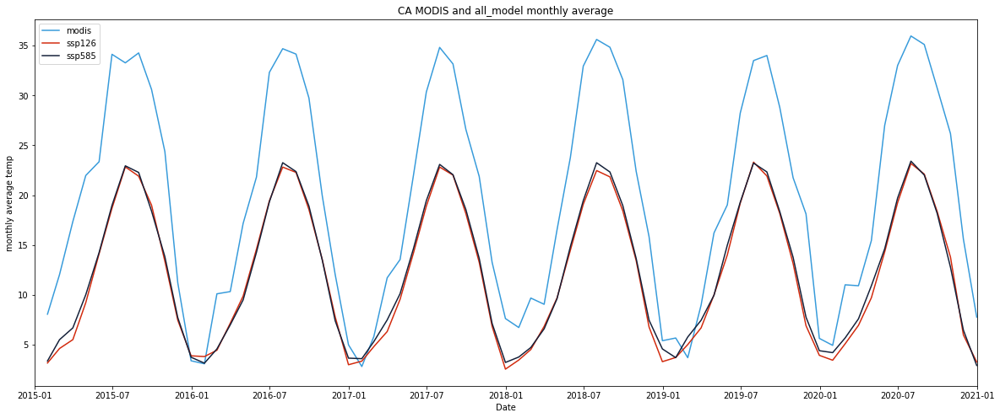

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(CA_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(CA_ssp126_all_model_mothly_average, color='#D22A0D', label='ssp126')
ax.plot(CA_ssp585_all_model_mothly_average , color='#142039', label='ssp585')
ax.legend(loc='best')
plt.title('CA MODIS and all_model monthly average')
plt.show()

#### RMSE calculation

In [ ]:
#calculate RMSE

CA_ssp585_all_model_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp585_all_model_mothly_average)) 
CA_ssp585_all_model_monthly_rmse

8.651956219675084

In [ ]:
#calculate RMSE

CA_ssp126_all_model_monthly_rmse = sqrt(mean_squared_error(CA_Monthly_data_month, CA_ssp126_all_model_mothly_average)) 
CA_ssp126_all_model_monthly_rmse

8.898906501850416

#### R square

In [ ]:
CA_ssp585_all_model = LinearRegression()
x = CA_ssp585_all_model_mothly_average.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
CA_ssp585_all_model.fit(x, y)
CA_ssp585_all_model_r_squared =CA_ssp585_all_model.score(x, y)
CA_ssp585_all_model_r_squared

0.9443550328717164

In [ ]:
CA_ssp126_all_model = LinearRegression()
x = CA_ssp126_all_model_mothly_average.values.reshape(-1, 1)
y = CA_Monthly_data_month.values.reshape(-1, 1)


In [ ]:
CA_ssp126_all_model.fit(x, y)
CA_ssp126_all_model_r_squared = CA_ssp126_all_model.score(x, y)
CA_ssp126_all_model_r_squared

0.9425799190112386

#### seasonal analysis

In [ ]:
month = CA_ssp585_all_model_mothly_average.index.month
CA_ssp585_all_model_winter = pd.concat([CA_ssp585_all_model_mothly_average[month == 1], CA_ssp585_all_model_mothly_average[month == 2],CA_ssp585_all_model_mothly_average[month == 12]])
CA_ssp585_all_model_spring = pd.concat([CA_ssp585_all_model_mothly_average[month == 3], CA_ssp585_all_model_mothly_average[month == 4],CA_ssp585_all_model_mothly_average[month == 5]])
CA_ssp585_all_model_summer = pd.concat([CA_ssp585_all_model_mothly_average[month == 6], CA_ssp585_all_model_mothly_average[month == 7],CA_ssp585_all_model_mothly_average[month == 8]])
CA_ssp585_all_model_fall = pd.concat([CA_ssp585_all_model_mothly_average[month == 9], CA_ssp585_all_model_mothly_average[month == 10],CA_ssp585_all_model_mothly_average[month == 11]])
CA_ssp585_all_model_winter.sort_index()
CA_ssp585_all_model_spring.sort_index()
CA_ssp585_all_model_summer.sort_index()
CA_ssp585_all_model_fall.sort_index()

time
2015-09-30    18.397514
2015-10-31    13.820683
2015-11-30     7.710812
2016-09-30    18.905735
2016-10-31    13.489108
2016-11-30     7.405964
2017-09-30    18.553120
2017-10-31    13.658800
2017-11-30     7.132052
2018-09-30    18.942875
2018-10-31    13.651917
2018-11-30     7.456071
2019-09-30    18.347080
2019-10-31    13.759311
2019-11-30     7.755433
2020-09-30    18.173923
2020-10-31    12.761705
2020-11-30     6.459808
Name: average, dtype: float64

In [ ]:
month = CA_ssp126_all_model_mothly_average.index.month
CA_ssp126_all_model_winter = pd.concat([CA_ssp126_all_model_mothly_average[month == 1], CA_ssp126_all_model_mothly_average[month == 2],CA_ssp126_all_model_mothly_average[month == 12]])
CA_ssp126_all_model_spring = pd.concat([CA_ssp126_all_model_mothly_average[month == 3], CA_ssp126_all_model_mothly_average[month == 4],CA_ssp126_all_model_mothly_average[month == 5]])
CA_ssp126_all_model_summer = pd.concat([CA_ssp126_all_model_mothly_average[month == 6], CA_ssp126_all_model_mothly_average[month == 7],CA_ssp126_all_model_mothly_average[month == 8]])
CA_ssp126_all_model_fall = pd.concat([CA_ssp126_all_model_mothly_average[month == 9], CA_ssp126_all_model_mothly_average[month == 10],CA_ssp126_all_model_mothly_average[month == 11]])
CA_ssp126_all_model_winter.sort_index()
CA_ssp126_all_model_spring.sort_index()
CA_ssp126_all_model_summer.sort_index()
CA_ssp126_all_model_fall.sort_index()

time
2015-09-30    18.990786
2015-10-31    13.366849
2015-11-30     7.453353
2016-09-30    18.558953
2016-10-31    13.549121
2016-11-30     7.802632
2017-09-30    18.146640
2017-10-31    13.263011
2017-11-30     6.837464
2018-09-30    18.417200
2018-10-31    13.436660
2018-11-30     6.768887
2019-09-30    18.154680
2019-10-31    13.138184
2019-11-30     6.901871
2020-09-30    18.362880
2020-10-31    13.775179
2020-11-30     5.973658
Name: average, dtype: float64

#####ssp126

In [ ]:
x = CA_ssp126_all_model_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.1047656329849449
coef:  [[1.20674785]]
intercept:  [1.93013174]


In [ ]:
x = CA_ssp126_all_model_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.6953711862910126
coef:  [[1.40056576]]
intercept:  [2.75843123]


In [ ]:
x = CA_ssp126_all_model_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.42869405126746407
coef:  [[0.72359144]]
intercept:  [18.13872786]


In [ ]:
x = CA_ssp126_all_model_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8906459917969848
coef:  [[1.31914896]]
intercept:  [5.1877225]


#####ssp585

In [ ]:
x = CA_ssp585_all_model_winter.values.reshape(-1, 1)
y = CA_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.1320183311333103
coef:  [[1.10998167]]
intercept:  [1.9028624]


In [ ]:
x = CA_ssp585_all_model_spring.values.reshape(-1, 1)
y = CA_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.7149613402253563
coef:  [[1.46154054]]
intercept:  [1.54321412]


In [ ]:
x = CA_ssp585_all_model_summer.values.reshape(-1, 1)
y = CA_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.4692033610528883
coef:  [[0.76242759]]
intercept:  [17.11136537]


In [ ]:
x = CA_ssp585_all_model_fall.values.reshape(-1, 1)
y = CA_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8907720061830803
coef:  [[1.34995761]]
intercept:  [4.52781151]


###trend

####ssp585

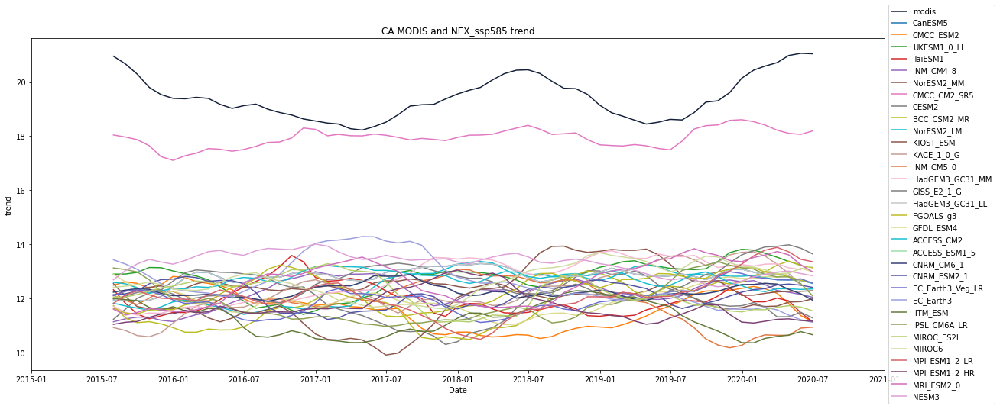

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="trend")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(CA_Monthly_deco.trend, color='#142039', label='modis')

ax.plot(CA_ssp585_CanESM5_Monthly_deco.trend, color='#1f77b4', label='CanESM5')
ax.plot(CA_ssp585_CMCC_ESM2_Monthly_deco.trend, color='#ff7f0e', label='CMCC_ESM2')
ax.plot(CA_ssp585_UKESM1_0_LL_Monthly_deco.trend, color='#2ca02c', label='UKESM1_0_LL')
ax.plot(CA_ssp585_TaiESM1_Monthly_deco.trend, color='#d62728', label='TaiESM1')
ax.plot(CA_ssp585_INM_CM4_8_Monthly_deco.trend, color='#9467bd', label='INM_CM4_8')
ax.plot(CA_ssp585_NorESM2_MM_Monthly_deco.trend, color='#8c564b', label='NorESM2_MM')
ax.plot(CA_ssp585_CMCC_CM2_SR5_Monthly_deco.trend, color='#e377c2', label='CMCC_CM2_SR5')
ax.plot(CA_ssp585_CESM2_Monthly_deco.trend, color='#7f7f7f', label='CESM2')
ax.plot(CA_ssp585_BCC_CSM2_MR_Monthly_deco.trend, color='#bcbd22', label='BCC_CSM2_MR')
ax.plot(CA_ssp585_NorESM2_LM_Monthly_deco.trend, color='#17becf', label='NorESM2_LM')
ax.plot(CA_ssp585_KIOST_ESM_Monthly_deco.trend, color='#8c564b', label='KIOST_ESM')
ax.plot(CA_ssp585_KACE_1_0_G_Monthly_deco.trend, color='#c49c94', label='KACE_1_0_G')
ax.plot(CA_ssp585_INM_CM5_0_Monthly_deco.trend, color='#e37742', label='INM_CM5_0')
ax.plot(CA_ssp585_HadGEM3_GC31_MM_Monthly_deco.trend, color='#f7b6d2', label='HadGEM3_GC31_MM')
ax.plot(CA_ssp585_GISS_E2_1_G_Monthly_deco.trend, color='#7f7f7f', label='GISS_E2_1_G')
ax.plot(CA_ssp585_HadGEM3_GC31_LL_Monthly_deco.trend, color='#c7c7c7', label='HadGEM3_GC31_LL')
ax.plot(CA_ssp585_FGOALS_g3_Monthly_deco.trend, color='#bcbd22', label='FGOALS_g3')
ax.plot(CA_ssp585_GFDL_ESM4_Monthly_deco.trend, color='#dbdb8d', label='GFDL_ESM4')

ax.plot(CA_ssp585_ACCESS_CM2_Monthly_deco.trend, color='#17becf', label='ACCESS_CM2')
ax.plot(CA_ssp585_ACCESS_ESM1_5_Monthly_deco.trend, color='#9edea5', label='ACCESS_ESM1_5')
ax.plot(CA_ssp585_CNRM_CM6_1_Monthly_deco.trend, color='#393b79', label='CNRM_CM6_1')
ax.plot(CA_ssp585_CNRM_ESM2_1_Monthly_deco.trend, color='#5254a3', label='CNRM_ESM2_1')
ax.plot(CA_ssp585_EC_Earth3_Veg_LR_Monthly_deco.trend, color='#6b6ecf', label='EC_Earth3_Veg_LR')
ax.plot(CA_ssp585_EC_Earth3_Monthly_deco.trend, color='#9c9ede', label='EC_Earth3')
ax.plot(CA_ssp585_IITM_ESM_Monthly_deco.trend, color='#637939', label='IITM_ESM')
ax.plot(CA_ssp585_IPSL_CM6A_LR_Monthly_deco.trend, color='#8ca252', label='IPSL_CM6A_LR')
ax.plot(CA_ssp585_MIROC_ES2L_Monthly_deco.trend, color='#b5cf6b', label='MIROC_ES2L')
ax.plot(CA_ssp585_MIROC6_Monthly_deco.trend, color='#cedb9c', label='MIROC6')

ax.plot(CA_ssp585_MPI_ESM1_2_LR_Monthly_deco.trend, color='#d6616b', label='MPI_ESM1_2_LR')
ax.plot(CA_ssp585_MPI_ESM1_2_HR_Monthly_deco.trend, color='#7b4173', label='MPI_ESM1_2_HR')
ax.plot(CA_ssp585_MRI_ESM2_0_Monthly_deco.trend, color='#ce6dbd', label='MRI_ESM2_0')
ax.plot(CA_ssp585_NESM3_Monthly_deco.trend, color='#de9ed6', label='NESM3')



ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.title('CA MODIS and NEX_ssp585 trend')
plt.show()

####ssp126

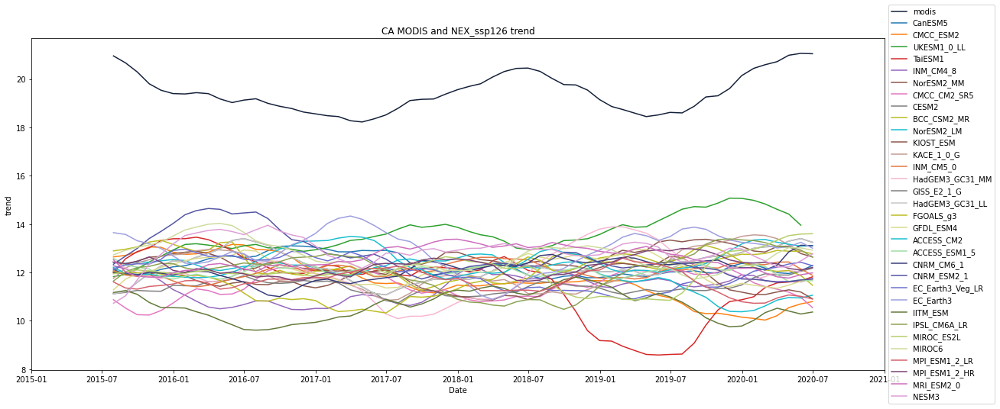

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="trend")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(CA_Monthly_deco.trend, color='#142039', label='modis')

ax.plot(CA_ssp126_CanESM5_Monthly_deco.trend, color='#1f77b4', label='CanESM5')
ax.plot(CA_ssp126_CMCC_ESM2_Monthly_deco.trend, color='#ff7f0e', label='CMCC_ESM2')
ax.plot(CA_ssp126_UKESM1_0_LL_Monthly_deco.trend, color='#2ca02c', label='UKESM1_0_LL')
ax.plot(CA_ssp126_TaiESM1_Monthly_deco.trend, color='#d62728', label='TaiESM1')
ax.plot(CA_ssp126_INM_CM4_8_Monthly_deco.trend, color='#9467bd', label='INM_CM4_8')
ax.plot(CA_ssp126_NorESM2_MM_Monthly_deco.trend, color='#8c564b', label='NorESM2_MM')
ax.plot(CA_ssp126_CMCC_CM2_SR5_Monthly_deco.trend, color='#e377c2', label='CMCC_CM2_SR5')
ax.plot(CA_ssp126_CESM2_Monthly_deco.trend, color='#7f7f7f', label='CESM2')
ax.plot(CA_ssp126_BCC_CSM2_MR_Monthly_deco.trend, color='#bcbd22', label='BCC_CSM2_MR')
ax.plot(CA_ssp126_NorESM2_LM_Monthly_deco.trend, color='#17becf', label='NorESM2_LM')
ax.plot(CA_ssp126_KIOST_ESM_Monthly_deco.trend, color='#8c564b', label='KIOST_ESM')
ax.plot(CA_ssp126_KACE_1_0_G_Monthly_deco.trend, color='#c49c94', label='KACE_1_0_G')
ax.plot(CA_ssp126_INM_CM5_0_Monthly_deco.trend, color='#e37742', label='INM_CM5_0')
ax.plot(CA_ssp126_HadGEM3_GC31_MM_Monthly_deco.trend, color='#f7b6d2', label='HadGEM3_GC31_MM')
ax.plot(CA_ssp126_GISS_E2_1_G_Monthly_deco.trend, color='#7f7f7f', label='GISS_E2_1_G')
ax.plot(CA_ssp126_HadGEM3_GC31_LL_Monthly_deco.trend, color='#c7c7c7', label='HadGEM3_GC31_LL')
ax.plot(CA_ssp126_FGOALS_g3_Monthly_deco.trend, color='#bcbd22', label='FGOALS_g3')
ax.plot(CA_ssp126_GFDL_ESM4_Monthly_deco.trend, color='#dbdb8d', label='GFDL_ESM4')

ax.plot(CA_ssp126_ACCESS_CM2_Monthly_deco.trend, color='#17becf', label='ACCESS_CM2')
ax.plot(CA_ssp126_ACCESS_ESM1_5_Monthly_deco.trend, color='#9edea5', label='ACCESS_ESM1_5')
ax.plot(CA_ssp126_CNRM_CM6_1_Monthly_deco.trend, color='#393b79', label='CNRM_CM6_1')
ax.plot(CA_ssp126_CNRM_ESM2_1_Monthly_deco.trend, color='#5254a3', label='CNRM_ESM2_1')
ax.plot(CA_ssp126_EC_Earth3_Veg_LR_Monthly_deco.trend, color='#6b6ecf', label='EC_Earth3_Veg_LR')
ax.plot(CA_ssp126_EC_Earth3_Monthly_deco.trend, color='#9c9ede', label='EC_Earth3')
ax.plot(CA_ssp126_IITM_ESM_Monthly_deco.trend, color='#637939', label='IITM_ESM')
ax.plot(CA_ssp126_IPSL_CM6A_LR_Monthly_deco.trend, color='#8ca252', label='IPSL_CM6A_LR')
ax.plot(CA_ssp126_MIROC_ES2L_Monthly_deco.trend, color='#b5cf6b', label='MIROC_ES2L')
ax.plot(CA_ssp126_MIROC6_Monthly_deco.trend, color='#cedb9c', label='MIROC6')

ax.plot(CA_ssp126_MPI_ESM1_2_LR_Monthly_deco.trend, color='#d6616b', label='MPI_ESM1_2_LR')
ax.plot(CA_ssp126_MPI_ESM1_2_HR_Monthly_deco.trend, color='#7b4173', label='MPI_ESM1_2_HR')
ax.plot(CA_ssp126_MRI_ESM2_0_Monthly_deco.trend, color='#ce6dbd', label='MRI_ESM2_0')
ax.plot(CA_ssp126_NESM3_Monthly_deco.trend, color='#de9ed6', label='NESM3')



ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.title('CA MODIS and NEX_ssp126 trend')
plt.show()